In [263]:
import sys
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import matplotlib as mpl
import glob

from astropy.modeling import models, fitting
from astropy.io import fits
import astropy.constants as c
import astropy.units as u
G = (c.G.to('km2 s-2 pc Msun-1'))
bG = G*0.2
print (1/bG.value)

import scipy
from scipy.optimize import curve_fit
from scipy.odr import Model, Data, ODR, RealData
from scipy.stats import gaussian_kde
from scipy.stats import norm
import scipy.stats as stats
from scipy import optimize

from lmfit.models import GaussianModel
from scipy.stats import sem

sys.path.append('/home/choiw27/sources/linmix')
import linmix.linmix

np.set_printoptions(threshold=np.inf)

1162.5427056767876


# Data load

In [224]:
# Data load # Please do some modifications for your own 

hi=4.5
low=2.0
conv=0.65
conv = "%.2f" % conv
#output_ngc613_sub.fits_hi4.5_lo2.0_conv0.65
data = 'NGC613_gmc_table_clfriendtoo_new_hi' + str(hi) +'_low' + str(low) + '_conv' + str(conv) +'.csv'
folder = 'output_ngc613_contsub_sub.fits_hi' + str(hi) +'_lo' + str(low) + '_conv' + str(conv) #+ '_test'
#output_ngc613_sub.fits_hi4.5_lo2.0_conv0.65
data_name = data
data = pd.read_csv('/home/choiw27/work/cprops/0613/'+folder +'/'+data_name)

In [225]:
print (data.head())

data.columns = data.columns.str.strip()
print (data.columns)

    ;ID      RA(2000)     Dec(2000)     Vlsr        R      d_R     vrms  \
0    ;        [h:m:s]       [d:m:s]   [km/s]     [pc]     [pc]   [km/s]   
1     1    1:34:18.49  -29:25:08.16   1267.1    44.41     3.54    11.44   
2     2    1:34:18.45  -29:25:07.07   1282.3     0.00     0.00     5.87   
3     3    1:34:18.47  -29:25:06.99   1293.4    38.21     2.34    12.11   
4     4    1:34:18.51  -29:25:08.43   1310.5    55.94     1.57    20.15   

    d_vrms      vturb    d_vturb          L        d_L       Mlum     d_Mlum  \
0   [km/s]     [km/s]     [km/s]    [10^4*]    [10^4*]    [10^5*]    [10^5*]   
1     1.01       9.16       1.12     53.035      3.525     23.335      1.551   
2     6.31       2.38       7.14     16.063     33.692      7.068     14.825   
3     0.74       8.72       0.61     93.500      3.926     41.140      1.728   
4     0.52      17.95       0.51    416.533      6.462    183.274      2.843   

      Tmax      Omega      Theta        d  
0      [K]  [km/s/pc]   

In [226]:
# check resolved clouds #

resol_id = data.iloc[1::,0][data.iloc[1::,4].astype(float)>0]
print (list(resol_id.astype(int)))

[1, 3, 4, 8, 9, 10, 12, 14, 15, 17, 19, 21, 24, 26, 27, 29, 31, 34, 35, 36, 42, 43, 45, 49, 53, 54, 56, 57, 58, 65, 69, 71, 72, 73, 74, 75, 77, 78, 80, 82, 83, 84, 85, 87, 89, 90, 91, 92, 93, 96, 97, 99, 100, 103, 105, 106, 109, 112, 114, 115, 116, 118, 119, 121, 123, 124, 125, 126, 128, 129, 130, 131, 132, 134, 135, 136, 137, 138, 139, 140, 147, 148, 151, 152, 153, 154, 155, 158, 161, 162, 165, 168, 169, 170, 171, 175, 178, 179, 181, 182, 186, 188, 189, 190, 200, 201, 210, 211, 212, 214, 222, 224, 231, 234, 238, 239, 241, 245, 249, 250, 254, 255, 262, 263, 266, 274, 278, 279, 283, 284, 285, 286, 290, 291, 293, 295, 297, 299, 307, 309, 310, 311, 314, 315, 320, 322, 324, 327, 331, 332, 335, 337, 338, 342, 344, 348, 351, 352]


In [227]:
# Make RA and Dec usable

data_part = data.iloc[1::,3::]

data_new = data_part.astype(float)

data_position_all = data.iloc[1::,1:3]

data_modi= np.append(data_position_all,data_new,axis=1)
print (data_modi[0:9])


[['  1:34:18.49' '-29:25:08.16' 1267.1 44.41 3.54 11.44 1.01 9.16 1.12
  53.035 3.525 23.335 1.551 9.5 0.13 329.8 357.0]
 ['  1:34:18.45' '-29:25:07.07' 1282.3 0.0 0.0 5.87 6.31 2.38 7.14 16.063
  33.692 7.068 14.825 11.2 0.08 303.2 305.0]
 ['  1:34:18.47' '-29:25:06.99' 1293.4 38.21 2.34 12.11 0.74 8.72 0.61
  93.5 3.926 41.14 1.728 13.2 0.16 10.7 328.0]
 ['  1:34:18.51' '-29:25:08.43' 1310.5 55.94 1.57 20.15 0.52 17.95 0.51
  416.533 6.462 183.274 2.843 17.7 0.27 264.4 385.0]
 ['  1:34:18.65' '-29:25:07.95' 1304.3 0.0 0.0 4.82 3.6 3.62 5.89 4.883
  5.776 2.149 2.541 5.6 0.01 333.9 539.0]
 ['  1:34:18.55' '-29:25:07.80' 1308.3 0.0 0.0 4.05 4.82 0.97 2.38 6.225
  12.051 2.739 5.302 7.3 0.03 283.6 420.0]
 ['  1:34:18.67' '-29:25:06.37' 1309.8 0.0 0.0 3.65 3.25 1.82 3.63 0.963
  1.032 0.424 0.454 5.0 0.3 105.8 595.0]
 ['  1:34:18.46' '-29:25:09.76' 1308.5 40.02 1.55 11.78 0.56 10.29 0.5
  181.222 5.724 79.737 2.519 19.4 0.16 64.9 412.0]
 ['  1:34:18.46' '-29:25:10.29' 1315.9 32.81 1.91 1

In [228]:

data_resol = data_modi[data_modi[:,3]>0]
print (data_resol[:,0][:].shape)
print (data_resol[:,0][0:20])#[7::])

#print (data_resol.shape)
data_unresol = data_modi[data_modi[:,3]==0]

# Cloud seperation based on the distance

inner = data_resol[data_resol[:,16] <= 150]
outer = data_resol[(data_resol[:,16] > 150)]
inner_ind = np.where(data_resol[:,16] <= 150)
outer_ind = np.where(data_resol[:,16] > 150)

print (inner_ind)
print (outer)

total = data_resol

(158,)
['  1:34:18.49' '  1:34:18.47' '  1:34:18.51' '  1:34:18.46'
 '  1:34:18.46' '  1:34:18.55' '  1:34:18.53' '  1:34:18.58'
 '  1:34:18.46' '  1:34:18.41' '  1:34:18.66' '  1:34:18.52'
 '  1:34:18.47' '  1:34:18.47' '  1:34:18.58' '  1:34:18.31'
 '  1:34:18.36' '  1:34:18.41' '  1:34:18.41' '  1:34:18.39']
(array([ 39,  51,  58,  82,  96,  99, 102, 111, 112, 121, 126]),)
[['  1:34:18.49' '-29:25:08.16' 1267.1 44.41 3.54 11.44 1.01 9.16 1.12
  53.035 3.525 23.335 1.551 9.5 0.13 329.8 357.0]
 ['  1:34:18.47' '-29:25:06.99' 1293.4 38.21 2.34 12.11 0.74 8.72 0.61
  93.5 3.926 41.14 1.728 13.2 0.16 10.7 328.0]
 ['  1:34:18.51' '-29:25:08.43' 1310.5 55.94 1.57 20.15 0.52 17.95 0.51
  416.533 6.462 183.274 2.843 17.7 0.27 264.4 385.0]
 ['  1:34:18.46' '-29:25:09.76' 1308.5 40.02 1.55 11.78 0.56 10.29 0.5
  181.222 5.724 79.737 2.519 19.4 0.16 64.9 412.0]
 ['  1:34:18.46' '-29:25:10.29' 1315.9 32.81 1.91 11.9 0.69 10.47 0.83
  70.238 3.421 30.905 1.505 11.1 0.14 55.2 451.0]
 ['  1:34:18.5

In [240]:
# This needs to be changed for each galaxy. RA ss and Dec arcsec #
# This is making RA and Dec usable again #

center_ra = 18.21
center_dec = 6.6

## Dec ranges from 24:59 ~25:?? 

## All cloud
ra_outer = outer[:,0] # h:m:s
dec_outer = outer[:,1] #d:m:s
DEC_all = []
DEC_outer=[]
RA_outer =[]
RA_all = []
theta_all = []
tf = []
Omega_all = []
Dist = []
Vlsr = []

for i in range(len(data_resol[:,0])):
    decc_all = data_resol[:,1][i][7:12]
    raa_all = data_resol[:,0][i][7:12]
    thetaa_all = data_resol[:,-2][i]
    omega_all = data_resol[:,-3][i]
    dist_all = data_resol[:,-1][i]
    vlsrr = data_resol[:,2][i]
#     if raa_all!='****':
#         #tf.append(True)
#         #print (raa_all)
    DEC_all.append(float(decc_all))
    RA_all.append(float(raa_all))
    theta_all.append(thetaa_all)
    Omega_all.append(omega_all)
    Dist.append(dist_all)
    Vlsr.append(vlsrr)

        
for i in range(len(dec_outer)):
    decc_outer = dec_outer[i][8:12]
    raa_outer = ra_outer[i][7:12]
    #print (raa_all)
    #print (decc_all)

    if raa_outer!='****':
        tf.append(True)
        
        DEC_outer.append(float(decc_outer))
        RA_outer.append(float(raa_outer))
    else:
        print ('?')
        tf.append(False)
        #print (i)

print (DEC_outer)

# all outer cloud list
outer = outer[tf,:]

print (outer)

dec_all = np.array(DEC_all); ra_all = np.array(RA_all); theta = np.array(theta_all); dist = np.array(Dist); omega = np.array(Omega_all); vlsr = np.array(Vlsr)
dec_outer = np.array(DEC_outer); ra_outer = np.array(RA_outer)#; theta = np.array(theta_all)

position_outer = np.vstack((ra_outer,dec_outer))

ra_off_new = (ra_all-center_ra)*15
dec_off_new = dec_all-center_dec
#print (dec_off_new)
dec_off_new = np.where(dec_off_new < 50, dec_off_new, dec_off_new-60) 
dec_off_new = -dec_off_new # dec changes inversely compared to the nothern galaxy

[8.16, 6.99, 8.43, 9.76, 0.29, 7.77, 5.01, 7.09, 4.66, 4.55, 7.61, 0.47, 7.51, 0.5, 8.13, 0.84, 4.45, 9.74, 8.55, 4.79, 9.87, 9.36, 0.29, 6.45, 9.24, 5.71, 4.94, 4.59, 0.21, 4.18, 4.96, 0.84, 9.5, 8.95, 4.61, 2.55, 8.09, 6.76, 5.09, 9.67, 3.54, 8.14, 3.67, 4.41, 0.49, 9.0, 5.6, 4.01, 8.73, 1.63, 3.77, 9.55, 9.37, 8.36, 8.91, 2.15, 5.59, 4.0, 8.27, 5.09, 3.98, 9.45, 2.7, 1.65, 8.81, 9.97, 4.77, 3.14, 1.22, 9.75, 5.29, 3.69, 1.45, 0.61, 5.6, 1.88, 3.65, 0.81, 0.27, 4.59, 1.83, 1.36, 8.01, 3.1, 4.85, 0.6, 9.35, 9.97, 9.68, 8.95, 3.12, 3.6, 1.75, 8.52, 7.56, 9.53, 4.55, 7.0, 4.09, 7.53, 3.25, 7.4, 3.42, 5.86, 5.97, 3.68, 3.88, 7.9, 4.07, 7.21, 4.3, 6.48, 3.07, 2.53, 7.4, 2.09, 3.28, 1.1, 0.71, 1.82, 8.16, 4.31, 0.7, 0.99, 7.77, 7.24, 7.92, 4.53, 7.32, 2.64, 7.83, 6.97, 7.78, 1.61, 5.25, 6.21, 1.68, 1.28, 8.43, 6.72, 1.42, 6.89, 6.75, 8.05, 7.26, 8.82, 7.44]
[['  1:34:18.49' '-29:25:08.16' 1267.1 44.41 3.54 11.44 1.01 9.16 1.12
  53.035 3.525 23.335 1.551 9.5 0.13 329.8 357.0]
 ['  1:34:18.

# Cloud seperation based on the locations

If the above seperation is enough, you don't need to distinguish futher

In [26]:


### index of each region ###
# inner_ind = np.sort((np.where(dist<=180)))
# print (inner_ind)

# Region 1
ring_top1_new = np.where((ra_off_new<1.1)&(ra_off_new>-4.9)&(dec_off_new<2.7)&(dec_off_new>0.8)&(dist > 150)) # top

#print (ring_top1_new.shape)

# Region 2
ring_bot1 = np.where((ra_off_new<7)&(ra_off_new>1.6)&(dec_off_new<-0.1)&(dec_off_new>-2.4)&(dist > 150)) # bot left top
ring_bot2 = np.where((ra_off_new<=1.6)&(ra_off_new>-1.9)&(dec_off_new<-1)&(dec_off_new>-3.8)&(dist > 150)) # bot right top
ring_bot3 = np.where((ra_off_new<5)&(ra_off_new>1.6)&(dec_off_new<-2.4)&(dec_off_new>-4.7)&(dist > 150)) # bot left bottom
ring_bot4 = np.where((ra_off_new<=1.6)&(ra_off_new>0.7)&(dec_off_new<-3.8)&(dec_off_new>-4.7)&(dist > 150)) # bot right bottom

#print (ring_bot1,ring_bot2,ring_bot3,ring_bot4)

# Region 2 total
ring_ind = np.sort(np.concatenate(ring_top1_new+ring_bot1+ring_bot2+ring_bot3+ring_bot4)) ## arc total

# Region 3
arm_left1 = np.where((ra_off_new<5.3)&(ra_off_new>1.1)&(dec_off_new<2.7)&(dec_off_new>=-0.1)&(dist > 150)) # node left
arm_left2 = np.where((ra_off_new<2.8)&(ra_off_new>=-5.3)&(dec_off_new<8.0)&(dec_off_new>=2.7)&(dist > 150)) # dust lane left
arm_right1 = np.where((ra_off_new<=-1.75)&(ra_off_new>=-5.3)&(dec_off_new<0.8)&(dec_off_new>=-2.6)&(dist > 150)) # node right
arm_right2 = np.where((ra_off_new<-0.2)&(ra_off_new>=-2.4)&(dec_off_new<-3.8)&(dec_off_new>=-5.8)&(dist > 150)) # dust lane right1
arm_right3 = np.where((ra_off_new<2.8)&(ra_off_new>=-0.8)&(dec_off_new<=-5.8)&(dec_off_new>-8.0)&(dist > 150)) # dust lane right2


# Region 4
node_ind = np.sort(np.concatenate((arm_left1+arm_right1))) ## node

# Region 5
ring_node_index = np.sort(np.concatenate((ring_ind,node_ind))) ## nuclear ring (ring+node)

# Region 6
inflow_ind = np.sort(np.concatenate(arm_left2+arm_right2+arm_right3)) ## dust lane


total = data_resol
inflow = total[inflow_ind,:]
node = total[node_ind,:]
ring = total[ring_ind,:]
inner = total[inner_ind,:]; inner=inner[0,:,:]

#print (np.sort(np.concatenate((np.concatenate((np.concatenate((inflow_ind,node_ind)),ring_ind)),inner_ind[0,:]))))
#print (dec_all[[1,2]])
# print ((ra_all[[7,10,11,17,19,21,22,30,35,43]]-18.2)*15)
# #print (ra_off_new[[7,10,11,17,19,21,22,30,35,43]])
# print (dec_all[[7,10,11,17,19,21,22,30,35,43]]-6.6)
# print (total[(7,10,11,17,19,21,22,30,35,43),1])
# print (total[(7,10,11,17,19,21,22,30,35,43),-1])
#print (total.shape)
print ('dust-lane','nodes','arcs','nucleus')
print (inner.shape)
print (inflow.shape,node.shape,ring.shape,inner.shape)
print (inflow.shape[0]+node.shape[0]+ring.shape[0]+inner.shape[0])

dust-lane nodes arcs nucleus
(11, 17)
(48, 17) (51, 17) (48, 17) (11, 17)
158


# Cloud location check

/3/tmp/ipykernel_102033/4264421075.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(['7.5','5','2.5','0','-2.5','-5','-7.5'])


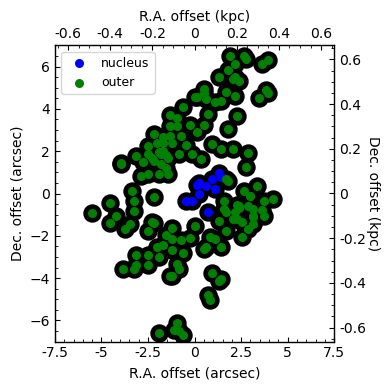

In [27]:
lines = ['k','b','g','r','orange']
ra_off_new_test = ra_off_new*0.8
dec_off_new_test = dec_off_new*0.92
fig, ax = plt.subplots(figsize=(4,4))
plt.scatter(ra_off_new_test,dec_off_new_test,c=lines[0],s=150)
plt.scatter(ra_off_new_test[inner_ind],dec_off_new_test[inner_ind],c=lines[1],s=30,label='nucleus')
plt.scatter(ra_off_new_test[outer_ind],dec_off_new_test[outer_ind],c=lines[2],s=30,label='outer')

# plt.scatter(ra_off_new_test[ring_ind],dec_off_new_test[ring_ind],c=lines[2],s=30,label='arcs')
# plt.scatter(ra_off_new_test[node_ind],dec_off_new_test[node_ind],c=lines[3],s=30,label='nodes')
# plt.scatter(ra_off_new_test[inflow_ind],dec_off_new_test[inflow_ind],c=lines[4],s=30,label='dust lanes')

plt.xlim(-7.5,7.5)
plt.ylim(-7.,7.)

ax.tick_params(which='both',direction='in',color='k',bottom='on')
ax.set_xlabel('R.A. offset (arcsec)')
ax.set_ylabel('Dec. offset (arcsec)')
ax.set_xticklabels(['7.5','5','2.5','0','-2.5','-5','-7.5'])

#ax[2].set_xticks([x-120,x-80,x-40,x,x+40,x+80,x+120])
#ax[2].set_xticklabels(['-6','-4','-2','0','2','4','6'])

ax.minorticks_on()
ax.set_xlim(ax.get_xlim()[::-1])
plt.legend(fontsize=9)

ax0 = ax.twiny()
ax0.minorticks_on()
ax0.tick_params(which='both',direction='in',color='k')#,top='on')#,right='on')

#ax0.set_xlim(ax0.get_xlim()[::-1])

#ax0.set_xlim(x1,x2)
ax0.set_xticks([0.5-0.151*3,0.5-0.151*2,0.5-0.151*1,0.5,0.5+0.151,0.5+0.151*2,0.5+0.151*3])
ax0.set_xticklabels(['-0.6','-0.4','-0.2','0','0.2','0.4','0.6'])
ax0.set_xlabel('R.A. offset (kpc)')


ax0 = ax.twiny().twinx()
#ax0.set_ylim(y1,y2)
ax0.set_yticks([0.5-0.151*3,0.5-0.151*2,0.5-0.151*1,0.5,0.5+0.151,0.5+0.151*2,0.5+0.151*3])
ax0.set_yticklabels(['-0.6','-0.4','-0.2','0','0.2','0.4','0.6'])
ax0.tick_params(which='both',direction='in',color='k')#,top='on',right='on')#,right='on')
ax0.minorticks_on()
ax0.set_xticks([])

ax0.yaxis.labelpad = 10
ax0.set_ylabel('Dec. offset (kpc)',rotation=270)

plt.tight_layout()
#plt.savefig('/home/woorak/Dropbox/앱/Overleaf/WISDOM_GMCs_ngc613/ngc613_region.png',dpi=300)

# Data prepare

In [231]:
d_rc = 2
d_Mlum = 0.1
d_rms = 1
d_rms_s = 1
d_surf = 0.1

def data_prep(data):
    Rc = data[:,3]
    scale_r = len(Rc)*d_rc

    Mlum = np.log10((data[:,11].astype(float)*(10**5)))
    scale_m = len(Mlum)*d_Mlum
    
    Lum = np.log10((data[:,9].astype(float)*(10**4)))
    
    vrms = data[:,5]
    scale_v = len(vrms)*d_rms

    vrms_s = data[:,7]
    scale_v_s = len(vrms_s)*d_rms_s

    surf = np.log10((data[:,11]*(10**5)/(np.pi*Rc**2)).astype(float))
    scale_s = len(surf)*d_surf
    
    return (Rc,Mlum,vrms,vrms_s,surf,scale_r,scale_m,scale_v,scale_v_s,scale_s,Lum)

def data_prep_err(data):

    Rc_err = data[:,4]

    Mlum_err = np.log10((data[:,12].astype(float)*(10**5)))
    
    vrms_err = data[:,6]

    vrms_s_err = data[:,8]
    
    lum_err = np.log10((data[:,10].astype(float)*(10**4)))
 
    return (Rc_err, Mlum_err, vrms_err, vrms_s_err, lum_err)

def data_prep_additional(data):
    Vlsr = data[:,2]
    Tmax = data[:,13]
    Omega = data[:,14]

    Theta = data[:,15]
    
    return (Vlsr,Omega, Theta, Tmax)

In [232]:
d_rc = 2
d_Mlum = 0.1
d_rms = 1
d_rms_s = 1
d_surf = 0.1
#print (data_resol[2::,11].astype(float)[0])

#### load all data ####

Rc_all, Mlum_all, vrms_all,vrms_s_all,surf_all,scale_all_r,scale_all_m,scale_all_v,scale_all_v_s,scale_all_s, Lum_all = data_prep(total)
Rc_inner, Mlum_inner, vrms_inner,vrms_s_inner,surf_inner,scale_inner_r,scale_inner_m,scale_inner_v,scale_inner_v_s,scale_inner_s, Lum_inner = data_prep(inner)
Rc_outer, Mlum_outer, vrms_outer,vrms_s_outer,surf_outer,scale_outer_r,scale_outer_m,scale_outer_v,scale_outer_v_s,scale_outer_s, Lum_outer = data_prep(outer)

# Rc_ring, Mlum_ring, vrms_ring,vrms_s_ring,surf_ring,scale_ring_r,scale_ring_m,scale_ring_v,scale_ring_v_s,scale_ring_s, Lum_ring = data_prep(ring)

Vlsr_all, Om_all, Theta_all, Tmax_all = data_prep_additional(total)
Vlsr_inner, Om_inner, Theta_inner, Tmax_inner = data_prep_additional(inner)
Vlsr_outer, Om_outer, Theta_outer, Tmax_outer = data_prep_additional(outer)

#Vlsr_ring, Om_ring, Theta_ring, Tmax_ring = data_prep_additional(ring)

#### load error of data ####

Rc_err_all, Mlum_err_all, vrms_err_all, vrms_s_err_all, Lum_err_all = data_prep_err(total)
Rc_err_inner, Mlum_err_inner, vrms_err_inner, vrms_s_err_inner, Lum_err_inner = data_prep_err(inner)
Rc_err_outer, Mlum_err_outer, vrms_err_outer, vrms_s_err_outer, Lum_err_outer = data_prep_err(outer)

# Rc_err_ring, Mlum_err_ring, vrms_err_ring, vrms_s_err_ring, Lum_err_ring = data_prep_err(ring)


d_rc = 0.2
d_Mlum = 0.01
d_rms = 0.05
d_rms_s = 0.1
d_surf = 0.01

Rc_x = np.arange(0, 140, d_rc)
M_x = np.arange(4,8.5,d_Mlum)
V_x = np.arange(0,25,d_rms)
Vs_x = np.arange(0,25,d_rms_s)
S_x = np.arange(1.5,4,d_surf)

Rc_p=[]
M_p=[]
V_p=[]
Vs_p = []
S_p=[]

#### Arrays contain all data & error ####

# You can make your own array #

Rc = [Rc_all,Rc_inner,Rc_outer]
Rc_err = [Rc_err_all,Rc_err_inner,Rc_err_outer]
Mlum_c = [Mlum_all,Mlum_inner,Mlum_outer]
Mlum_c_err = [Mlum_err_all,Mlum_err_inner,Mlum_err_outer]
vrms_c = [vrms_all,vrms_inner,vrms_outer]
vrms_c_err = [vrms_err_all,vrms_err_inner,vrms_err_outer]
vrms_s_c = [vrms_s_all,vrms_s_inner,vrms_s_outer]
vrms_s_c_err = [vrms_s_err_all,vrms_s_err_inner,vrms_s_err_outer]
surf_c = [surf_all,surf_inner,surf_outer]
#surf_c_err = [surf_err_all,surf_err_inner,surf_err_ring,surf_err_node,surf_err_inflow]
Lum_c = [Lum_all,Lum_inner,Lum_outer]
Lum_c_err = [Lum_err_all,Lum_err_inner,Lum_err_outer]

Om_c =[Om_all,Om_inner,Om_outer]
Theta_c = [Theta_all,Theta_inner,Theta_outer]
Tmax_c = [Tmax_all,Tmax_inner,Tmax_outer]



name = ['all','inner','outer']#,'ring_top','ring_bot']
lines = ['k','b','g']

In [233]:
def gaussian(x, mean, amplitude, standard_deviation):
    return (amplitude) * np.exp( - (x - mean)**2 / (2*standard_deviation ** 2))
    

def plot_gaussian(bin_borders,bin_heights,t,j,a,b,c):
    bin_centers = bin_borders[:-1] + np.diff(bin_borders) / 2
    
    #print (bin_centers)
    popt, _ = curve_fit(gaussian, bin_centers, bin_heights, p0=[a, b, c])
    #print (popt)
    #print (popt)
    x_interval_for_fit = np.linspace(bin_borders[0], bin_borders[-1], 10000)
    #print (x_interval_for_fit)
    #print ((gaussian(x_interval_for_fit, *popt)).max())
    #print ('mean','amplitude','std')
    #print (popt)
    axs[t].plot(x_interval_for_fit, gaussian(x_interval_for_fit, *popt), c=lines[j],lw=0.7)

    
Rc_scale = [scale_all_r, scale_inner_r, scale_outer_r]
M_scale =  [scale_all_m, scale_inner_m, scale_outer_m]
V_scale =  [scale_all_v, scale_inner_v, scale_outer_v]
Vs_scale =  [scale_all_v_s, scale_inner_v_s, scale_outer_v_s]
S_scale =  [scale_all_s, scale_inner_s, scale_outer_s]

# Figure 3 - histogram

14.46 67.38 35.435
5.459543258280413 7.698759754922314 6.58408622890016
1.98 35.83 12.33
2.022604520992969 3.812015125655422 2.9143560658299332
[[Model]]
    Model(gaussian)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 29
    # data points      = 34
    # variables        = 3
    chi-square         = 252.429978
    reduced chi-square = 8.14290252
    Akaike info crit   = 74.1622946
    Bayesian info crit = 78.7413762
    R-squared          = 0.86219301
[[Variables]]
    amplitude:  652.887385 +/- 47.4865467 (7.27%) (init = 900)
    center:     36.3928340 +/- 1.09047115 (3.00%) (init = 36.4)
    sigma:      12.9931593 +/- 1.09280207 (8.41%) (init = 12)
    fwhm:       30.5965513 +/- 2.57335219 (8.41%) == '2.3548200*sigma'
    height:     20.0462712 +/- 1.45749985 (7.27%) == '0.3989423*amplitude/max(1e-15, sigma)'
[[Correlations]] (unreported correlations are < 0.100)
    C(amplitude, sigma) = +0.5785
[[Model]]
    Model(gaussian)
[[Fit Statistics]]
    # 

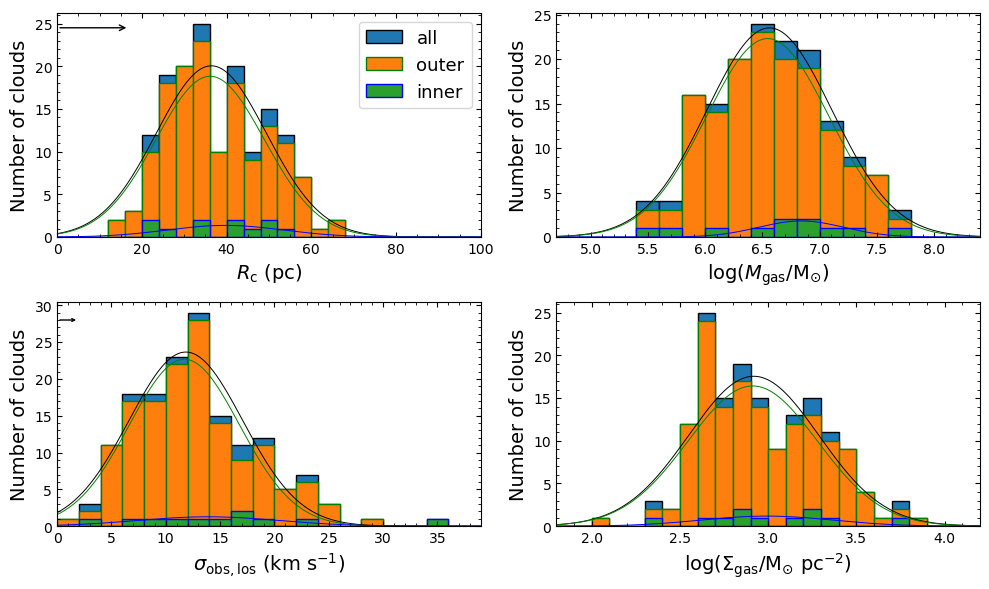

In [50]:
fig, axs = plt.subplots(2,2,figsize=(10,6)); axs = axs.ravel()

# order : Inner ring arm node (1,2,4,3)

#print (Rc[1])

for j in (0,2,1):#range(len(name)): # all to outer

    bin_heights, bin_borders,patches = axs[0].hist(Rc[j],bins=np.arange(0, 140, 4),fc='None',edgecolor=lines[j],label=name[j],lw=1.2)
    plot_gaussian(bin_borders,bin_heights,0,j,30,20,20)

    bin_centers = bin_borders[:-1] + np.diff(bin_borders) / 2
    #axs[0].plot(Rc_x,Rc_p[j]*Rc_scale[j],lines[j],label=name[j])
    if j==0:
        print (Rc[j].min(),Rc[j].max(),np.median(Rc[j]))
        print (Mlum_c[j].min(),Mlum_c[j].max(),np.median(Mlum_c[j]))
        print (vrms_c[j].min(),vrms_c[j].max(),np.median(vrms_c[j]))
        print (surf_c[j].min(),surf_c[j].max(),np.median(surf_c[j]))        
        gmodel =  GaussianModel()
        params = gmodel.guess (bin_heights,x=bin_centers)
        result = gmodel.fit(bin_heights,params, x=bin_centers)
        print (result.fit_report())
    #axs[0].plot(bin_centers,result.best_fit,'m--')


    #print (name[j],np.median(Rc[j]))
    
    bin_heights, bin_borders,patches=axs[1].hist(Mlum_c[j],bins=np.arange(4,8.5,0.2),fc='None',edgecolor=lines[j],lw=1.2)
    #axs[1].plot(M_x,M_p[j]*M_scale[j],lines[j])
    plot_gaussian(bin_borders,bin_heights,1,j,6,10,10)
    
    bin_centers = bin_borders[:-1] + np.diff(bin_borders) / 2
    #axs[0].plot(Rc_x,Rc_p[j]*Rc_scale[j],lines[j],label=name[j])
    if j==0:
        gmodel =  GaussianModel()
        params = gmodel.guess (bin_heights,x=bin_centers)
        result = gmodel.fit(bin_heights,params, x=bin_centers)
        print (result.fit_report())
    
    #print (name[j],np.median(Mlum_c[j]))
    
    bin_heights, bin_borders,patches=axs[2].hist(vrms_c[j],bins=np.arange(0,44,2),fc='None',edgecolor=lines[j],lw=1.2)
    #axs[2].plot(V_x,V_p[j]*V_scale[j],lines[j])
    plot_gaussian(bin_borders,bin_heights,2,j,5,10,5)
    
    bin_centers = bin_borders[:-1] + np.diff(bin_borders) / 2
    #axs[0].plot(Rc_x,Rc_p[j]*Rc_scale[j],lines[j],label=name[j])
    if j==0:
        gmodel =  GaussianModel()
        params = gmodel.guess (bin_heights,x=bin_centers)
        result = gmodel.fit(bin_heights,params, x=bin_centers)
        print (result.fit_report())

    
    #print (name[j],np.median(vrms_c[j]))
    
    bin_heights, bin_borders,patches=axs[3].hist(surf_c[j],bins=np.arange(1.5,4.5,0.1),fc='None',edgecolor=lines[j],lw=1.2)
    #axs[3].plot(S_x,S_p[j]*S_scale[j],lines[j])
    plot_gaussian(bin_borders,bin_heights,3,j,2,2,2)
    
    bin_centers = bin_borders[:-1] + np.diff(bin_borders) / 2
    #axs[0].plot(Rc_x,Rc_p[j]*Rc_scale[j],lines[j],label=name[j])
    if j==0:
        gmodel =  GaussianModel()
        params = gmodel.guess (bin_heights,x=bin_centers)
        result = gmodel.fit(bin_heights,params, x=bin_centers)
        print (result.fit_report())
        
  
    unitt = (r'$\sigma$$_{obs,los}$',r'$\Sigma_{gas}$')

    print (name[j], 'N clouds = ', len(Rc[j]))
    print (name[j],'Mean Mass',round(np.mean(Mlum_c[j]),4))
    print (name[j],'Mass std',round(np.std(Mlum_c[j]),4))

axs[0].minorticks_on() 
axs[1].minorticks_on()    
axs[2].minorticks_on()    
axs[3].minorticks_on()    
#axs[0].legend(loc='upper right',fontsize=13)

axs[0].annotate(text='', xy=(0,24.5), xytext=(17,24.5), arrowprops=dict(arrowstyle='<-',mutation_scale=10))
axs[2].annotate(text='', xy=(0,28), xytext=(2,28), arrowprops=dict(arrowstyle='<-',mutation_scale=5))

axs[0].set_xlim(0,100)
axs[0].set_xlabel(r'$R_\mathrm{c}$ (pc)',fontsize=14)
axs[0].set_ylabel('Number of clouds',fontsize=14)

axs[1].set_xlim(4.7,8.4)
axs[1].set_xlabel(r'log($M_{\mathrm{gas}}$/M$_{\odot}$)',fontsize=14)
axs[1].set_ylabel('Number of clouds',fontsize=14)

axs[2].set_xlim(0,39)
axs[2].set_xlabel(r'$\sigma_{\mathrm{obs,los}}$ (km s$^{-1}$)',fontsize=14)
axs[2].set_ylabel('Number of clouds',fontsize=14)   

axs[3].set_xlim(1.8,4.2)
axs[3].set_xlabel(r'log($\Sigma_{\mathrm{gas}}$/M$_{\odot}~$pc$^{-2}$)',fontsize=14)
axs[3].set_ylabel('Number of clouds',fontsize=14)

handles,labels = axs[0].get_legend_handles_labels()

# handles = [handles[0],handles[4], handles[3], handles[2],handles[1]]
# labels = [labels[0],labels[4], labels[3], labels[2],labels[1]]

axs[0].legend(handles,labels,loc='upper right',fontsize=13)

axs[0].tick_params(direction='in',which='both',top='on',right='on')
axs[1].tick_params(direction='in',which='both',top='on',right='on')  
axs[2].tick_params(direction='in',which='both',top='on',right='on')
axs[3].tick_params(direction='in',which='both',top='on',right='on')
plt.tight_layout()
#plt.savefig('/ngc613_histogram.png',dpi=300)
plt.show()

## Values of cloud properties

In [46]:
# Mean properties #


# print (Mlum_c[0].mean())
# print (Mlum_c[1].mean())
# print (Mlum_c[2].mean())
# print (Mlum_c[3].mean())
# print (Mlum_c[4].mean())
print ('Mass')
print (np.mean(10**(Mlum_c[0]))/1e6,sem(10**(Mlum_c[0]))/1e6)
print (np.mean(10**(Mlum_c[1]))/1e6,sem(10**(Mlum_c[1]))/1e6)
print (np.mean(10**(Mlum_c[2]))/1e6,sem(10**(Mlum_c[2]))/1e6)


print ('Mass')
print (np.mean(10**(Mlum_c[0]))/1e6,np.std(10**(Mlum_c[0]))/1e6)
print (np.mean(10**(Mlum_c[1]))/1e6,np.std(10**(Mlum_c[1]))/1e6)
print (np.mean(10**(Mlum_c[2]))/1e6,np.std(10**(Mlum_c[2]))/1e6)


print ('Surf')
print (np.mean(10**(surf_c[0])),sem(10**(surf_c[0])))
print (np.mean(10**(surf_c[1])),sem(10**(surf_c[1])))
print (np.mean(10**(surf_c[2])),sem(10**(surf_c[2])))

print ('Rc')
print (np.mean((Rc[0])),sem((Rc[0])))
print (np.mean((Rc[1])),sem((Rc[1])))
print (np.mean((Rc[2])),sem((Rc[2])))

print ('Rc')
print (np.mean((Rc[0])),np.std((Rc[0])))
print (np.mean((Rc[1])),np.std((Rc[1])))
print (np.mean((Rc[2])),np.std((Rc[2])))


print ('vrms')
print (np.mean((vrms_c[0])),sem((vrms_c[0])))
print (np.mean((vrms_c[1])),sem((vrms_c[1])))
print (np.mean((vrms_c[2])),sem((vrms_c[2])))



all
nucleus
outer
Mass
7.103821518987342 0.7336235519591428
9.28088181818182 3.452228460332627
6.940912244897959 0.747239590253795
Mass
7.103821518987342 9.192276758795746
9.28088181818182 10.916904937907345
6.940912244897959 9.028930322326577
Surf
1252.4343469049509 88.25667740637292
1492.3098397044682 420.615250844814
1234.484480096824 89.80215112223287
Rc
37.800316455696205 0.9248687829899458
38.27636363636364 3.446353348825201
37.764693877551025 0.9631507287585375
Rc
37.800316455696205 11.588572635257572
38.27636363636364 10.898326204036414
37.764693877551025 11.637794535090523
vrms
12.826202531645569 0.4465021013189767
15.369090909090907 2.6397973250526965
12.63591836734694 0.4372057259992581


In [110]:
print (surf_c[0].mean())
print (surf_c[1].mean())
print (surf_c[2].mean())
print (surf_c[3].mean())
print (surf_c[4].mean())

print (np.mean(10**(surf_c[0])))
print (np.mean(10**(surf_c[1])))
print (np.mean(10**(surf_c[2])))
print (np.mean(10**(surf_c[3])))
print (np.mean(10**(surf_c[4])))


print (np.log10(np.mean(10**(surf_c[0]))))
print (np.log10(np.mean(10**(surf_c[1]))))
print (np.log10(np.mean(10**(surf_c[2]))))
print (np.log10(np.mean(10**(surf_c[3]))))
print (np.log10(np.mean(10**(surf_c[4]))))

2.964802946550556
2.9539524202797973
3.0763193196432113
2.978674601566616
2.8250725776115604
1252.434346904951
1287.3112493342214
1627.7825951770567
1293.2440001547207
778.7543749550763
3.0977549692504915
3.109683564406868
3.211596400541005
3.111680472230363
2.8914004994919593


# Figure 4 - cumulative mass function

In [28]:
# Mlum_all = data_resol['Mlum']*(10**5)
# Mlum_inner = inner['Mlum']*(10**5)
# Mlum_inter = inter['Mlum']*(10**5)
# Mlum_outer = outer['Mlum']*(10**5)

In [54]:
def histedges_equalN(x, nbin):
    npt = len(x)
    #print (npt)
    #print (np.sort(x))
    return np.interp(np.linspace(0, npt, nbin +1), np.arange(npt),np.sort(x))

(10,)


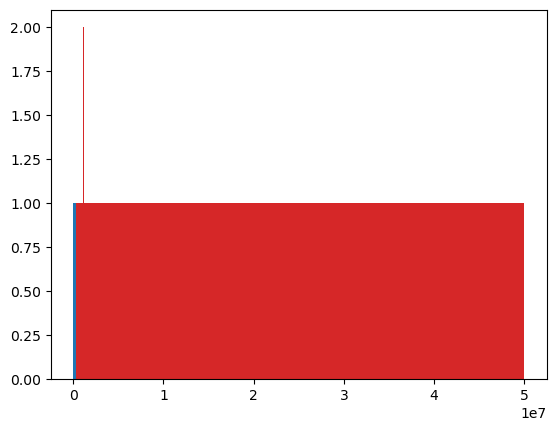

In [55]:
Mlum_total = (data_modi[:,11]*1e5).astype(float)

Mlum_total = Mlum_total[Mlum_total>0]
#print (Mlum_total)
n_tot, bins, patches = plt.hist(Mlum_total,histedges_equalN(Mlum_total,len(Mlum_total)))

Mlum_all = 10**Mlum_c[0]
#print (np.sort(Mlum_all))
Mlum_inner = 10**Mlum_c[1]
Mlum_outer = 10**Mlum_c[2]

print (Mlum_all[Mlum_all > 2**(1/(-0.765356274))*Mlum_all.max()].shape)
n_all, bins, patches = plt.hist(Mlum_all,histedges_equalN(Mlum_all,len(Mlum_all)))
n_inner, bins, patches = plt.hist(Mlum_inner,histedges_equalN(Mlum_inner,len(Mlum_inner)))
n_outer, bins, patches = plt.hist(Mlum_outer,histedges_equalN(Mlum_outer,len(Mlum_outer)))
#plt.close()
#print np.cumsum(n)

In [57]:
dM = 20 # Msun pc-2
beam_area = 600 # pc2
print ('completeness_limit',Mlum_all.min()+10*dM*beam_area)
comp_lim = Mlum_all.min()+10*dM*beam_area

def powerlaw_func_for_PDF(x,a,b):
    return b*x**a
#return a * np.power(x, b)
#print ()
over_complim0 = np.sort(Mlum_total)[::-1] > comp_lim
over_complim1 = np.sort(Mlum_inner)[::-1] > comp_lim
over_complim2 = np.sort(Mlum_outer)[::-1] > comp_lim

#print (n_all)
#print (np.sort(Mlum_all))
#rint (np.cumsum(n_all))
#print (np.sort(Mlum_all)[::-1])
#print (np.cumsum(n_all[::-1]))
#print (np.sort(Mlum_all)[::-1])
params0, params_cov0 = optimize.curve_fit(powerlaw_func_for_PDF,(np.sort(Mlum_total)[::-1])[over_complim0],(np.cumsum(n_tot[::-1]))[over_complim0])#,p0=[3,0.2])
params1, params_cov1 = optimize.curve_fit(powerlaw_func_for_PDF,(np.sort(Mlum_inner)[::-1])[over_complim1],(np.cumsum(n_inner[::-1]))[over_complim1],p0=[-1,1e5])
params2, params_cov2 = optimize.curve_fit(powerlaw_func_for_PDF,(np.sort(Mlum_outer)[::-1])[over_complim2],(np.cumsum(n_outer[::-1]))[over_complim2])#,p0=[3,0.2])

print (params0)
print (params1)
print (params2)

completeness_limit 408100.0000000001
[-4.76653160e-01  1.02559692e+05]
[-3.40346861e-01  1.02313432e+03]
[-4.84805658e-01  1.01624619e+05]


/3/tmp/ipykernel_102033/888766408.py:7: RuntimeWarning: overflow encountered in power
  return b*x**a


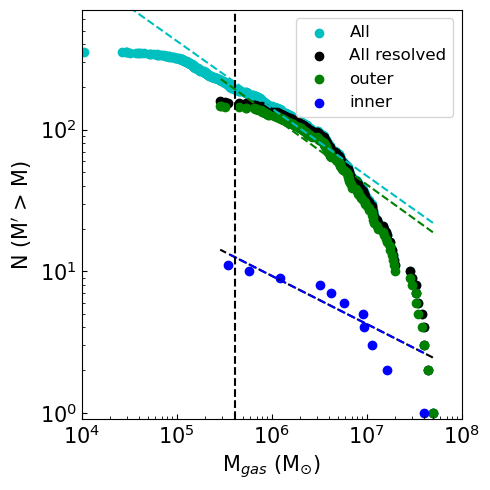

In [60]:
#### Figure 4 plot #####
#print (dM*beam_area)
plt.figure(figsize=(5,5))

xerr = 0.434*(10**Mlum_c_err[0]/10**Mlum_c[0])
#print (xerr)
plt.plot(np.sort(Mlum_total)[::-1],params0[1]*np.sort(Mlum_total)[::-1]**params0[0],c='c',ls='--')
plt.plot(np.sort(Mlum_all)[::-1],params1[1]*np.sort(Mlum_all)[::-1]**params1[0],lines[0],ls='--')
plt.plot(np.sort(Mlum_inner)[::-1],params1[1]*np.sort(Mlum_inner)[::-1]**params1[0],lines[1],ls='--')
plt.plot(np.sort(Mlum_outer)[::-1],params2[1]*np.sort(Mlum_outer)[::-1]**params2[0],lines[2],ls='--')


#plt.errorbar(np.sort(Mlum_all)[::-1],np.cumsum(n_all[::-1]),xerr=(10**Mlum_c[0])/2,capsize=0,mec='none',mfc='k', ls='none', color='black',elinewidth=1,fmt='o',alpha=0.2)
# print (n_tot)
# print (np.cumsum(n_tot[::-1]))
plt.scatter(np.sort(Mlum_total)[::-1],np.cumsum(n_tot[::-1]),c='c',label='All')
plt.scatter(np.sort(Mlum_all)[::-1],np.cumsum(n_all[::-1]),c=lines[0],label='All resolved')
plt.scatter(np.sort(Mlum_outer)[::-1],np.cumsum(n_outer[::-1]),c=lines[2],label=name[2])
plt.scatter(np.sort(Mlum_inner)[::-1],np.cumsum(n_inner[::-1]),c=lines[1],label=name[1])

#plt.scatter(np.sort(Mlum_arm)[::-1],np.cumsum(n_arm),c='r',label='arm')

plt.axvline(Mlum_all.min()+10*dM*beam_area,c='k',ls='--') # Mass completness
#plt.axhline(18)
plt.xscale('log')
plt.yscale('log')
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlim(1e4,1e8)
plt.ylim(0.9,700)
plt.xlabel(r'M$_{gas}$ (M$_{\odot}$)',fontsize=15)
plt.ylabel(r'N (M$^{\prime}$ > M)',fontsize=15)
plt.tick_params(which='both',direction='in')
plt.legend(loc='upper right',fontsize=12)
plt.tight_layout()
#plt.savefig('fig_mass_spectrum_new_%s.png' % folder,dpi=200)
plt.show()

# fitting and reference lines are needed

# Figure 5 - cloud kinematics

In [136]:
# from IPython.display import Image

# Image(filename='/media/woorak/data/cprops/output_4429/output/NGC4429_cloud_kinematics.jpg')

# Figure 6 - velocity map and cloud orientation

In [203]:
# Load fitted mom1 map #

#hdul = fits.open('/home/choiw27/work/cprops/5806/5806_velocitymap_test/5806_vfield_test4/NGC5806_rotation_vfield_2kms.fits')#('/media/woorak/data/cprops/output_4429/NGC4429_ROT_mom1_cube.fits')

#velmap = hdul[0].data[0]

In [234]:
def draw_line(x,y,angle,length):
    cartesianAngleRadians = (angle-270)*np.pi/180.0
    terminus_x = length * np.cos(cartesianAngleRadians)
    terminus_y = length * np.sin(cartesianAngleRadians)
    #plt.plot([x, terminus_x],[y,terminus_y],c='k')
    plt.arrow(x,y,terminus_x,terminus_y,color='k',width=0.05,head_width=0.2)
    #plt.plot([x-terminus_x/2,x+ terminus_x/2],[y-terminus_y/2,y+terminus_y/2],c='k')
  #print [x, terminus_x],[y,terminus_y]

In [235]:
hdul = fits.open('/home/choiw27/work/cprops/0613/measurements_ngc613_contsub_sub.fits_hi4.5_lo2.0_conv0.65/ngc613_contsub_sub.fits_mom1.fits')
hdul2 = fits.open('/home/choiw27/work/cprops/0613/measurements_ngc613_contsub_sub.fits_hi4.5_lo2.0_conv0.65/ngc613_contsub_sub.fits_mom0.fits')

velmap = hdul[0].data[:,:]
mom= hdul2[0].data[:,:]

from scipy.ndimage.filters import gaussian_filter
sigma=2
velmap[np.isnan(velmap)]=0
velmap = gaussian_filter(velmap, sigma)


/3/tmp/ipykernel_102033/4103831824.py:9: DeprecationWarning: Please import `gaussian_filter` from the `scipy.ndimage` namespace; the `scipy.ndimage.filters` namespace is deprecated and will be removed in SciPy 2.0.0.
  from scipy.ndimage.filters import gaussian_filter


[ 4.2   3.9   4.5   3.75  3.75  5.1   4.8   5.55  3.75  3.    6.75  4.65
  3.9   3.9   5.55  1.5   2.25  3.    3.    2.7   2.25  2.4   3.    4.05
  1.95  3.45  2.55  2.1   1.05  3.    3.3   1.35  1.35  1.35  1.8   1.5
  2.7   2.55  4.8  -0.3   0.6   2.55  2.55  1.5   1.95  0.9   0.75  3.
  2.4   1.8  -0.15 -0.45  2.25 -2.55 -0.9   1.35  0.15  0.6   0.45  2.25
  1.35 -0.15  2.1   1.95 -0.75  1.05 -0.3  -1.2  -4.65  1.65  1.5  -0.75
 -5.1   1.8   1.95 -0.75 -1.8   1.65 -1.5   0.75 -3.15 -2.4   0.    0.9
 -1.95 -2.25 -1.8   0.15 -0.6  -2.85 -1.95 -2.85 -3.6  -1.5   1.05  1.2
 -0.45 -0.9  -2.25 -1.05 -2.25 -3.45 -1.35  0.   -2.1   0.45 -2.85  1.05
 -2.1  -0.3  -2.25 -1.8  -0.9  -2.4   0.9   0.6  -2.7  -1.35 -3.   -1.95
 -3.45 -1.5  -0.75 -1.05 -4.05 -1.2  -1.95 -2.4  -1.8  -2.7  -1.05 -4.05
 -2.7  -1.35 -1.95 -4.05 -3.15 -3.   -3.75 -3.15 -3.   -4.05 -4.8  -4.8
 -2.85 -3.6  -4.35 -4.5  -4.95 -3.75 -3.9  -5.1  -5.4  -3.9  -3.3  -3.75
 -3.3  -4.65]
[-1.56 -0.39 -1.83 -3.16 -3.69 -1.17  1.59 

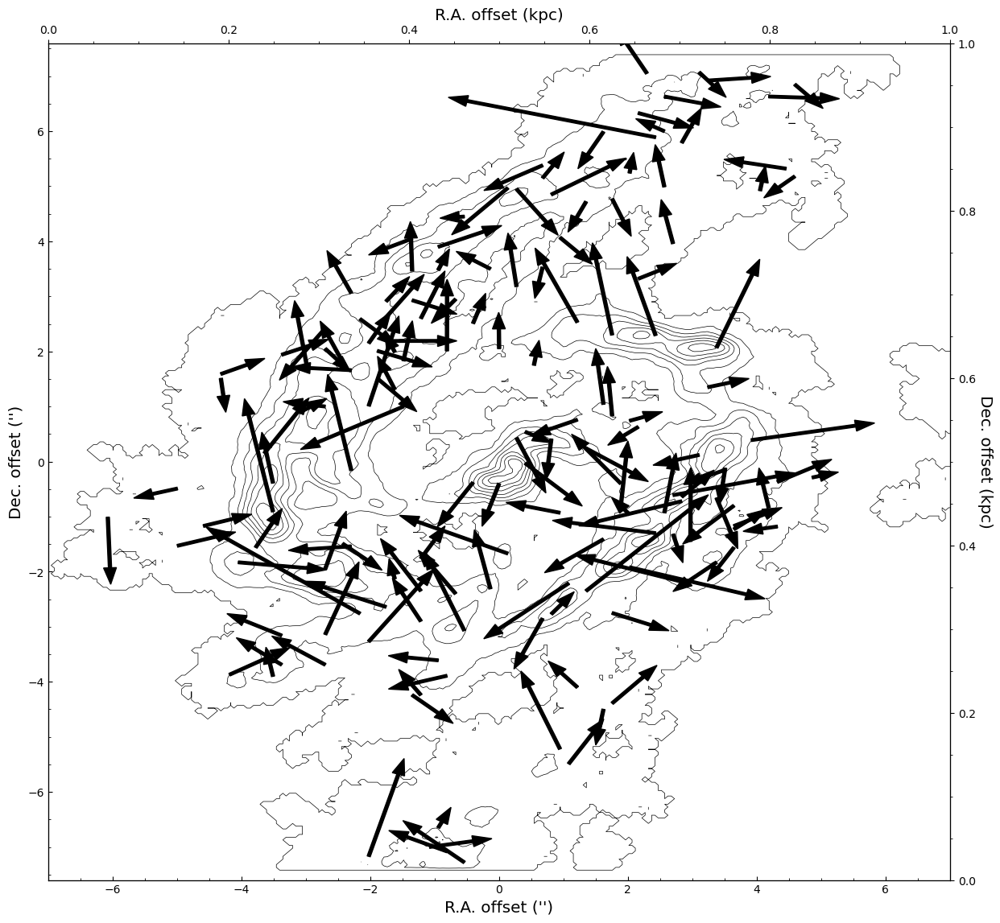

In [242]:
xc,yc = 150,150
#print (ra_new.shape)
#print (len(Omega_all))
fig,ax = plt.subplots(1,1,figsize=(8*2,6.5*2))
#ax=plt.figure(figsize=(5,7.5))
ratio  = 0.8
extent = [-9.2*ratio,9.8*ratio,-9.4*ratio,9.3*ratio]

##################
### Plotting ###
##################

#plt.imshow(velmap,origin='lower',cmap='RdYlBu_r',vmin=1300,vmax=1650,extent=extent,interpolation='bicubic',alpha=0.8)
#cb=plt.colorbar(fraction=0.0865,pad=0.17)
cb.ax.set_ylabel('Velocity (km s$^{-1}$)',rotation=270,verticalalignment='baseline',fontsize='x-large')
#plt.contour(velmap,levels=np.arange(1300,1660,20),colors='g',extent=extent,linewidths=0.7)
plt.contour(mom,colors='k',extent=extent,linewidths=0.5)
for i in range(0,len(ra_off_new)):
  draw_line(-ra_off_new[i]*0.9,dec_off_new[i],Theta_all[i],Om_all[i]*4) # we may not need to multiply 0.9 for ra off set


##################
### Axis labels ###
##################

plt.xlim(-7,7)
plt.ylim(-7.6,7.6)
# plt.xticks([-4,-2,0,2,4],['4','2','0','-2','-4'],fontsize='x-large')
# plt.yticks([-9,-6,-3,0,3,6,9],['-9','-6','-3','0','3','6','9'],fontsize='x-large')
# plt.yticks([-8,-6,-4,-2,0,2,4,6,8,10],['-8','-6','-4','-2','0','2','4','6','8','10'],fontsize='x-large')
#plt.xlabel(r'$\Delta \alpha$ (arcsec)')
plt.xlabel('R.A. offset (\'\')',fontsize='x-large')
#plt.ylabel(r'$\Delta \delta$ (arcsec)')
plt.ylabel('Dec. offset (\'\')',fontsize='x-large')
#plt.grid('True')

plt.minorticks_on()    
#axs[0].legend(loc='upper right',fontsize=13)
plt.tick_params(direction='in',which='both')


ax1 = ax.twinx()
ax2 = ax1.twiny()

#ax41.set_xticks([x-77.7,x-38.8,x,x+38.8,x+77.7])
#ax41.set_xticklabels(['-0.4','-0.2','0','0.2','0.4'],fontsize='x-large')
#ax2.imshow(velmap,origin='lower',alpha=0.0)
ax1.set_ylabel('Dec. offset (kpc)',fontsize='x-large',rotation=270,labelpad=15)
# ax1.set_yticks([0.051,0.19,0.32,0.455,0.59,0.725,0.86])
# ax1.set_yticklabels(['-9','-6','-3','0','3','6','9'],fontsize='x-large')

# ax1.set_yticks([x-77.7,x-38.8,x,x+38.8,x+77.7])
# ax1.set_yticklabels(['-0.4','-0.2','0','0.2','0.4'],fontsize='x-large')
#ax1.set_yticks([0.0,0.15,0.3,0.45,0.6,0.75,0.9])
#ax1.set_yticklabels(['-6','-4','2','0','2','4','6'],fontsize='x-large')
#ax1.set_yticks([0,0.156,0.312,0.455,0.601,0.755,0.913],['-9','-6','-3','0','3','6','9'],fontsize='x-large')

#ax2.set_xticks([0.1,0.3,0.5,0.7,0.9])
#ax2.set_xticklabels(['-4','-2','0','2','4'],fontsize='x-large')
ax2.set_xlabel('R.A. offset (kpc)',fontsize='x-large')
# #ax41.tick_params(axis='y', which)
ax2.minorticks_on()
#ax1.tick_params(which='both',direction='in',color='k')
from matplotlib.ticker import AutoMinorLocator


# minor_locator = AutoMinorLocator(4)
# ax1.yaxis.set_minor_locator(minor_locator)
#ax1.set_yticks([0.05,0.15,0.25,0.35,0.45,0.55,0.65,0.75,0.85,0.95],['-8','-6','-4','-2','0','2','4','6','8','10'],fontsize='x-large')
minor_locator = AutoMinorLocator(4)
ax1.yaxis.set_minor_locator(minor_locator)
#ax1.minorticks_on()


plt.subplots_adjust(left=0.15,top=0.9,bottom=0.1,right=0.85)#,wspace=0.25)
#plt.subplots_adjust()
#plt.savefig('mom1_with_orientation_final_weighting_contour.png',dpi=300)
plt.show()
#plt.close()

## Another method

0.4 29.0


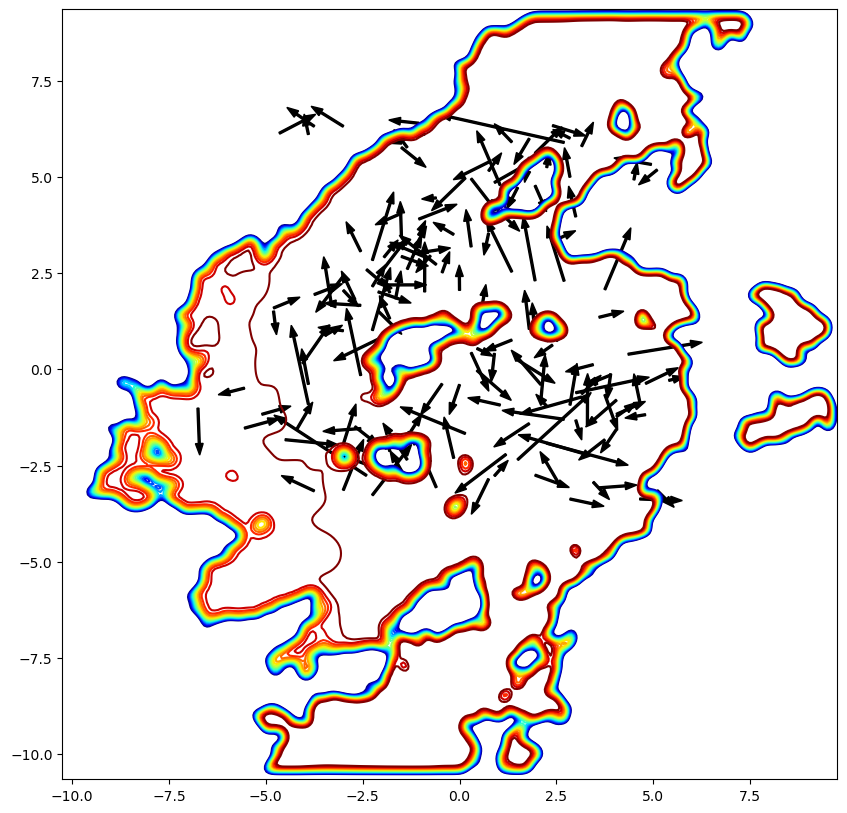

In [223]:
X, Y = np.mgrid[0:1:301j, 0:1:301j]

print (ra_c,dec_c)
#print (theta_all)

# ra_c = 18.2
# dec_c = 6.6
#print ((X-y_c)*24)
#ra_new = (ra_all-ra_c)*15
#dec_new = dec_all-dec_c

fig,ax = plt.subplots(1,1,figsize=(10,10))


plt.contour((Y-x_c)*20,(X-y_c)*20,(velmap-1000),levels=np.arange(-400,400,50),cmap='jet',origin='lower')

for i in range(0,len(ra_off_new)):
  #print (x[i],y[i],angles[i])
  draw_line(-ra_off_new[i],dec_off_new[i],theta[i],omega[i]*4)
  #print (dec_new[i])  

# Figure 7 - Angular momentum comparison

In [154]:
# Image(filename='/media/woorak/data/cprops/5806/output_5806.CO21_1_0.2_concat_rob0.5_sub.fits_hi2.3_lo1.3_conv0.45_test/NGC5806_angmom_comparison.png')

angle = data_resol['Theta'] # We need to know the position of each cloud (know the center and subtract that)
- For Figur 5 & 7, I need to calculate the model angular velocity and model position angle

- Equation 13 and 14 in the Lijie's paper ( $v(x,y)=ax+by+c$, $\omega = \sqrt(a^2+b^2)$, $\phi_{rot} = tan^{-1}(b/a)+90$ )

- For this calculation, I need to use code lts_planefit which is provided by Michele Cappellari (ltsfit in python version, there is a example, lts_planefit_example.py)

- But, this example requires lots of parameters. So I need to check one-by-one and think about which parameter should I use from NGC 4429 gmc file.

# Figure 8, Larson's relation with $\sigma_{obs,los}$

M$_{vir}$ = $\sigma^2$R/b$_s$G

b$_s$ = 1/5 


In [379]:
def powerlaw_linear_func(x,a,b):
    return a*x+b

def powerlaw_func(x,a,b):
    return b*x**a

def powerlaw_func(x,a,b):
    return b*x**a

def linear_func(x,a,b):
    return a*x+b

def power_law(x, a, b):
    return a*np.power(x, b)

In [380]:
pars, cov = curve_fit(f=power_law, xdata=Rc_all, ydata=vrms_all, p0=[0, 0], bounds=(-np.inf, np.inf))
print (pars)
params1, params_cov1 = optimize.curve_fit(powerlaw_func,Rc_all,vrms_all)#,p0=[3,0.2])

params8, params_cov8 = optimize.curve_fit(linear_func,np.log10(Rc_all.astype('float')),np.log10(vrms_all.astype('float')))#,p0=[3,0.2])


Mvir=1/bG.value*Rc_all*vrms_all**2

params2, params_cov2 = optimize.curve_fit(linear_func,(Mlum_all),np.log10(Mvir.astype('float')))#,p0=[1.2,1])

print ('sigma vs R fitting parameter',params1)
print (np.sqrt(np.diag(params_cov1)))
print ('params2', params2)
print (np.sqrt(np.diag(params_cov2)))

params5, params_cov5 = optimize.curve_fit(linear_func,np.log10(Rc_all.astype('float')),np.log10(vrms_all.astype('float')))#,p0=[3,0.2])

print (params5)

[0.61012663 0.84013413]
sigma vs R fitting parameter [0.84013416 0.61012656]
[0.09661719 0.22093775]
params2 [0.93775416 0.58335269]
[0.03164418 0.20862492]
[ 0.87819895 -0.30309571]


## Fitting test

In [247]:
linear_coeff, params_cov1 = optimize.curve_fit(powerlaw_func,Rc_all,vrms_all)
log_coeff, params_cov8 = optimize.curve_fit(powerlaw_linear_func,np.log10(Rc_all.astype('float')),np.log10(vrms_all.astype('float')))
linear_coeff2, params_cov1 = optimize.curve_fit(powerlaw_func,Rc_all[Rc_all<90],vrms_all[Rc_all<90])
log_coeff2, params_cov8 = optimize.curve_fit(powerlaw_linear_func,np.log10((Rc_all[Rc_all<90]).astype('float')),np.log10((vrms_all[Rc_all<90]).astype('float')))

print (linear_coeff)
print (linear_coeff2)
print (log_coeff)
print (log_coeff2)

[0.84013416 0.61012656]
[0.84013416 0.61012656]
[ 0.87819895 -0.30309571]
[ 0.87819895 -0.30309571]


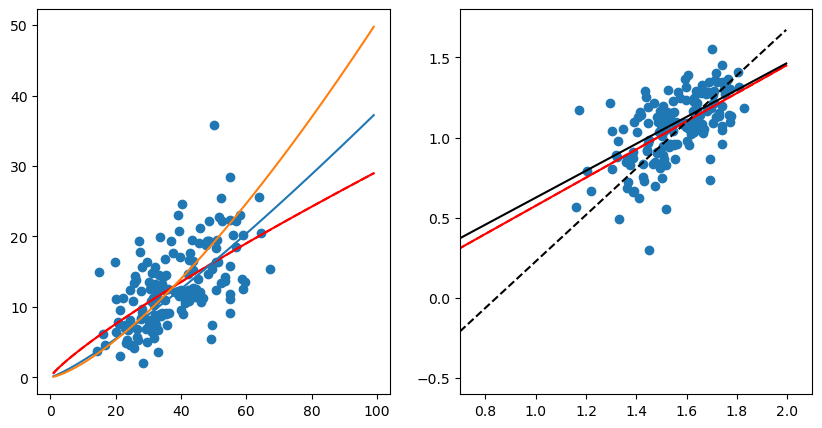

In [249]:
fig,ax = plt.subplots(1,2,figsize=(10,5))
ax = ax.ravel()
xxxx = np.arange(1,100)
ax[0].scatter(Rc_all,vrms_all)
ax[0].plot(xxxx,linear_coeff[1]*xxxx**linear_coeff[0],'r')
ax[0].plot(xxxx,linear_coeff2[1]*xxxx**linear_coeff2[0],'r--')

#ax[0].plot(xxxx,0.005*xxxx**2)
ax[0].plot(xxxx,0.15*xxxx**1.2)
ax[0].plot(xxxx,0.08*xxxx**1.4)

ax[1].scatter(np.log10(Rc_all.astype('float')),np.log10(vrms_all.astype('float')))
ax[1].plot(np.log10(xxxx),log_coeff[1]+log_coeff[0]*np.log10(xxxx),'r')
ax[1].plot(np.log10(xxxx),log_coeff2[1]+log_coeff2[0]*np.log10(xxxx),'r--')



ax[1].plot(np.log10(xxxx),np.log10(linear_coeff[1]*xxxx**linear_coeff[0]),'k')
ax[1].plot(np.log10(xxxx),np.log10(0.06*xxxx**1.45),'k--')
ax[1].set_xlim(0.7,2.1)
ax[1].set_ylim(-0.6,1.8)
plt.show()
plt.close()

if distribution of uncertainties has a gaussian shape in log scale, then it is better to fit the data points in log scale with linear function 


(array([15., 45., 35., 21.,  9.,  6.,  9.,  6.,  8.,  4.]),
 array([-0.39794001, -0.25648445, -0.1150289 ,  0.02642666,  0.16788221,
         0.30933777,  0.45079333,  0.59224888,  0.73370444,  0.87515999,
         1.01661555]),
 <BarContainer object of 10 artists>)

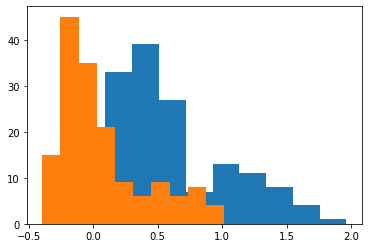

In [244]:
#print (data_resol[:,4])

#plt.scatter(data_resol[:,4],data_resol[:,4])

print ('if distribution of uncertainties has a gaussian shape in log scale, then it is better to fit the data points in log scale with linear function ')

plt.hist(np.log10(data_resol[:,4].astype('float')))
plt.hist(np.log10(data_resol[:,6].astype('float')))

## Load previous studies

In [357]:
# Load data #

com_dir = '/home/choiw27/work/cprops/data_comp/'

LMC = pd.read_excel(com_dir + 'LMC.xlsx') # From Wong 2011
M33 = pd.read_excel(com_dir + 'M33.xlsx') # From gratier 2012
M51 = pd.read_excel(com_dir + 'M51.xlsx') # From colombo 2014
MWd_h = pd.read_excel(com_dir + 'MWd_h.xlsx') # From heyer 2009
MWd_m = pd.read_excel(com_dir + 'MWd_m.xlsx') # From miville-deschenes 2019
MWd_r = pd.read_excel(com_dir + 'MWd_r.xlsx') # From rice 2016
CMZ = pd.read_excel(com_dir + 'CMZ.xlsx') # From ?
NGC4429 = pd.read_excel(com_dir + 'NGC4429_liu2021.xlsx') # Liu 2021
NGC4526 = pd.read_excel(com_dir + 'NGC4526.xlsx') # Utomo 2015
NGC5806 = pd.read_excel(com_dir + 'NGC5806.xlsx') # Choi 2023
NGC6946 = pd.read_excel(com_dir + 'NGC6946.xlsx') # DonovanMeyer 2012
PHANGS = pd.read_excel(com_dir + 'phangs.xlsx') # Rosolowsky 2021?

In [358]:
CMZ_r = (CMZ.iloc[:,6].values).astype('float')
CMZ_l = (CMZ.iloc[:,10]*4.3).astype('float') # Lco
CMZ_m = (CMZ.iloc[:,11]).astype('float') # Mvt 
CMZ_s = (CMZ.iloc[:,7]).astype('float')
#CMZ_sf = 

LMC_r = LMC.iloc[:,7].values
LMC_m = LMC.iloc[:,13]*10**3 # Virial Mass 10^3 Msun
LMC_l = LMC.iloc[:,11]*4.3*10**2 # CO luminosity, 100K km/.s pc2
LMC_s = LMC.iloc[:,9].values
#LMC_sf = 

M33_r = M33.iloc[:,5].values
M33_m = M33.iloc[:,12].values
M33_s = M33.iloc[:,8].values 
m33_nonint = np.where(M33_r!='--')
M33_r = M33_r[m33_nonint]
M33_m = M33_m[m33_nonint]
M33_s = M33_s[m33_nonint]/2.235
#M33_sf = 

M51_r = M51.iloc[:,4].values
M51_m = M51.iloc[:,10].values*10**5 # virial mass 10^5 Msun
M51_l = M51.iloc[:,8].values #CO luminosity, 10^5 K Km/s pc2
M51_s = M51.iloc[:,6].values
#M51_sf = 

MWdh_r = MWd_h.iloc[:,7].values # or 11
MWdh_m = MWd_h.iloc[:,9].values # or 13 # Viral Mass, Msun
MWdh_l = MWd_h.iloc[:,8].values*4.3 # or 12, CO luminosity K km/s pc2
MWdh_s = MWd_h.iloc[:,6].values # or 10
#MWdh_sf = 

# MWdm_r = MWd_m.iloc[:,7].values
# MWdm_m = MWd_m.iloc[:,12].values
# MWdm_s = MWd_m.iloc[:,8].values
#MWdm_sf = 

MWdr_r = MWd_r.iloc[:,7].values
MWdr_m = MWd_r.iloc[:,8].values
MWdr_s = MWd_r.iloc[:,4].values
#MWdr_sf = 

NGC4429_r = NGC4429.iloc[:,4].values
NGC4429_m = NGC4429.iloc[:,12].values # 10^5
NGC4429_s = NGC4429.iloc[:,6].values
#NGC4429_sf = 

NGC4526_r = NGC4526.iloc[:,2].values
NGC4526_m = NGC4526.iloc[:,8].values # 10^6
NGC4526_s = NGC4526.iloc[:,4].values
#NGC4526_sf = 

NGC5806_r = (NGC5806.iloc[:,4].values)
non_nan = np.where(NGC5806_r==NGC5806_r)
NGC5806_m = (NGC5806.iloc[:,12].values) # 10^5
NGC5806_s = (NGC5806.iloc[:,6].values)

NGC5806_r = NGC5806_r[non_nan].astype('float')
NGC5806_m = NGC5806_m[non_nan].astype('float')
NGC5806_s = NGC5806_s[non_nan].astype('float')

NGC5806_m = NGC5806_m[NGC5806_r>0]*10**5
NGC5806_s = NGC5806_s[NGC5806_r>0]
NGC5806_r = NGC5806_r[NGC5806_r>0]


NGC6946_r = NGC6946.iloc[:,3].values
NGC6946_m = NGC6946.iloc[:,6].values*10**5 # 10^5, Virial Mass
NGC6946_l = NGC6946.iloc[:,5].values*4.3*10**5 # 10^5 K km/s pc2, CO luminosity
NGC6946_s = NGC6946.iloc[:,4].values
#NGC6946_sf = 

PHANGS_r = PHANGS.iloc[:,5].values
PHANGS_m = PHANGS.iloc[:,9].values
PHANGS_s = PHANGS.iloc[:,7].values
#PHANGS_sf =  

radius = [CMZ_r,LMC_r, M33_r,M51_r,MWdh_r,MWdr_r,NGC4429_r,NGC4526_r,NGC5806_r,NGC6946_r,PHANGS_r]

# vrms 모아두기
vrms = [CMZ_s,LMC_s,M33_s,M51_s,MWdh_s,MWdr_s,NGC4429_s,NGC4526_s,NGC5806_s,NGC6946_s,PHANGS_s]

g_names = ['CMZ', 'LMC','M33','M51','MWdh','MWdr','NGC4429','NGC4526','NGC5806','NGC6946','PHANGS']

In [366]:
def larson_contour(r, vrms):

    r_arr = np.asarray(r, dtype=float)
    v_arr = np.asarray(vrms, dtype=float)

    mask = np.isfinite(r_arr) & np.isfinite(v_arr) & (r_arr > 0) & (v_arr > 0)

    x = np.log10(r_arr[mask])
    y = np.log10(v_arr[mask])

    k = gaussian_kde(np.vstack([x, y]))

    xi, yi = np.mgrid[
        x.min():x.max():x.size**0.5*2j,
        y.min():y.max():y.size**0.5*2j
    ]
    
    zi = k(np.vstack([xi.flatten(), yi.flatten()]))
    zi = (zi - zi.min()) / (zi.max() - zi.min())
    zi = zi.reshape(xi.shape)
    
    return xi, yi, zi

### Load contour directly

In [360]:
# Contours for larson's relation #

MWd = pd.read_csv('MWd.csv')
MWc = pd.read_csv('MWc.csv')
NGC4526 = pd.read_csv('NGC4526.csv')
M33 = pd.read_csv('M33.csv')
M51 = pd.read_csv('M51.csv')
LMC = pd.read_csv('LMC.csv')
NGC4429 = pd.read_csv('NGC4429.csv')
NGC5806 = pd.read_csv('NGC5806.csv')
NGC613 = pd.read_csv('NGC613.csv')

In [361]:
MWd_p = pd.read_csv('MWd_p.csv')
MWc_p = pd.read_csv('MWc_p.csv')
NGC4526_p = pd.read_csv('NGC4526_p.csv')
M33_p = pd.read_csv('M33_p.csv')
M51_p = pd.read_csv('M51_p.csv')
LMC_p = pd.read_csv('LMC_p.csv')
NGC4429_p = pd.read_csv('NGC4429_p.csv')

In [362]:
def sort_xy(x, y):

    x0 = np.mean(x)
    y0 = np.mean(y)

    r = np.sqrt((x-x0)**2 + (y-y0)**2)

    angles = np.where((y-y0) > 0, np.arccos((x-x0)/r), 2*np.pi-np.arccos((x-x0)/r))

    mask = np.argsort(angles)

    x_sorted = x[mask]
    y_sorted = y[mask]

    return x_sorted, y_sorted

In [363]:
#print (NGC4526_p.iloc[:,0], NGC4526_p.iloc[:,1])
NGC613_0,NGC613_1 = sort_xy(NGC613.iloc[:,0], NGC613.iloc[:,1])
NGC5806_0,NGC5806_1 = sort_xy(NGC5806.iloc[:,0], NGC5806.iloc[:,1])
NGC4429_0,NGC4429_1 = sort_xy(NGC4429.iloc[:,0], NGC4429.iloc[:,1])

In [364]:
NGC4526_p0,NGC4526_p1 = sort_xy(NGC4526_p.iloc[:,0], NGC4526_p.iloc[:,1])
MWd_p0, MWd_p1 = sort_xy(MWd_p.iloc[:,0], MWd_p.iloc[:,1])
MWc_p0, MWc_p1 = sort_xy(MWc_p.iloc[:,0], MWc_p.iloc[:,1])
LMC_p0, LMC_p1 = sort_xy(LMC_p.iloc[:,0], LMC_p.iloc[:,1])
M51_p0, M51_p1 = sort_xy(M51_p.iloc[:,0], M51_p.iloc[:,1])
M33_p0, M33_p1 = sort_xy(M33_p.iloc[:,0], M33_p.iloc[:,1])
NGC4429_p0,NGC4429_p1 = sort_xy(NGC4429_p.iloc[:,0], NGC4429_p.iloc[:,1])

## ODR fitting

Beta: [0.04268594 1.58095568]
Beta Std Error: [0.02429769 0.148011  ]
Beta Covariance: [[ 4.20831609e-05 -2.56065905e-04]
 [-2.56065905e-04  1.56158775e-03]]
Residual Variance: 14.028835448595578
Inverse Condition #: 0.006709937359319346
Reason(s) for Halting:
  Sum of squares convergence


Text(0.5, 1.0, 'Orthogonal Distance Regression')

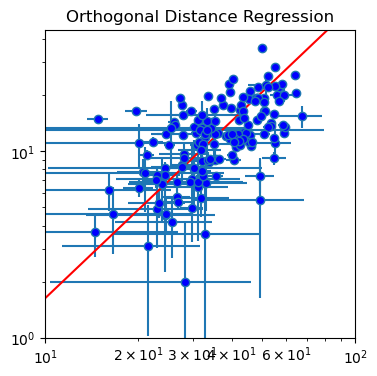

In [260]:
from scipy.odr import Model, Data, ODR, RealData

def f(p, x):

    return p[0] * x ** p[1]

linear = Model(f)
#sx, sy are arrays os error estimates
sy=(vrms_c_err[0].astype('float')); sx=(Rc_err[0].astype('float'))

mydata = RealData((Rc[0].astype('float')), (vrms_c[0].astype('float')),sx=(Rc_err[0].astype('float')),sy=(vrms_c_err[0].astype('float')))# wd=1./np.power(sx, 2), we=1./np.power(sy, 2))
#beta0 are the inital parameter estimates
myodr = ODR(mydata, linear, beta0=[10.1, 1.5])
myoutput = myodr.run()
myoutput.pprint()

x_fit = np.linspace(1, 300, 1000)    #to do the fit only within the x interval; we can always extrapolate it, of course
y_fit = f(myoutput.beta, x_fit)
# Generate a plot to show the data, errors, and fit.
fig, ax = plt.subplots(figsize=(4,4))

ax.errorbar(Rc[0].astype('float'), vrms_c[0].astype('float'), xerr=Rc_err[0].astype('float')/2, yerr=vrms_c_err[0].astype('float')/2, linestyle='None', marker='o',mfc='b')
ax.loglog(x_fit, y_fit,c='r')
ax.set_xlim(10,100)
ax.set_ylim(1,45)
ax.set_title('Orthogonal Distance Regression')


## Linmix fitting


Iteration:  100
Rhat values for alpha, beta, log(sigma^2), mean(xi), log(var(xi)), atanh(corr(xi, eta)):
[0.99937978 0.99945977 1.08631653 0.99475085 0.99586557 1.00323782]

Iteration:  200
Rhat values for alpha, beta, log(sigma^2), mean(xi), log(var(xi)), atanh(corr(xi, eta)):
[1.01742501 1.01666296 1.00998172 0.99700348 1.0017564  1.00510055]

Iteration:  300
Rhat values for alpha, beta, log(sigma^2), mean(xi), log(var(xi)), atanh(corr(xi, eta)):
[1.01567256 1.01472713 1.0098353  0.99875196 1.01089306 1.00132535]

Iteration:  400
Rhat values for alpha, beta, log(sigma^2), mean(xi), log(var(xi)), atanh(corr(xi, eta)):
[1.00734486 1.00704391 1.00672653 1.00102452 1.0067926  1.00446015]

Iteration:  500
Rhat values for alpha, beta, log(sigma^2), mean(xi), log(var(xi)), atanh(corr(xi, eta)):
[0.99968119 0.99931602 1.00529732 1.00485781 1.01361975 0.99995173]

Iteration:  600
Rhat values for alpha, beta, log(sigma^2), mean(xi), log(var(xi)), atanh(corr(xi, eta)):
[1.00170059 1.00137137 1

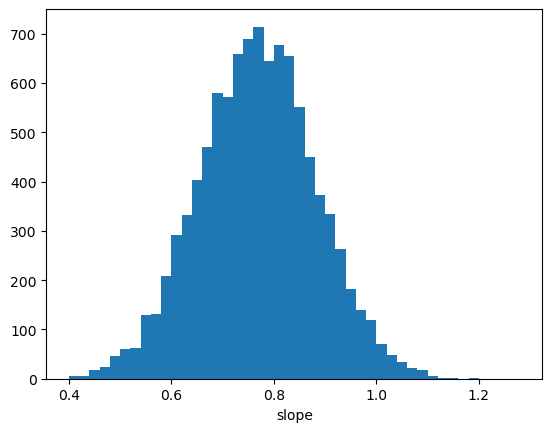

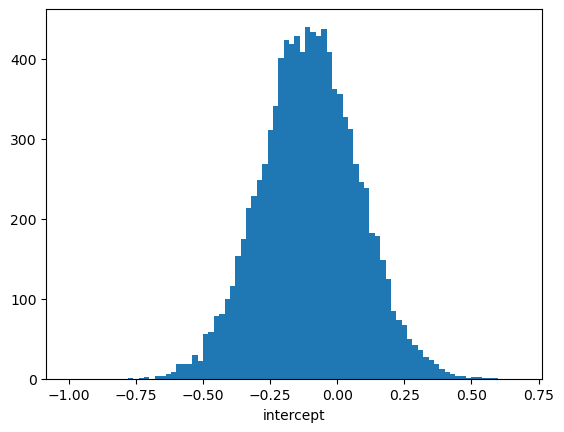

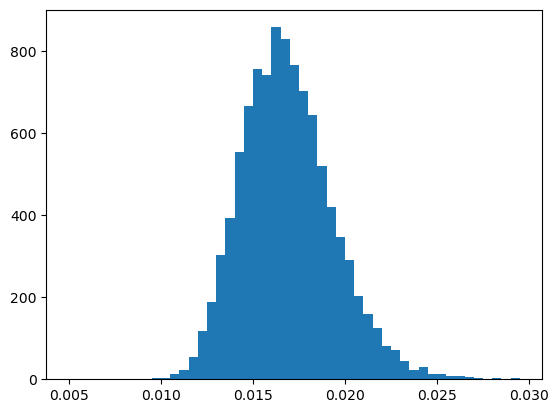

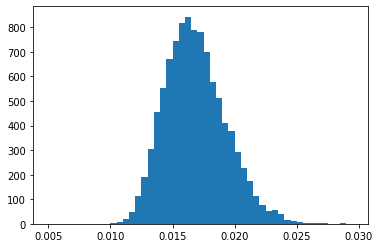

In [261]:
### linear scale ###

xdata=np.log10(Rc_all.astype('float'))
ydata=np.log10(vrms_all.astype('float'))
errx=0.434*(Rc_err[0]/Rc[0]); #errx[errx>1.5]=1
#print (errx.max())
erry=0.434*(vrms_c_err[0]/vrms_c[0])

delta = np.ones((len(xdata),), dtype=int)
lm = linmix.linmix.LinMix(xdata, ydata, xsig=errx, ysig=erry, delta=delta,K=2)#, K=K, nchains=nchains)#, xycov=xycov)
lm.run_mcmc()#miniter=miniter, maxiter=maxiter, silent=silent)
print("{}, {}".format(lm.chain['alpha'].mean(), lm.chain['alpha'].std())) # intercept
print("{}, {}".format(lm.chain['beta'].mean(), lm.chain['beta'].std())) # slope
print("{}, {}".format(lm.chain['sigsqr'].mean(), lm.chain['sigsqr'].std()))


slope_list = lm.chain['beta']
intercept_list = lm.chain['alpha']
sig_sq_list = lm.chain['sigsqr']
print (np.mean(slope_list))
print (np.std(slope_list))

print (np.mean(intercept_list))
print (np.std(intercept_list))

print (np.mean(sig_sq_list))
print (np.std(sig_sq_list))

plt.figure()
plt.hist(slope_list,bins=np.arange(0.4,1.3,0.02))
plt.xlabel('slope')
#plt.savefig('slope.png')

plt.figure()
plt.hist(intercept_list,bins=np.arange(-1.0,0.7,0.02))
plt.xlabel('intercept')
#plt.savefig('intercept.png')
plt.figure()
plt.hist(sig_sq_list,bins=np.arange(0.005,0.03,0.0005))

slope = lm.chain['beta'].mean(); intercept = lm.chain['alpha'].mean()

## Plot figure

<>:139: SyntaxWarning: invalid escape sequence '\m'
<>:140: SyntaxWarning: invalid escape sequence '\s'
<>:152: SyntaxWarning: invalid escape sequence '\m'
<>:153: SyntaxWarning: invalid escape sequence '\m'
<>:157: SyntaxWarning: invalid escape sequence '\S'
<>:158: SyntaxWarning: invalid escape sequence '\s'
<>:139: SyntaxWarning: invalid escape sequence '\m'
<>:140: SyntaxWarning: invalid escape sequence '\s'
<>:152: SyntaxWarning: invalid escape sequence '\m'
<>:153: SyntaxWarning: invalid escape sequence '\m'
<>:157: SyntaxWarning: invalid escape sequence '\S'
<>:158: SyntaxWarning: invalid escape sequence '\s'
/3/tmp/ipykernel_102033/3105906758.py:139: SyntaxWarning: invalid escape sequence '\m'
  axs[0].set_xlabel('log(R$\mathrm{_c}$/pc)',fontsize=15)
/3/tmp/ipykernel_102033/3105906758.py:140: SyntaxWarning: invalid escape sequence '\s'
  axs[0].set_ylabel('log($\sigma_{\mathrm{obs,los}}$/km s$^{-1}$)',fontsize=15)
/3/tmp/ipykernel_102033/3105906758.py:152: SyntaxWarning: invali

Larson relation slope 0.8401341559970152
11 11
147 147
7.052468354430377 1.6804430379746849
0.8483411460819805 0.2254237957626251


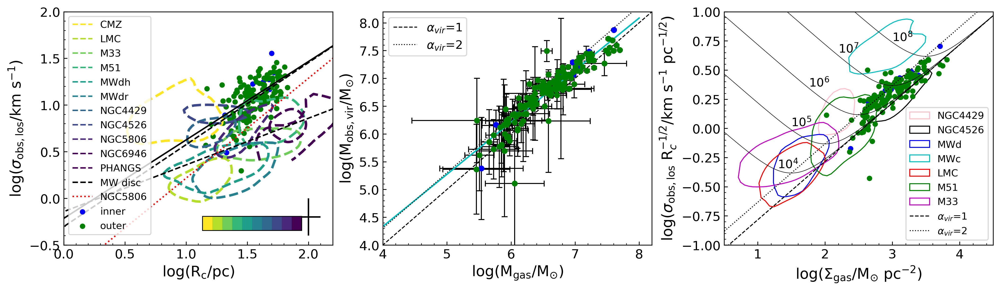

In [376]:
# For Figure 8 middle, I need to calculate virial mass. I can use equation 9 ($M_{vir}=5\sigma^2R_c/G$) = 1.1615e3*sigma^2*R_c

fig, axs = plt.subplots(1,3,figsize=(14,4),constrained_layout = True,dpi=300); axs = axs.ravel()



c_map_ax = fig.add_axes([0.2, 0.2, 0.1, 0.05])
c_map_ax.axes.get_xaxis().set_visible(False)
c_map_ax.axes.get_yaxis().set_visible(False)

mpl.colorbar.ColorbarBase(c_map_ax, cmap=col_map, orientation = 'horizontal')

col_map = plt.get_cmap('viridis_r',10)

origin = 'lower'
levels = [0,0.5,1]

for i in range(len(radius)):
    xi, yi, zi = larson_contour(radius[i],vrms[i])
    CS = axs[0].contour(xi, yi, zi,levels = levels,colors=col_map(i), linewidths=2.5,origin=origin,linestyles='--')
    axs[0].plot([],[],label=g_names[i],ls='--',c=col_map(i))


### PLOT NGC4429 PRESSURE ###

axs[2].fill(np.log10(NGC4429_p.iloc[:,0]),np.log10(NGC4429_p.iloc[:,1]),ec='pink',label='NGC4429',fill=False)

### PLOT UTOMO 2015 FIGURE 14 ###
axs[2].fill(np.log10(NGC4526_p0),np.log10(NGC4526_p1),ec='k',label='NGC4526',fill=False)
axs[2].fill(np.log10(MWd_p0),np.log10(MWd_p1),ec='b',label='MWd',fill=False)
axs[2].fill(np.log10(MWc_p0),np.log10(MWc_p1),ec='c',label='MWc',fill=False)
axs[2].fill(np.log10(LMC_p0),np.log10(LMC_p1),ec='r',label='LMC',fill=False)
axs[2].fill(np.log10(M51_p0),np.log10(M51_p1),ec='g',label='M51',fill=False)
axs[2].fill(np.log10(M33_p0),np.log10(M33_p1),ec='m',label='M33',fill=False)


### ax0 fitting line & MW line ###

x0 = np.linspace(0.1,500,100)
axs[0].plot(np.log10(x0),np.log10(params1[1]*x0**params1[0]),'k') # plot the results from the fitting with all data

axs[0].plot(np.log10(x0),params5[1]+np.log10(x0**params5[0]),'k--') # plot the results from the fitting with all data
axs[0].plot(np.log10(x0),0.5*np.log10(0.52*x0),'k--',label='MW disc') # reference, solomon 1987
#axs[0].plot(np.log10(x0),params8[0]*np.log10(x0)+params8[1],'k--')
print ('Larson relation slope',params1[0])
#axs[0].plot(np.log10(x0),np.log10(params2[1]*x1**params2[0]),'c')
#axs[0].plot(np.log10(x0),params5[0]*np.log10(x0)+ params5[1],'c')

### NGC5806 ####

axs[0].plot(np.log10(x0),np.log10(0.14*x0**1.07),'r:',label='NGC5806') # reference, kauffmann 2017


### error plot ###
#print('dR',data_resol[:,4])
#print ('dsigma',data_resol[:,6])
###############

### ax2 pressure line ###

x2 = np.arange(1,100000)
surf = x2 * u.Msun * u.pc**-2
text=np.array([(1.1,-0.6),(1.3,-0.34),(1.5,0.02),(1.76,0.36),(2.2,0.65),(3,0.75)])

for i in range(4,9):
    P = 10**i*u.K *u.cm**-3*c.k_B.to('erg K-1')
    P = ((P.to('Msun cm-1 s-2')/(3*surf)).to('km2 s-2 pc-1'))

    y = np.sqrt(np.add(np.pi*G.value*x2/5,4*P.value))

    axs[2].plot(np.log10(x2),np.log10(y),'k-',lw=0.5)
    axs[2].text(text[i-3,0],text[i-3,1],r'10$^%s$' % i,fontsize=12)

y = np.sqrt(np.pi*G.value*x2/5) #alpha = 1
y2 = np.sqrt(np.pi*G.value*x2*2/5) #alpha =2
             
axs[2].plot(np.log10(x2),np.log10(y),'k--',lw=1,label=r'$\alpha_{vir}$=1')
axs[2].plot(np.log10(x2),np.log10(y2),'k:',lw=1,label=r'$\alpha_{vir}$=2')
                   
### plot all subplots

for i in (1,2):    
    print (len(Rc[i]),len(vrms_c[i]))
    axs[0].scatter(np.log10(Rc[i].astype('float')),np.log10(vrms_c[i].astype('float')),s=20,c=lines[i],label=name[i])

    
    Mvir = 1.1615e3*Rc[i].astype('float')*vrms_c[i].astype('float').astype('float')**2 # not log scale
    xerr = 0.434*(10**Mlum_c_err[i]/10**Mlum_c[i])
    yerr = np.sqrt((Rc_err[i].astype('float')/Rc[i].astype('float'))**2 + 2*(vrms_c_err[i].astype('float')/vrms_c[i].astype('float'))**2)
    #yerr = 0.434*(yerr/Mvir_s)
    #print (yerr)
    axs[1].errorbar(Mlum_c[i], np.log10(Mvir), xerr=xerr,yerr=yerr*0.434, capsize=3,mec='none',mfc=lines[i], ls='none', color='black',elinewidth=1,fmt='o')
    #axs[1].scatter(Mlum_c[i],np.log10(Mvir[i]),s=12,c=lines[i])
    
    #axs[1].scatter(Mlum_c[i],np.log10(1.1615e3*Rc[i].astype('float')*vrms_c[i].astype('float')**2),s=12,c=lines[i])



    axs[2].scatter(surf_c[i],np.log10(vrms_c[i].astype('float')/(Rc[i]).astype('float')**0.5),s=20,c=lines[i])


    
# ax1 1-to-1 line & alpha=2 line

axs[0].errorbar(2,-0.2,xerr=0.1,yerr=0.2,ecolor='k')

#x1 = np.linspace(3.5,8.0,40)
x1 = np.linspace(3.5,8.0,40)
#axs[1].plot(np.log10(x1),np.log10(params2[1]*x1**params2[0]),'c')
axs[1].plot(x1,params2[0]*x1+ params2[1],'c')
axs[1].plot([3.5,8.5],[3.5,8.5],'k--',lw=1,label=r'$\alpha_{vir}$=1')
axs[1].plot([3.5,8.5],[np.log10(2*10**3.5),np.log10(2*10**8.5)],'k:',lw=1,label=r'$\alpha_{vir}$=2')

axs[0].set_xlim(0,2.2)
axs[0].set_ylim(-0.5,2.0)
axs[0].set_xlabel('log(R$\mathrm{_c}$/pc)',fontsize=15)
axs[0].set_ylabel('log($\sigma_{\mathrm{obs,los}}$/km s$^{-1}$)',fontsize=15)

dr = np.mean(data_resol[:,4])
ds = np.mean(data_resol[:,6])

print (dr,ds)
print (np.log10(dr),np.log10(ds))
#print('dR',data_resol[:,4])
#print ('dsigma',data_resol[:,6])

axs[1].set_xlim(4,8.2)
axs[1].set_ylim(4,8.2)
axs[1].set_xlabel('log(M$_{\mathrm{gas}}$/M$_{\odot}$)',fontsize=15)
axs[1].set_ylabel('log(M$_{\mathrm{obs,vir}}$/M$_{\odot}$)',fontsize=15)

axs[2].set_xlim(0.5,4.5)
axs[2].set_ylim(-1,1)
axs[2].set_xlabel('log($\Sigma_{\mathrm{gas}}$/M$_{\odot}$ pc$^{-2}$)',fontsize=15)
axs[2].set_ylabel('log($\sigma_{\mathrm{obs,los}}$ R$_c^{-1/2}$/km s$^{-1}$ pc$^{-1/2}$)',fontsize=15)
    
axs[0].tick_params(direction='in',which='both',axis='both',labelsize=13)

#axs[0].tick_params(which='major', length=7)
#axs[0].tick_params(which='minor', length=10, color='r')
#axs[0].xaxis.set_minor_locator(MultipleLocator(5))

axs[0].minorticks_on()
axs[1].minorticks_on()
axs[2].minorticks_on()
axs[1].tick_params(direction='in',which='both',labelsize=13)  
axs[2].tick_params(direction='in',which='both',labelsize=13)  

axs[0].legend(loc=0,fontsize=10)
axs[1].legend(loc=0,fontsize=12)
axs[2].legend(loc=4,fontsize=10)




#cmap = plt.cm.get_cmap('PiYG', 11)
#axs[0].imshow([[0,1],[0,1]],cmap=cmap)
#plt.colorbar()
#axs[1].xaxis.

#plt.tight_layout()
#plt.subplots_adjust(left=0.05,top=0.98,bottom=0.133,right=0.99,wspace=0.25)
#plt.savefig('fig_larson_relation_new_%s_allcombine_minpix24_96.png' % folder,dpi=300, transparent=True)
plt.show()

# Need to fitting the data with errors
# for right panel, i need to find the pressure equilibrium curves

<>:126: SyntaxWarning: invalid escape sequence '\m'
<>:127: SyntaxWarning: invalid escape sequence '\s'
<>:126: SyntaxWarning: invalid escape sequence '\m'
<>:127: SyntaxWarning: invalid escape sequence '\s'
/3/tmp/ipykernel_102033/293340124.py:126: SyntaxWarning: invalid escape sequence '\m'
  axs.set_xlabel('log($R\mathrm{_c}$/pc)',fontsize=15)
/3/tmp/ipykernel_102033/293340124.py:127: SyntaxWarning: invalid escape sequence '\s'
  axs.set_ylabel('log($\sigma_{\mathrm{obs,los}}$/km s$^{-1}$)',fontsize=15)
/3/tmp/ipykernel_102033/293340124.py:38: UserWarning: The following kwargs were not used by contour: 'clabel'
  CS = axs.contour(xi, yi, zi,levels = levels,colors='r', linewidths=2.5,origin=origin,clabel='NGC613',linestyles='-')


0.7678519533145349 -0.1029575302580317
1.5809556810238377


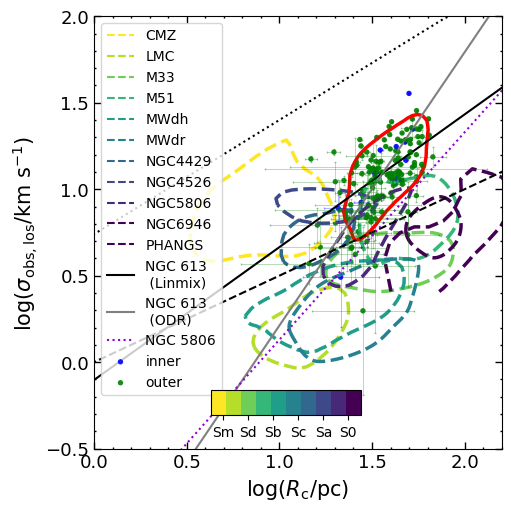

In [373]:
# For Figure 8 middle, I need to calculate virial mass. I can use equation 9 ($M_{vir}=5\sigma^2R_c/G$) = 1.1615e3*sigma^2*R_c

fig, axs = plt.subplots(1,1,figsize=(5,5),constrained_layout = True); #axs = axs.ravel()

col_map = plt.get_cmap('viridis_r',10)

origin = 'lower'
levels = [0,0.5,1]

for i in range(len(radius)):
    xi, yi, zi = larson_contour(radius[i],vrms[i])
    CS = axs.contour(xi, yi, zi,levels = levels,colors=col_map(i), linewidths=2.5,origin=origin,linestyles='--')
    axs.plot([],[],label=g_names[i],ls='--',c=col_map(i))


#print (xi,yi,zi)
### PLOT NGC5806 LARSON in contours ###
x = np.log10(Rc[0].astype('float'))
y = np.log10(vrms_c[0].astype('float'))

k = gaussian_kde(np.vstack([np.log10(Rc[0].astype('float')),np.log10(vrms_c[0].astype('float'))]))
xi, yi = np.mgrid[x.min():x.max():x.size**0.5*2j,y.min():y.max():y.size**0.5*2j]
zi = k(np.vstack([xi.flatten(), yi.flatten()]))

#print (xi)

#set zi to 0-1 scale
zi = (zi-zi.min())/(zi.max() - zi.min())
zi =zi.reshape(xi.shape)

#set up plot
origin = 'lower'
levels = [0,0.32,1]

CS = axs.contour(xi, yi, zi,levels = levels,colors='r', linewidths=2.5,origin=origin,clabel='NGC613',linestyles='-')

#dat0= CS.allsegs

#print (dat0[1][0][:,1])

### ax0 fitting line & MW line ###

x0 = np.linspace(0.1,500,100)

xx=np.linspace(0,3)
axs.plot(xx,slope*xx+intercept,'-k',label='NGC 613 \n (Linmix)')

axs.plot(np.log10(x_fit), np.log10(y_fit),c='gray',label='NGC 613 \n (ODR)')

print (slope,intercept)
print ((np.log10(y_fit[-1])-np.log10(y_fit[0])) / (np.log10(x_fit[-1])-np.log10(x_fit[0])))
#print (y_fit)

#axs.plot(np.log10(x0),np.log10(params5[1]*x0**params5[0]),'k',label='NGC613') # plot the results from the fitting with all data
axs.plot(np.log10(x0),np.log10(1.0*x0**0.5),'k--')#,label='MW disc') # reference, solomon 1987

### MW CMZ ###

axs.plot(np.log10(x0),np.log10(5.5*x0**0.66),'k:')#,label='CMZ') # reference, kauffmann 2017


axs.plot(np.log10(x0),np.log10(0.085*x0**1.20),c='darkviolet',ls=':',label='NGC 5806') # reference, kauffmann 2017


#axs[0].plot(np.log10(x0),np.log10(params2[1]*x1**params2[0]),'c')
#axs[0].plot(np.log10(x0),params5[0]*np.log10(x0)+ params5[1],'c')

### error plot ###
#print('dR',data_resol[:,4])
#print ('dsigma',data_resol[:,6])
###############

### plot all subplots

# import bces.bces as BCES
# cov = np.zeros_like(Rc_all)
# a,b,aerr,berr,covab=BCES.bcesp(np.log10(Rc_all.astype('float')),(Rc_err_all.astype('float')),np.log10(vrms_all.astype('float')),(vrms_err_all.astype('float')),cov)
# print (a)
# print (b)
# axs.plot(np.log10(x0),a[0]+np.log10(x0*b[0]),c='r')

# print (a,b)
# print(aerr,berr)



for i in (1,2):    
    #print (len(Rc[i]),len(vrms_c[i]))
    axs.scatter(np.log10(Rc[i].astype('float')),np.log10(vrms_c[i].astype('float')),s=15,ec='none',fc=lines[i],alpha=0.9,label=name[i])
    axs.errorbar(np.log10(Rc[i].astype('float')),np.log10(vrms_c[i].astype('float')),yerr=0.434*(vrms_c_err[i].astype('float')/vrms_c[i].astype('float'))/2
                 , xerr=0.434*(Rc_err[i].astype('float')/Rc[i].astype('float'))/2, capsize=1,mec='none',alpha=0.4,mfc='none',ls='none', color=lines[i],elinewidth=0.5,fmt='o')#lines[i])
    
    
# ax1 1-to-1 line & alpha=2 line

#axs.errorbar(2,-0.2,xerr=0.1,yerr=0.2,ecolor='k')

### Calculate median or mean value of each bin ###

xaxis_data = np.log10(Rc[0].astype('float'))
yaxis_data = np.log10(vrms_c[0].astype('float'))

yaxis_data = yaxis_data[np.argsort(xaxis_data)]
xaxis_data = xaxis_data[np.argsort(xaxis_data)]

x_bin_data = np.array_split(xaxis_data,10)
y_bin_data = np.array_split(yaxis_data,10)


x_bin_mean = list(map(np.mean, x_bin_data))
y_bin_mean = list(map(np.mean, y_bin_data))

x_bin_med = list(map(np.median, x_bin_data))
y_bin_med = list(map(np.median, y_bin_data))

#axs.scatter(x_bin_med,y_bin_med,c='c',s=100,zorder=50)
#axs.scatter(x_bin_mean,y_bin_mean,c='m',s=100,zorder=50)

#####################################################

axs.set_xlim(0,2.2)
axs.set_ylim(-0.5,2.0)
axs.set_xlabel('log($R\mathrm{_c}$/pc)',fontsize=15)
axs.set_ylabel('log($\sigma_{\mathrm{obs,los}}$/km s$^{-1}$)',fontsize=15)

dr = np.mean(data_resol[:,4])
ds = np.mean(data_resol[:,6])


axs.tick_params(direction='in',which='both',axis='both',labelsize=13,top='on',right='on')

#axs[0].tick_params(which='major', length=7)
#axs[0].tick_params(which='minor', length=10, color='r')
#axs[0].xaxis.set_minor_locator(MultipleLocator(5))

axs.minorticks_on()
axs.legend(loc=0,fontsize=10)

c_map_ax = fig.add_axes([0.41, 0.18, 0.3, 0.05])
#c_map_ax.axes.get_xaxis().set_visible(False)
c_map_ax.axes.get_yaxis().set_visible(False)

ticks=np.arange(7)
cbar=mpl.colorbar.ColorbarBase(c_map_ax, cmap=col_map, orientation = 'horizontal',norm=plt.Normalize(ticks[0],ticks[-1],col_map.N),spacing='proportional')#,ticks=[0,1,2,3,4,5])#,ticks=[r'S0^+','Sa','Sb','Sc','Sd','Sm'])
#cbar.set_ticks([0,1,2,3,4,5])
cbar.set_ticks(ticks[0:-1]+0.5)
#cbar.ax.set_xticklabels([r'S0','Sa','Sb','Sc','Sd','Sm'])
cbar.ax.set_xticklabels([r'Sm','Sd','Sb','Sc','Sa','S0'])

#cbar.ax.xaxis.set_tick_params(pad=-15)

axs.tick_params('both', length=5, width=1, which='major')
axs.tick_params('both', length=1.5, width=1, which='minor')


#### Put two legend ####

#handles,labels = axs.get_legend_handles_labels()

# handles1 = [handles[5],handles[6], handles[4],handles[3],handles[2],handles[1],handles[0]]
# labels1 = [labels[5],labels[6], labels[4],labels[3],labels[2],labels[1],labels[0]]

# legend1 = axs.legend(handles1,labels1,loc=2,fontsize=10)

# handles2 = [handles[8], handles[9], handles[10],handles[11]]#,handles[1]]
# labels2 = [labels[8], labels[9], labels[10],labels[11]]#,labels[1]]

# #ax.legend(loc=2,fontsize=13)
# legend2 = axs.legend(handles2,labels2,loc='lower right',fontsize=10)

# legend3 = axs.legend([handles[7]], [labels[7]],loc='center left',fontsize=10,bbox_to_anchor=(0, 0.52))

# axs.add_artist(legend1)
# axs.add_artist(legend2)
# axs.add_artist(legend3)

# legend2.legendHandles[0]._sizes = [30]
# legend2.legendHandles[1]._sizes = [30]
# legend2.legendHandles[2]._sizes = [30]
# legend2.legendHandles[3]._sizes = [30]

#plt.tight_layout()
#plt.subplots_adjust(left=0.05,top=0.98,bottom=0.133,right=0.99,wspace=0.25)
#plt.savefig('/home/woorak/Dropbox/앱/Overleaf/[Paper] WISDOM_GMCs_ngc613/ngc613_larson_only_test1.png',dpi=300, transparent=True)
#plt.savefig('ngc613_larson_only.png',dpi=300, transparent=True)



axs.legend(loc=0,fontsize=10)
plt.show()


0.7671039105753041 -0.10168483938027778
1.5809557706356807


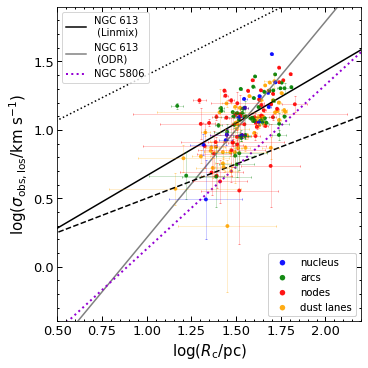

In [333]:
# For Figure 8 middle, I need to calculate virial mass. I can use equation 9 ($M_{vir}=5\sigma^2R_c/G$) = 1.1615e3*sigma^2*R_c

fig, axs = plt.subplots(1,1,figsize=(5,5),constrained_layout = True); #axs = axs.ravel()

col_map = plt.get_cmap('viridis_r',6)


### PLOT NGC5806 LARSON in contours ###
x = np.log10(Rc[0].astype('float'))
y = np.log10(vrms_c[0].astype('float'))

k = gaussian_kde(np.vstack([np.log10(Rc[0].astype('float')),np.log10(vrms_c[0].astype('float'))]))
xi, yi = np.mgrid[x.min():x.max():x.size**0.5*2j,y.min():y.max():y.size**0.5*2j]
zi = k(np.vstack([xi.flatten(), yi.flatten()]))

#print (xi)

#set zi to 0-1 scale
zi = (zi-zi.min())/(zi.max() - zi.min())
zi =zi.reshape(xi.shape)

#set up plot
origin = 'lower'
levels = [0,0.32,1]

#CS = axs.contour(xi, yi, zi,levels = levels,colors='r', linewidths=2.5,origin=origin,clabel='NGC613',linestyles='-')

#dat0= CS.allsegs

#print (dat0[1][0][:,1])

### ax0 fitting line & MW line ###

x0 = np.linspace(0.1,500,100)

xx=np.linspace(0,3)
axs.plot(xx,slope*xx+intercept,'-k',label='NGC 613 \n (Linmix)')

axs.plot(np.log10(x_fit), np.log10(y_fit),c='gray',label='NGC 613 \n (ODR)')

print (slope,intercept)
print ((np.log10(y_fit[-1])-np.log10(y_fit[0])) / (np.log10(x_fit[-1])-np.log10(x_fit[0])))
#print (y_fit)

#axs.plot(np.log10(x0),np.log10(params5[1]*x0**params5[0]),'k',label='NGC613') # plot the results from the fitting with all data
axs.plot(np.log10(x0),np.log10(1.0*x0**0.5),'k--')#,label='MW disc') # reference, solomon 1987

### MW CMZ ###

axs.plot(np.log10(x0),np.log10(5.5*x0**0.66),'k:')#,label='CMZ') # reference, kauffmann 2017


axs.plot(np.log10(x0),np.log10(0.085*x0**1.20),c='darkviolet',lw=2,ls=':',label='NGC 5806') # reference, kauffmann 2017


#axs[0].plot(np.log10(x0),np.log10(params2[1]*x1**params2[0]),'c')
#axs[0].plot(np.log10(x0),params5[0]*np.log10(x0)+ params5[1],'c')

### error plot ###
#print('dR',data_resol[:,4])
#print ('dsigma',data_resol[:,6])
###############

### plot all subplots

# import bces.bces as BCES
# cov = np.zeros_like(Rc_all)
# a,b,aerr,berr,covab=BCES.bcesp(np.log10(Rc_all.astype('float')),(Rc_err_all.astype('float')),np.log10(vrms_all.astype('float')),(vrms_err_all.astype('float')),cov)
# print (a)
# print (b)
# axs.plot(np.log10(x0),a[0]+np.log10(x0*b[0]),c='r')

# print (a,b)
# print(aerr,berr)



for i in (4,3,2,1):    
    #print (len(Rc[i]),len(vrms_c[i]))
    axs.scatter(np.log10(Rc[i].astype('float')),np.log10(vrms_c[i].astype('float')),s=15,ec='none',fc=lines[i],alpha=0.9,label=name[i])
    axs.errorbar(np.log10(Rc[i].astype('float')),np.log10(vrms_c[i].astype('float')),yerr=0.434*(vrms_c_err[i].astype('float')/vrms_c[i].astype('float'))/2
                 , xerr=0.434*(Rc_err[i].astype('float')/Rc[i].astype('float'))/2, capsize=1,mec='none',alpha=0.4,mfc='none',ls='none', color=lines[i],elinewidth=0.5,fmt='o')#lines[i])
    
    
# ax1 1-to-1 line & alpha=2 line

#axs.errorbar(2,-0.2,xerr=0.1,yerr=0.2,ecolor='k')

### Calculate median or mean value of each bin ###

xaxis_data = np.log10(Rc[0].astype('float'))
yaxis_data = np.log10(vrms_c[0].astype('float'))

yaxis_data = yaxis_data[np.argsort(xaxis_data)]
xaxis_data = xaxis_data[np.argsort(xaxis_data)]

x_bin_data = np.array_split(xaxis_data,10)
y_bin_data = np.array_split(yaxis_data,10)


x_bin_mean = list(map(np.mean, x_bin_data))
y_bin_mean = list(map(np.mean, y_bin_data))

x_bin_med = list(map(np.median, x_bin_data))
y_bin_med = list(map(np.median, y_bin_data))

#axs.scatter(x_bin_med,y_bin_med,c='c',s=100,zorder=50)
#axs.scatter(x_bin_mean,y_bin_mean,c='m',s=100,zorder=50)

#####################################################

axs.set_xlim(0.5,2.2)
axs.set_ylim(-0.4,1.9)
axs.set_xlabel('log($R\mathrm{_c}$/pc)',fontsize=15)
axs.set_ylabel('log($\sigma_{\mathrm{obs,los}}$/km s$^{-1}$)',fontsize=15)

dr = np.mean(data_resol[:,4])
ds = np.mean(data_resol[:,6])


axs.tick_params(direction='in',which='both',axis='both',labelsize=13,top='on',right='on')

#axs[0].tick_params(which='major', length=7)
#axs[0].tick_params(which='minor', length=10, color='r')
#axs[0].xaxis.set_minor_locator(MultipleLocator(5))

axs.minorticks_on()
axs.legend(loc=0,fontsize=10)

#c_map_ax = fig.add_axes([0.41, 0.18, 0.3, 0.05])
##c_map_ax.axes.get_xaxis().set_visible(False)
#c_map_ax.axes.get_yaxis().set_visible(False)

#ticks=np.arange(7)
#cbar=mpl.colorbar.ColorbarBase(c_map_ax, cmap=col_map, orientation = 'horizontal',norm=plt.Normalize(ticks[0],ticks[-1],col_map.N),spacing='proportional')#,ticks=[0,1,2,3,4,5])#,ticks=[r'S0^+','Sa','Sb','Sc','Sd','Sm'])
##cbar.set_ticks([0,1,2,3,4,5])
#cbar.set_ticks(ticks[0:-1]+0.5)
##cbar.ax.set_xticklabels([r'S0','Sa','Sb','Sc','Sd','Sm'])
#cbar.ax.set_xticklabels([r'Sm','Sd','Sb','Sc','Sa','S0'])

#cbar.ax.xaxis.set_tick_params(pad=-15)

axs.tick_params('both', length=5, width=1, which='major')
axs.tick_params('both', length=2, width=1, which='minor')


#### Put two legend ####

handles,labels = axs.get_legend_handles_labels()

handles1 = [handles[0],handles[1],handles[2]]
labels1 = [labels[0],labels[1],labels[2]]

legend1 = axs.legend(handles1,labels1,loc=2,fontsize=10)

handles2 = [handles[6], handles[5], handles[4],handles[3]]#,handles[1]]
labels2 = [labels[6], labels[5], labels[4],labels[3]]#,labels[1]]

#ax.legend(loc=2,fontsize=13)
legend2 = axs.legend(handles2,labels2,loc='lower right',fontsize=10)

#legend3 = axs.legend([handles[7]], [labels[7]],loc='center left',fontsize=10,bbox_to_anchor=(0, 0.52))

axs.add_artist(legend1)
axs.add_artist(legend2)
#axs.add_artist(legend3)

legend2.legendHandles[0]._sizes = [30]
legend2.legendHandles[1]._sizes = [30]
legend2.legendHandles[2]._sizes = [30]
legend2.legendHandles[3]._sizes = [30]

#plt.tight_layout()
#plt.subplots_adjust(left=0.05,top=0.98,bottom=0.133,right=0.99,wspace=0.25)
#plt.savefig('ngc613_larson_only_test1.png',dpi=300, transparent=True)
#plt.savefig('ngc613_larson_only.png',dpi=300, transparent=True)
plt.show()

# Need to fitting the data with errors
# for right panel, i need to find the pressure equilibrium curves

<>:144: SyntaxWarning: invalid escape sequence '\m'
<>:145: SyntaxWarning: invalid escape sequence '\s'
<>:144: SyntaxWarning: invalid escape sequence '\m'
<>:145: SyntaxWarning: invalid escape sequence '\s'
/3/tmp/ipykernel_102033/2926756067.py:144: SyntaxWarning: invalid escape sequence '\m'
  axs.set_xlabel('log($R\mathrm{_c}$/pc)',fontsize=15)
/3/tmp/ipykernel_102033/2926756067.py:145: SyntaxWarning: invalid escape sequence '\s'
  axs.set_ylabel('log($\sigma_{\mathrm{obs,los}}$/km s$^{-1}$)',fontsize=15)
/3/tmp/ipykernel_102033/2926756067.py:55: UserWarning: The following kwargs were not used by contour: 'clabel'
  CS = axs.contour(xi, yi, zi,levels = levels,colors='k', linewidths=2.5,origin=origin,clabel='NGC613',linestyles='-')


0.7678519533145349 -0.1029575302580317
1.5809556810238377


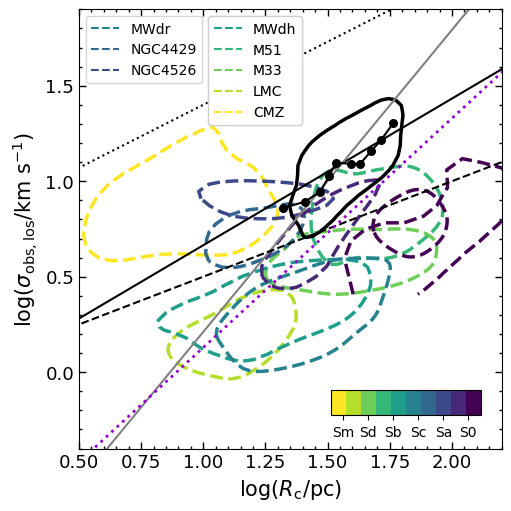

In [378]:
# For Figure 8 middle, I need to calculate virial mass. I can use equation 9 ($M_{vir}=5\sigma^2R_c/G$) = 1.1615e3*sigma^2*R_c

fig, axs = plt.subplots(1,1,figsize=(5,5),constrained_layout = True); #axs = axs.ravel()



col_map = plt.get_cmap('viridis_r',10)

origin = 'lower'
levels = [0,0.5,1]

for i in range(len(radius)):
    xi, yi, zi = larson_contour(radius[i],vrms[i])
    CS = axs.contour(xi, yi, zi,levels = levels,colors=col_map(i), linewidths=2.5,origin=origin,linestyles='--')
    axs.plot([],[],label=g_names[i],ls='--',c=col_map(i))



### PLOT NGC4429 LARSON ###
# x = np.log10(data_resol[:,3].astype('float'))
# y = np.log10(data_resol[:,5].astype('float'))

# k = gaussian_kde(np.vstack([np.log10(data_resol[:,3].astype('float')),np.log10(data_resol[:,5].astype('float'))]))
# xi, yi = np.mgrid[x.min():x.max():x.size**0.5*1j,y.min():y.max():y.size**0.5*1j]
# zi = k(np.vstack([xi.flatten(), yi.flatten()]))

# #set zi to 0-1 scale
# zi = (zi-zi.min())/(zi.max() - zi.min())
# zi =zi.reshape(xi.shape)

# #set up plot
# origin = 'lower'
# levels = [0,0.32,1]

# CS = axs.contour(xi, yi, zi,levels = levels,colors=col_map(4), linewidths=1,origin=origin,linestyles='--')

### PLOT NGC5806 LARSON in contours ###
x = np.log10(Rc[0].astype('float'))
y = np.log10(vrms_c[0].astype('float'))

k = gaussian_kde(np.vstack([np.log10(Rc[0].astype('float')),np.log10(vrms_c[0].astype('float'))]))
xi, yi = np.mgrid[x.min():x.max():x.size**0.5*2j,y.min():y.max():y.size**0.5*2j]
zi = k(np.vstack([xi.flatten(), yi.flatten()]))

#print (xi)

#set zi to 0-1 scale
zi = (zi-zi.min())/(zi.max() - zi.min())
zi =zi.reshape(xi.shape)

#set up plot
origin = 'lower'
levels = [0,0.32,1]

CS = axs.contour(xi, yi, zi,levels = levels,colors='k', linewidths=2.5,origin=origin,clabel='NGC613',linestyles='-')

#dat0= CS.allsegs

#print (dat0[1][0][:,1])

### ax0 fitting line & MW line ###

x0 = np.linspace(0.1,500,100)

xx=np.linspace(0,3)
axs.plot(xx,slope*xx+intercept,'-k',label='NGC 613 \n (Linmix)')

axs.plot(np.log10(x_fit), np.log10(y_fit),c='gray',label='NGC 613 \n (ODR)')

print (slope,intercept)
print ((np.log10(y_fit[-1])-np.log10(y_fit[0])) / (np.log10(x_fit[-1])-np.log10(x_fit[0])))
#print (y_fit)

#axs.plot(np.log10(x0),np.log10(params5[1]*x0**params5[0]),'k',label='NGC613') # plot the results from the fitting with all data
axs.plot(np.log10(x0),np.log10(1.0*x0**0.5),'k--')#,label='MW disc') # reference, solomon 1987

### MW CMZ ###

axs.plot(np.log10(x0),np.log10(5.5*x0**0.66),'k:')#,label='CMZ') # reference, kauffmann 2017


axs.plot(np.log10(x0),np.log10(0.085*x0**1.20),c='darkviolet',lw=2,ls=':',label='NGC 5806') # reference, kauffmann 2017


#axs[0].plot(np.log10(x0),np.log10(params2[1]*x1**params2[0]),'c')
#axs[0].plot(np.log10(x0),params5[0]*np.log10(x0)+ params5[1],'c')

### error plot ###
#print('dR',data_resol[:,4])
#print ('dsigma',data_resol[:,6])
###############

### plot all subplots

# import bces.bces as BCES
# cov = np.zeros_like(Rc_all)
# a,b,aerr,berr,covab=BCES.bcesp(np.log10(Rc_all.astype('float')),(Rc_err_all.astype('float')),np.log10(vrms_all.astype('float')),(vrms_err_all.astype('float')),cov)
# print (a)
# print (b)
# axs.plot(np.log10(x0),a[0]+np.log10(x0*b[0]),c='r')

# print (a,b)
# print(aerr,berr)

# for i in (4,3,2,1):    
#     #print (len(Rc[i]),len(vrms_c[i]))
#     axs.scatter(np.log10(Rc[i].astype('float')),np.log10(vrms_c[i].astype('float')),s=5,ec='none',fc=lines[i],label=name[i])
#     axs.errorbar(np.log10(Rc[i].astype('float')),np.log10(vrms_c[i].astype('float')),yerr=0.434*(vrms_c_err[i].astype('float')/vrms_c[i].astype('float'))/2, 
#xerr=0.434*(Rc_err[i].astype('float')/Rc[i].astype('float'))/2, capsize=3,mec='none',alpha=0.5,mfc=lines[i], ls='none', color=lines[i],elinewidth=1,fmt='o')
    
    
# ax1 1-to-1 line & alpha=2 line

#axs.errorbar(2,-0.2,xerr=0.1,yerr=0.2,ecolor='k')

### Calculate median or mean value of each bin ###

xaxis_data = np.log10(Rc[0].astype('float'))
yaxis_data = np.log10(vrms_c[0].astype('float'))

yaxis_data = yaxis_data[np.argsort(xaxis_data)]
xaxis_data = xaxis_data[np.argsort(xaxis_data)]

x_bin_data = np.array_split(xaxis_data,10)
y_bin_data = np.array_split(yaxis_data,10)


x_bin_mean = list(map(np.mean, x_bin_data))
y_bin_mean = list(map(np.mean, y_bin_data))

x_bin_med = list(map(np.median, x_bin_data))
y_bin_med = list(map(np.median, y_bin_data))

axs.scatter(x_bin_med,y_bin_med,c='k',s=30,zorder=50)
axs.errorbar(x_bin_med,y_bin_med,c='k',ms=100,zorder=50)
#axs.scatter(x_bin_mean,y_bin_mean,c='m',s=100,zorder=50)

#####################################################

# axs.set_xlim(0,2.2)
# axs.set_ylim(-0.5,2.0)
axs.set_xlim(0.5,2.2)
axs.set_ylim(-0.4,1.9)
axs.set_xlabel('log($R\mathrm{_c}$/pc)',fontsize=15)
axs.set_ylabel('log($\sigma_{\mathrm{obs,los}}$/km s$^{-1}$)',fontsize=15)

dr = np.mean(data_resol[:,4])
ds = np.mean(data_resol[:,6])


axs.tick_params(direction='in',which='both',axis='both',labelsize=13,top='on',right='on')

#axs[0].tick_params(which='major', length=7)
#axs[0].tick_params(which='minor', length=10, color='r')
#axs[0].xaxis.set_minor_locator(MultipleLocator(5))

axs.minorticks_on()
axs.legend(loc=0,fontsize=10)

#c_map_ax = fig.add_axes([0.41, 0.18, 0.3, 0.05])

c_map_ax = fig.add_axes([0.65, 0.18, 0.3, 0.05])

#c_map_ax.axes.get_xaxis().set_visible(False)
c_map_ax.axes.get_yaxis().set_visible(False)

ticks=np.arange(7)
cbar=mpl.colorbar.ColorbarBase(c_map_ax, cmap=col_map, orientation = 'horizontal',norm=plt.Normalize(ticks[0],ticks[-1],col_map.N),spacing='proportional')#,ticks=[0,1,2,3,4,5])#,ticks=[r'S0^+','Sa','Sb','Sc','Sd','Sm'])
#cbar.set_ticks([0,1,2,3,4,5])
cbar.set_ticks(ticks[0:-1]+0.5)
#cbar.ax.set_xticklabels([r'S0','Sa','Sb','Sc','Sd','Sm'])
cbar.ax.set_xticklabels([r'Sm','Sd','Sb','Sc','Sa','S0'])

#cbar.ax.xaxis.set_tick_params(pad=-15)

axs.tick_params('both', length=5, width=1, which='major')
axs.tick_params('both', length=2, width=1, which='minor')


#### Put two legend ####

handles,labels = axs.get_legend_handles_labels()

handles1 = [handles[5],handles[6],handles[7]]
labels1 = [labels[5],labels[6],labels[7] ]

legend1 = axs.legend(handles1,labels1,loc=2,fontsize=10)

# handles2 = [handles[8], handles[9], handles[10],handles[11]]#,handles[1]]
# labels2 = [labels[8], labels[9], labels[10],labels[11]]#,labels[1]]

#ax.legend(loc=2,fontsize=13)
#legend2 = axs.legend(handles2,labels2,loc='lower right',fontsize=10)

legend3 = axs.legend([handles[4],handles[3],handles[2],handles[1],handles[0]], [labels[4],labels[3],labels[2],labels[1],labels[0]],loc='center left',fontsize=10,bbox_to_anchor=(0.29, 0.86))

axs.add_artist(legend1)
#axs.add_artist(legend2)
axs.add_artist(legend3)


#plt.tight_layout()
#plt.subplots_adjust(left=0.05,top=0.98,bottom=0.133,right=0.99,wspace=0.25)
#plt.savefig('ngc613_larson_only_test2.png',dpi=300, transparent=True)
#plt.savefig('ngc613_larson_only.png',dpi=300, transparent=True)
plt.show()

# Need to fitting the data with errors
# for right panel, i need to find the pressure equilibrium curves

## Lmfit test

[[Model]]
    Model(larson_first_law)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 19
    # data points      = 158
    # variables        = 2
    chi-square         = 3217.75083
    reduced chi-square = 20.6266079
    Akaike info crit   = 480.187172
    Bayesian info crit = 486.312362
[[Variables]]
    a:  0.61012661 +/- 0.22093945 (36.21%) (init = -1)
    b:  0.84013414 +/- 0.09661655 (11.50%) (init = 1)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, b) = -0.997


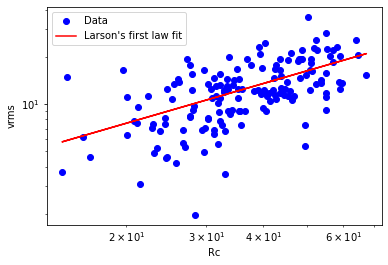

[[Model]]
    Model(larson_first_law)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 22
    # data points      = 158
    # variables        = 2
    chi-square         = 10997.7584
    reduced chi-square = 70.4984514
    Akaike info crit   = 674.370571
    Bayesian info crit = 680.495761
[[Variables]]
    a:  1.15301849 +/- 0.45264479 (39.26%) (init = -1)
    b:  0.69706367 +/- 0.10072932 (14.45%) (init = 1)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, b) = -0.999


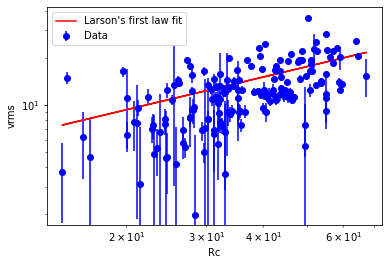

[[Model]]
    Model(larson_first_law)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 22
    # data points      = 158
    # variables        = 2
    chi-square         = 10997.7584
    reduced chi-square = 70.4984514
    Akaike info crit   = 674.370571
    Bayesian info crit = 680.495761
[[Variables]]
    a:  1.15301849 +/- 0.45264479 (39.26%) (init = -1)
    b:  0.69706367 +/- 0.10072932 (14.45%) (init = 1)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, b) = -0.999


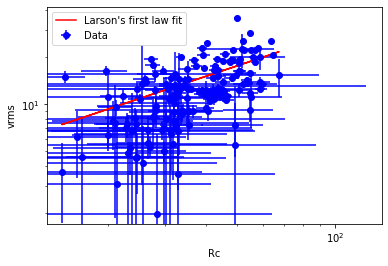

In [89]:
## lmfit test ##

from lmfit import Model

# Define the Larson's first law function
def larson_first_law(Rc, a, b):
    return a * Rc**b

# Load the data
Rc = Rc_all.astype('float')
vrms = vrms_all.astype('float')

# Create a model with the Larson's first law function
model = Model(larson_first_law)

# Set the initial parameter values
model.set_param_hint('a', value=-1, min=-5)
model.set_param_hint('b', value=1.0, min=0.0)

# Perform the curve fitting
result = model.fit(vrms, Rc=Rc)

# Print the fit results
print(result.fit_report())

# Plot the data and the fit
plt.figure()
plt.plot(Rc, vrms, 'bo', label='Data')
plt.plot(Rc, result.best_fit, 'r-', label='Larson\'s first law fit')
plt.xlabel('Rc')
plt.ylabel('vrms')
plt.xscale('log')
plt.yscale('log')
plt.legend()
plt.show()

# Set the weights to be proportional to 1/vrms_err**2
weights = 1.0 / vrms_err_all.astype('float')**2

# Perform the curve fitting
result = model.fit(vrms_all.astype('float'), Rc=Rc_all.astype('float'), weights=weights)

# Print the fit results
print(result.fit_report())

# Plot the data and the fit
plt.figure()
plt.errorbar(Rc_all, vrms_all, yerr=vrms_err_all, fmt='bo', label='Data')
plt.plot(Rc_all, result.best_fit, 'r-', label='Larson\'s first law fit')
plt.xlabel('Rc')
plt.ylabel('vrms')
plt.xscale('log')
plt.yscale('log')
plt.legend()
plt.show()

# Set the uncertainties as sigma, with both Rc_err_all and vrms_err_all
sigma = np.sqrt((Rc_err_all.astype('float')/ Rc_all.astype('float'))**2 + (vrms_err_all.astype('float')/ vrms_all.astype('float'))**2)

result = model.fit(vrms_all.astype('float'), Rc=Rc_all.astype('float'), weights=weights, sigma=sigma)

# Print the fit results
print(result.fit_report())

plt.figure()
# Plot the data and the fit
plt.errorbar(Rc_all, vrms_all, xerr=Rc_err_all, yerr=vrms_err_all, fmt='bo', label='Data')
plt.plot(Rc_all, result.best_fit, 'r-', label='Larson\'s first law fit')
plt.xlabel('Rc')
plt.ylabel('vrms')
plt.xscale('log')
plt.yscale('log')
plt.legend()
plt.show()


7.052468354430377 1.6804430379746849
0.8483411460819805 0.22542379576262508


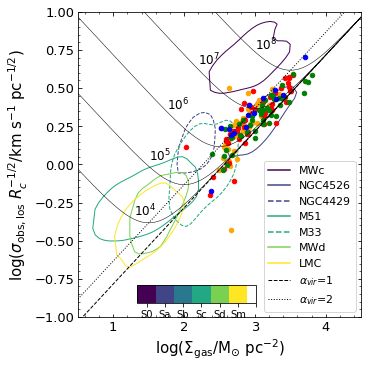

In [251]:
# For Figure 8 middle, I need to calculate virial mass. I can use equation 9 ($M_{vir}=5\sigma^2R_c/G$) = 1.1615e3*sigma^2*R_c

fig, axs = plt.subplots(1,1,figsize=(5,5),constrained_layout = True)#; axs = axs.ravel()



col_map = plt.get_cmap('viridis',6)

### PLOT NGC4429 PRESSURE ###



### PLOT UTOMO 2015 FIGURE 14 ###
# axs.fill(np.log10(NGC4526_p0),np.log10(NGC4526_p1),ec='k',label='NGC4526',fill=False)
# axs.fill(np.log10(MWd_p0),np.log10(MWd_p1),ec='b',label='MWd',fill=False)
# axs.fill(np.log10(MWc_p0),np.log10(MWc_p1),ec='c',label='MWc',fill=False)
# axs.fill(np.log10(LMC_p0),np.log10(LMC_p1),ec='r',label='LMC',fill=False)
# axs.fill(np.log10(M51_p0),np.log10(M51_p1),ec='g',label='M51',fill=False)
# axs.fill(np.log10(M33_p0),np.log10(M33_p1),ec='m',label='M33',fill=False)

axs.fill(np.log10(MWc_p0),np.log10(MWc_p1),ec=col_map(0),fill=False)
axs.fill(np.log10(NGC4526_p0),np.log10(NGC4526_p1),ec=col_map(1),fill=False)
axs.fill(np.log10(NGC4429_p.iloc[:,0]),np.log10(NGC4429_p.iloc[:,1]),ec=col_map(1),fill=False,ls='--')
axs.fill(np.log10(M51_p0),np.log10(M51_p1),ec=col_map(3),fill=False,ls='--')
axs.fill(np.log10(M33_p0),np.log10(M33_p1),ec=col_map(3),fill=False)
axs.fill(np.log10(MWd_p0),np.log10(MWd_p1),ec=col_map(4),fill=False)
axs.fill(np.log10(LMC_p0),np.log10(LMC_p1),ec=col_map(5),fill=False)


axs.plot([],[],c=col_map(0),label='MWc')
axs.plot([],[],c=col_map(1),label='NGC4526')
axs.plot([],[],c=col_map(1),label='NGC4429',ls='--')
axs.plot([],[],c=col_map(3),label='M51')
axs.plot([],[],c=col_map(3),label='M33',ls='--')
axs.plot([],[],c=col_map(4),label='MWd')
axs.plot([],[],c=col_map(5),label='LMC')

#axs[0].plot(np.log10(x0),np.log10(params2[1]*x1**params2[0]),'c')
#axs[0].plot(np.log10(x0),params5[0]*np.log10(x0)+ params5[1],'c')

### error plot ###
#print('dR',data_resol[:,4])
#print ('dsigma',data_resol[:,6])
###############

### ax2 pressure line ###

x2 = np.arange(1,100000)
surf = x2 * u.Msun * u.pc**-2
text=np.array([(1.1,-0.6),(1.3,-0.34),(1.5,0.02),(1.76,0.36),(2.2,0.65),(3,0.75)])

for i in range(4,9):
    P = 10**i*u.K *u.cm**-3*c.k_B.to('erg K-1')
    P = ((P.to('Msun cm-1 s-2')/(3*surf)).to('km2 s-2 pc-1'))

    y = np.sqrt(np.add(np.pi*G.value*x2/5,4*P.value))

    axs.plot(np.log10(x2),np.log10(y),'k-',lw=0.5)
    axs.text(text[i-3,0],text[i-3,1],r'10$^%s$' % i,fontsize=12)

y = np.sqrt(np.pi*G.value*x2/5) #alpha = 1
y2 = np.sqrt(np.pi*G.value*x2*2/5) #alpha =2
             
axs.plot(np.log10(x2),np.log10(y),'k--',lw=1,label=r'$\alpha_{vir}$=1')
axs.plot(np.log10(x2),np.log10(y2),'k:',lw=1,label=r'$\alpha_{vir}$=2')
                   
### plot all subplots

for i in (4,3,2,1):    
    #print (len(Rc[i]),len(vrms_c[i]))
    #axs[0].scatter(np.log10(Rc[i].astype('float')),np.log10(vrms_c[i].astype('float')),s=20,c=lines[i],label=name[i])

    
    #Mvir = 1.1615e3*Rc[i].astype('float')*vrms_c[i].astype('float').astype('float')**2 # not log scale
    #xerr = 0.434*(10**Mlum_c_err[i]/10**Mlum_c[i])
    #yerr = np.sqrt((Rc_err[i].astype('float')/Rc[i].astype('float'))**2 + 2*(vrms_c_err[i].astype('float')/vrms_c[i].astype('float'))**2)
    #yerr = 0.434*(yerr/Mvir_s)
    #print (yerr)
    #axs[1].errorbar(Mlum_c[i], np.log10(Mvir), xerr=xerr,yerr=yerr*0.434, capsize=3,mec='none',mfc=lines[i], ls='none', color='black',elinewidth=1,fmt='o')
    #axs[1].scatter(Mlum_c[i],np.log10(Mvir[i]),s=12,c=lines[i])
    
    #axs[1].scatter(Mlum_c[i],np.log10(1.1615e3*Rc[i].astype('float')*vrms_c[i].astype('float')**2),s=12,c=lines[i])



    axs.scatter(surf_c[i],np.log10(vrms_c[i].astype('float')/(Rc[i]).astype('float')**0.5),s=20,c=lines[i])


    


dr = np.mean(data_resol[:,4])
ds = np.mean(data_resol[:,6])

print (dr,ds)
print (np.log10(dr),np.log10(ds))


axs.set_xlim(0.5,4.5)
axs.set_ylim(-1,1)
axs.set_xlabel('log($\Sigma_{\mathrm{gas}}$/M$_{\odot}$ pc$^{-2}$)',fontsize=15)
axs.set_ylabel('log($\sigma_{\mathrm{obs,los}}$ $R_c^{-1/2}$/km s$^{-1}$ pc$^{-1/2}$)',fontsize=15)
    

#axs[0].tick_params(which='major', length=7)
#axs[0].tick_params(which='minor', length=10, color='r')
#axs[0].xaxis.set_minor_locator(MultipleLocator(5))


#axs.minorticks_on()

#axs.tick_params(direction='in',which='both',labelsize=13)  

axs.tick_params(direction='in',which='both',axis='both',labelsize=13,top='on',right='on')

#axs[0].tick_params(which='major', length=7)
#axs[0].tick_params(which='minor', length=10, color='r')
#axs[0].xaxis.set_minor_locator(MultipleLocator(5))

axs.minorticks_on()

axs.legend(loc=4,fontsize=11)


c_map_ax = fig.add_axes([0.37, 0.17, 0.33, 0.05])
#c_map_ax.axes.get_xaxis().set_visible(False)
c_map_ax.axes.get_yaxis().set_visible(False)

ticks=np.arange(7)
cbar=mpl.colorbar.ColorbarBase(c_map_ax, cmap=col_map, orientation = 'horizontal',norm=plt.Normalize(ticks[0],ticks[-1]))#,ticks=[0,1,2,3,4,5])#,ticks=[r'S0^+','Sa','Sb','Sc','Sd','Sm'])
#cbar.set_ticks([0,1,2,3,4,5])
cbar.set_ticks(ticks+0.5)
cbar.ax.set_xticklabels([r'S0','Sa','Sb','Sc','Sd','Sm',''])

#cmap = plt.cm.get_cmap('PiYG', 11)
#axs[0].imshow([[0,1],[0,1]],cmap=cmap)
#plt.colorbar()
#axs[1].xaxis.

#plt.tight_layout()
#plt.subplots_adjust(left=0.05,top=0.98,bottom=0.133,right=0.99,wspace=0.25)
#plt.savefig('fig_pressure_new_%s_allcombine.png' % folder,dpi=300, transparent=True)
plt.show()

# Need to fitting the data with errors
# for right panel, i need to find the pressure equilibrium curves

Larson relation slope 0.840134140444241
Larson relation zero point 0.6101265993790984
spearman 0.5913469687072647
spearman 0.5937519342092978
4.7302127659574476 1.3036170212765954
0.6748806758335981 0.11515002239623637


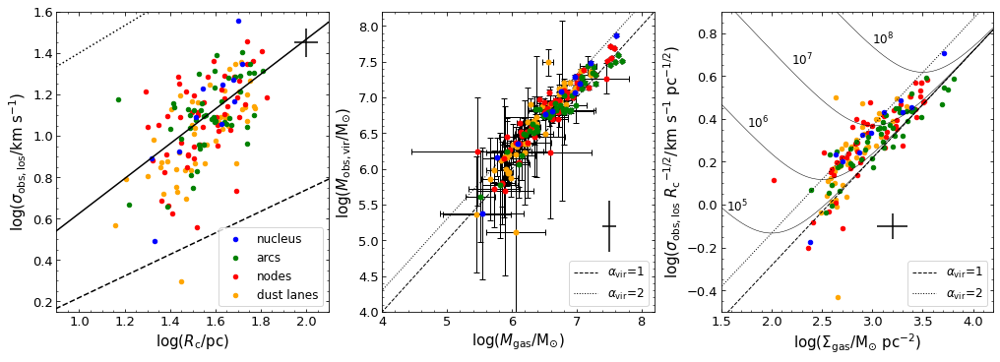

In [181]:
# For Figure 8 middle, I need to calculate virial mass. I can use equation 9 ($M_{vir}=5\sigma^2R_c/G$) = 1.1615e3*sigma^2*R_c

fig, axs = plt.subplots(1,3,figsize=(14,5),constrained_layout = True); axs = axs.ravel()


# ### PLOT NGC4429 PRESSURE ###

# axs[2].fill(np.log10(NGC4429_p.iloc[:,0]),np.log10(NGC4429_p.iloc[:,1]),ec='pink',label='NGC4429',fill=False)

# ### PLOT UTOMO 2015 FIGURE 14 ###
# axs[2].fill(np.log10(NGC4526_p0),np.log10(NGC4526_p1),ec='k',label='NGC4526',fill=False)
# axs[2].fill(np.log10(MWd_p0),np.log10(MWd_p1),ec='b',label='MWd',fill=False)
# axs[2].fill(np.log10(MWc_p0),np.log10(MWc_p1),ec='c',label='MWc',fill=False)
# axs[2].fill(np.log10(LMC_p0),np.log10(LMC_p1),ec='r',label='LMC',fill=False)
# axs[2].fill(np.log10(M51_p0),np.log10(M51_p1),ec='g',label='M51',fill=False)
# axs[2].fill(np.log10(M33_p0),np.log10(M33_p1),ec='m',label='M33',fill=False)


### ax0 fitting line & MW line ###

x0 = np.linspace(0.1,500,100)
# axs[0].plot(np.log10(x0),np.log10(params1[1]*x0**params1[0]),'k') # plot the results from the fitting with all data
# axs[0].plot(np.log10(x0),params8[1]+np.log10(x0)*params8[0],'k-.') # plot the results from the fitting with all data

axs[0].plot(np.log10(x0),np.log10(0.5*x0**0.52),'k--')#,label='MW disc') # reference, solomon 1987


### MW CMZ line ###

axs[0].plot(np.log10(x0),np.log10(5.5*x0**0.66),'k:')#,label='CMZ') # reference, kauffmann 2017

params5, params_cov5 = optimize.curve_fit(powerlaw_func,Rc_all,vrms_all)#,p0=[3,0.2])

print ('Larson relation slope',params5[0])
print ('Larson relation zero point',params5[1])

axs[0].plot(np.log10(x0),np.log10(params5[1]*x0**params5[0]),'k')

#axs[0].plot(np.log10(x0),np.log10(params2[1]*x1**params2[0]),'c')
#axs[0].plot(np.log10(x0),params5[0]*np.log10(x0)+ params5[1],'c')

### error plot ###
#print('dR',data_resol[:,4])
#print ('dsigma',data_resol[:,6])
###############

### ax2 pressure line ###

x2 = np.arange(1,100000)
surf = x2 * u.Msun * u.pc**-2
text=np.array([(1.1,-0.6),(1.3,-0.34),(1.55,-0.03),(1.76,0.36),(2.2,0.65),(3,0.75)])

for i in range(5,9):
    P = 10**i*u.K *u.cm**-3*c.k_B.to('erg K-1')
    P = ((P.to('Msun cm-1 s-2')/(3*surf)).to('km2 s-2 pc-1'))

    y = np.sqrt(np.add(np.pi*G.value*x2/5,4*P.value))

    axs[2].plot(np.log10(x2),np.log10(y),'k-',lw=0.5)
    axs[2].text(text[i-3,0],text[i-3,1],r'10$^%s$' % i,fontsize=12)

y = np.sqrt(np.pi*G.value*x2/5) #alpha = 1
y2 = np.sqrt(np.pi*G.value*x2*2/5) #alpha =2
             
axs[2].plot(np.log10(x2),np.log10(y),'k--',lw=1,label=r'$\alpha_{\mathrm{vir}}$=1')
axs[2].plot(np.log10(x2),np.log10(y2),'k:',lw=1,label=r'$\alpha_{\mathrm{vir}}$=2')
                   
### plot all subplots
#print (Rc[0])
print ('spearman',np.corrcoef(Rc[0].astype('float'),vrms_c[0].astype('float'))[0,1])
print ('spearman',np.corrcoef(np.log10(Rc[0].astype('float')),np.log10(vrms_c[0].astype('float')))[0,1])

for i in (4,3,2,1):    
    #print (len(Rc[i]),len(vrms_c[i]))
    axs[0].scatter(np.log10(Rc[i].astype('float')),np.log10(vrms_c[i].astype('float')),s=20,c=lines[i],label=name[i])

    
    Mvir = 1.1615e3*Rc[i].astype('float')*vrms_c[i].astype('float').astype('float')**2 # not log scale
    xerr = 0.434*(10**Mlum_c_err[i]/10**Mlum_c[i])
    yerr = np.sqrt((Rc_err[i].astype('float')/Rc[i].astype('float'))**2 + 2*(vrms_c_err[i].astype('float')/vrms_c[i].astype('float'))**2)
    #yerr = 0.434*(yerr/Mvir_s)
    #print (np.mean(yerr))
    #print (np.mean(xerr))
    axs[1].errorbar(Mlum_c[i], np.log10(Mvir), xerr=xerr,yerr=yerr*0.434, capsize=3,mec='none',mfc=lines[i], ls='none', color='black',elinewidth=1,fmt='o')
    #axs[1].scatter(Mlum_c[i],np.log10(Mvir[i]),s=12,c=lines[i])
    
    #axs[1].scatter(Mlum_c[i],np.log10(1.1615e3*Rc[i].astype('float')*vrms_c[i].astype('float')**2),s=12,c=lines[i])



    axs[2].scatter(surf_c[i],np.log10(vrms_c[i].astype('float')/(Rc[i]).astype('float')**0.5),s=20,c=lines[i])


    
# ax1 1-to-1 line & alpha=2 line

axs[0].errorbar(2,-0.2,xerr=0.1,yerr=0.2,ecolor='k')

#x1 = np.linspace(3.5,8.0,40)
x1 = np.linspace(3.5,8.0,40)
#axs[1].plot(np.log10(x1),np.log10(params2[1]*x1**params2[0]),'c')
axs[1].plot(x1,params2[0]*x1+ params2[1],'k')
axs[1].plot([3.5,8.5],[3.5,8.5],'k--',lw=1,label=r'$\alpha_{\mathrm{vir}}$=1')
axs[1].plot([3.5,8.5],[np.log10(2*10**3.5),np.log10(2*10**8.5)],'k:',lw=1,label=r'$\alpha_{\mathrm{vir}}$=2')

axs[0].set_xlim(0.9,2.1)
axs[0].set_ylim(0.15,1.6)
axs[0].set_xlabel('log($R\mathrm{_c}$/pc)',fontsize=15)
axs[0].set_ylabel('log($\sigma_{\mathrm{obs,los}}$/km s$^{-1}$)',fontsize=15)

dr = np.mean(data_resol[:,4])
ds = np.mean(data_resol[:,6])

print (dr,ds)
print (np.log10(dr),np.log10(ds))
#print('dR',data_resol[:,4])
#print ('dsigma',data_resol[:,6])

axs[1].set_xlim(4,8.2)
axs[1].set_ylim(4,8.2)
axs[1].set_xlabel('log($M_{\mathrm{gas}}$/M$_{\odot}$)',fontsize=15)
axs[1].set_ylabel('log($M_{\mathrm{obs,vir}}$/M$_{\odot}$)',fontsize=15)

axs[2].set_xlim(1.5,4.2)
axs[2].set_ylim(-0.5,0.9)
axs[2].set_xlabel('log($\Sigma_{\mathrm{gas}}$/M$_{\odot}$ pc$^{-2}$)',fontsize=15)
axs[2].set_ylabel('log($\sigma_{\mathrm{obs,los}}$ $R\mathrm{_c}^{-1/2}$/km s$^{-1}$ pc$^{-1/2}$)',fontsize=15)
    
axs[0].tick_params(direction='in',which='both',axis='both',labelsize=13,top='on',right='on')

#axs[0].tick_params(which='major', length=7)
#axs[0].tick_params(which='minor', length=10, color='r')
#axs[0].xaxis.set_minor_locator(MultipleLocator(5))

axs[0].errorbar(2.0,1.45,xerr=0.05,yerr=0.07,ecolor='k')
axs[1].errorbar(7.5,5.2,xerr=0.11,yerr=0.71/2,ecolor='k')
axs[2].errorbar(3.2,-0.1,xerr=0.15,yerr=0.06,ecolor='k')

axs[0].minorticks_on()
axs[1].minorticks_on()
axs[2].minorticks_on()
axs[1].tick_params(direction='in',which='both',labelsize=13,top='on',right='on')  
axs[2].tick_params(direction='in',which='both',labelsize=13,top='on',right='on')  



handles,labels = axs[0].get_legend_handles_labels()

#handles = [handles[0],handles[1],handles[5], handles[4], handles[2],handles[3]]
#labels = [labels[0],labels[1],labels[5], labels[4], labels[2],labels[3]]

handles = [handles[3], handles[2], handles[1],handles[0]]
labels = [labels[3], labels[2], labels[1],labels[0]]

axs[0].legend(handles,labels,loc=4,fontsize=12)

axs[1].legend(loc=4,fontsize=12)
axs[2].legend(loc=4,fontsize=12)


#axs[1].xaxis.

#plt.tight_layout()
#plt.subplots_adjust(left=0.05,top=0.98,bottom=0.133,right=0.99,wspace=0.25)
#plt.savefig('ngc613_larson.png',dpi=300, transparent=True)
plt.show()

# Need to fitting the data with errors
# for right panel, i need to find the pressure equilibrium curves

spearman 0.5913469687072647
spearman 0.5937519342092978
[14.18606564 -4.83567501]
7.052468354430377 1.6804430379746849
0.8483411460819805 0.22542379576262508


<ipython-input-252-6a5d99212b23>:60: RuntimeWarning: invalid value encountered in log10
  axs[0].plot(np.log10(x1),np.log10(params2[1]*x1**params2[0]),'c')


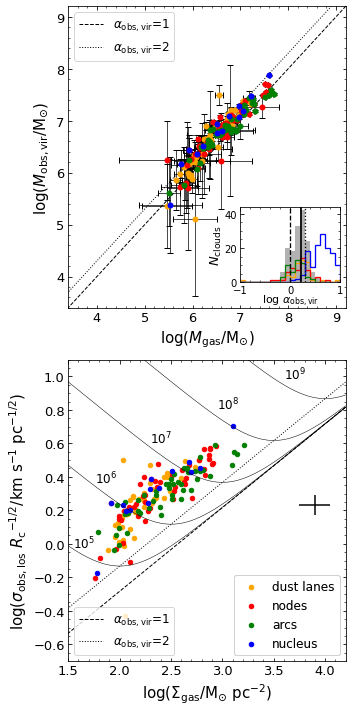

In [252]:
# For Figure 8 middle, I need to calculate virial mass. I can use equation 9 ($M_{vir}=5\sigma^2R_c/G$) = 1.1615e3*sigma^2*R_c

fig, axs = plt.subplots(2,1,figsize=(5,10),constrained_layout = True); axs = axs.ravel()


### ax2 pressure line ###

x2 = np.arange(1,100000)
surf = x2 * u.Msun * u.pc**-2
text=np.array([(1.1,-0.6),(1.3,-0.34),(1.55,-0.03),(1.76,0.36),(2.3,0.6),(2.95,0.8),(3.6,0.98)])

for i in range(5,10):
    P = 10**i*u.K *u.cm**-3*c.k_B.to('erg K-1')
    P = ((P.to('Msun cm-1 s-2')/(3*surf)).to('km2 s-2 pc-1'))

    y = np.sqrt(np.add(np.pi*G.value*x2/5,4*P.value))

    axs[1].plot(np.log10(x2),np.log10(y),'k-',lw=0.5)
    axs[1].text(text[i-3,0],text[i-3,1],r'10$^%s$' % i,fontsize=12)

y = np.sqrt(np.pi*G.value*x2/5) #alpha = 1
y2 = np.sqrt(np.pi*G.value*x2*2/5) #alpha =2
             
axs[1].plot(np.log10(x2),np.log10(y),'k--',lw=1,label=r'$\alpha_{\mathrm{obs,vir}}$=1')
axs[1].plot(np.log10(x2),np.log10(y2),'k:',lw=1,label=r'$\alpha_{\mathrm{obs,vir}}$=2')
                   
### plot all subplots
#print (Rc[0])
print ('spearman',np.corrcoef(Rc[0].astype('float'),vrms_c[0].astype('float'))[0,1])
print ('spearman',np.corrcoef(np.log10(Rc[0].astype('float')),np.log10(vrms_c[0].astype('float')))[0,1])

for i in (4,3,2,1):    
    #print (len(Rc[i]),len(vrms_c[i]))
    #axs[0].scatter(np.log10(Rc[i].astype('float')),np.log10(vrms_c[i].astype('float')),s=20,c=lines[i],label=name[i])

    
    Mvir = 1.1615e3*Rc[i].astype('float')*vrms_c[i].astype('float').astype('float')**2 # not log scale
    xerr = 0.434*(10**Mlum_c_err[i]/10**Mlum_c[i])
    yerr = np.sqrt((Rc_err[i].astype('float')/Rc[i].astype('float'))**2 + 2*(vrms_c_err[i].astype('float')/vrms_c[i].astype('float'))**2)
    #yerr = 0.434*(yerr/Mvir_s)
    #print (np.mean(yerr))
    #print (np.mean(xerr))
    axs[0].errorbar(Mlum_c[i], np.log10(Mvir), xerr=xerr,yerr=yerr*0.434, capsize=3,mec='none',mfc=lines[i], ls='none', color='black',elinewidth=0.7,fmt='o')
    #axs[1].scatter(Mlum_c[i],np.log10(Mvir[i]),s=12,c=lines[i])
    
    #axs[1].scatter(Mlum_c[i],np.log10(1.1615e3*Rc[i].astype('float')*vrms_c[i].astype('float')**2),s=12,c=lines[i])



    axs[1].scatter(np.log10(10**surf_c[i]),np.log10(vrms_c[i].astype('float')/(Rc[i]).astype('float')**0.5),s=20,c=lines[i],label=name[i])


    
# ax1 1-to-1 line & alpha=2 line

#axs[0].errorbar(2,-0.2,xerr=0.1,yerr=0.2,ecolor='k')

#x1 = np.linspace(3.5,8.0,40)
x1 = np.linspace(3.0,9.5,40)
axs[0].plot(np.log10(x1),np.log10(params2[1]*x1**params2[0]),'c')
axs[0].plot(x1,params2[0]*x1+ params2[1],'k')
axs[0].plot([3.0,9.5],[3.0,9.5],'k--',lw=1,label=r'$\alpha_{\mathrm{obs,vir}}$=1')
axs[0].plot([3.0,9.5],[np.log10(2*10**3.0),np.log10(2*10**9.5)],'k:',lw=1,label=r'$\alpha_{\mathrm{obs,vir}}$=2')
print (params2)

dr = np.mean(data_resol[:,4])
ds = np.mean(data_resol[:,6])

print (dr,ds)
print (np.log10(dr),np.log10(ds))
#print('dR',data_resol[:,4])
#print ('dsigma',data_resol[:,6])

axs[0].set_xlim(3.4,9.2)
axs[0].set_ylim(3.4,9.2)
axs[0].set_xlabel('log($M_{\mathrm{gas}}$/M$_{\odot}$)',fontsize=15)
axs[0].set_ylabel('log($M_{\mathrm{obs,vir}}$/M$_{\odot}$)',fontsize=15)

# axs[1].set_xlim(1.5,4.2)
# axs[1].set_ylim(-0.5,0.9)

axs[1].set_xlim(1.5,4.2)
axs[1].set_ylim(-0.7,1.1)
axs[1].set_xlabel('log($\Sigma_{\mathrm{gas}}$/M$_{\odot}$ pc$^{-2}$)',fontsize=15)
axs[1].set_ylabel('log($\sigma_{\mathrm{obs,los}}$ $R\mathrm{_c}^{-1/2}$/km s$^{-1}$ pc$^{-1/2}$)',fontsize=15)
    

#axs[0].errorbar(7.5,5.2,xerr=0.11,yerr=0.71/2,ecolor='k')
axs[1].errorbar(3.9,0.23,xerr=0.15,yerr=0.06,ecolor='k')


axs[0].minorticks_on()
axs[1].minorticks_on()
axs[0].tick_params(direction='in',which='both',labelsize=13,top='on',right='on')  
axs[1].tick_params(direction='in',which='both',labelsize=13,top='on',right='on')  


#fig, ax = plt.subplots()

ax = axs[0].inset_axes([0.62, 0.085, 0.36, 0.25])
#ax = axs[0].inset_axes([0.05, 0.7, 0.45, 0.25])
#ax.imshow(data[10:20, 10:20], extent=(10, 20, 10, 20), origin='lower')
ax.patch.set_alpha(0)
ax.hist(np.log10(alpha.astype('float')),bins=np.arange(-1,1.1,0.1),label=name[0],facecolor=lines[0],alpha=0.3)
#plt.hist(np.log10(alpha_arm.astype('float')),bins=np.arange(-1,1.1,0.1),edgecolor='r', histtype='step',label='arm')#,alpha=0.7)
ax.hist(np.log10(alpha_inflow.astype('float')),bins=np.arange(-1,1.1,0.1),edgecolor=lines[4], histtype='step',label=name[4],linewidth=1.3)#,alpha=0.7)
ax.hist(np.log10(alpha_node.astype('float')),bins=np.arange(-1,1.1,0.1),edgecolor=lines[3], histtype='step',label=name[3],linewidth=1.3)#,alpha=0.7)
ax.hist(np.log10(alpha_ring.astype('float')),bins=np.arange(-1,1.1,0.1),edgecolor=lines[2], histtype='step',label=name[2],linewidth=1.3)#,alpha=0.7)
ax.hist(np.log10(alpha_inner.astype('float')),bins=np.arange(-1,1.1,0.1),edgecolor=lines[1], histtype='step',label=name[1],linewidth=1.3)#,alpha=0.7)

ax.axvline(np.log10(alpha.mean()),c='k',ls='-',linewidth=1.7)
#ax.axvline(np.log10(np.median(alpha)),c='k',ls='-.')
ax.axvline(np.log10(2),c='k',ls=':',linewidth=1.3)#,label=r'$\alpha_{\mathrm{vir}}$=2')
ax.axvline(np.log10(1),c='k',ls='--',linewidth=1.3)#,label=r'$\alpha_{\mathrm{vir}}$=1')


ax.set_xlabel(r'log $\alpha_{\mathrm{obs,vir}}$',fontsize=11,labelpad=-3)
ax.set_ylabel(r'$N_{\mathrm{clouds}}$', fontsize=13,labelpad=0.5)
ax.set_xlim(-1,1)
#plt.legend(loc='upper left',fontsize=13)
ax.minorticks_on()
ax.tick_params(direction='in',which='both',top='on',right='on')

#### Put two legends #####

handles,labels = axs[1].get_legend_handles_labels()

handles1 = [handles[0],handles[1]]#,handles[7],handles[5],handles[6]]
labels1 = [labels[0],labels[1]]#,,labels[5],labels[6]]

legend1=axs[1].legend(handles1,labels1,loc='lower left',fontsize=12)

handles2 = [handles[2],handles[3],handles[4],handles[5]]
labels2 = [labels[2], labels[3],labels[4],labels[5]]#,labels[1]]

legend2 = axs[1].legend(handles2,labels2,loc='lower right',fontsize=12)


axs[1].add_artist(legend1)
axs[1].add_artist(legend2)


axs[0].legend(loc='upper left',fontsize=12)
#ax.legend(loc=2,fontsize=13)
#ax2.legend(handles2,labels2,loc='lower right',fontsize=10)

#axs[1].xaxis.

plt.tight_layout()
#plt.subplots_adjust(left=0.05,top=0.98,bottom=0.133,right=0.99,wspace=0.25)
#plt.savefig('/home/woorak/Dropbox/앱/Overleaf/WISDOM_GMCs_ngc613/ngc613_mass_virial.png',dpi=300, transparent=True)
plt.show()

# Need to fitting the data with errors
# for right panel, i need to find the pressure equilibrium curves

spearman 0.5913469687072647
spearman 0.5937519342092978
4 0.17462155968062917
0.08629829417113859
3 0.2216746475390373
0.12599918418928308
2 0.11111787779639594
0.05976206953871562
1 0.13844418646417414
0.07578217607380712
[0.93775416 0.58335269]
7.052468354430377 1.6804430379746849
0.8483411460819805 0.22542379576262508
6


<ipython-input-33-73e336ce2a83>:167: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


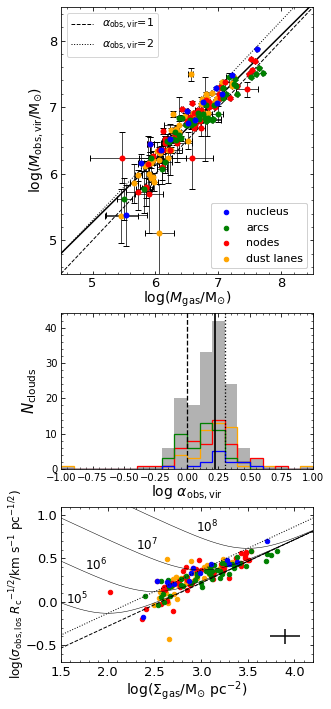

In [33]:
# For Figure 8 middle, I need to calculate virial mass. I can use equation 9 ($M_{vir}=5\sigma^2R_c/G$) = 1.1615e3*sigma^2*R_c

#fig, axs = plt.subplots(2,1,figsize=(5,10),constrained_layout = True); axs = axs.ravel()

fig = plt.figure(figsize=(5,10), facecolor='white') ## Top
gs1_nrows = 1; gs1_ncols = 1; 
gs1 = fig.add_gridspec(nrows=gs1_nrows, ncols=gs1_ncols, bottom=0.6, top=0.97,left=0.2) 

gs2_nrows = 2; gs2_ncols = 1;
gs2 = fig.add_gridspec(nrows=gs2_nrows, ncols=gs2_ncols, bottom=0.06, top=0.545,left=0.2,hspace=0.24)

axs0 = fig.add_subplot(gs1[0,0])
axs1 = fig.add_subplot(gs2[0,0])
axs2 = fig.add_subplot(gs2[1,0])

        
### ax2 pressure line ###

x2 = np.arange(1,100000)
surf = x2 * u.Msun * u.pc**-2
text=np.array([(1.1,-0.6),(1.3,-0.34),(1.55,-0.03),(1.76,0.36),(2.3,0.6),(2.95,0.8)])#,(3.6,0.98)])

for i in range(5,9):
    P = 10**i*u.K *u.cm**-3*c.k_B.to('erg K-1')
    P = ((P.to('Msun cm-1 s-2')/(3*surf)).to('km2 s-2 pc-1'))

    y = np.sqrt(np.add(np.pi*G.value*x2/5,4*P.value))

    axs2.plot(np.log10(x2),np.log10(y),'k-',lw=0.5)
    axs2.text(text[i-3,0],text[i-3,1],r'10$^%s$' % i,fontsize=12)

y = np.sqrt(np.pi*G.value*x2/5) #alpha = 1
y2 = np.sqrt(np.pi*G.value*x2*2/5) #alpha =2
             
axs2.plot(np.log10(x2),np.log10(y),'k--',lw=1,label=r'$\alpha_{\mathrm{obs,vir}}$=1')
axs2.plot(np.log10(x2),np.log10(y2),'k:',lw=1,label=r'$\alpha_{\mathrm{obs,vir}}$=2')
                   
### plot all subplots
#print (Rc[0])
print ('spearman',np.corrcoef(Rc[0].astype('float'),vrms_c[0].astype('float'))[0,1])
print ('spearman',np.corrcoef(np.log10(Rc[0].astype('float')),np.log10(vrms_c[0].astype('float')))[0,1])

for i in (4,3,2,1):    
    #print (len(Rc[i]),len(vrms_c[i]))
    #axs[0].scatter(np.log10(Rc[i].astype('float')),np.log10(vrms_c[i].astype('float')),s=20,c=lines[i],label=name[i])

    
    Mvir = 1.1615e3*Rc[i].astype('float')*vrms_c[i].astype('float').astype('float')**2 # not log scale
    xerr = 0.434*(10**Mlum_c_err[i]/10**Mlum_c[i])
    yerr = 0.434*np.sqrt((Rc_err[i].astype('float')/Rc[i].astype('float'))**2 + 2*(vrms_c_err[i].astype('float')/vrms_c[i].astype('float'))**2)
    #yerr = 0.434*(yerr/Mvir_s)
    print (i,np.mean(yerr))
    print (np.mean(xerr))
    axs0.errorbar(Mlum_c[i], np.log10(Mvir), xerr=xerr/2,yerr=yerr/2, capsize=3,mec='none',mfc=lines[i], ls='none', color='black',elinewidth=0.7,fmt='o')
    #axs[1].scatter(Mlum_c[i],np.log10(Mvir[i]),s=12,c=lines[i])
    
    #axs[1].scatter(Mlum_c[i],np.log10(1.1615e3*Rc[i].astype('float')*vrms_c[i].astype('float')**2),s=12,c=lines[i])



    axs2.scatter(np.log10(10**surf_c[i]),np.log10(vrms_c[i].astype('float')/(Rc[i]).astype('float')**0.5),s=20,c=lines[i],label=name[i])


    
# ax1 1-to-1 line & alpha=2 line

#axs[0].errorbar(2,-0.2,xerr=0.1,yerr=0.2,ecolor='k')

#x1 = np.linspace(3.5,8.0,40)
x1 = np.linspace(3.0,9.5,40)
axs0.plot(np.log10(x1),np.log10(params2[1]*x1**params2[0]),'c')
axs0.plot(x1,params2[0]*x1+ params2[1],'k')
axs0.plot([3.0,9.5],[3.0,9.5],'k--',lw=1,label=r'$\alpha_{\mathrm{obs,vir}}$=1')
axs0.plot([3.0,9.5],[np.log10(2*10**3.0),np.log10(2*10**9.5)],'k:',lw=1,label=r'$\alpha_{\mathrm{obs,vir}}$=2')
print (params2)

dr = np.mean(data_resol[:,4])
ds = np.mean(data_resol[:,6])

print (dr,ds)
print (np.log10(dr),np.log10(ds))
#print('dR',data_resol[:,4])
#print ('dsigma',data_resol[:,6])

axs0.set_xlim(4.5,8.5)
axs0.set_ylim(4.5,8.5)
axs0.set_xlabel('log($M_{\mathrm{gas}}$/M$_{\odot}$)',fontsize=14,labelpad=0)
axs0.set_ylabel('log($M_{\mathrm{obs,vir}}$/M$_{\odot}$)',fontsize=14)
axs0.set_yticks([5,6,7,8])
axs0.set_yticklabels(['5','6','7','8'])


#ax0.set_xticks([0.5-0.151*3,0.5-0.151*2,0.5-0.151*1,0.5,0.5+0.151,0.5+0.151*2,0.5+0.151*3])
#ax0.set_xticklabels(['-0.6','-0.4','-0.2','0','0.2','0.4','0.6'])


# axs[1].set_xlim(1.5,4.2)
# axs[1].set_ylim(-0.5,0.9)

axs2.set_xlim(1.5,4.2)
axs2.set_ylim(-0.7,1.1)
axs2.set_xlabel('log($\Sigma_{\mathrm{gas}}$/M$_{\odot}$ pc$^{-2}$)',fontsize=14,labelpad=0)
axs2.set_ylabel('log($\sigma_{\mathrm{obs,los}}$ $R\mathrm{_c}^{-1/2}$/km s$^{-1}$ pc$^{-1/2}$)',fontsize=12,labelpad=-1)
    

#axs[0].errorbar(7.5,5.2,xerr=0.11,yerr=0.71/2,ecolor='k')
axs2.errorbar(3.9,-0.4,xerr=0.16,yerr=0.09,ecolor='k')


axs0.minorticks_on()
axs2.minorticks_on()
axs0.tick_params(direction='in',which='both',labelsize=13,top='on',right='on')  
axs2.tick_params(direction='in',which='both',labelsize=13,top='on',right='on')  


#fig, ax = plt.subplots()

#ax = axs[0].inset_axes([0.62, 0.085, 0.36, 0.25])
#ax = axs[0].inset_axes([0.05, 0.7, 0.45, 0.25])
#ax.imshow(data[10:20, 10:20], extent=(10, 20, 10, 20), origin='lower')
axs1.patch.set_alpha(0)
axs1.hist(np.log10(alpha.astype('float')),bins=np.arange(-1,1.1,0.1),label=name[0],facecolor=lines[0],alpha=0.3)
#plt.hist(np.log10(alpha_arm.astype('float')),bins=np.arange(-1,1.1,0.1),edgecolor='r', histtype='step',label='arm')#,alpha=0.7)
axs1.hist(np.log10(alpha_inflow.astype('float')),bins=np.arange(-1,1.1,0.1),edgecolor=lines[4], histtype='step',label=name[4],linewidth=1.3)#,alpha=0.7)
axs1.hist(np.log10(alpha_node.astype('float')),bins=np.arange(-1,1.1,0.1),edgecolor=lines[3], histtype='step',label=name[3],linewidth=1.3)#,alpha=0.7)
axs1.hist(np.log10(alpha_ring.astype('float')),bins=np.arange(-1,1.1,0.1),edgecolor=lines[2], histtype='step',label=name[2],linewidth=1.3)#,alpha=0.7)
axs1.hist(np.log10(1.1615e3*Rc[i].astype('float')*vrms_c[i].astype('float').astype('float')**2/10**Mlum_c[1]),bins=np.arange(-1,1.1,0.1),edgecolor=lines[1], histtype='step',label=name[1],linewidth=1.3)#,alpha=0.7)

axs1.axvline(np.log10(alpha.mean()),c='k',ls='-',linewidth=1.7)
#ax.axvline(np.log10(np.median(alpha)),c='k',ls='-.')
axs1.axvline(np.log10(2),c='k',ls=':',linewidth=1.3)#,label=r'$\alpha_{\mathrm{vir}}$=2')
axs1.axvline(np.log10(1),c='k',ls='--',linewidth=1.3)#,label=r'$\alpha_{\mathrm{vir}}$=1')


axs1.set_xlabel(r'log $\alpha_{\mathrm{obs,vir}}$',fontsize=14,labelpad=0)
axs1.set_ylabel(r'$N_{\mathrm{clouds}}$', fontsize=15,labelpad=6)
axs1.set_xlim(-1,1)
#plt.legend(loc='upper left',fontsize=13)
axs1.minorticks_on()
axs1.tick_params(direction='in',which='both',top='on',right='on')

#### Put two legends #####

handles,labels = axs2.get_legend_handles_labels()
print (len(handles))
handles1 = [handles[0],handles[1]]#,handles[7],handles[5],handles[6]]
labels1 = [labels[0],labels[1]]#,,labels[5],labels[6]]

legend1=axs0.legend(handles1,labels1,loc='upper left',fontsize=11)

handles2 = [handles[5],handles[4],handles[3],handles[2]]
labels2 = [labels[5], labels[4],labels[3],labels[2]]#,labels[1]]

legend2 = axs0.legend(handles2,labels2,loc='lower right',fontsize=11)


axs0.add_artist(legend1)
axs0.add_artist(legend2)


#axs0.legend(loc='upper left',fontsize=12)
#ax.legend(loc=2,fontsize=13)
#ax2.legend(handles2,labels2,loc='lower right',fontsize=10)

#axs[1].xaxis.

plt.tight_layout()
#plt.subplots_adjust(left=0.05,top=0.98,bottom=0.133,right=0.99,wspace=0.25)
plt.savefig('/home/woorak/Dropbox/앱/Overleaf/[Paper] WISDOM_GMCs_ngc613/ngc613_mass_virial.png',dpi=300, transparent=True)
plt.show()

# Need to fitting the data with errors
# for right panel, i need to find the pressure equilibrium curves

Larson relation slope 0.70687311704408
Larson relation zero point 1.077856717065884
spearman 0.5860501673203844
spearman 0.5924032689770143
[array([44.41, 38.21, 55.94, 40.02, 32.81, 28.17, 23.05, 58.93, 32.93,
       40.59, 32.96, 42.2, 52.24, 30.85, 31.86, 24.45, 30.3, 39.53, 56.85,
       29.77, 34.52, 14.8, 33.84, 58.07, 36.01, 67.38, 24.54, 41.29,
       45.71, 29.66, 48.38, 31.23, 30.64, 26.02, 31.97, 42.61, 33.51,
       64.45, 24.29, 20.76, 51.04, 45.96, 16.62, 29.27, 53.59, 54.88,
       26.17, 55.1, 33.48, 55.05, 43.94, 27.66, 51.78, 50.76, 35.25,
       35.53, 30.27, 37.51, 52.43, 42.48, 43.6, 34.26, 19.71, 46.07, 45.4,
       34.38, 47.19, 33.23, 32.1, 24.35, 27.56, 33.75, 31.25, 14.46,
       49.33, 21.18, 34.2, 31.16, 59.6, 31.53, 42.04, 44.13, 43.66, 45.38,
       54.88, 42.74, 51.24, 22.96, 31.46, 38.97, 43.57, 35.31, 28.26,
       43.5, 41.1, 40.02, 58.99, 18.3, 54.95, 50.07, 56.79, 55.01, 48.14,
       27.91, 35.67, 42.39, 46.67, 35.34, 25.19, 45.14, 32.4, 40.1, 53.59

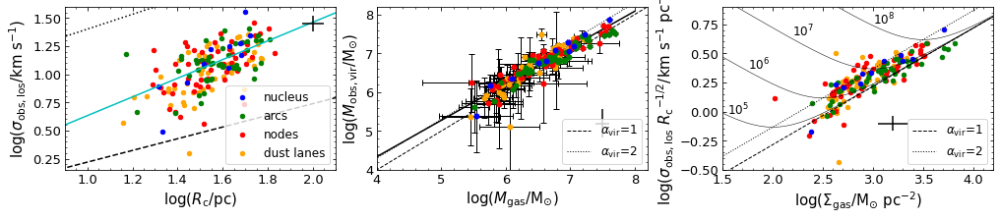

In [293]:
# For Figure 8 middle, I need to calculate virial mass. I can use equation 9 ($M_{vir}=5\sigma^2R_c/G$) = 1.1615e3*sigma^2*R_c

fig, axs = plt.subplots(1,3,figsize=(14,3),constrained_layout = True); axs = axs.ravel()


print ('Larson relation slope',params1[0])
print ('Larson relation zero point',params1[1])


# ### PLOT NGC4429 LARSON ###
# x = np.log10(data_resol[:,3].astype('float'))
# y = np.log10(data_resol[:,5].astype('float'))

# k = gaussian_kde(np.vstack([np.log10(data_resol[:,3].astype('float')),np.log10(data_resol[:,5].astype('float'))]))
# xi, yi = np.mgrid[x.min():x.max():x.size**0.5*1j,y.min():y.max():y.size**0.5*1j]
# zi = k(np.vstack([xi.flatten(), yi.flatten()]))

# #set zi to 0-1 scale
# zi = (zi-zi.min())/(zi.max() - zi.min())
# zi =zi.reshape(xi.shape)

# #set up plot
# origin = 'lower'
# levels = [0,0.3,0.68]

# CS = axs[0].contour(xi, yi, zi,levels = levels,colors='pink', linewidths=1,origin=origin,clabel='NGC4429')
# axs[0].plot([],[],label='NGC4429',c='pink')

# ### PLOT NGC4429 PRESSURE ###

# axs[2].fill(np.log10(NGC4429_p.iloc[:,0]),np.log10(NGC4429_p.iloc[:,1]),ec='pink',label='NGC4429',fill=False)

# ### PLOT UTOMO 2015 FIGURE 14 ###
# axs[2].fill(np.log10(NGC4526_p0),np.log10(NGC4526_p1),ec='k',label='NGC4526',fill=False)
# axs[2].fill(np.log10(MWd_p0),np.log10(MWd_p1),ec='b',label='MWd',fill=False)
# axs[2].fill(np.log10(MWc_p0),np.log10(MWc_p1),ec='c',label='MWc',fill=False)
# axs[2].fill(np.log10(LMC_p0),np.log10(LMC_p1),ec='r',label='LMC',fill=False)
# axs[2].fill(np.log10(M51_p0),np.log10(M51_p1),ec='g',label='M51',fill=False)
# axs[2].fill(np.log10(M33_p0),np.log10(M33_p1),ec='m',label='M33',fill=False)


### ax0 fitting line & MW line ###

x0 = np.linspace(0.1,500,100)
# axs[0].plot(np.log10(x0),np.log10(params1[1]*x0**params1[0]),'k') # plot the results from the fitting with all data
# axs[0].plot(np.log10(x0),params8[1]+np.log10(x0)*params8[0],'k-.') # plot the results from the fitting with all data

axs[0].plot(np.log10(x0),np.log10(0.5*x0**0.52),'k--')#,label='MW disc') # reference, solomon 1987


### MW CMZ line ###

axs[0].plot(np.log10(x0),np.log10(5.5*x0**0.66),'k:')#,label='CMZ') # reference, kauffmann 2017

params5, params_cov5 = optimize.curve_fit(powerlaw_func,Rc_all,vrms_all)#,p0=[3,0.2])


axs[0].plot(np.log10(x0),np.log10(params5[1]*x0**params5[0]),'c')
#axs[0].plot(np.log10(x0),params5[0]*np.log10(x0)+ params5[1],'c')

### error plot ###
#print('dR',data_resol[:,4])
#print ('dsigma',data_resol[:,6])
###############

### ax2 pressure line ###

x2 = np.arange(1,100000)
surf = x2 * u.Msun * u.pc**-2
text=np.array([(1.1,-0.6),(1.3,-0.34),(1.55,-0.03),(1.76,0.36),(2.2,0.65),(3,0.75)])

for i in range(5,9):
    P = 10**i*u.K *u.cm**-3*c.k_B.to('erg K-1')
    P = ((P.to('Msun cm-1 s-2')/(3*surf)).to('km2 s-2 pc-1'))

    y = np.sqrt(np.add(np.pi*G.value*x2/5,4*P.value))

    axs[2].plot(np.log10(x2),np.log10(y),'k-',lw=0.5)
    axs[2].text(text[i-3,0],text[i-3,1],r'10$^%s$' % i,fontsize=12)

y = np.sqrt(np.pi*G.value*x2/5) #alpha = 1
y2 = np.sqrt(np.pi*G.value*x2*2/5) #alpha =2
             
axs[2].plot(np.log10(x2),np.log10(y),'k--',lw=1,label=r'$\alpha_{\mathrm{vir}}$=1')
axs[2].plot(np.log10(x2),np.log10(y2),'k:',lw=1,label=r'$\alpha_{\mathrm{vir}}$=2')
                   
### plot all subplots
#print (Rc[0])
print ('spearman',np.corrcoef(Rc[0].astype('float'),vrms_c[0].astype('float'))[0,1])
print ('spearman',np.corrcoef(np.log10(Rc[0].astype('float')),np.log10(vrms_c[0].astype('float')))[0,1])
print (Rc)
for i in (4,3,2,1):    
    print (len(Rc[i]),len(vrms_c[i]))
    axs[0].scatter(np.log10(Rc[i].astype('float')),np.log10(vrms_c[i].astype('float')),s=20,c=lines[i],label=name[i])

    
    Mvir = 1.1615e3*Rc[i].astype('float')*vrms_c[i].astype('float').astype('float')**2 # not log scale
    xerr = 0.434*(10**Mlum_c_err[i]/10**Mlum_c[i])
    yerr = np.sqrt((Rc_err[i].astype('float')/Rc[i].astype('float'))**2 + 2*(vrms_c_err[i].astype('float')/vrms_c[i].astype('float'))**2)
    #yerr = 0.434*(yerr/Mvir_s)
    #print (np.mean(yerr))
    #print (np.mean(xerr))
    axs[1].errorbar(Mlum_c[i], np.log10(Mvir), xerr=xerr,yerr=yerr*0.434, capsize=3,mec='none',mfc=lines[i], ls='none', color='black',elinewidth=1,fmt='o')
    #axs[1].scatter(Mlum_c[i],np.log10(Mvir[i]),s=12,c=lines[i])
    
    #axs[1].scatter(Mlum_c[i],np.log10(1.1615e3*Rc[i].astype('float')*vrms_c[i].astype('float')**2),s=12,c=lines[i])



    axs[2].scatter(surf_c[i],np.log10(vrms_c[i].astype('float')/(Rc[i]).astype('float')**0.5),s=20,c=lines[i])


    
# ax1 1-to-1 line & alpha=2 line

axs[0].errorbar(2,-0.2,xerr=0.1,yerr=0.2,ecolor='k')

#x1 = np.linspace(3.5,8.0,40)
x1 = np.linspace(3.5,8.0,40)
#axs[1].plot(np.log10(x1),np.log10(params2[1]*x1**params2[0]),'c')
axs[1].plot(x1,params2[0]*x1+ params2[1],'k')
axs[1].plot([3.5,8.5],[3.5,8.5],'k--',lw=1,label=r'$\alpha_{\mathrm{vir}}$=1')
axs[1].plot([3.5,8.5],[np.log10(2*10**3.5),np.log10(2*10**8.5)],'k:',lw=1,label=r'$\alpha_{\mathrm{vir}}$=2')

axs[0].set_xlim(0.9,2.1)
axs[0].set_ylim(0.15,1.6)
axs[0].set_xlabel('log($R\mathrm{_c}$/pc)',fontsize=15)
axs[0].set_ylabel('log($\sigma_{\mathrm{obs,los}}$/km s$^{-1}$)',fontsize=15)

dr = np.mean(data_resol[:,4])
ds = np.mean(data_resol[:,6])

print (dr,ds)
print (np.log10(dr),np.log10(ds))
#print('dR',data_resol[:,4])
#print ('dsigma',data_resol[:,6])

axs[1].set_xlim(4,8.2)
axs[1].set_ylim(4,8.2)
axs[1].set_xlabel('log($M_{\mathrm{gas}}$/M$_{\odot}$)',fontsize=15)
axs[1].set_ylabel('log($M_{\mathrm{obs,vir}}$/M$_{\odot}$)',fontsize=15)

axs[2].set_xlim(1.5,4.2)
axs[2].set_ylim(-0.5,0.9)
axs[2].set_xlabel('log($\Sigma_{\mathrm{gas}}$/M$_{\odot}$ pc$^{-2}$)',fontsize=15)
axs[2].set_ylabel('log($\sigma_{\mathrm{obs,los}}$ $R\mathrm{_c}^{-1/2}$/km s$^{-1}$ pc$^{-1/2}$)',fontsize=15)
    
axs[0].tick_params(direction='in',which='both',axis='both',labelsize=13,top='on',right='on')

#axs[0].tick_params(which='major', length=7)
#axs[0].tick_params(which='minor', length=10, color='r')
#axs[0].xaxis.set_minor_locator(MultipleLocator(5))

axs[0].errorbar(2.0,1.45,xerr=0.05,yerr=0.07,ecolor='k')
axs[1].errorbar(7.5,5.2,xerr=0.11,yerr=0.71/2,ecolor='k')
axs[2].errorbar(3.2,-0.1,xerr=0.15,yerr=0.06,ecolor='k')

axs[0].minorticks_on()
axs[1].minorticks_on()
axs[2].minorticks_on()
axs[1].tick_params(direction='in',which='both',labelsize=13,top='on',right='on')  
axs[2].tick_params(direction='in',which='both',labelsize=13,top='on',right='on')  



handles,labels = axs[0].get_legend_handles_labels()

#handles = [handles[0],handles[1],handles[5], handles[4], handles[2],handles[3]]
#labels = [labels[0],labels[1],labels[5], labels[4], labels[2],labels[3]]

handles = [handles[3], handles[2], handles[1],handles[0]]
labels = [labels[3], labels[2], labels[1],labels[0]]

axs[0].legend(handles,labels,loc=4,fontsize=12)

axs[1].legend(loc=4,fontsize=12)
axs[2].legend(loc=4,fontsize=12)


#axs[1].xaxis.

#plt.tight_layout()
#plt.subplots_adjust(left=0.05,top=0.98,bottom=0.133,right=0.99,wspace=0.25)
#plt.savefig('ngc613_larson.png',dpi=300, transparent=True)
plt.show()

# Need to fitting the data with errors
# for right panel, i need to find the pressure equilibrium curves

# Virial parameter

158
93
36
1.6564941908659558
1.5832461542351397
inner 1.9218534694434177
ring 1.386152374725113
node 1.7262181929949285
spiral 1.8393716820949235


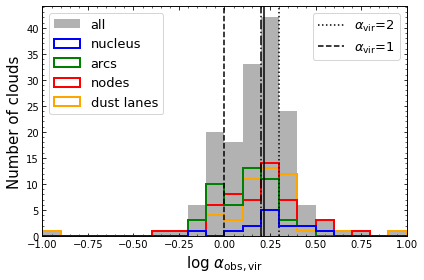

93
36
29
(48,)
(51,)


In [26]:
# For alpha Figure 8 middle, I need to calculate virial mass. I can use equation 9 ($M_{vir}=5\sigma^2R_c/G$) = 1.1615e3*sigma^2*R_c

Mvir = 1/bG.value*Rc[0]*vrms_c[0]**2
alpha = Mvir/10**Mlum_c[0]

print (len(alpha))
print (len(alpha[(alpha>=1)&(alpha<=2)]))
print (len(alpha[(alpha>2)]))

Mvir_inner = 1/bG.value*Rc[1]*vrms_c[1]**2
alpha_inner = Mvir_inner/10**Mlum_c[1]

Mvir_ring = 1/bG.value*Rc[2]*vrms_c[2]**2
alpha_ring = Mvir_ring/10**Mlum_c[2]

Mvir_node = 1/bG.value*Rc[3]*vrms_c[3]**2
alpha_node = Mvir_node/10**Mlum_c[3]

Mvir_inflow = 1/bG.value*Rc[4]*vrms_c[4]**2
alpha_inflow = Mvir_inflow/10**Mlum_c[4]

# Mvir_arm = 1/bG.value*Rc[3]*vrms_c[3]**2
# alpha_arm = Mvir_arm/10**Mlum_c[3]
# #print (10**Mlum_c[0]/Mvir)

#print (Mvir.shape)
print (alpha.mean())
print (np.median(alpha))
print ('inner',alpha_inner.mean())
print ('ring',alpha_ring.mean())
print ('node',alpha_node.mean())
print ('spiral',alpha_inflow.mean())
#print (alpha_arm.mean())

fig, ax = plt.subplots()

ax.hist(np.log10(alpha.astype('float')),bins=np.arange(-1,1.1,0.1),label=name[0],facecolor=lines[0],alpha=0.3)
#plt.hist(np.log10(alpha_arm.astype('float')),bins=np.arange(-1,1.1,0.1),edgecolor='r', histtype='step',label='arm')#,alpha=0.7)
ax.hist(np.log10(alpha_inflow.astype('float')),bins=np.arange(-1,1.1,0.1),edgecolor=lines[4], histtype='step',label=name[4],linewidth=2)#,alpha=0.7)
ax.hist(np.log10(alpha_node.astype('float')),bins=np.arange(-1,1.1,0.1),edgecolor=lines[3], histtype='step',label=name[3],linewidth=2)#,alpha=0.7)
ax.hist(np.log10(alpha_ring.astype('float')),bins=np.arange(-1,1.1,0.1),edgecolor=lines[2], histtype='step',label=name[2],linewidth=2)#,alpha=0.7)
ax.hist(np.log10(alpha_inner.astype('float')),bins=np.arange(-1,1.1,0.1),edgecolor=lines[1], histtype='step',label=name[1],linewidth=2)#,alpha=0.7)

# ax.hist((alpha.astype('float')),bins=np.logspace(np.log10(0.1),np.log10(10), 20),label=name[0],facecolor=lines[0],alpha=0.3)
# #plt.hist(np.log10(alpha_arm.astype('float')),bins=np.arange(-1,1.1,0.1),edgecolor='r', histtype='step',label='arm')#,alpha=0.7)
# ax.hist((alpha_inflow.astype('float')),bins=np.logspace(np.log10(0.1),np.log10(10), 20),edgecolor=lines[4], histtype='step',label=name[4],linewidth=2)#,alpha=0.7)
# ax.hist((alpha_node.astype('float')),bins=np.logspace(np.log10(0.1),np.log10(10), 20),edgecolor=lines[3], histtype='step',label=name[3],linewidth=2)#,alpha=0.7)
# ax.hist((alpha_ring.astype('float')),bins=np.logspace(np.log10(0.1),np.log10(10), 20),edgecolor=lines[2], histtype='step',label=name[2],linewidth=2)#,alpha=0.7)
# ax.hist((alpha_inner.astype('float')),bins=np.logspace(np.log10(0.1),np.log10(10), 20),edgecolor=lines[1], histtype='step',label=name[1],linewidth=2)#,alpha=0.7)

#ax.set_xscale('log')

ax2 = ax.twinx()
# for ss, sty in enumerate(styles):
#     ax2.plot(np.NaN, np.NaN, ls=styles[ss],
#              label='style ' + str(ss), c='black')
ax2.get_yaxis().set_visible(False)


ax2.axvline(np.log10(alpha.mean()),c='k',ls='-')
ax2.axvline(np.log10(np.median(alpha)),c='k',ls='-.')
ax2.axvline(np.log10(2),c='k',ls=':',label=r'$\alpha_{\mathrm{vir}}$=2')
ax2.axvline(np.log10(1),c='k',ls='--',label=r'$\alpha_{\mathrm{vir}}$=1')
#ax2.set_xscale('log')
handles,labels = ax.get_legend_handles_labels()

handles = [handles[0],handles[4], handles[3], handles[2],handles[1]]
labels = [labels[0],labels[4], labels[3], labels[2],labels[1]]

ax.legend(handles,labels,loc=2,fontsize=13)


#ax.legend(loc=2,fontsize=13)
ax2.legend(loc=1,fontsize=13)

ax.set_xlabel(r'log $\alpha_{\mathrm{obs,vir}}$',fontsize=15)
ax.set_ylabel('Number of clouds', fontsize=15)
ax.set_xlim(-1,1)
#plt.legend(loc='upper left',fontsize=13)
ax.minorticks_on()
ax.tick_params(direction='in',which='both',top='on',right='on')
plt.tight_layout()
#plt.savefig('ngc613_alpha.png',dpi=200)
plt.show()

print (len(alpha[(alpha>=1)& (alpha<=2)]))
print (len(alpha[(alpha>2)]))
print (len(alpha[(alpha<1)]))
print (alpha_ring.shape)
print (alpha_node.shape)

## Virial paramter vs location

Text(0, 0.5, '$\\Delta$ Dec (arcsec)')

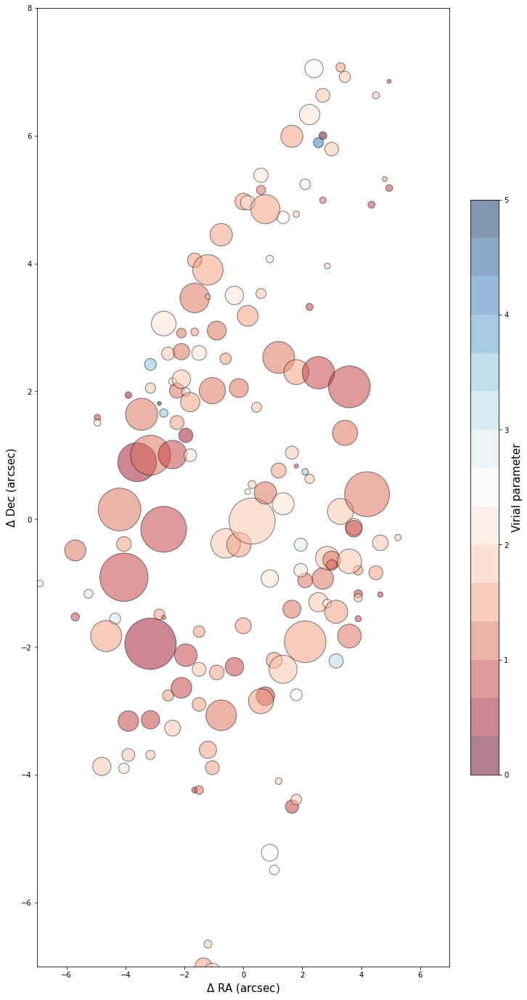

In [141]:

plt.figure(figsize=(10,19),constrained_layout = True)

#extent = [-9.8,15,-9.6,8.7]
extent = [-13,12.3,-13.0,12.0]
#print (Mlum_all.shape)
#print (mom0[0].data.max())
#im = plt.imshow(mom0[0].data,origin='lower',extent=extent,cmap='gray_r',vmin=-300,vmax=500)
#plt.imshow(velmap,origin='lower',cmap='jet',vmin=1200,vmax=1600)
#plt.colorbar()
#plt.contour(velmap,levels=np.arange(1200,1600,30),colors='m',extent=extent)
#print (len(ra_new))
#print (len(alpha))
#for i in range(0,len(ra_new)-1):
  #print (x[i],y[i],angles[i])
cmap = plt.get_cmap('RdBu', 15)

im = plt.scatter(-ra_off_new,dec_off_new,c=alpha,ec='k', cmap=cmap,s=10**Mlum_all/1e4,vmin=0,vmax=5,alpha=0.5)
cb=plt.colorbar(im,shrink=0.6)
cb.set_label('Virial parameter',fontsize=15)
plt.xlim(-7,7)
plt.ylim(-7,8)
plt.xlabel('$\Delta$ RA (arcsec)',fontsize=15)
plt.ylabel('$\Delta$ Dec (arcsec)',fontsize=15)
#plt.tight_layout()
#plt.savefig('ngc613_alpha_2d.png',dpi=300)

  #draw_line(-ra_new[i],dec_new[i],theta_all[i],Omega_all[i]*4)
#plt.colorbar(vmin=-2,max=5)

## Virial paratmer vs cloud properties

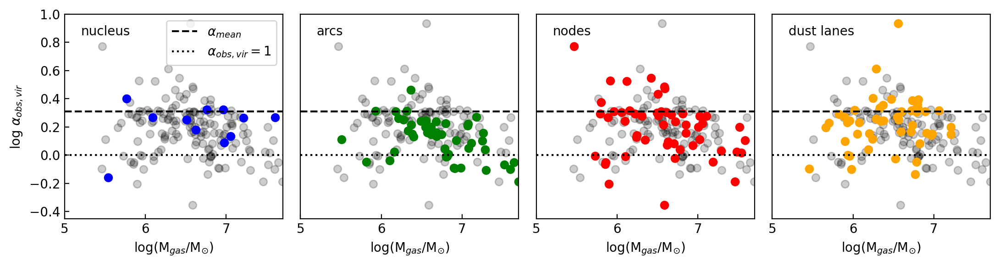

[0.19581327 1.02661705]
[0.14640794 1.1734795 ]
[0.14965812 0.4800497 ]
1
[0.19581327 1.02661705]
[-0.09721791  1.73877994]
[0.1179963  0.52013038]
2
[0.19581327 1.02661705]
[0.04855454 1.55298437]
[0.15455158 0.60520667]
3
[0.19581327 1.02661705]
[0.81936564 0.25157672]
[0.19413598 0.12893798]
4


<ipython-input-137-2092702f33df>:51: RuntimeWarning: divide by zero encountered in log10
  axs[i-1].plot(np.log10(xx),np.log10(params2[1]*xx**params2[0]),c='k',ls=':')
<ipython-input-137-2092702f33df>:54: RuntimeWarning: divide by zero encountered in log10
  axs[i-1].plot(np.log10(xx),np.log10(params2[1]*xx**params2[0]),c='k',ls='--')
<ipython-input-137-2092702f33df>:54: RuntimeWarning: divide by zero encountered in power
  axs[i-1].plot(np.log10(xx),np.log10(params2[1]*xx**params2[0]),c='k',ls='--')


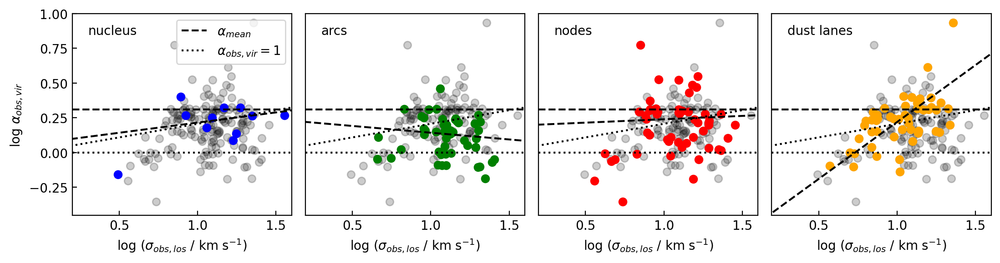

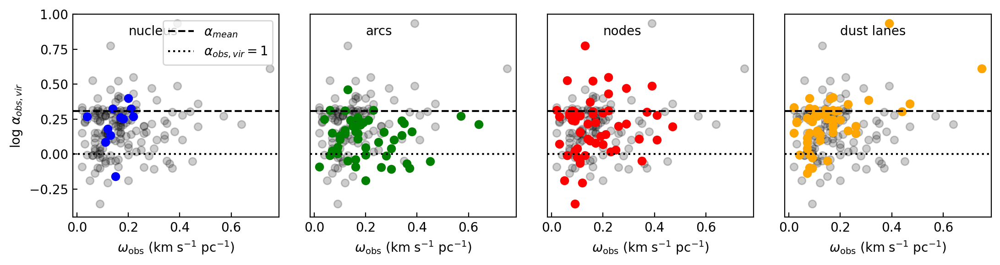

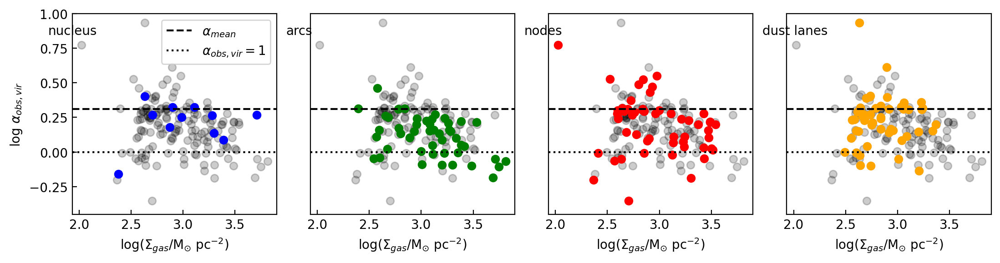

In [137]:
## alpha vs Mgas or Mvir
plt.rcParams["xtick.direction"] = "in"
plt.rcParams["ytick.direction"] = "in"
alpha_all = [alpha,alpha_inner,alpha_ring,alpha_node,alpha_inflow]
Mvir_all = [Mvir,Mvir_inner,Mvir_ring,Mvir_node,Mvir_inflow]

fig, axs = plt.subplots(1,4,figsize=(11,3),dpi=200)
axs = axs.ravel()
for i in (1,2,3,4):
    axs[i-1].scatter(Mlum_c[0],np.log10(alpha_all[0].astype('float')),c='k',alpha=0.2)
    axs[i-1].scatter(Mlum_c[i],np.log10(alpha_all[i].astype('float')),c=lines[i])
    axs[i-1].text(5.2,0.85,name[i])
    axs[i-1].set_ylim(-0.45,1)
    axs[i-1].set_xlim(5,7.7)
    axs[i-1].axhline(np.log10(2.04),c='k',ls='--')
    axs[i-1].axhline(np.log10(1),c='k',ls=':')
    axs[i-1].set_xlabel('log(M$_{gas}$/M$_{\odot}$)')#,fontsize=15)
axs[1].set_yticks([]);axs[2].set_yticks([]);axs[3].set_yticks([])    
axs[0].plot([],[],c='k',ls='--',label=r'$\alpha_{mean}$')
axs[0].plot([],[],c='k',ls=':',label=r'$\alpha_{obs,vir}=1$')
axs[0].legend()
axs[0].set_ylabel(r'log $\alpha_{obs,vir}$')#,fontsize=15)
plt.tight_layout()
plt.show()

#params2, params_cov2 = optimize.curve_fit(powerlaw_func,vrms_c[0],alpha_all[0])#,p0=[1.2,1])

xx = np.arange(0,100,1)
#print (params2)

fig, axs = plt.subplots(1,4,figsize=(11,3),dpi=200)
axs = axs.ravel()
for i in (1,2,3,4):
    axs[i-1].scatter(np.log10(vrms_c[0].astype('float')),np.log10(alpha_all[0].astype('float')),c='k',alpha=0.2)
    axs[i-1].scatter(np.log10(vrms_c[i].astype('float')),np.log10(alpha_all[i].astype('float')),c=lines[i])
    axs[i-1].text(0.3,0.85,name[i])
    axs[i-1].set_ylim(-0.45,1)
    axs[i-1].set_xlim(0.2,1.6)
    axs[i-1].axhline(np.log10(2.04),c='k',ls='--')
    axs[i-1].axhline(np.log10(1),c='k',ls=':')
    axs[i-1].set_xlabel(r'log ($\sigma_{obs,los}$ / km s$^{-1}$)')#,fontsize=15)
    params2, params_cov2 = optimize.curve_fit(powerlaw_func,vrms_c[0],alpha_all[0])#,p0=[1.2,1])
    print (params2)
    #print (np.sqrt(np.diag(params_cov2)))
    axs[i-1].plot(np.log10(xx),np.log10(params2[1]*xx**params2[0]),c='k',ls=':')
    
    params2, params_cov2 = optimize.curve_fit(powerlaw_func,vrms_c[i],alpha_all[i])#,p0=[1.2,1])
    axs[i-1].plot(np.log10(xx),np.log10(params2[1]*xx**params2[0]),c='k',ls='--')
    print (params2)
    print (np.sqrt(np.diag(params_cov2)))
    print (i)
    
axs[1].set_yticks([]);axs[2].set_yticks([]);axs[3].set_yticks([])    
axs[0].plot([],[],c='k',ls='--',label=r'$\alpha_{mean}$')
axs[0].plot([],[],c='k',ls=':',label=r'$\alpha_{obs,vir}=1$')
axs[0].legend()
axs[0].set_ylabel(r'log $\alpha_{obs,vir}$')#,fontsize=15)
plt.tight_layout()
plt.show()

fig, axs = plt.subplots(1,4,figsize=(11,3),dpi=200)
axs = axs.ravel()
for i in (1,2,3,4):
    axs[i-1].scatter((Om_c[0].astype('float')),np.log10(alpha_all[0].astype('float')),c='k',alpha=0.2)
    axs[i-1].scatter((Om_c[i].astype('float')),np.log10(alpha_all[i].astype('float')),c=lines[i])
    axs[i-1].text(0.2,0.85,name[i])
    axs[i-1].set_ylim(-0.45,1)
    #axs[i-1].set_xlim(0,1.5)
    axs[i-1].axhline(np.log10(2.04),c='k',ls='--')
    axs[i-1].axhline(np.log10(1),c='k',ls=':')
    axs[i-1].set_xlabel(r'$\omega_{\mathrm{obs}}$ (km s$^{-1}$ pc$^{-1}$)')#,fontsize=15)
axs[1].set_yticks([]);axs[2].set_yticks([]);axs[3].set_yticks([])    
axs[0].plot([],[],c='k',ls='--',label=r'$\alpha_{mean}$')
axs[0].plot([],[],c='k',ls=':',label=r'$\alpha_{obs,vir}=1$')
axs[0].legend()
axs[0].set_ylabel(r'log $\alpha_{obs,vir}$')#,fontsize=15)
plt.tight_layout()
plt.show()



fig, axs = plt.subplots(1,4,figsize=(11,3),dpi=200)
axs = axs.ravel()
for i in (1,2,3,4):
    axs[i-1].scatter(surf_c[0],np.log10(alpha_all[0].astype('float')),c='k',alpha=0.2)
    axs[i-1].scatter(surf_c[i],np.log10(alpha_all[i].astype('float')),c=lines[i])
    axs[i-1].text(1.7,0.85,name[i])
    axs[i-1].set_ylim(-0.45,1)
    #axs[i-1].set_xlim(5,100)
    axs[i-1].axhline(np.log10(2.04),c='k',ls='--')
    axs[i-1].axhline(np.log10(1),c='k',ls=':')
    axs[i-1].set_xlabel(r'log($\Sigma_{gas}$/M$_{\odot}$ pc$^{-2}$)')#,fontsize=15)
axs[1].set_yticks([]);axs[2].set_yticks([]);axs[3].set_yticks([])    
axs[0].plot([],[],c='k',ls='--',label=r'$\alpha_{mean}$')
axs[0].plot([],[],c='k',ls=':',label=r'$\alpha_{obs,vir}=1$')
axs[0].legend()
axs[0].set_ylabel(r'log $\alpha_{obs,vir}$')#,fontsize=15)
plt.tight_layout()
plt.show()
# fig, axs = plt.subplots(1,4,figsize=(11,3))
# axs = axs.ravel()

# for i in (1,2,3,4):
#     axs[i].scatter(np.log10(Mvir_all[i].astype('float')),np.log10(alpha_all[i].astype('float')),c=lines[i])
#     axs[i].set_ylim(-0.5,1)
#     axs[i].set_xlim(5,7.7)
#     axs[i].axhline(np.log10(2.04),c='k',ls='--')
#     axs[i].axhline(np.log10(1),c='k',ls=':')
# axs[0].plot([],[],c='k',ls='--',label=r'$\alpha_{mean}$')
# axs[0].plot([],[],c='k',ls=':',label=r'$\alpha=1$')
# axs[0].legend()
# plt.show()

spearman 0.1764453139894
t_all = 24.821370297975566
p_all = 5.307482525220595e-79
spearman_nucleus 0.515385126946138
t_nucleus= 4.72092752041919
p_nucleus= 0.00010377009362905238
[ 0.35263333 -0.20251353]
[0.060254   0.06395498]
[ 0.47287434 -0.34083562]
[0.1197248  0.13144953]
1
spearman_arcs 0.019610996939862492
t_arcs= 14.762161706231238
p_arcs= 1.1874899627751543e-26
[ 0.35263333 -0.20251353]
[0.060254   0.06395498]
[ 0.31074249 -0.24711451]
[0.10676076 0.11579965]
2
spearman_nodes 0.16962006909607893
t_nodes= 13.803650396737083
p_nodes= 2.008348559588673e-25
[ 0.35263333 -0.20251353]
[0.060254   0.06395498]
[ 0.25468106 -0.09643751]
[0.1189281  0.12866438]
3
spearman_dust lanes 0.41669432400454703
t_dust lanes= 16.100746442846486
p_dust lanes= 2.379483369573638e-31
[ 0.35263333 -0.20251353]
[0.060254   0.06395498]
[ 0.57009378 -0.34310677]
[0.09730645 0.09866946]
4


<ipython-input-342-dd51cf535dd7>:79: RuntimeWarning: divide by zero encountered in log10
  axs[i-1].plot(np.log10(xx),params3[0]*np.log10(xx) + params3[1],c='k',ls='-')
<ipython-input-342-dd51cf535dd7>:90: RuntimeWarning: divide by zero encountered in log10
  axs[i-1].plot(np.log10(xx),params3[0]*np.log10(xx) + params3[1],c=line_re[i],ls='--')


Text(0, 0.5, 'log $\\alpha_{\\mathrm{obs,vir}}$')

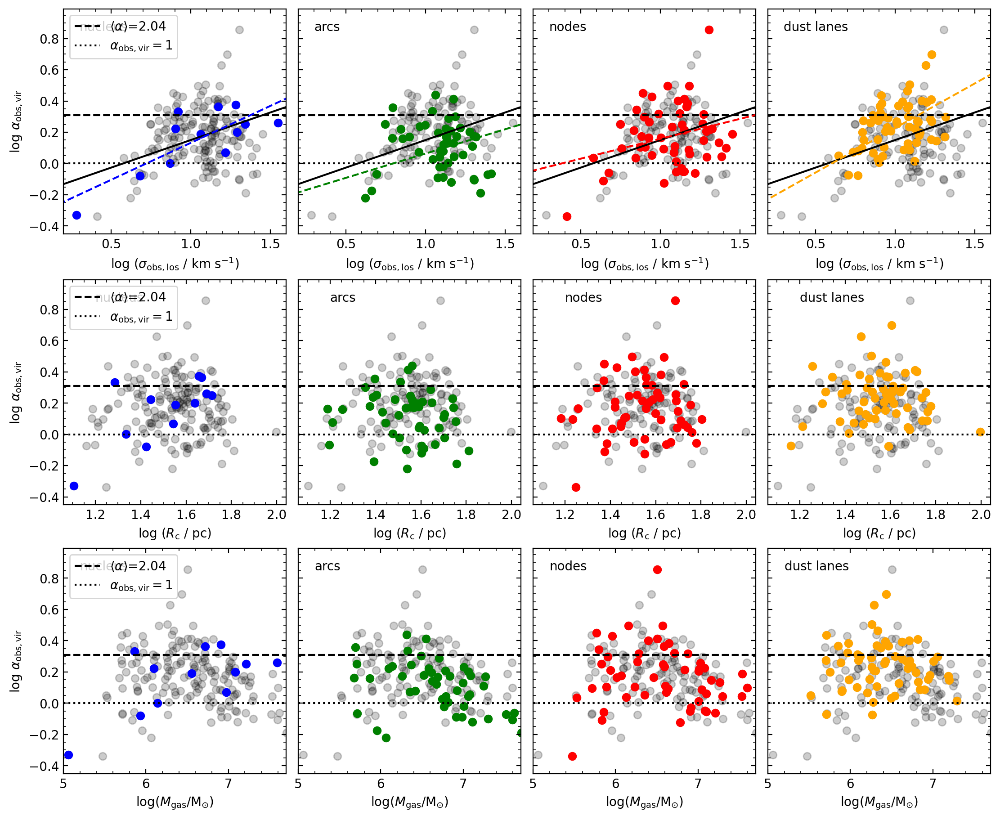

In [342]:
## alpha vs Mgas or Mvir
plt.rcParams["xtick.direction"] = "in"
plt.rcParams["ytick.direction"] = "in"
alpha_all = [alpha,alpha_inner,alpha_ring,alpha_node,alpha_inflow]
Mvir_all = [Mvir,Mvir_inner,Mvir_ring,Mvir_node,Mvir_inflow]
name_re = [name[0],name[1],name[2],name[3],name[4]]
line_re = [lines[0],lines[1],lines[2],lines[3],lines[4]]
Mlum_re = [Mlum_c[0],Mlum_c[1],Mlum_c[2],Mlum_c[3],Mlum_c[4]]
vrms_re = [vrms_c[0],vrms_c[1],vrms_c[2],vrms_c[3],vrms_c[4]]
Rc_re = [Rc[0],Rc[1],Rc[2],Rc[3],Rc[4]]
fig, axs = plt.subplots(3,4,figsize=(11,9),constrained_layout = True,dpi=200)

#lines = ['k','b','g','r','orange']
#name = ['all','nucleus','ring','nodes','spiral arms']#,'ring_top','ring_bot']

axs = axs.ravel()
for i in range(len(axs)):
    axs[i].minorticks_on()
for i in (1,2,3,4):
    axs[i+7].scatter(Mlum_re[0],np.log10(alpha_all[0].astype('float')),c='k',alpha=0.2)
    axs[i+7].scatter(Mlum_re[i],np.log10(alpha_all[i].astype('float')),c=line_re[i])
    axs[i+7].text(5.2,0.85,name_re[i])
    axs[i+7].set_ylim(-0.45,0.99)
    axs[i+7].set_xlim(5,7.7)
    axs[i+7].axhline(np.log10(2.04),c='k',ls='--')
    axs[i+7].axhline(np.log10(1),c='k',ls=':')
    axs[i+7].set_xlabel('log($M_{\mathrm{gas}}$/M$_{\odot}$)')#,fontsize=15)
axs[1].set_yticklabels([]);axs[2].set_yticklabels([]);axs[3].set_yticklabels([])    
axs[0].plot([],[],c='k',ls='--',label=r'$\langle\alpha\rangle$=2.04')
axs[0].plot([],[],c='k',ls=':',label=r'$\alpha_{\mathrm{obs,vir}}=1$')
axs[0].legend()
axs[0].set_ylabel(r'log $\alpha_{\mathrm{obs,vir}}$')#,fontsize=15)
#plt.tight_layout()
#plt.show()

def powerlaw_linear_func(x,a,b):
    return a*x+b

def powerlaw_func(x,a,b):
    return b*x**a

#params2, params_cov2 = optimize.curve_fit(powerlaw_func,vrms_c[0],alpha_all[0])#,p0=[1.2,1])

xx = np.arange(0,100,1)
#print (params2)

#fig, axs = plt.subplots(1,4,figsize=(11,3),dpi=200)
#axs = axs.ravel()

print ('spearman',np.corrcoef(vrms_re[0].astype('float'),alpha_all[0].astype('float'))[0,1])

t, p = stats.ttest_ind(vrms_re[0].astype('float'), alpha_all[0].astype('float'))
print("t_all = " + str(t))
print("p_all = " + str(p))

#print ('spearman_log',np.corrcoef(np.log10(vrms_c[0].astype('float')),np.log10(alpha_all[0].astype('float')))[0,1])
for i in (1,2,3,4):
    axs[i-1].scatter(np.log10(vrms_re[0].astype('float')),np.log10(alpha_all[0].astype('float')),c='k',alpha=0.2)
    print ('spearman_' + name[i],np.corrcoef(vrms_re[i].astype('float'),alpha_all[i].astype('float'))[0,1])
    t, p = stats.ttest_ind(vrms_re[i].astype('float'), alpha_all[i].astype('float'))
    print("t_" + name[i] +"= " + str(t))
    print("p_" + name[i] +"= " + str(p))
    axs[i-1].scatter(np.log10(vrms_re[i].astype('float')),np.log10(alpha_all[i].astype('float')),c=line_re[i])
    axs[i-1].text(0.3,0.85,name_re[i])
    axs[i-1].set_ylim(-0.45,0.99)
    axs[i-1].set_xlim(0.2,1.6)
    axs[i-1].axhline(np.log10(2.04),c='k',ls='--')
    axs[i-1].axhline(np.log10(1),c='k',ls=':')
    axs[i-1].set_xlabel(r'log ($\sigma_{\mathrm{obs,los}}$ / km s$^{-1}$)')#,fontsize=15)
    
    #### fit all data and plot using power-law function in linear space ####
    #params2, params_cov2 = optimize.curve_fit(powerlaw_func,vrms_c[0],alpha_all[0])#,p0=[1.2,1])
    #print (params2)
    #print (np.sqrt(np.diag(params_cov2)))
    #axs[i+7].plot(np.log10(xx),np.log10(params2[1]*xx**params2[0]),c='k',ls='-')
    
    #### fit all data and plot using linear function in log space ####
    params3, params_cov3 = optimize.curve_fit(powerlaw_linear_func,np.log10(vrms_re[0].astype('float')),np.log10(alpha_all[0].astype('float')))#,p0=[1.2,1])
    axs[i-1].plot(np.log10(xx),params3[0]*np.log10(xx) + params3[1],c='k',ls='-')

    print (params3)
    print (np.sqrt(np.diag(params_cov3)))
    
    #### fit orange data and plot using power-law function in linear space ####
    #params2, params_cov2 = optimize.curve_fit(powerlaw_func,vrms_c[i],alpha_all[i])#,p0=[1.2,1])
    #axs[i+7].plot(np.log10(xx),np.log10(params2[1]*xx**params2[0]),c=lines[i],ls='--')
    
    #### fit orange data and plot using linear function in log space ####
    params3, params_cov3 = optimize.curve_fit(powerlaw_linear_func,np.log10(vrms_re[i].astype('float')),np.log10(alpha_all[i].astype('float')))#,p0=[1.2,1])
    axs[i-1].plot(np.log10(xx),params3[0]*np.log10(xx) + params3[1],c=line_re[i],ls='--')
    print (params3)
    print (np.sqrt(np.diag(params_cov3)))
    print (i)
    
    
axs[9].set_yticklabels([]);axs[6].set_yticklabels([]);axs[7].set_yticklabels([])    
axs[8].plot([],[],c='k',ls='--',label=r'$\langle\alpha\rangle$=2.04')
axs[8].plot([],[],c='k',ls=':',label=r'$\alpha_{\mathrm{obs,vir}}=1$')
axs[8].legend()
axs[8].set_ylabel(r'log $\alpha_{\mathrm{obs,vir}}$')#,fontsize=15)
#plt.tight_layout()
#plt.show()

#fig, axs = plt.subplots(1,4,figsize=(11,3),dpi=200)
#axs = axs.ravel()


for i in (1,2,3,4):
    axs[i+3].scatter(np.log10(Rc_re[0].astype('float')),np.log10(alpha_all[0].astype('float')),c='k',alpha=0.2)
    axs[i+3].scatter(np.log10(Rc_re[i].astype('float')),np.log10(alpha_all[i].astype('float')),c=line_re[i])
    axs[i+3].text(1.2,0.85,name_re[i])
    axs[i+3].set_ylim(-0.45,0.99)
    #axs[i+3].set_xlim(5,99)
    axs[i+3].axhline(np.log10(2.04),c='k',ls='--')
    axs[i+3].axhline(np.log10(1),c='k',ls=':')
    axs[i+3].set_xlabel(r'log ($R_\mathrm{c}$ / pc)')#,fontsize=15)
    #axs[i+3].minorticks_on()
    #axs[i+7].minorticks_on()
    #axs[i-1].minorticks_on()
    axs[i+3].tick_params(direction='in',which='both',top='on',right='on')
    axs[i+7].tick_params(direction='in',which='both',top='on',right='on')
    axs[i-1].tick_params(direction='in',which='both',top='on',right='on')

#axs[3].tick_params(direction='in',which='both',top='on',right='on')    

#axs[4].tick_params(direction='in',which='both',top='on',right='on')    
axs[5].set_yticklabels([]);axs[10].set_yticklabels([]);axs[11].set_yticklabels([])    
axs[4].plot([],[],c='k',ls='--',label=r'$\langle\alpha\rangle$=2.04')
axs[4].plot([],[],c='k',ls=':',label=r'$\alpha_\mathrm{{obs,vir}}=1$')
axs[4].legend()
axs[4].set_ylabel(r'log $\alpha_{\mathrm{obs,vir}}$')#,fontsize=15)

#plt.tight_layout()
#plt.show()
#plt.savefig('fig_alpha_relation_%s.png' % folder,dpi=300)


# Figure 9, Larson's relation with $\sigma_{gs,los}$

- For Figure 9, I need to calculate the shifted rms with equation 19 ($\sigma^2_{shift,los} \approx \sigma^2_{sg,los}+\sigma^2_{gal,z}cos^2i$) ,

$\sigma_{sg,los}$ : turbulent velocity dispersion due to self-gravity

$\sigma_{gal,z}$  : rms velocity of gas motions due to external gravity in vertical direction

$cosi$ : i is the inclination with respect to the los

Meidt_2019_Apj_854_100

but there are values that are already calculated in the table

In [50]:
params1, params_cov1 = optimize.curve_fit(powerlaw_func,Rc_all,vrms_s_all)#,p0=[3,0.2])

Mvir=1.1615e3*Rc_all*vrms_s_all**2

def powerlaw_linear_func(x,a,b):
    return a*x+b

params2, params_cov2 = optimize.curve_fit(powerlaw_linear_func,np.log10(Mlum_all),np.log10(Mvir.astype('float')))#,p0=[1.2,1])

#print params1
print (params2)

[15.70226104 -6.25841668]


Larson relation slope 0.8561130097776253
Larson relation zero point 0.47835743901704414


ValueError: x and y must be the same size

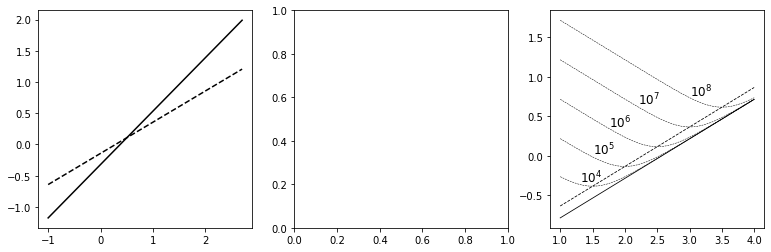

In [51]:
# For Figure 9 middle, I need to calculate virial mass. I can use equation 9 ($M_{vir}=5\sigma^2R_c/G$) = 1.1615e3*sigma^2*R_c

fig, axs = plt.subplots(1,3,figsize=(13,4)); axs = axs.ravel()

# ax0 fitting line & MW line

x0 = np.linspace(0.1,500,100)
axs[0].plot(np.log10(x0),np.log10(params1[1]*x0**params1[0]),'k') # plot the results from the fitting with all data
axs[0].plot(np.log10(x0),0.5*np.log10(0.52*x0),'k--',label='MW disc') # reference, solomon 1987


print ('Larson relation slope',params1[0])
print ('Larson relation zero point',params1[1])

#print ('Larson relation slope_error',params1[0])


# ax2 pressure line 

x2 = np.arange(10,10000)
surf = x2 * u.Msun * u.pc**-2
text=np.array([(1.1,-0.6),(1.3,-0.34),(1.5,0.02),(1.76,0.36),(2.2,0.65),(3,0.75)])

for i in range(4,9):
    P = 10**i*u.K *u.cm**-3*c.k_B.to('erg K-1')
    P = ((P.to('Msun cm-1 s-2')/(3*surf)).to('km2 s-2 pc-1'))

    y = np.sqrt(np.add(np.pi*G.value*x2/5,4*P.value))

    axs[2].plot(np.log10(x2),np.log10(y),'k--',lw=0.5)
    axs[2].text(text[i-3,0],text[i-3,1],r'10$^%s$' % i,fontsize=12)

y = np.sqrt(np.pi*G.value*x2/5) #alpha = 1
y2 = np.sqrt(np.pi*G.value*x2*2/5) #alpha =2
             
axs[2].plot(np.log10(x2),np.log10(y),'k',lw=0.8)
axs[2].plot(np.log10(x2),np.log10(y2),'k--',lw=0.8)

#print (10**Mlum_c[3])
#print (10**Mlum_c_err[3])
#print (0.434*(10**Mlum_c_err[3]/10**Mlum_c[3]))
for i in (4,3,2,1):    
    
    axs[0].scatter(np.log10(Rc[i].astype('float')),np.log10(vrms_s_c[i].astype('float')),s=20,c=lines[i],label=name[i])
    axs[0].set_xlim(0.75,2.2)
    axs[0].set_ylim(0.05,1.6)
    axs[0].set_xlabel('log(R$_c$/pc)',fontsize=15)
    axs[0].set_ylabel('log($\sigma_{gs,los}$/km s$^{-1}$)',fontsize=15)
    
    Mvir_s = 1.1615e3*Rc[i].astype('float')*vrms_s_c[i].astype('float').astype('float')**2 # not log scale
    xerr = 0.434*(10**Mlum_c_err[i]/10**Mlum_c[i])
    yerr = np.sqrt((Rc_err[i].astype('float')/Rc[i].astype('float'))**2 + 2*(vrms_s_c_err[i].astype('float')/vrms_s_c[i].astype('float'))**2)

    axs[1].errorbar(Mlum_c[i], np.log10(Mvir_s), xerr=xerr,yerr=yerr*0.434, capsize=3,mec='none',mfc=lines[i], ls='none', color='black',elinewidth=1,fmt='o')
    #axs[1].scatter(Mlum_c[i],np.log10(Mvir_s),s=12,c=lines[i])
    
    
    axs[1].set_xlim(4,8.2)
    axs[1].set_ylim(4,8.2)
    axs[1].set_xlabel('log(M$_{gas}$/M$_{\odot}$)',fontsize=15)
    axs[1].set_ylabel('log(M$_{gs,vir}$/M$_{\odot}$)',fontsize=15)


    axs[2].scatter(surf_c[i].astype('float'),np.log10(vrms_s_c[i].astype('float')/(Rc[i].astype('float'))**0.5),s=20,c=lines[i])
    axs[2].set_xlim(1.2,3.5)
    axs[2].set_ylim(-0.85,0.9)
    axs[2].set_xlabel('log($\Sigma_{gas}$/M$_{\odot}$ pc$^{-2}$)',fontsize=15)
    axs[2].set_ylabel('log($\sigma_{gs,los}$ R$_c^{-1/2}$/km s$^{-1}$ pc$^{-1/2}$)',fontsize=15)
    
    axs[0].tick_params(direction='in',which='both')
    axs[1].tick_params(direction='in',which='both')  
    axs[2].tick_params(direction='in',which='both')  

    
# ax1 1-to-1 line & alpha=2 line

#x1 = np.linspace(3.5,8.0,40)
print ('spearman',np.corrcoef(Rc[0].astype('float'),vrms_s_c[0].astype('float'))[0,1])
print ('spearman',np.corrcoef(np.log10(Rc[0].astype('float')),np.log10(vrms_s_c[0].astype('float')))[0,1])

axs[1].plot([3.5,8.5],[3.5,8.5],'k--',lw=1,label=r'$\alpha_{vir}$=1')
axs[1].plot([3.5,8.5],[np.log10(2*10**3.5),np.log10(2*10**8.5)],'k:',lw=1,label=r'$\alpha_{vir}$=2')

#x1 = np.logspace(3.5, 8.5, num=100)
x1 = np.linspace(3.5,8.0,40)
#axs[1].plot(np.log10(x1),np.log10(params2[1]*x1**params2[0]),'c')
axs[1].plot(x1,params2[0]*x1+ params2[1],'c')

axs[0].legend(loc=0,fontsize=13)
plt.tight_layout()
#plt.savefig('fig9_%s.png' % folder,dpi=200)
# Need to fitting the data with errors
# for right panel, i need to find the pressure equilibrium curves

1.0937078911895142
1.1019534407206208
1.3305957654193195
0.9547393545668483


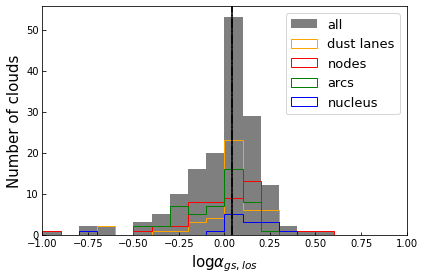

In [92]:
# For alpha Figure 9 middle, I need to calculate virial mass. I can use equation 9 ($M_{vir}=5\sigma^2R_c/G$) = 1.1615e3*sigma^2*R_c

Mvir_gs = 1.1615e3*Rc[0]*vrms_s_c[0]**2
alpha_gs = Mvir_gs/10**Mlum_c[0]

Mvir_inner_gs = 1.1615e3*Rc[1]*vrms_s_c[1]**2
alpha_inner_gs = Mvir_inner_gs/10**Mlum_c[1]

Mvir_ring_gs = 1.1615e3*Rc[2]*vrms_s_c[2]**2
alpha_ring_gs = Mvir_ring_gs/10**Mlum_c[2]

Mvir_node_gs = 1/bG.value*Rc[3]*vrms_s_c[3]**2
alpha_node_gs = Mvir_node_gs/10**Mlum_c[3]

Mvir_inflow_gs = 1/bG.value*Rc[4]*vrms_s_c[4]**2
alpha_inflow_gs = Mvir_inflow_gs/10**Mlum_c[4]

#Mvir_arm = 1.1615e3*Rc[3]*vrms_s_c[3]**2
#alpha_arm = Mvir_arm/10**Mlum_c[3]
#print (10**Mlum_c[0]/Mvir)


print (alpha_gs.mean())
print (np.median(alpha_gs))
print (alpha_inner_gs.mean())
print (alpha_ring_gs.mean())
#print (alpha_arm.mean())

plt.hist(np.log10(alpha_gs.astype('float')),bins=np.arange(-1,1.1,0.1),label=name[0],facecolor=lines[0],alpha=0.5)
plt.hist(np.log10(alpha_inflow_gs.astype('float')),bins=np.arange(-1,1.1,0.1),edgecolor=lines[4], histtype='step',label=name[4])#,alpha=0.7)
plt.hist(np.log10(alpha_node_gs.astype('float')),bins=np.arange(-1,1.1,0.1),edgecolor=lines[3], histtype='step',label=name[3])#,alpha=0.7)
plt.hist(np.log10(alpha_ring_gs.astype('float')),bins=np.arange(-1,1.1,0.1),edgecolor=lines[2], histtype='step',label=name[2])#,alpha=0.7)
plt.hist(np.log10(alpha_inner_gs.astype('float')),bins=np.arange(-1,1.1,0.1),edgecolor=lines[1], histtype='step',label=name[1])#,alpha=0.7)

#plt.hist(np.log10(alpha_inner.astype('float')),bins=np.arange(-1,1.1,0.1),edgecolor='b', histtype='step',label='inner')#,alpha=0.7)

plt.axvline(np.log10(alpha_gs.mean()),c='k',ls='-')
plt.axvline(np.log10(np.median(alpha_gs)),c='k',ls='-.')
#plt.axvline(np.log10(2),c='k',ls=':',label='$\alpha_{gs}$=2')
#plt.axvline(np.log10(1),c='k',ls='--',label='$\alpha_{vir}$=1')

plt.xlabel(r'log$\alpha_{gs,los}$',fontsize=15)
plt.ylabel('Number of clouds',fontsize=15)
plt.xlim(-1,1)
plt.legend(loc=0,fontsize=13)
plt.tick_params(direction='in',which='both')  
plt.tight_layout()
#plt.savefig('fig_alpha_gs_new_%s.png' % folder,dpi=200)
plt.show()

[11.44 12.11 20.15 11.78 11.9   9.7   4.88 12.54  3.6   9.02  6.75 14.7
 25.45 10.88  5.59  4.55  8.07 11.61 22.18  7.09 14.31 14.97  8.72 23.05
 12.54 15.39 12.44 10.52 12.18 16.4  19.33  6.47 12.56 14.43  8.88 10.79
  9.04 20.54  8.14  7.79 19.44 21.14  4.63  6.86 14.27  9.18 13.8  22.32
 12.57 11.09 12.25  8.41 22.71 16.44 12.45  9.09 13.5  17.67 22.25 16.69
 12.74 13.28 16.4  10.7  19.01 22.2  14.5  13.27  7.5  17.81 19.34 14.75
  3.71  5.45  9.57  6.86 13.57 13.05 12.37 12.53 11.2  15.85 17.65 16.37
  7.43 11.26 12.27 16.47  9.04  1.98 11.72 11.71  9.51 20.16  6.39 11.8
 35.83 18.57 28.51 14.72 12.31  7.39 11.38 11.28 14.51 10.79 13.92  7.37
 12.38 13.71  9.23 12.35 16.85  9.12 13.44 13.43 19.39 19.32 18.37 20.71
 23.06 18.73  9.07  8.27  8.11 10.98  3.1   5.27  7.4  15.61 13.93  4.62
 19.94  6.87 10.21  6.71 13.04 11.24 24.58 11.06  7.03  7.81 12.38  4.2
  5.69 17.1  25.55  5.35  6.2  15.39 15.66  4.99  7.62 10.99 19.32 19.47
 15.17 11.28]
[ 9.16  8.72 17.95 10.29 10.47  7.76  3.

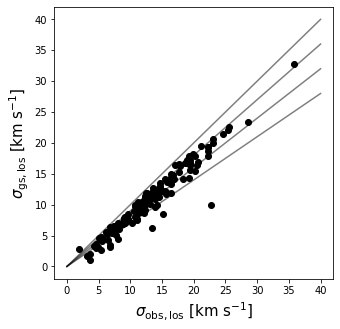

In [32]:
plt.figure(figsize=(5,5))
plt.scatter(vrms_c[0],vrms_s_c[0],c='k')
plt.plot((0,40),(0,40),c='k',alpha=0.5)
plt.plot((0,40),(0,36),c='k',alpha=0.5)
plt.plot((0,40),(0,32),c='k',alpha=0.5)
plt.plot((0,40),(0,28),c='k',alpha=0.5)

plt.ylabel(r'$\sigma_{\mathrm{gs,los}}$ [km s$^{-1}$]',fontsize=15)
plt.xlabel(r'$\sigma_{\mathrm{obs,los}}$ [km s$^{-1}$]',fontsize=15)
plt.savefig('vel_obs_gs.png',dpi=300)
print (vrms_c[0].astype('float'))
print (vrms_s_c[0].astype('float'))
#print ()
ratio =vrms_s_c[0].astype('float')/vrms_c[0].astype('float') 
print (len(ratio))
print (len(ratio[ratio>=0.7]))

# $\sigma_{turb}$ vs $\sigma_{obs}$

0.8210243825311286
0.8069216792627845
0.8304271842314389
0.8227922752379924
138
0.8193530236908578


<ipython-input-34-586a6fa65690>:14: RuntimeWarning: divide by zero encountered in log10
  ax.plot(np.log10(x),np.log10(x*0.9),'k--',label='0.9')
<ipython-input-34-586a6fa65690>:15: RuntimeWarning: divide by zero encountered in log10
  ax.plot(np.log10(x),np.log10(x*0.8),'k-.',label='0.8')
<ipython-input-34-586a6fa65690>:16: RuntimeWarning: divide by zero encountered in log10
  ax.plot(np.log10(x),np.log10(x*0.7),'k:',label='0.7')


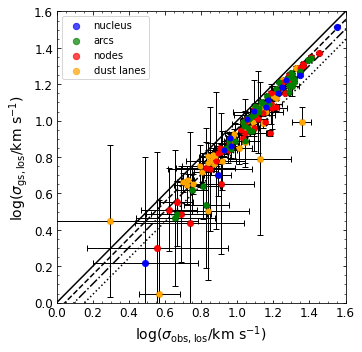

In [34]:
fig,ax=plt.subplots(1,1,figsize=(5,5))
#ax=ax.ravel()
# xerr_1 = 0.434*(vrms_c_err/vrms_c)
# yerr_1 = 0.434*(vrms_s_c_err/vrms_s_c)
for i in (4,3,2,1): 
    ax.scatter(np.log10(vrms_c[i].astype('float')),np.log10(vrms_s_c[i].astype('float')),alpha=0.7,label=name[i],s=40,c=lines[i])
    ax.errorbar(np.log10(vrms_c[i].astype('float')),np.log10(vrms_s_c[i].astype('float')),xerr=0.434*(vrms_c_err[i]/vrms_c[i])/2,yerr=0.434*(vrms_s_c_err[i]/vrms_s_c[i])/2, capsize=3,mec='none',mfc=lines[i], ls='none', color='black',elinewidth=1,fmt='o')
    #ax[1].scatter(vrms_c[i].astype('float'),vrms_s_c[i].astype('float'),alpha=0.7,label=name[i],s=40,c=lines[i])
    print (np.mean(vrms_s_c[i]/vrms_c[i]))
#axs[1].errorbar(Mlum_c[i], np.log10(Mvir), xerr=xerr,yerr=yerr*0.434, capsize=3,mec='none',mfc=lines[i], ls='none', color='black',elinewidth=1,fmt='o')

x = np.arange(0,100)
ax.plot([0,1.6],[0,1.6],'k-',label='1')
ax.plot(np.log10(x),np.log10(x*0.9),'k--',label='0.9')
ax.plot(np.log10(x),np.log10(x*0.8),'k-.',label='0.8')
ax.plot(np.log10(x),np.log10(x*0.7),'k:',label='0.7')
#ax[0].plot([np.log10(2),np.log10(50)],[np.log10(1),np.log10(30)],'k:')
#ax[0].plot([np.log10(10),np.log10(50)],[np.log10(1),np.log10(40)],'k:')
ax.set_xlim(0,1.6)
ax.set_ylim(0,1.6)
ax.set_xlabel('log($\sigma_{\mathrm{obs,los}}$/km s$^{-1}$)',fontsize=14)
ax.set_ylabel('log($\sigma_{\mathrm{gs,los}}$/km s$^{-1}$)',fontsize=14)
#ax.set_title('log scale',fontsize=13)
#ax.legend(loc=0,ncol=2,fontsize=15)
ax.tick_params(direction='in',which='both',labelsize=12,top='on',right='on')
ax.minorticks_on()
#ax[1].plot(x,x,'k-')
#ax[1].plot(x,x*0.9,'k--')
#ax[1].plot(x,x*0.8,'k-.')
#ax[1].plot(x,x*0.7,'k:')
#ax[1].set_xlim(0,35)
#ax[1].set_ylim(0,35)
#ax[1].set_xlabel('$\sigma_{obs,los}$ [km s$^{-1}$]',fontsize=15)
#ax[1].set_ylabel('$\sigma_{gs,los}$ [km s$^{-1}$]',fontsize=15)
#ax[1].set_title('linear scale',fontsize=13)
#ax[1].tick_params(direction='in',labelsize=13)




#print ('x-axis',(vrms_c_err[0]))
#print ('y-axis',(vrms_s_c_err[0]))
#print ('x-axis',np.mean(vrms_c_err[0]))
#print ('y-axis',np.mean(vrms_s_c_err[0]))

vrms_ratio = vrms_s_c[0]/vrms_c[0]

print (len(vrms_ratio[vrms_ratio>0.7]))
print (np.mean(vrms_ratio))
#print (vrms_s_c[0])

handles,labels = ax.get_legend_handles_labels()

handles = [handles[3], handles[2], handles[1],handles[0]]
labels = [labels[3], labels[2], labels[1],labels[0]]

ax.legend(handles,labels,loc=2,fontsize=10)
#plt.legend(loc=0,fontsize=12,ncol=2)
plt.tight_layout()
#plt.savefig('/home/woorak/Dropbox/앱/Overleaf/thesis/figures_chap2/613/ngc613_obs_gs.png',dpi=300)
plt.savefig('/home/woorak/Dropbox/앱/Overleaf/[Paper] WISDOM_GMCs_ngc613/ngc613_obs_gs.png',dpi=300, transparent=True)

plt.show()

- For Figure 10, I need to calculate the effective rms with equation 28

$\sigma^2_{eff,los}$ $\approx$ $\sigma^2_{shift,los}$ + $\frac{2(\sigma^2_{obs,los} - \sigma^2_{shift,los})}{3\sin^2 i}$ + $\frac{(T_0 - 2\Omega^2_0)bR_c^2}{3}$ - eq 28


- For Figure 11, I need to calculate the Oort's constant A (seems to relate with shear) for calculating the beta (equation 34)

## X$_{CO}$ factor based on the assumption of  virialized clouds

Assuming alpha = 1 (clouds are virialized, M$_{vir}$ = M$_{lum}$)

all 3.3129865833606873
dust lanes 3.6787438574288913
nodes 3.452440711725309
arcs 2.772294808602379
nucleus 3.8437028333616183


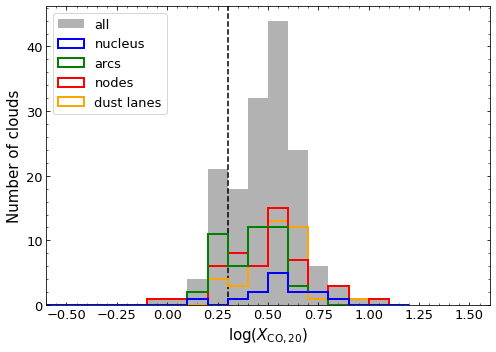

In [119]:
#print (data.shape)
# Lum_t = ((data_resol[:,9].astype(float)*(10**4)))

# Rc_t = data_resol[:,3]
# #Mlum_t = np.log10((data[:,11].astype(float)*(10**5)))
# vrms_t = data_resol[:,5]

# Mvir_t = 1/bG.value*Rc_t*vrms_t**2

# Xco = (Mvir_t*2/(4.4*Lum_t)).astype('float')
# #print (Mvir/(4.4*Lum))
# #print (Xco.)
# plt.hist(Xco,bins=np.arange(0.05,10,0.1),label='all',facecolor='k',alpha=0.5)
#plt.show()
#print (np.log10(Xco.astype('float')))
#print (Xco.mean())
#print (np.median(Xco))
#plt.figure(figsize=(7,5))
fig,ax=plt.subplots(1,1,figsize=(7,5))


ax.axvline(np.log10(2),c='k',ls='--',label='X$_{\mathrm{CO}}$ = 2 x 10$^{20}$',lw=1.5) # $ cm$^{-2}$ (K km s$^{-1}$)$^{-1}$)

for i in (0,4,3,2,1):
    #Rc = data_resol[:,3]
    #Mlum = np.log10((data[:,11].astype(float)*(10**5)))
    #vrms = data_resol[:,5]
    
    Mvir = 1/bG.value*Rc[i]*vrms_c[i]**2
    Xco = (Mvir*2/(4.4*10**Lum_c[i])).astype('float')
    print (name[i],np.mean(Xco))
    if i==0:
        plt.hist(np.log10(Xco),bins=np.arange(-1,1.3,0.1),label='all',facecolor=lines[0],alpha=0.3)

        #ax.hist((Xco),bins=np.logspace(np.log10(0.1),np.log10(30), 25),label=name[i],facecolor=lines[0],alpha=0.3)
    else:
        
        #ax.hist((Xco),bins=np.logspace(np.log10(0.1),np.log10(30), 25),label=name[i],histtype='step',edgecolor=lines[i],linewidth=2)
        plt.hist(np.log10(Xco),bins=np.arange(-1,1.3,0.1),label=name[i],histtype='step',edgecolor=lines[i],linewidth=2)
    

#ax.set_xlabel(r'log($X_{\mathrm{CO,obs}}~/1\times10^{20}$ cm$^{-2}$ (K km s$^{-1}$)$^{-1}$)',fontsize=15)
ax.set_xlabel(r'log($X_{\mathrm{CO,20}}$)',fontsize=15)

ax.set_ylabel('Number of clouds',fontsize=15)
#ax.set_xscale('log')
#ax.set_xlim(0.3,35)
plt.xlim(-0.6,1.6)

#plt.legend(loc='upper left',fontsize=13)

handles,labels = ax.get_legend_handles_labels()

handles = [handles[1],handles[5],handles[4], handles[3], handles[2]]
labels = [labels[1],labels[5],labels[4], labels[3], labels[2]]

ax.legend(handles,labels,loc=2,fontsize=13)

plt.tick_params(direction='in',which='both',labelsize=13,top='on',right='on')
plt.minorticks_on()

plt.tight_layout()
#plt.savefig('ngc613_Xco_%s.png' % folder,dpi=200)
plt.show()

# plt.scatter(Rc,Xco)
# plt.show()

# plt.scatter(vrms,Xco)
# plt.show()
#print (Mvir)
#print (Lum)
#print ()


all 3.3129865833606873
dust lanes 3.6787438574288913
nodes 3.452440711725309
arcs 2.772294808602379
nucleus 3.8437028333616183


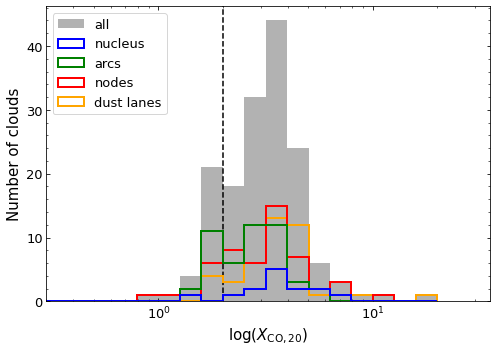

In [120]:
#print (data.shape)
# Lum_t = ((data_resol[:,9].astype(float)*(10**4)))

# Rc_t = data_resol[:,3]
# #Mlum_t = np.log10((data[:,11].astype(float)*(10**5)))
# vrms_t = data_resol[:,5]

# Mvir_t = 1/bG.value*Rc_t*vrms_t**2

# Xco = (Mvir_t*2/(4.4*Lum_t)).astype('float')
# #print (Mvir/(4.4*Lum))
# #print (Xco.)
# plt.hist(Xco,bins=np.arange(0.05,10,0.1),label='all',facecolor='k',alpha=0.5)
#plt.show()
#print (np.log10(Xco.astype('float')))
#print (Xco.mean())
#print (np.median(Xco))
#plt.figure(figsize=(7,5))
fig,ax=plt.subplots(1,1,figsize=(7,5))


ax.axvline((2),c='k',ls='--',label='X$_{\mathrm{CO}}$ = 2 x 10$^{20}$',lw=1.5) # $ cm$^{-2}$ (K km s$^{-1}$)$^{-1}$)

for i in (0,4,3,2,1):
    #Rc = data_resol[:,3]
    #Mlum = np.log10((data[:,11].astype(float)*(10**5)))
    #vrms = data_resol[:,5]
    
    Mvir = 1/bG.value*Rc[i]*vrms_c[i]**2
    Xco = (Mvir*2/(4.4*10**Lum_c[i])).astype('float')
    print (name[i],np.mean(Xco))
    if i==0:
        #plt.hist(np.log10(Xco),bins=np.arange(-1,1.3,0.1),label='all',facecolor=lines[0],alpha=0.3)

        ax.hist((Xco),bins=np.logspace(np.log10(0.1),1.3, 24),label=name[i],facecolor=lines[0],alpha=0.3)
    else:
        
        ax.hist((Xco),bins=np.logspace(np.log10(0.1),1.3, 24),label=name[i],histtype='step',edgecolor=lines[i],linewidth=2)
        #plt.hist(np.log10(Xco),bins=np.arange(-1,1.3,0.1),label=name[i],histtype='step',edgecolor=lines[i],linewidth=2)
    

#ax.set_xlabel(r'log($X_{\mathrm{CO,obs}}~/1\times10^{20}$ cm$^{-2}$ (K km s$^{-1}$)$^{-1}$)',fontsize=15)
ax.set_xlabel(r'log($X_{\mathrm{CO,20}}$)',fontsize=15)

ax.set_ylabel('Number of clouds',fontsize=15)
ax.set_xscale('log')
ax.set_xlim(0.3,35)
#plt.xlim(-0.6,1.4)

#plt.legend(loc='upper left',fontsize=13)

handles,labels = ax.get_legend_handles_labels()

handles = [handles[1],handles[5],handles[4], handles[3], handles[2]]
labels = [labels[1],labels[5],labels[4], labels[3], labels[2]]

ax.legend(handles,labels,loc=2,fontsize=13)

plt.tick_params(direction='in',which='both',labelsize=13,top='on',right='on')
plt.minorticks_on()

plt.tight_layout()
#plt.savefig('fig_Xco_%s.png' % folder,dpi=200)
plt.show()

# plt.scatter(Rc,Xco)
# plt.show()

# plt.scatter(vrms,Xco)
# plt.show()
#print (Mvir)
#print (Lum)
#print ()


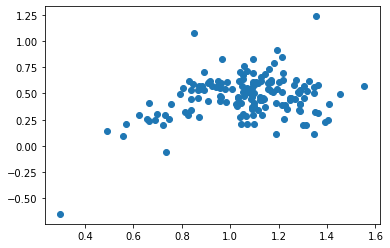

In [125]:
Mvir = 1/bG.value*Rc[0]*vrms_c[0]**2
Xco = (Mvir*2/(4.4*10**Lum_c[0])).astype('float')

plt.scatter(np.log10(vrms_c[0].astype('float')),np.log10(Xco))

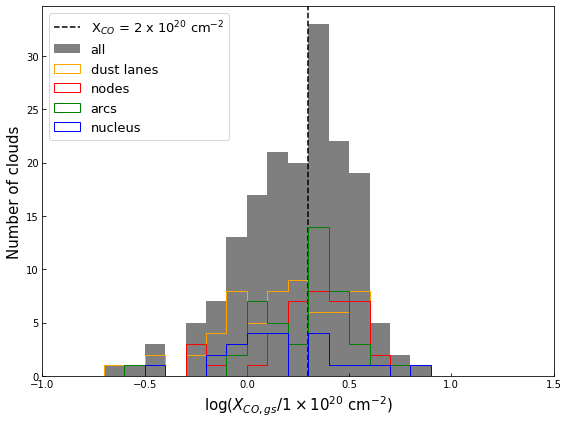

In [156]:
#print (data.shape)
# Lum_t = ((data_resol[:,9].astype(float)*(10**4)))

# Rc_t = data_resol[:,3]
# #Mlum_t = np.log10((data[:,11].astype(float)*(10**5)))
# vrms_t = data_resol[:,5]

# Mvir_t = 1/bG.value*Rc_t*vrms_t**2

# Xco = (Mvir_t*2/(4.4*Lum_t)).astype('float')
# #print (Mvir/(4.4*Lum))
# #print (Xco.)
# plt.hist(Xco,bins=np.arange(0.05,10,0.1),label='all',facecolor='k',alpha=0.5)
#plt.show()
#print (np.log10(Xco.astype('float')))
#print (Xco.mean())
#print (np.median(Xco))
plt.figure(figsize=(8,6))
plt.axvline(np.log10(2),c='k',ls='--',label='X$_{CO}$ = 2 x 10$^{20}$ cm$^{-2}$',lw=1.5)
for i in (0,4,3,2,1):
    #Rc = data_resol[:,3]
    #Mlum = np.log10((data[:,11].astype(float)*(10**5)))
    #vrms = data_resol[:,5]
    
    Mvir = 1/bG.value*Rc[i]*vrms_s_c[i]**2
    Xco = (Mvir*2/(4.4*10**Lum_c[i])).astype('float')
    
    if i==0:
        #plt.hist(np.log10(alpha.astype('float')),bins=np.arange(-1,1.1,0.1),label='all',facecolor=lines[0],alpha=0.5)

        plt.hist(np.log10(Xco),bins=np.arange(-1,1.5,0.1),label=name[i],facecolor=lines[0],alpha=0.5)
    else:
        plt.hist(np.log10(Xco),bins=np.arange(-1,1.5,0.1),label=name[i],histtype='step',edgecolor=lines[i])
    

plt.xlabel(r'log($X_{CO,gs}/1\times10^{20}$ cm$^{-2}$)',fontsize=15)
plt.ylabel('Number of clouds',fontsize=15)
plt.xlim(-1,1.5)
plt.legend(loc='upper left',fontsize=13)
plt.tick_params(direction='in',which='both')
plt.tight_layout()
#plt.savefig('fig_Xco_gs_%s.png' % folder,dpi=200)
plt.show()

# plt.scatter(Rc,Xco)
# plt.show()

# plt.scatter(vrms,Xco)
# plt.show()
#print (Mvir)
#print (Lum)
#print ()


## velocity gradient - turbulence (Burkert & Bodenheimer 2000)
$\omega= 1.6 (R/0.1pc)^{-\frac1 2} km s^{-1} pc^{-1} $

In [20]:
#w = 1.6*(R/0.1)**(-0.5) # km s-1 pc-1 equation
# for i in range(5):
#     print (name[i],'Omega from R mean',1.6*(np.mean(Rc[i])/0.1)**(-0.5))

#     print (name[i],'Omega',np.mean(Om_c[i]),np.median(Om_c[i]))
#print (name[i],'Theta',np.mean(Theta_c[i]),np.median(Theta_c[i]))

print ('Omega from R mean',1.6*(np.mean(Rc[0])/0.1)**(-0.5))
print ('Omega mean',np.mean(Om_c[0]))
print ('Omega median',np.median(Om_c[0]))
print ('Omega from R max',1.6*((Rc[0].max())/0.1)**(-0.5))
print ('Omega min',np.min(Om_c[0]))
print ('Omega from R min',1.6*((Rc[0].min())/0.1)**(-0.5))
print ('Omega max',np.max(Om_c[0]))

Omega from R mean 0.0822947755009997
Omega mean 0.17215189873417724
Omega median 0.15
Omega from R max 0.061638843169194615
Omega min 0.02
Omega from R min 0.13305642060797712
Omega max 0.75


# Cloud collision timescale

t$_{ccc,old}$ = $\frac \pi 4$ $\frac {\Sigma_{cl}} {\rho\sigma_{1D}} $ (MeKee & Ostriker 2007)

t$_{ccc}$ $\sim$ $\frac 1 2$ $\frac {\lambda_{mfp}} {v_s(R_i \approx 1.6r_t)}$ $\sim$ $\frac {1} {3.2r_t(\Omega - dv_{circ}/dR)N_A r_t f_G}$

t$_{ccc}$ $\equiv$ $1/Z_{coll}$ $\approx$ $\frac {(A_{oort} M_{cl})^{1/3}} {(\sqrt2 G)^{2/3} \Sigma_{gas}}$ (Take from Liu+ 2022, NGC404 paper)


30856775814913.67 km
[3.18490218 4.58621887 1.61668445 1.2777692  3.1172964  4.3759745
 3.68471942 3.10206205 3.6485637  1.68239474 2.58182283 1.82487959
 3.20883595 2.17686164 2.34178186 2.53397307 1.52928672 2.61538834
 2.01389838 1.42444565 2.20760248 1.87728464 2.13454002 2.11397017
 1.72281011 0.90496797 1.49446529 1.98949235 1.25987619 3.66851216
 3.38636704 1.21869259 4.24163622 1.32284862 4.16688549 4.4364816
 4.6505002  2.77550204 2.18248173 1.28871532 1.56145153 4.81326211
 1.47389366 1.80661296 3.59111633 1.75520163 0.9327982  5.01705781
 2.51609885 2.72112913 1.98398676 1.73372336 2.5265661  1.81193928
 2.9014657  1.60493317 1.8535147  2.74121736 2.28640219 2.08550486
 2.07585465 1.1833074  2.18343621 1.53834486 2.41889887 2.10854685
 3.55446144 2.53952287 2.30536986 3.10028414 2.53984934 2.30194151
 3.3551499  4.36454785 2.49240665 2.13048375 2.61516667 2.9889023
 1.17115198 2.9428743  2.18854793 1.15992956 2.06698169 1.21310924
 2.79863121 1.46719423 1.47509466 1.106207  

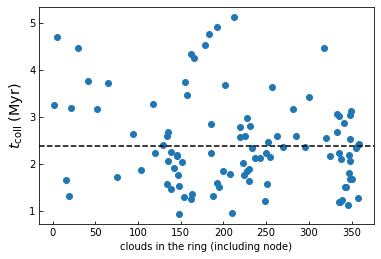

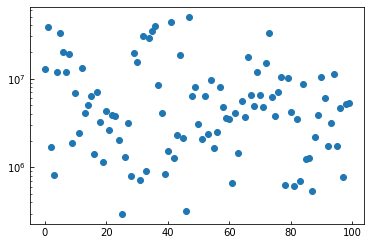

In [784]:
## From Equation 7 of Liu + NGC 404 paper ##

print (c.pc.to('km'))
pctokm = c.pc.to('km')
#print (c.t)
sectoyear = 3.17098e-8*u.yr # 1sec in year
#print (pctokm*sectoyear)

Aoort = 0.1*u.km/u.s/u.pc # km s-1 pc-1 

#Mlum_all_new[n::]
Mcl = Mlum_all_new[n::]*u.Msun#10**5.5*u.Msun # Msun

gas_surf = 1000*u.Msun/u.pc**2 # Msun pc-2
tcoll = (((Aoort*Mcl)**(1/3))/((2**0.5*G)**(2/3)*gas_surf))#*pctokm*sectoyear

print (tcoll.to('Myr'))
print ('Mean collision time =',np.mean(tcoll.to('Myr')))

plt.scatter(AZr,tcoll)
plt.axhline(np.mean(tcoll.to('Myr').value),c='k',ls='--')
plt.ylabel('$t_{\mathrm{coll}}$ (Myr)',fontsize='x-large')
plt.xlabel('clouds in the ring (including node)')
plt.show()

plt.figure()
plt.scatter(np.arange(len(Mcl)),Mcl)
plt.yscale('log')
plt.show()

# additional figures

[0.83059244 0.63280073]
[0.9359649 0.5957492]
51 51
53 53
47 47
11 11


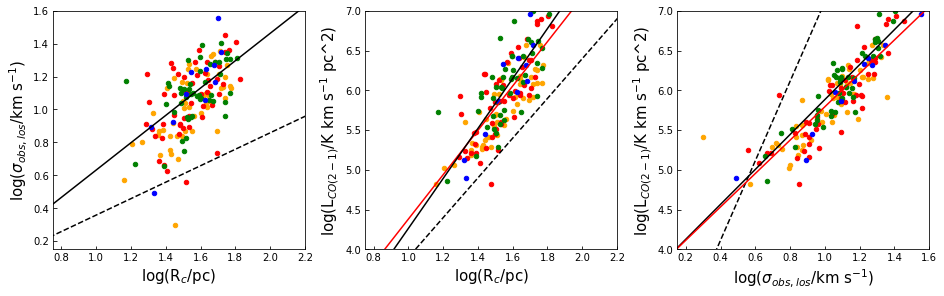

In [491]:
### Fitting ###

def powerlaw_func(x,a,b):
    return b*x**a

params1, params_cov1 = optimize.curve_fit(powerlaw_func,Rc_all,vrms_all)#,p0=[3,0.2])

params0, params_cov0 = optimize.curve_fit(powerlaw_linear_func,Rc_all,vrms_all)#,p0=[3,0.2])


Mvir=1/bG.value*Rc_all*vrms_all**2

def powerlaw_linear_func(x,a,b):
    return a*x+b

params2, params_cov2 = optimize.curve_fit(powerlaw_linear_func,np.log10(Mlum_all),np.log10(Mvir.astype('float')))#,p0=[1.2,1])

print (params1)
print (params2)


params3, params_cov3 = optimize.curve_fit(powerlaw_linear_func,np.log10(Rc_all.astype('float')),Lum_all.astype('float'))#,p0=[1.2,1])

params4, params_cov4 = optimize.curve_fit(powerlaw_func,Rc_all.astype('float'),10**Lum_all.astype('float'))#,p0=[1.2,1])

params0, params_cov0 = optimize.curve_fit(powerlaw_linear_func,np.log10(Rc_all.astype('float')),np.log10(vrms_all.astype('float')))#,p0=[3,0.2])


params5, params_cov5 = optimize.curve_fit(powerlaw_func,vrms_all,10**Lum_all.astype('float'))#,p0=[1.2,1])
params6, params_cov6 = optimize.curve_fit(powerlaw_linear_func,np.log10(vrms_all.astype('float')),Lum_all.astype('float'))#,p0=[1.2,1])


### Plot ###

fig, axs = plt.subplots(1,3,figsize=(13,4),constrained_layout = True); axs = axs.ravel()



### ax0 fitting line & MW line ###

x0 = np.linspace(0.1,500,100)
axs[0].plot(np.log10(x0),np.log10(params1[1]*x0**params1[0]),'k') # plot the results from the fitting with all data
#axs[0].plot(x0,params0[0]*x0+params0[1],'r')
axs[0].plot(np.log10(x0),0.5*np.log10(0.52*x0),'k--',label='MW disc') # reference, solomon 1987

### ax2 pressure line ###

x2 = range(10,10000)
surf = x2 * u.Msun * u.pc**-2
text=np.array([(1.1,-0.6),(1.3,-0.34),(1.5,0.02),(1.76,0.36),(2.2,0.65),(3,0.75)])

x3 = np.linspace(1,100,100)
x4 = np.linspace(0.1,2,100)

axs[1].plot(x0,params3[0]*x0+ params3[1],'r')
axs[1].plot(np.log10(x0),np.log10(params4[1]*x0**params4[0]),'k')
axs[1].plot(np.log10(x0),np.log10(25*x0**2.5),'k--')
axs[2].plot(np.log10(x3),np.log10(params5[1]*x3**params5[0]),'k')
axs[2].plot(np.log10(x3),np.log10(130*x3**5),'k--')
axs[2].plot(x4,params6[0]*x4+params6[1],'r')
# for i in range(4,9):
#     P = 10**i*u.K *u.cm**-3*c.k_B.to('erg K-1')
#     P = ((P.to('Msun cm-1 s-2')/(3*surf)).to('km2 s-2 pc-1'))

#     y = np.sqrt(np.add(np.pi*G.value*x2/5,4*P.value))

#     axs[2].plot(np.log10(x2),np.log10(y),'k-',lw=0.5)
#     axs[2].text(text[i-3,0],text[i-3,1],r'10$^%s$' % i,fontsize=12)

y = np.sqrt(np.pi*G.value*x2/5) #alpha = 1
y2 = np.sqrt(np.pi*G.value*x2*2/5) #alpha =2
             
#axs[2].plot(np.log10(x2),np.log10(y),'k--',lw=1,label=r'$\alpha_{vir}$=1')
#axs[2].plot(np.log10(x2),np.log10(y2),'k:',lw=1,label=r'$\alpha_{vir}$=2')
                   
### plot all subplots

for i in (4,3,2,1):    
    print (len(Rc[i]),len(vrms_c[i]))
    # sigma_obs vs Rc
    axs[0].scatter(np.log10(Rc[i].astype('float')),np.log10(vrms_c[i].astype('float')),s=20,c=lines[i],label=name[i])
    axs[0].set_xlim(0.75,2.2)
    axs[0].set_ylim(0.15,1.6)
    axs[0].set_xlabel('log(R$_c$/pc)',fontsize=15)
    axs[0].set_ylabel('log($\sigma_{obs,los}$/km s$^{-1}$)',fontsize=15)
    
    # Lco vs Rc
    axs[1].scatter(np.log10(Rc[i].astype('float')),Lum_c[i].astype('float'),s=20,c=lines[i],label=name[i])
    axs[1].set_xlim(0.75,2.2)
    axs[1].set_ylim(4.0,7.0)
    axs[1].set_xlabel('log(R$_c$/pc)',fontsize=15)
    axs[1].set_ylabel('log(L$_{CO(2-1)}$/K km s$^{-1}$ pc^2)',fontsize=15)
    
    # Lco vs sigma
    axs[2].scatter(np.log10(vrms_c[i].astype('float')),Lum_c[i].astype('float'),s=20,c=lines[i],label=name[i])
    axs[2].set_xlim(0.15,1.6)
    axs[2].set_ylim(4.0,7.0)
    axs[2].set_ylabel('log(L$_{CO(2-1)}$/K km s$^{-1}$ pc^2)',fontsize=15)
    axs[2].set_xlabel('log($\sigma_{obs,los}$/km s$^{-1}$)',fontsize=15)

51 51
53 53
47 47
11 11


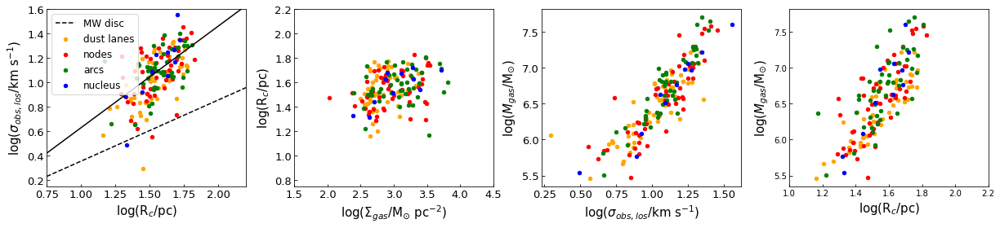

In [139]:
# For Figure 8 middle, I need to calculate virial mass. I can use equation 9 ($M_{vir}=5\sigma^2R_c/G$) = 1.1615e3*sigma^2*R_c

fig, axs = plt.subplots(1,4,figsize=(17,4),constrained_layout = True); axs = axs.ravel()

### ax0 fitting line & MW line ###

x0 = np.linspace(0.1,500,100)
axs[0].plot(np.log10(x0),np.log10(params1[1]*x0**params1[0]),'k') # plot the results from the fitting with all data
axs[0].plot(np.log10(x0),0.5*np.log10(0.52*x0),'k--',label='MW disc') # reference, solomon 1987

### ax2 pressure line ###

x2 = range(10,10000)
surf = x2 * u.Msun * u.pc**-2
text=np.array([(1.1,-0.6),(1.3,-0.34),(1.5,0.02),(1.76,0.36),(2.2,0.65),(3,0.75)])

# for i in range(4,9):
#     P = 10**i*u.K *u.cm**-3*c.k_B.to('erg K-1')
#     P = ((P.to('Msun cm-1 s-2')/(3*surf)).to('km2 s-2 pc-1'))

#     y = np.sqrt(np.add(np.pi*G.value*x2/5,4*P.value))

#     axs[2].plot(np.log10(x2),np.log10(y),'k-',lw=0.5)
#     axs[2].text(text[i-3,0],text[i-3,1],r'10$^%s$' % i,fontsize=12)

# y = np.sqrt(np.pi*G.value*x2/5) #alpha = 1
# y2 = np.sqrt(np.pi*G.value*x2*2/5) #alpha =2
             
# axs[2].plot(np.log10(x2),np.log10(y),'k--',lw=1,label=r'$\alpha_{vir}$=1')
# axs[2].plot(np.log10(x2),np.log10(y2),'k:',lw=1,label=r'$\alpha_{vir}$=2')
                   
### plot all subplots

for i in (4,3,2,1):    
    print (len(Rc[i]),len(vrms_c[i]))
    axs[0].scatter(np.log10(Rc[i].astype('float')),np.log10(vrms_c[i].astype('float')),s=20,c=lines[i],label=name[i])
    axs[0].set_xlim(0.75,2.2)
    axs[0].set_ylim(0.15,1.6)
    axs[0].set_xlabel('log(R$_c$/pc)',fontsize=15)
    axs[0].set_ylabel('log($\sigma_{obs,los}$/km s$^{-1}$)',fontsize=15)
    
    Mvir = 1.1615e3*Rc[i].astype('float')*vrms_c[i].astype('float').astype('float')**2 # not log scale
    xerr = 0.434*(10**Mlum_c_err[i]/10**Mlum_c[i])
    yerr = np.sqrt((Rc_err[i].astype('float')/Rc[i].astype('float'))**2 + 2*(vrms_c_err[i].astype('float')/vrms_c[i].astype('float'))**2)
    #yerr = 0.434*(yerr/Mvir_s)
    #print (yerr)
    axs[1].scatter(surf_c[i],np.log10(Rc[i].astype('float')),s=20,c=lines[i])
    axs[1].set_xlim(1.5,4.5)
    axs[1].set_ylim(0.75,2.2)
    axs[1].set_xlabel('log($\Sigma_{gas}$/M$_{\odot}$ pc$^{-2}$)',fontsize=15)
    axs[1].set_ylabel('log(R$_c$/pc)',fontsize=15)
    


    axs[2].scatter(np.log10(vrms_c[i].astype('float')),Mlum_c[i],s=20,c=lines[i])
    #axs[2].set_xlim(1.2,3.5)
    #axs[2].set_ylim(0.15,1.6)
    axs[2].set_ylabel('log($M_{gas}$/M$_{\odot}$)',fontsize=15)
    axs[2].set_xlabel('log($\sigma_{obs,los}$/km s$^{-1}$)',fontsize=15)
    
    axs[3].scatter(np.log10(Rc[i].astype('float')),Mlum_c[i],s=20,c=lines[i])
    #axs[3].set_xlim(1.2,3.5)
    axs[3].set_xlim(1,2.2)
    axs[3].set_ylabel('log($M_{gas}$/M$_{\odot}$)',fontsize=15)
    axs[3].set_xlabel('log(R$_c$/pc)',fontsize=15)
    
    axs[0].tick_params(direction='in',which='both',axis='both',labelsize=13)
    axs[1].tick_params(direction='in',which='both',labelsize=13)  
    axs[2].tick_params(direction='in',which='both',labelsize=13)  

    
# ax1 1-to-1 line & alpha=2 line

#x1 = np.linspace(3.5,8.0,40)
x1 = np.linspace(3.5,8.0,40)
#axs[1].plot(np.log10(x1),np.log10(params2[1]*x1**params2[0]),'c')
# axs[1].plot(x1,params2[0]*x1+ params2[1],'c')
# axs[1].plot([3.5,8.5],[3.5,8.5],'k--',lw=1,label=r'$\alpha_{vir}$=1')
# axs[1].plot([3.5,8.5],[np.log10(2*10**3.5),np.log10(2*10**8.5)],'k:',lw=1,label=r'$\alpha_{vir}$=2')

axs[0].legend(loc=0,fontsize=12)
#axs[1].legend(loc=0,fontsize=12)
#axs[2].legend(loc=0,fontsize=12)

plt.tight_layout()
#plt.subplots_adjust()
#plt.savefig('testnew_%s.png' % folder,dpi=200)
plt.show()

# Need to fitting the data with errors
# for right panel, i need to find the pressure equilibrium curves

# Fitting test by regions

[0.83059244 0.63280073]
[14.13059281 -4.7898522 ]
51 51


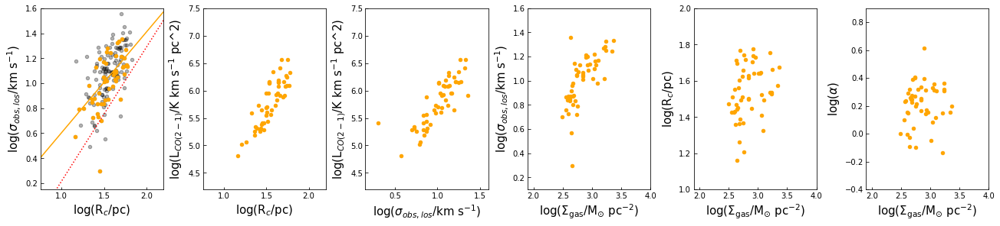

53 53


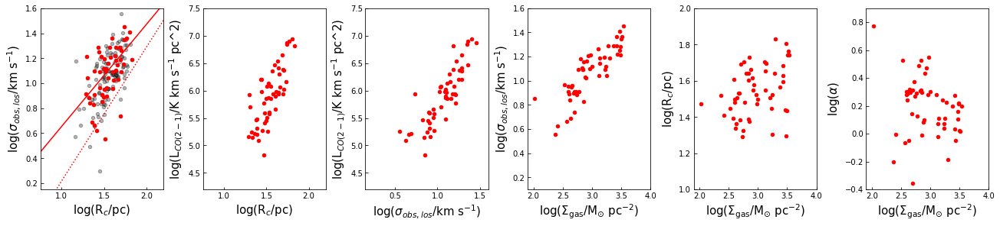

47 47


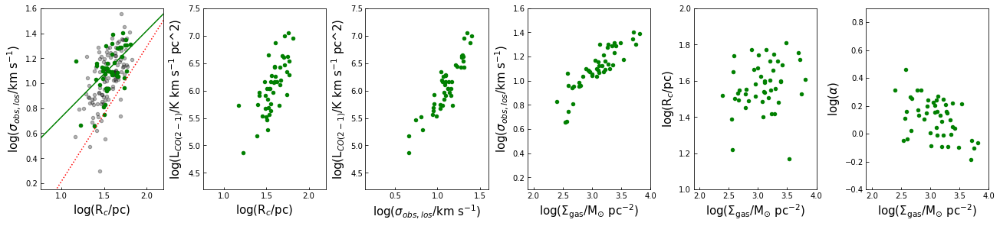

11 11


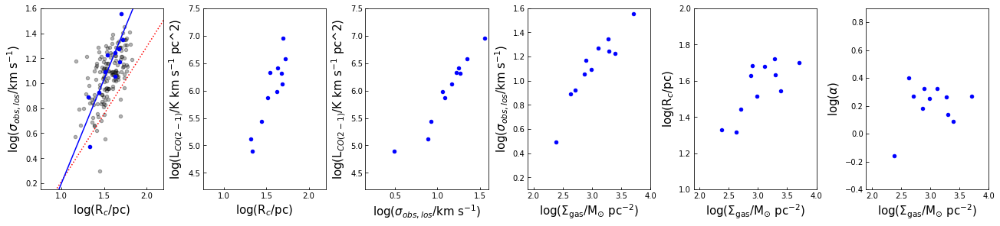

In [142]:
### Fitting ###

def powerlaw_func(x,a,b):
    return b*x**a

params1, params_cov1 = optimize.curve_fit(powerlaw_func,Rc_all,vrms_all)#,p0=[3,0.2])

params0, params_cov0 = optimize.curve_fit(powerlaw_linear_func,Rc_all,vrms_all)#,p0=[3,0.2])


Mvir=1/bG.value*Rc_all*vrms_all**2

def powerlaw_linear_func(x,a,b):
    return a*x+b

params2, params_cov2 = optimize.curve_fit(powerlaw_linear_func,np.log10(Mlum_all),np.log10(Mvir.astype('float')))#,p0=[1.2,1])

print (params1)
print (params2)


params3, params_cov3 = optimize.curve_fit(powerlaw_linear_func,np.log10(Rc_all.astype('float')),Lum_all.astype('float'))#,p0=[1.2,1])

params4, params_cov4 = optimize.curve_fit(powerlaw_func,Rc_all.astype('float'),10**Lum_all.astype('float'))#,p0=[1.2,1])

params0, params_cov0 = optimize.curve_fit(powerlaw_linear_func,np.log10(Rc_all.astype('float')),np.log10(vrms_all.astype('float')))#,p0=[3,0.2])


params5, params_cov5 = optimize.curve_fit(powerlaw_func,vrms_all,10**Lum_all.astype('float'))#,p0=[1.2,1])
params6, params_cov6 = optimize.curve_fit(powerlaw_linear_func,np.log10(vrms_all.astype('float')),Lum_all.astype('float'))#,p0=[1.2,1])


### Plot ###




### ax0 fitting line & MW line ###

x0 = np.linspace(0.1,500,100)
axs[0].plot(np.log10(x0),np.log10(params1[1]*x0**params1[0]),'k') # plot the results from the fitting with all data
#axs[0].plot(x0,params0[0]*x0+params0[1],'r')
axs[0].plot(np.log10(x0),0.5*np.log10(0.52*x0),'k--',label='MW disc') # reference, solomon 1987

### ax2 pressure line ###

x2 = range(10,10000)
surf = x2 * u.Msun * u.pc**-2
text=np.array([(1.1,-0.6),(1.3,-0.34),(1.5,0.02),(1.76,0.36),(2.2,0.65),(3,0.75)])

x3 = np.linspace(1,100,100)
x4 = np.linspace(0.1,2,100)

axs[1].plot(x0,params3[0]*x0+ params3[1],'r')
axs[1].plot(np.log10(x0),np.log10(params4[1]*x0**params4[0]),'k')
axs[1].plot(np.log10(x0),np.log10(25*x0**2.5),'k--')
axs[2].plot(np.log10(x3),np.log10(params5[1]*x3**params5[0]),'k')
axs[2].plot(np.log10(x3),np.log10(130*x3**5),'k--')
axs[2].plot(x4,params6[0]*x4+params6[1],'r')
# for i in range(4,9):
#     P = 10**i*u.K *u.cm**-3*c.k_B.to('erg K-1')
#     P = ((P.to('Msun cm-1 s-2')/(3*surf)).to('km2 s-2 pc-1'))

#     y = np.sqrt(np.add(np.pi*G.value*x2/5,4*P.value))

#     axs[2].plot(np.log10(x2),np.log10(y),'k-',lw=0.5)
#     axs[2].text(text[i-3,0],text[i-3,1],r'10$^%s$' % i,fontsize=12)

y = np.sqrt(np.pi*G.value*x2/5) #alpha = 1
y2 = np.sqrt(np.pi*G.value*x2*2/5) #alpha =2
             
#axs[2].plot(np.log10(x2),np.log10(y),'k--',lw=1,label=r'$\alpha_{vir}$=1')
#axs[2].plot(np.log10(x2),np.log10(y2),'k:',lw=1,label=r'$\alpha_{vir}$=2')
                   
### plot all subplots

for i in (4,3,2,1):    
    print (len(Rc[i]),len(vrms_c[i]))
    # sigma_obs vs Rc
    
    fig, axs = plt.subplots(1,6,figsize=(18,4),constrained_layout = True); axs = axs.ravel()
    axs[0].plot(np.log10(x0),np.log10(0.14*x0**1.07),'r:',label='NGC5806')
    axs[0].scatter(np.log10(Rc[0].astype('float')),np.log10(vrms_c[0].astype('float')),s=20,c='k',alpha=0.3,label=name[i])
    axs[0].scatter(np.log10(Rc[i].astype('float')),np.log10(vrms_c[i].astype('float')),s=20,c=lines[i],label=name[i])

    params1, params_cov1 = optimize.curve_fit(powerlaw_func,Rc[i],vrms_c[i])#,p0=[3,0.2])
    axs[0].plot(np.log10(x0),np.log10(params1[1]*x0**params1[0]),c=lines[i])
    # Lco vs Rc
    axs[1].scatter(np.log10(Rc[i].astype('float')),Lum_c[i].astype('float'),s=20,c=lines[i],label=name[i])

    
    # Lco vs sigma
    axs[2].scatter(np.log10(vrms_c[i].astype('float')),Lum_c[i].astype('float'),s=20,c=lines[i],label=name[i])

    
    axs[3].scatter(surf_c[i].astype('float'),np.log10(vrms_c[i].astype('float')),s=20,c=lines[i])
    axs[4].scatter(surf_c[i].astype('float'),np.log10(Rc[i].astype('float')),s=20,c=lines[i])
    axs[5].scatter(surf_c[i].astype('float'),np.log10(alpha_all[i].astype('float')),s=20,c=lines[i])

    
    axs[0].set_xlim(0.75,2.2)
    axs[0].set_ylim(0.15,1.6)
    axs[0].set_xlabel('log(R$_c$/pc)',fontsize=15)
    axs[0].set_ylabel('log($\sigma_{obs,los}$/km s$^{-1}$)',fontsize=15)

    axs[1].set_xlim(0.75,2.2)
    axs[1].set_ylim(4.2,7.5)
    axs[1].set_xlabel('log(R$_c$/pc)',fontsize=15)
    axs[1].set_ylabel('log(L$_{CO(2-1)}$/K km s$^{-1}$ pc^2)',fontsize=15)

    axs[2].set_xlim(0.15,1.6)
    axs[2].set_ylim(4.2,7.5)
    axs[2].set_ylabel('log(L$_{CO(2-1)}$/K km s$^{-1}$ pc^2)',fontsize=15)
    axs[2].set_xlabel('log($\sigma_{obs,los}$/km s$^{-1}$)',fontsize=15)

    axs[3].set_xlim(1.9,4)
    axs[3].set_ylim(0.1,1.6)
    axs[3].set_xlabel('log($\Sigma_{\mathrm{gas}}$/M$_{\odot}$ pc$^{-2}$)',fontsize=15)
    axs[3].set_ylabel('log($\sigma_{obs,los}$/km s$^{-1}$)',fontsize=15)

    axs[4].set_xlim(1.9,4)
    axs[4].set_ylim(1.0,2.0)
    axs[4].set_xlabel('log($\Sigma_{\mathrm{gas}}$/M$_{\odot}$ pc$^{-2}$)',fontsize=15)
    axs[4].set_ylabel('log(R$_c$/pc)',fontsize=15)

    axs[5].set_xlim(1.9,4)
    axs[5].set_ylim(-0.4,0.9)
    axs[5].set_xlabel('log($\Sigma_{\mathrm{gas}}$/M$_{\odot}$ pc$^{-2}$)',fontsize=15)
    axs[5].set_ylabel(r'log($\alpha$)',fontsize=15)
    plt.show()

[0.83059244 0.63280073]
[0.83059241 0.63280079]
spearman 0.5860501673203844
spearman 0.5924032689770143
51 51
0.6307431271279199 0.8041136002554247
spearman 0.6159812123818629
spearman 0.6406602931771855


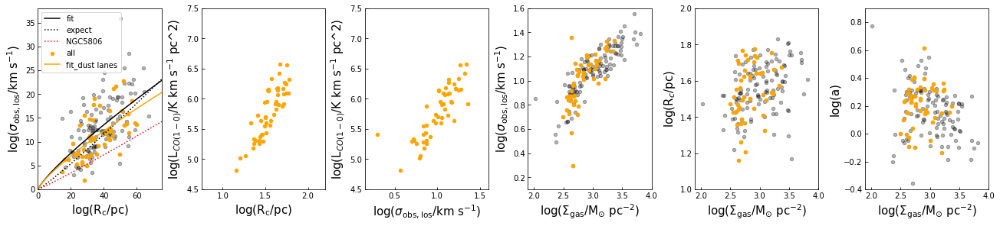

53 53
0.687009384536779 0.8162745743114699
spearman 0.5821435167492226
spearman 0.5317007614049394


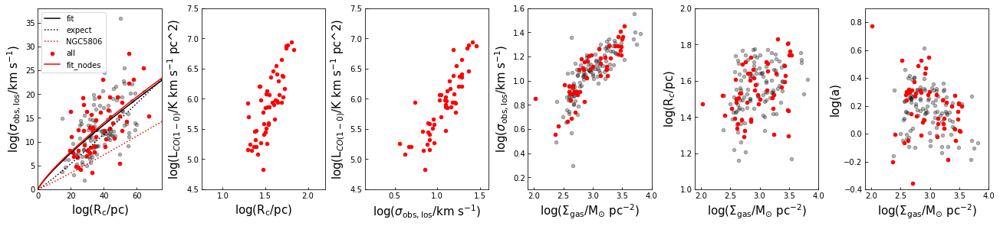

47 47
1.107523968382874 0.6858155724840477
spearman 0.5297968225936328
spearman 0.5158144375516583


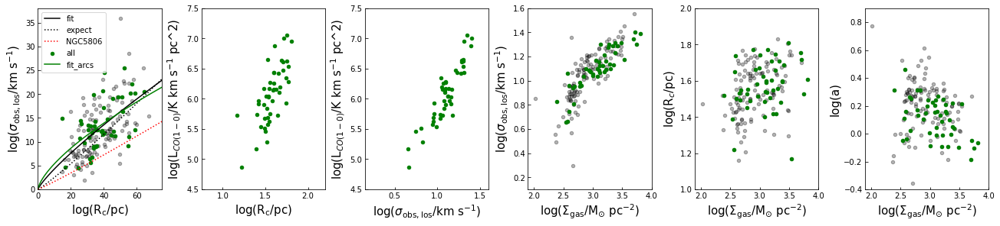

11 11
0.03514429037446707 1.6555880027029717
spearman 0.7824255992057858
spearman 0.8553378429955314


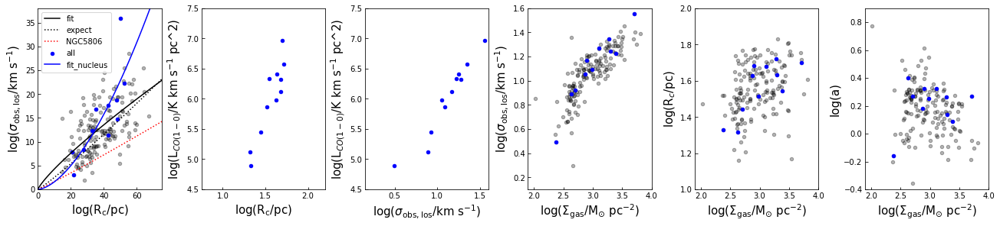

In [755]:
### Fitting ###

def powerlaw_func(x,a,b):
    return b*x**a

params1, params_cov1 = optimize.curve_fit(powerlaw_func,Rc_all,vrms_all)#,p0=[3,0.2])
params7, params_cov7 = optimize.curve_fit(powerlaw_func,Rc_all,vrms_all,p0=[2.0,0.01])
print (params1)
print (params7)


params0, params_cov0 = optimize.curve_fit(powerlaw_linear_func,Rc_all,vrms_all)#,p0=[3,0.2])


Mvir=1/bG.value*Rc_all*vrms_all**2

def powerlaw_linear_func(x,a,b):
    return a*x+b

params2, params_cov2 = optimize.curve_fit(powerlaw_linear_func,np.log10(Mlum_all),np.log10(Mvir.astype('float')))#,p0=[1.2,1])


#print (params2)


params3, params_cov3 = optimize.curve_fit(powerlaw_linear_func,np.log10(Rc_all.astype('float')),Lum_all.astype('float'))#,p0=[1.2,1])

params4, params_cov4 = optimize.curve_fit(powerlaw_func,Rc_all.astype('float'),10**Lum_all.astype('float'))#,p0=[1.2,1])

params0, params_cov0 = optimize.curve_fit(powerlaw_linear_func,np.log10(Rc_all.astype('float')),np.log10(vrms_all.astype('float')))#,p0=[3,0.2])


params5, params_cov5 = optimize.curve_fit(powerlaw_func,vrms_all,10**Lum_all.astype('float'))#,p0=[1.2,1])
params6, params_cov6 = optimize.curve_fit(powerlaw_linear_func,np.log10(vrms_all.astype('float')),Lum_all.astype('float'))#,p0=[1.2,1])


### Plot ###




### ax0 fitting line & MW line ###

x0 = np.linspace(0.1,100,100)
axs[0].plot(x0,(params1[1]*x0**params1[0]),'k') # plot the results from the fitting with all data
#axs[0].plot(x0,params0[0]*x0+params0[1],'r')
axs[0].plot(x0,(0.52*x0**0.5),'k--',label='MW disc') # reference, solomon 1987

### ax2 pressure line ###

x2 = range(10,10000)
surf = x2 * u.Msun * u.pc**-2
text=np.array([(1.1,-0.6),(1.3,-0.34),(1.5,0.02),(1.76,0.36),(2.2,0.65),(3,0.75)])

x3 = np.linspace(1,100,100)
x4 = np.linspace(0.1,2,100)

axs[1].plot(x0,params3[0]*x0+ params3[1],'r')
axs[1].plot(np.log10(x0),np.log10(params4[1]*x0**params4[0]),'k')
axs[1].plot(np.log10(x0),np.log10(25*x0**2.5),'k--')
axs[2].plot(np.log10(x3),np.log10(params5[1]*x3**params5[0]),'k')
axs[2].plot(np.log10(x3),np.log10(130*x3**5),'k--')
axs[2].plot(x4,params6[0]*x4+params6[1],'r')
# for i in range(4,9):
#     P = 10**i*u.K *u.cm**-3*c.k_B.to('erg K-1')
#     P = ((P.to('Msun cm-1 s-2')/(3*surf)).to('km2 s-2 pc-1'))

#     y = np.sqrt(np.add(np.pi*G.value*x2/5,4*P.value))

#     axs[2].plot(np.log10(x2),np.log10(y),'k-',lw=0.5)
#     axs[2].text(text[i-3,0],text[i-3,1],r'10$^%s$' % i,fontsize=12)

y = np.sqrt(np.pi*G.value*x2/5) #alpha = 1
y2 = np.sqrt(np.pi*G.value*x2*2/5) #alpha =2
             
#axs[2].plot(np.log10(x2),np.log10(y),'k--',lw=1,label=r'$\alpha_{vir}$=1')
#axs[2].plot(np.log10(x2),np.log10(y2),'k:',lw=1,label=r'$\alpha_{vir}$=2')
                   
### plot all subplots
print ('spearman',np.corrcoef(Rc[0].astype('float'),vrms_c[0].astype('float'))[0,1])
print ('spearman',np.corrcoef(np.log10(Rc[0].astype('float')),np.log10(vrms_c[0].astype('float')))[0,1])

for i in (4,3,2,1):    
    print (len(Rc[i]),len(vrms_c[i]))
    # sigma_obs vs Rc
    
    fig, axs = plt.subplots(1,6,figsize=(18,4),constrained_layout = True); axs = axs.ravel()
    axs[0].plot(x0,(params1[1]*x0**params1[0]),'k',label='fit')
    axs[0].plot(x0,(0.2*x0**1.1),'k:',label='expect')
    axs[0].plot((x0),(0.14*x0**1.07),'r:',label='NGC5806')
    #axs[0].plot(x0,(params7[1]*x0**params7[0]),'b:')


    axs[0].scatter((Rc[0].astype('float')),(vrms_c[0].astype('float')),s=20,c='k',alpha=0.3)
    axs[0].scatter((Rc[i].astype('float')),(vrms_c[i].astype('float')),s=20,c=lines[i],label='all')

    params10, params_cov10 = optimize.curve_fit(powerlaw_func,Rc[i],vrms_c[i])#,p0=[3,0.2])
    axs[0].plot((x0),(params10[1]*x0**params10[0]),c=lines[i],label='fit_%s' % name[i])
    print (params10[1],params10[0])
    print ('spearman',np.corrcoef(Rc[i].astype('float'),vrms_c[i].astype('float'))[0,1])
    print ('spearman',np.corrcoef(np.log10(Rc[i].astype('float')),np.log10(vrms_c[i].astype('float')))[0,1])
    # Lco vs Rc
    axs[1].scatter(np.log10(Rc[i].astype('float')),Lum_c[i].astype('float'),s=20,c=lines[i],label=name[i])

    
    # Lco vs sigma
    axs[2].scatter(np.log10(vrms_c[i].astype('float')),Lum_c[i].astype('float'),s=20,c=lines[i],label=name[i])

    axs[3].scatter(surf_c[0].astype('float'),np.log10(vrms_c[0].astype('float')),s=20,fc='k',alpha=0.3)
    axs[3].scatter(surf_c[i].astype('float'),np.log10(vrms_c[i].astype('float')),s=20,c=lines[i])
    
    axs[4].scatter(surf_c[0].astype('float'),np.log10(Rc[0].astype('float')),s=20,c='k',alpha=0.3)
    axs[4].scatter(surf_c[i].astype('float'),np.log10(Rc[i].astype('float')),s=20,c=lines[i])
    
    axs[5].scatter(surf_c[0].astype('float'),np.log10(alpha_all[0].astype('float')),s=20,c='k',alpha=0.3)
    axs[5].scatter(surf_c[i].astype('float'),np.log10(alpha_all[i].astype('float')),s=20,c=lines[i])

    
    #axs[0].set_xlim(0.75,2.2)
    #axs[0].set_ylim(0.15,1.6)
    axs[0].set_xlabel('log(R$_{\mathrm{c}}$/pc)',fontsize=15)
    axs[0].set_ylabel('log($\sigma_{\mathrm{obs,los}}$/km s$^{-1}$)',fontsize=15)
    axs[0].set_xlim(0,75)
    axs[0].set_ylim(0,38)
    
    axs[1].set_xlim(0.75,2.2)
    axs[1].set_ylim(4.5,7.5)
    axs[1].set_xlabel('log(R$_{\mathrm{c}}$/pc)',fontsize=15)

    axs[1].set_ylabel('log(L$_{CO(1-0)}$/K km s$^{-1}$ pc^2)',fontsize=15)

    axs[2].set_xlim(0.15,1.6)
    axs[2].set_ylim(4.5,7.5)
    axs[2].set_ylabel('log(L$_{CO(1-0)}$/K km s$^{-1}$ pc^2)',fontsize=15)
    axs[2].set_xlabel('log($\sigma_{\mathrm{obs,los}}$/km s$^{-1}$)',fontsize=15)

    axs[3].set_xlim(1.9,4)
    axs[3].set_ylim(0.1,1.6)
    axs[3].set_xlabel('log($\Sigma_{\mathrm{gas}}$/M$_{\odot}$ pc$^{-2}$)',fontsize=15)
    axs[3].set_ylabel('log($\sigma_{\mathrm{obs,los}}$/km s$^{-1}$)',fontsize=15)

    axs[4].set_xlim(1.9,4)
    axs[4].set_ylim(1.0,2.0)
    axs[4].set_xlabel('log($\Sigma_{\mathrm{gas}}$/M$_{\odot}$ pc$^{-2}$)',fontsize=15)
    axs[4].set_ylabel('log(R$_c$/pc)',fontsize=15)

    axs[5].set_xlim(1.9,4)
    axs[5].set_ylim(-0.4,0.9)
    axs[5].set_xlabel('log($\Sigma_{\mathrm{gas}}$/M$_{\odot}$ pc$^{-2}$)',fontsize=15)
    axs[5].set_ylabel('log(a)',fontsize=15)
    axs[0].legend(loc='upper left')
    plt.show()
    plt.close()

# Radial analysis

In [171]:
theta33 = theta
convert = theta33[theta33>180]-360

print (theta)
#print (convert)
#print ()

theta33[theta33>180] = convert

#theta = abs(theta)
#theta33 = abs(theta33)

#print (theta33)

[329.8  10.7 264.4  64.9  55.2 285.8 292.5 104.3 291.1 223.  182.1 297.7
  12.2  11.8 285.4 231.  328.9 338.3 342.7  25.2 322.4  56.7  57.9 325.4
  69.6 300.6  86.6 251.2  83.8 142.9   9.1  36.6  29.5  33.4  24.4 113.7
 231.8  11.9 187.1 204.5  23.2  26.1  94.3 250.1 270.1 104.9  36.4  82.4
 229.3  13.5 134.3 244.2 342.8  30.2 318.7 327.5  13.1  94.4 145.5 344.
 336.5  67.6 225.4 322.8 154.1 291.4 217.6 127.4 267.9 349.2   1.8 116.6
 225.2  24.  320.9 324.5 149.4 116.  153.  139.2 334.1 252.6 161.1 359.9
 203.6 350.4 123.6  59.2 349.9  62.9 250.  257.9 274.3 312.6 335.5 278.9
 228.7 299.6 254.8  77.3  42.  222.7 111.9   0.6  40.5 340.2 350.5 331.9
 354.7   7.8 287.8   6.8 173.7 125.1  67.2  51.5  81.8  26.  282.   10.4
 104.5 238.  167.9 226.  131.3 326.2   4.7 295.  169.5  77.3  23.2 146.2
  17.2  43.6 314.7 294.1 313.9 196.5 337.3 105.7  13.  305.6 295.9  99.3
  10.5 283.8 279.2 349.4  80.1 128.1 172.3 129.1 283.6 112.3 359.8 199.7
  73.8  11.8]


Theta ranges -180 - 180 degree
Theta= [329.8  10.7 264.4  64.9  55.2 285.8 292.5 104.3 291.1 223.  182.1 297.7
  12.2  11.8 285.4 231.  328.9 338.3 342.7  25.2 322.4  56.7  57.9 325.4
  69.6 300.6  86.6 251.2  83.8 142.9   9.1  36.6  29.5  33.4  24.4 113.7
 231.8  11.9 187.1 204.5  23.2  26.1  94.3 250.1 270.1 104.9  36.4  82.4
 229.3  13.5 134.3 244.2 342.8  30.2 318.7 327.5  13.1  94.4 145.5 344.
 336.5  67.6 225.4 322.8 154.1 291.4 217.6 127.4 267.9 349.2   1.8 116.6
 225.2  24.  320.9 324.5 149.4 116.  153.  139.2 334.1 252.6 161.1 359.9
 203.6 350.4 123.6  59.2 349.9  62.9 250.  257.9 274.3 312.6 335.5 278.9
 228.7 299.6 254.8  77.3  42.  222.7 111.9   0.6  40.5 340.2 350.5 331.9
 354.7   7.8 287.8   6.8 173.7 125.1  67.2  51.5  81.8  26.  282.   10.4
 104.5 238.  167.9 226.  131.3 326.2   4.7 295.  169.5  77.3  23.2 146.2
  17.2  43.6 314.7 294.1 313.9 196.5 337.3 105.7  13.  305.6 295.9  99.3
  10.5 283.8 279.2 349.4  80.1 128.1 172.3 129.1 283.6 112.3 359.8 199.7
  73.8  11.8]


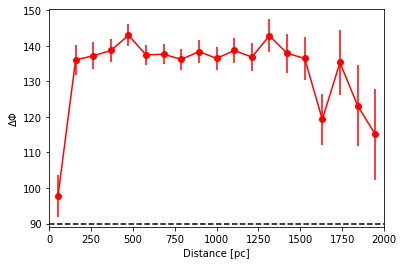

In [185]:
#print (center_ra*15)
from scipy.stats import binned_statistic
#print (ra_all*15)
#print (dec_all.shape)
d_test = []
theta_test = []
arctopc = 103 # 1arcsec equals 103 pc
sss = []
#print (len(Rc[0]))
print ('Theta ranges -180 - 180 degree')
print ('Theta=',theta)
print ('Absolute values of differences are used for the calculation')
print ('Green dots are representing the mean value of each iteration')
print ('Black dots are representing the mean value of green dots in each bin')
print ('Red dots are using all value to calculate the mean and error of mean')
for i in range(len(Rc[0])):
    
    ra_modi = (ra_all-ra_all[i])*15/np.cos(58*np.pi/180)
    dist =np.sqrt(ra_modi**2 + (dec_all-dec_all[i])**2)
    theta_diff = theta-theta[i]
    d_test.extend(dist*arctopc)
    theta_test.extend(abs(theta_diff))
    ### Mean of each bin for each iteration ###
    s, edges, _ = binned_statistic(d_test,theta_test,statistic='mean',bins=np.linspace(0,2000,20))   
    s = list(s)
    sss.append(s)
    #plt.scatter(dist*arctopc,abs(theta_diff))
    #plt.scatter(edges[:-1]+np.diff(edges)/2,s,c='g')

sss = np.array(sss)

### Mean of green dots ###
#plt.scatter(edges[:-1]+np.diff(edges)/2,np.nanmean(sss,axis=0),c='k')
#plt.errorbar(edges[:-1]+np.diff(edges)/2,np.nanmean(sss,axis=0),yerr=np.nanstd(sss,axis=0),c='k')
#plt.show()

s, edges, _ = binned_statistic(d_test,theta_test,statistic='mean',bins=np.linspace(0,2000,20))
std, edges, _ = binned_statistic(d_test,theta_test,statistic='std',bins=np.linspace(0,2000,20))   
count, edges, bb = binned_statistic(d_test,theta_test,statistic='count',bins=np.linspace(0,2000,20))

### Average value of of differences in each bin ##
plt.scatter(edges[:-1]+np.diff(edges)/2,s,c='r')
plt.errorbar(edges[:-1]+np.diff(edges)/2,s,yerr=std/np.sqrt(count/2),c='r')
plt.axhline(90,c='k',ls='--')
plt.xlim(0,2000)
#plt.ylim(50,150)
plt.xlabel('Distance [pc]')
plt.ylabel(r'$\Delta \Phi$')
plt.show()


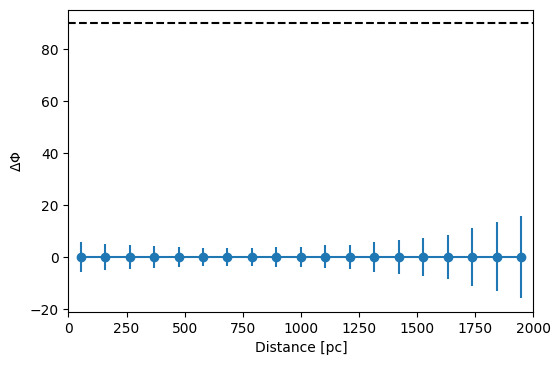

In [186]:
#print (center_ra*15)
from scipy.stats import binned_statistic
#print (ra_all*15)
#print (dec_all.shape)
d_test = []
theta_test = []
arctopc = 103 # 1arcsec equals 103 pc
for i in range(len(Rc[0])):
    ra_modi = (ra_all-ra_all[i])*15/np.cos(58*np.pi/180)
    dist =np.sqrt(ra_modi**2 + (dec_all-dec_all[i])**2)
    theta_diff = theta-theta[i]
    d_test.extend(dist*arctopc)
    theta_test.extend((theta_diff))
    #print (theta_test)
    #plt.scatter(dist*arctopc,abs(theta_diff))
#print (d_test)
#print (theta_test)

plt.subplots(dpi=100)
s, edges, _ = binned_statistic(d_test,theta_test,statistic='mean',bins=np.linspace(0,2000,20))
std, edges, _ = binned_statistic(d_test,theta_test,statistic='std',bins=np.linspace(0,2000,20))   
count, edges, bb = binned_statistic(d_test,theta_test,statistic='count',bins=np.linspace(0,2000,20))

#print (std)
plt.scatter(edges[:-1]+np.diff(edges)/2,s)
plt.errorbar(edges[:-1]+np.diff(edges)/2,s,yerr=std/np.sqrt(count))
plt.axhline(90,c='k',ls='--')
plt.xlim(0,2000)
#plt.ylim(50,150)
plt.xlabel('Distance [pc]')
plt.ylabel(r'$\Delta \Phi$')
plt.show()


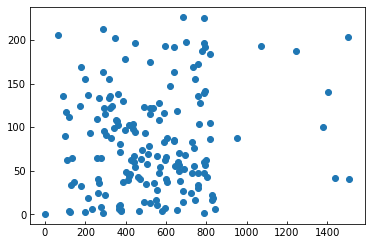

In [166]:
plt.scatter(dist*arctopc,abs(theta_diff))

In [76]:
def angle_between(p1, p2):
    ang1 = np.arctan2(*p1[::-1])
    ang2 = np.arctan2(*p2[::-1])
    return np.rad2deg((ang1 - ang2) % (2 * np.pi))

AZ = [] 
for i in range(len(ra_off_new)):
    az = (angle_between([0,0],[-ra_off_new[i],dec_off_new[i]]))
    AZ.append(round(az,2))

AZ = np.array(AZ) # originally clockwise angle change
AZ = -(AZ-360) # MAKE 'az' as counter-clockwise

rn_ind = ring_node_index

def moving_average(a, n=3) :
    ret = np.cumsum(a, dtype=float)
    ret[n:] = ret[n:] - ret[:-n]
    return ret[n - 1:] / n

In [77]:
print (Mlum_all[rn_ind])
print (Mlum_ring)
print (AZ)

[6.36800781 6.61426429 7.26310086 6.90165989 6.49002875 6.17799796
 5.85509495 6.92743709 5.89839605 6.30612467 5.92788341 6.79959554
 7.64473098 6.31435184 6.10281089 5.81670518 6.05835009 6.80500443
 7.69875975 5.46731206 6.67487032 6.37184336 6.2137833  7.53852849
 6.91124286 7.45684713 6.12086994 6.62917506 6.74826557 6.41800282
 7.29088233 6.15857356 6.54900326 6.55504606 6.15087919 6.33039348
 7.59991144 5.96194288 7.24973386 5.50677554 6.80881843 6.5693622
 6.61483396 7.4800127  6.5095251  6.98526476 6.81183631 6.40140054
 6.81166882 7.18661453 6.6121054  6.68563427 6.572709   6.70735723
 7.07161693 6.68369529 6.85002099 6.58532534 6.49363926 7.11645498
 6.78726914 6.27519614 6.42473467 7.17454822 7.51723022 6.61788063
 6.83319175 6.50478339 6.38111508 6.93824946 6.54342233 5.91676968
 6.22328822 6.85149073 7.28377824 7.02100727 7.07236388 7.10670073
 6.23567992 5.84911217 7.29662571 6.10387211 6.77870101 6.14351442
 7.52063679 6.34553056 6.12375367 6.66842319 5.72892165 7.07874

In [78]:
n = 5
rot_ang = 335
AZa, alpha_new = zip(*sorted(zip(AZ[rn_ind], alpha[rn_ind])))
AZa = np.array(AZa); alpha_new = np.array(alpha_new)
alpha_new = np.append(alpha_new[AZa>rot_ang],alpha_new[AZa<=rot_ang])
alpha_new = np.array(np.append(alpha_new[-n::],alpha_new))

AZm, Mlum_all_new = zip(*sorted(zip(AZ[rn_ind], Mlum_all[rn_ind])))
AZm = np.array(AZm); Mlum_all_new = np.array(Mlum_all_new)
Mlum_all_new = np.append(Mlum_all_new[AZa>rot_ang],Mlum_all_new[AZa<=rot_ang])
Mlum_all_new = np.array(np.append(Mlum_all_new[-n::],Mlum_all_new))

AZv, vrms_all_new = zip(*sorted(zip(AZ[rn_ind], vrms_all[rn_ind])))
AZv = np.array(AZv); vrms_all_new = np.array(vrms_all_new)
vrms_all_new = np.append(vrms_all_new[AZa>rot_ang],vrms_all_new[AZa<=rot_ang])
vrms_all_new = np.array(np.append(vrms_all_new[-n::],vrms_all_new))

AZr, Rc_all_new = zip(*sorted(zip(AZ[rn_ind], Rc_all[rn_ind])))
AZr = np.array(AZr); Rc_all_new = np.array(Rc_all_new)
Rc_all_new = np.append(Rc_all_new[AZa>rot_ang],Rc_all_new[AZa<=rot_ang])
Rc_all_new = np.array(np.append(Rc_all_new[-n::],Rc_all_new))

AZs, surf_all_new = zip(*sorted(zip(AZ[rn_ind], (10**Mlum_all/(np.pi*Rc_all**2))[rn_ind])))
AZs = np.array(AZs); surf_all_new = np.array(surf_all_new)
surf_all_new = np.append(surf_all_new[AZa>rot_ang],surf_all_new[AZa<=rot_ang])
surf_all_new = np.array(np.append(surf_all_new[-n::],surf_all_new))

AZvl, Vlsr_all_new = zip(*sorted(zip(AZ[rn_ind], Vlsr_all[rn_ind])))
AZvl = np.array(AZvl); Vlsr_all_new = np.array(Vlsr_all_new)
Vlsr_all_new = np.append(Vlsr_all_new[AZa>rot_ang],Vlsr_all_new[AZa<=rot_ang])
Vlsr_all_new = np.array(np.append(Vlsr_all_new[-n::],Vlsr_all_new))



AZa = np.append(AZa[AZa>rot_ang]-rot_ang,AZa[AZa<=rot_ang]+360-rot_ang)
AZm = np.append(AZm[AZm>rot_ang]-rot_ang,AZm[AZm<=rot_ang]+360-rot_ang)
AZv = np.append(AZv[AZv>rot_ang]-rot_ang,AZv[AZv<=rot_ang]+360-rot_ang)
AZr = np.append(AZr[AZr>rot_ang]-rot_ang,AZr[AZr<=rot_ang]+360-rot_ang)
AZs = np.append(AZs[AZs>rot_ang]-rot_ang,AZs[AZs<=rot_ang]+360-rot_ang)
AZvl = np.append(AZvl[AZvl>rot_ang]-rot_ang,AZvl[AZvl<=rot_ang]+360-rot_ang)

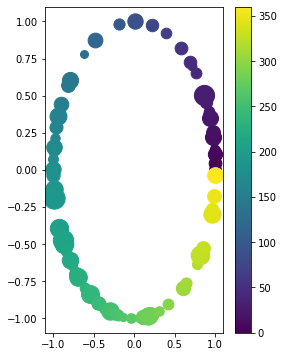

In [79]:


cmap = plt.get_cmap('RdYlBu_r', 8)
plt.figure(figsize=(4,6))
for i in range(len(AZa)):
    plt.scatter(np.cos(np.deg2rad(AZa[i])),np.sin(np.deg2rad(AZa[i])),s=Rc_all_new[i+5]**2/10,c=AZa[i],vmin=0,vmax=360)
    
    #print (AZa[i])
plt.colorbar()
plt.show()

In [80]:
#print ((np.array(AZa)>30)&(np.array(AZa)<60))
A_mean = []
AM_mean = []
M_mean = []
V_mean = []
R_mean = []
S_mean = []

A_std = []
AM_std = []
M_std = []
V_std = []
R_std = []
S_std = []


alpha_new2 = alpha_new[n::]
Mlum_all_new2 = Mlum_all_new[n::]
vrms_all_new2 = vrms_all_new[n::]
Rc_all_new2 = Rc_all_new[n::]
surf_all_new2 = surf_all_new[n::]
vlsr_all_new2 = Vlsr_all_new[n::]

for i in range(12):
    ttt = ((np.array(AZa)>i*30)&(np.array(AZa)<(i+1)*30))
    #print (ttt)
    alpha_mean = np.mean(alpha_new2[ttt])
    am_mean = np.mean((alpha_new2*Mlum_all_new2)[ttt])
    Mlum_mean = np.mean(Mlum_all_new2[ttt])
    vrms_mean = np.mean(vrms_all_new2[ttt])
    r_mean = np.mean(Rc_all_new2[ttt])
    s_mean = np.mean(surf_all_new2[ttt])
    
    alpha_std = np.std(alpha_new2[ttt])
    am_std = np.std((alpha_new2*Mlum_all_new2)[ttt])
    Mlum_std = np.std((Mlum_all_new2[ttt]))
    vrms_std = np.std(vrms_all_new2[ttt])
    r_std = np.std(Rc_all_new2[ttt])
    s_std = np.std(np.log10(surf_all_new2[ttt]))

    
    
    A_mean.append(alpha_mean)
    AM_mean.append(am_mean)
    M_mean.append(Mlum_mean)
    V_mean.append(vrms_mean)
    R_mean.append(r_mean)
    S_mean.append(s_mean)
    
        
    A_std.append(alpha_std/2)
    AM_std.append(am_std/2)
    M_std.append(Mlum_std/2)
    V_std.append(vrms_std/2)
    R_std.append(r_std/2)
    S_std.append(s_std/2)
    
print (A_mean)
print (M_mean)
print (V_mean)
print (R_mean)
    

[1.566757768160035, 1.7171439467857756, 1.1810155378197953, 1.396863708911776, 1.5513874621883919, 2.0217002490173415, 1.0798053370229652, 1.5258806943457612, 1.4453992762170882, 1.2394387498088122, 1.6870743348397415, 1.7416693317997862]
[6.5076307123153985, 6.864243638839416, 7.217589275231467, 6.554193946270203, 6.7032251560885525, 6.429211722475657, 7.0007986522889025, 6.563472496079342, 6.6133149930514366, 6.5818471796532965, 6.833286285516135, 6.953509338230103]
[12.288571428571428, 17.116000000000003, 19.990000000000002, 10.16, 13.299999999999999, 11.599999999999998, 15.44375, 12.703999999999999, 12.19846153846154, 11.55, 15.322, 18.146]
[33.846666666666664, 41.202000000000005, 40.50666666666667, 40.99, 40.053333333333335, 35.67375, 49.21875, 39.077, 34.755384615384614, 37.25125, 43.048, 42.922000000000004]


In [81]:
import pandas as pd

In [82]:
df = pd.DataFrame({'a': alpha_new[n::]},index = AZa)

In [83]:
#print (df)
#print (df.rolling(30).mean())
#print (len(AZa))
ddd = df.rolling(2).mean()
print (ddd['a'])
#plt.plot(AZa,ddd)
#print (ddd.shape)

0.15           NaN
0.28      1.969365
0.43      1.384128
2.69      1.614832
3.20      1.454393
            ...   
342.56    2.096060
344.48    1.346505
349.83    2.088637
357.99    2.368223
358.05    1.475613
Name: a, Length: 99, dtype: float64


In [84]:
print (np.log10(M_std))

[-0.68825002 -0.46962766 -1.28893669 -0.85542921 -0.81383817 -0.6819327
 -0.47945895 -0.45487227 -0.91747023 -0.69506874 -0.87055379 -0.80152114]


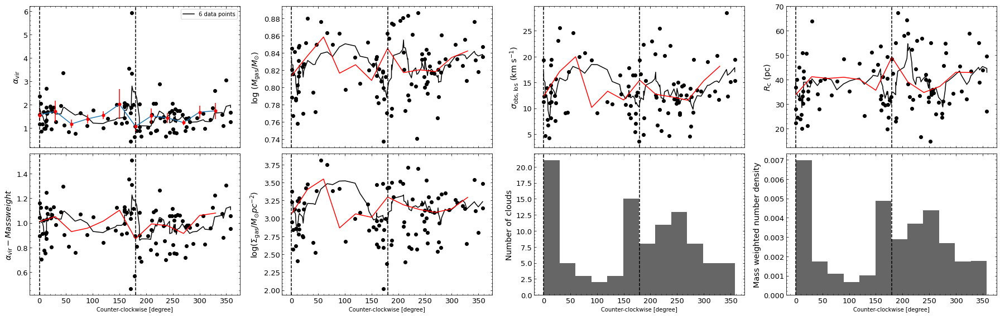

In [85]:
#plt.scatter(AZ,alpha,c='k',alpha=0.3)

#print (AZ.shape)
#print (alpha.shape)

azm = np.arange(0,360,30)
fig, axs = plt.subplots(2, 4, sharex='col',figsize=(25,8))
axs = axs.ravel()

#plt.figure()
#axs[0].hist(AZ[rn_ind],bins=12,weights=alpha[rn_ind],zorder=5)
axs[0].scatter((AZa),(alpha_new[n::]),fc='k')
axs[0].plot(AZa,np.convolve(alpha_new, np.ones(n+1), "valid")/(n+1),c='k',label='6 data points')
#axs[0].plot(azm,A_mean,c='r',label='30 degree window')
axs[0].errorbar(azm,A_mean,A_std, mfc='red',marker='.', mec='red', ms=10, mew=1,ecolor='r')
#axs[0].text(3,5.7,'right node')
axs[0].axvline(0,c='k',ls='--')
#axs[0].text(180+3,5.7,'left node')
axs[0].axvline(180,c='k',ls='--')
#plt.text(90+3,7,'southern ring')
#plt.axvline(90,c='k',ls='--')
#plt.text(270+3,7,'northern ring')
#plt.axvline(270,c='k',ls='--')
#axs[0].set_ylim(0,5.5)
#axs[0].xlabel('Azimuthal direction [degree]')
axs[0].set_ylabel(r'$\alpha_{\mathrm{vir}}$',fontsize='x-large')
axs[0].legend(loc=0)

axs[4].scatter((AZa),np.log10(alpha_new[n::]*Mlum_all_new[n::]),fc='k')
axs[4].plot(AZa,np.log10(np.convolve(alpha_new*Mlum_all_new, np.ones(n+1), "valid")/(n+1)),c='k')
axs[4].plot(azm,np.log10(AM_mean),c='r')
#axs[2].plot(azm,np.log10(M_mean),c='r')
#axs[0].plot(AZa,np.convolve(alpha_new, np.ones(4), "valid")/4,c='k')
#axs[2].text(3,5.7,'right node')
axs[4].axvline(0,c='k',ls='--')
#axs[2].text(180+3,5.7,'left node')
axs[4].axvline(180,c='k',ls='--')
#plt.text(90+3,7,'southern ring')
#plt.axvline(90,c='k',ls='--')
#plt.text(270+3,7,'northern ring')
#plt.axvline(270,c='k',ls='--')
#axs[0].set_ylim(0,5.5)
#axs[0].xlabel('Azimuthal direction [degree]')
axs[4].set_ylabel(r'$\alpha_{\mathrm{vir}} -  Mass weight$',fontsize='x-large')

#plt.figure()
#plt.scatter(AZ,np.log10(Mlum_all),c='k',alpha=0.3)
axs[1].scatter(AZm,np.log10(Mlum_all_new[n::]),fc='k')
axs[1].plot(AZm,np.log10(np.convolve(Mlum_all_new, np.ones(n+1), "valid")/(n+1)),c='k')
#axs[1].hist(AZ[rn_ind],np.log10(Mlum_all)[rn_ind],bins=12)
axs[1].plot(azm,np.log10(M_mean),c='r')
#axs[0].xlabel('Azimuthal direction [degree]')
axs[1].axvline(0,c='k',ls='--')
axs[1].axvline(180,c='k',ls='--')
#plt.axvline(90,c='k',ls='--')
#plt.axvline(270,c='k',ls='--')
axs[1].set_ylabel(r'log ($M_{\mathrm{gas}}$/$M_{\odot}$)',fontsize='x-large')

#plt.figure()
#plt.scatter(AZ,vrms_all,c='k',alpha=0.3)
axs[2].scatter(AZv,vrms_all_new[n::],fc='k')
axs[2].plot(AZa,np.convolve(vrms_all_new, np.ones(n+1), "valid")/(n+1),c='k')
#axs[0].xlabel('Azimuthal direction [degree]')
axs[2].plot(azm,V_mean,c='r')
axs[2].axvline(0,c='k',ls='--')
axs[2].axvline(180,c='k',ls='--')
#plt.axvline(90,c='k',ls='--')
#plt.axvline(270,c='k',ls='--')
axs[2].set_ylabel(r'$\sigma_{\mathrm{obs,los}}$ (km s$^{-1}$)',fontsize='x-large')

#plt.figure()
#plt.scatter(AZ,vrms_all,c='k',alpha=0.3)
#axs[3].hist(AZ[rn_ind],bins=12,weights=Rc_all[rn_ind],zorder=5)
axs[3].scatter(AZr,Rc_all_new[n::],fc='k')#,zorder=10,fc='k')
axs[3].plot(AZa,np.convolve(Rc_all_new, np.ones(n+1), "valid")/(n+1),c='k')
axs[3].plot(azm,R_mean,c='r')
#axs[0].xlabel('Azimuthal direction [degree]')
axs[3].axvline(0,c='k',ls='--')
axs[3].axvline(180,c='k',ls='--')
#plt.axvline(90,c='k',ls='--')
#plt.axvline(270,c='k',ls='--')
axs[3].set_ylabel(r'$R_{\mathrm{c}}$ (pc)',fontsize='x-large')

axs[5].scatter(AZs,np.log10(surf_all_new[n::]),fc='k')#,zorder=10,fc='k')
axs[5].plot(AZs,np.log10(np.convolve(surf_all_new, np.ones(n+1), "valid")/(n+1)),c='k')
axs[5].plot(azm,np.log10(S_mean),c='r')
#axs[0].xlabel('Azimuthal direction [degree]')
axs[5].axvline(0,c='k',ls='--')
axs[5].axvline(180,c='k',ls='--')
#plt.axvline(90,c='k',ls='--')
#plt.axvline(270,c='k',ls='--')
axs[5].set_ylabel(r'log($\Sigma_{\mathrm{gas}}/M_{\odot}pc^{-2})$',fontsize='x-large')


axs[6].hist(AZm,bins=12,fc='k',alpha=0.6)
axs[6].axvline(0,c='k',ls='--')
axs[6].axvline(180,c='k',ls='--')
axs[6].set_ylabel('Number of clouds',fontsize='x-large')
axs[6].set_xlabel('Counter-clockwise [degree]')

axs[7].hist(AZm,bins=12,weights=Mlum_all_new[n::],fc='k',alpha=0.6,density=True)
axs[7].axvline(0,c='k',ls='--')
axs[7].axvline(180,c='k',ls='--')
axs[7].set_ylabel('Mass weighted number density',fontsize='x-large')
axs[7].set_xlabel('Counter-clockwise [degree]')

axs[4].set_xlabel('Counter-clockwise [degree]')

axs[5].set_xlabel('Counter-clockwise [degree]')

for i in range(8):
    axs[i].tick_params(direction='in',which='both',labelsize=13,top='on',right='on')
    axs[i].minorticks_on()

plt.tight_layout()
#plt.savefig('az_function_plots.png')

(99,)
alpha_mean 1.5613377962580484
alpha_frac 18
sigma_mean 13.316565656565658
38.13565656565656


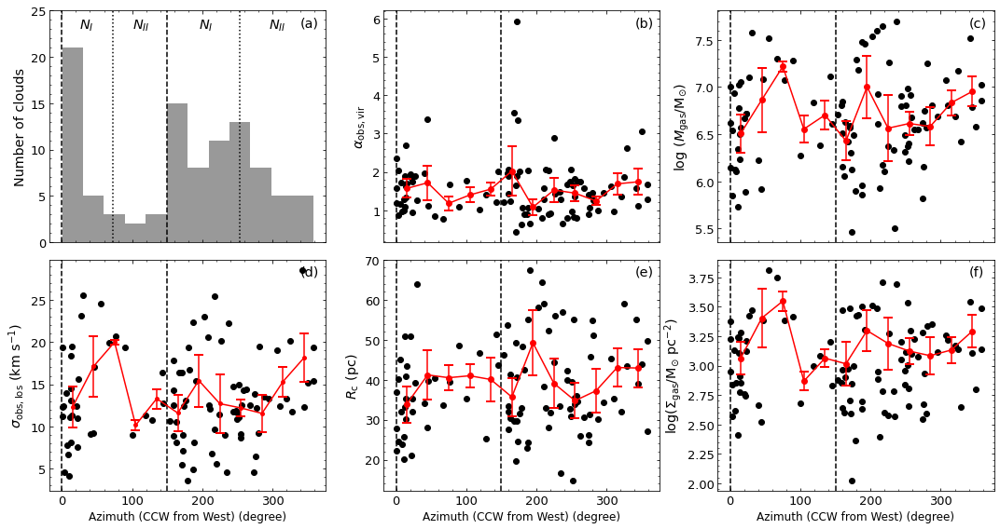

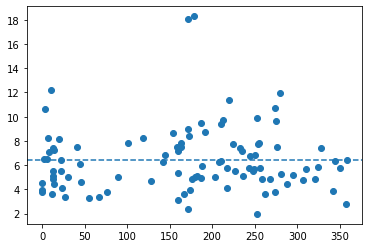

6.438585518639554
[1.5000e-01 2.8000e-01 4.3000e-01 2.6900e+00 3.2000e+00 5.9900e+00
 7.5000e+00 8.3000e+00 1.0760e+01 1.1500e+01 1.2920e+01 1.2960e+01
 1.3410e+01 1.3410e+01 1.4430e+01 1.4610e+01 2.0450e+01 2.1840e+01
 2.2710e+01 2.3170e+01 2.7080e+01 3.0310e+01 4.0640e+01 4.4410e+01
 4.6370e+01 5.4900e+01 6.6930e+01 7.6950e+01 8.9620e+01 1.0058e+02
 1.1918e+02 1.2844e+02 1.4258e+02 1.4498e+02 1.5371e+02 1.5880e+02
 1.5942e+02 1.5953e+02 1.5955e+02 1.6314e+02 1.6322e+02 1.6747e+02
 1.7111e+02 1.7113e+02 1.7194e+02 1.7258e+02 1.7342e+02 1.7595e+02
 1.7855e+02 1.7958e+02 1.8218e+02 1.8719e+02 1.8739e+02 1.8804e+02
 1.9111e+02 2.0295e+02 2.0839e+02 2.0991e+02 2.1050e+02 2.1333e+02
 2.1756e+02 2.1766e+02 2.2003e+02 2.2473e+02 2.2648e+02 2.3260e+02
 2.3470e+02 2.3676e+02 2.4388e+02 2.4402e+02 2.4842e+02 2.4892e+02
 2.4991e+02 2.5226e+02 2.5253e+02 2.5451e+02 2.5456e+02 2.5650e+02
 2.5872e+02 2.6245e+02 2.6765e+02 2.7374e+02 2.7444e+02 2.7552e+02
 2.7661e+02 2.7989e+02 2.8127e+02 2.8760e+02

In [86]:
#plt.scatter(AZ,alpha,c='k',alpha=0.3)

#print (AZ.shape)
#print (alpha.shape)

print (np.shape(alpha_new[n::]))

azm = np.arange(0,360,30)+15
fig, axs = plt.subplots(2, 3, sharex='col',figsize=(15,8))
axs = axs.ravel()

bound = 150

#plt.figure()
#axs[0].hist(AZ[rn_ind],bins=12,weights=alpha[rn_ind],zorder=5)
axs[1].scatter((AZa),(alpha_new[n::]),fc='k')
#axs[0].plot(AZa,np.convolve(alpha_new, np.ones(n+1), "valid")/(n+1),c='k',label='6 data points')
#axs[1].plot(azm,A_mean,c='r')
#axs[1].scatter(azm,A_mean,fc='r',ec='none',s=50)
axs[1].errorbar(azm,A_mean,A_std, mfc='red',marker='.', mec='red', ms=10, mew=2,ecolor='r',c='r',capsize=5)

#axs[0].text(3,5.7,'right node')
axs[1].axvline(0,c='k',ls='--')
#axs[0].text(180+3,5.7,'left node')
axs[1].axvline(bound,c='k',ls='--')
axs[1].set_ylabel(r'$\alpha_{\mathrm{obs,vir}}$',fontsize='x-large')
#axs[0].legend(loc=0)

print ('alpha_mean', np.mean(alpha_new[n::]))
alpha_temp  = alpha_new[n::]
print ('alpha_frac',(len(alpha_temp[alpha_temp>2])))


#plt.figure()
#plt.scatter(AZ,np.log10(Mlum_all),c='k',alpha=0.3)
axs[2].scatter(AZm,(Mlum_all_new[n::]),fc='k')
#axs[1].plot(AZm,np.log10(np.convolve(Mlum_all_new, np.ones(n+1), "valid")/(n+1)),c='k')
#axs[1].hist(AZ[rn_ind],np.log10(Mlum_all)[rn_ind],bins=12)
#axs[2].plot(azm,np.log10(M_mean),c='r')
#axs[2].scatter(azm,np.log10(M_mean),fc='r',ec='none',s=50)
axs[2].errorbar(azm,(M_mean),(M_std), mfc='red',marker='.', mec='red', ms=10, mew=2,ecolor='r',c='r',capsize=5)

#axs[0].xlabel('Azimuthal direction [degree]')
#axs[2].set_yscale('log')
axs[2].axvline(0,c='k',ls='--')
axs[2].axvline(bound,c='k',ls='--')
#plt.axvline(90,c='k',ls='--')
#plt.axvline(270,c='k',ls='--')
axs[2].set_ylabel(r'log ($M_{\mathrm{gas}}$/$\mathrm{M_{\odot}}$)',fontsize='x-large')

#plt.figure()
#plt.scatter(AZ,vrms_all,c='k',alpha=0.3)
print ('sigma_mean', np.mean(vrms_all_new[n::]))
axs[3].scatter(AZv,vrms_all_new[n::],fc='k')
#axs[2].plot(AZa,np.convolve(vrms_all_new, np.ones(n+1), "valid")/(n+1),c='k')
#axs[0].xlabel('Azimuthal direction [degree]')
#axs[3].plot(azm,V_mean,c='r')
#axs[3].scatter(azm,V_mean,fc='r',ec='none',s=50)
axs[3].errorbar(azm,V_mean,V_std, mfc='red',marker='.', mec='red', mew=2,ecolor='r',c='r',capsize=5)

axs[3].axvline(0,c='k',ls='--')
axs[3].axvline(bound,c='k',ls='--')
#plt.axvline(90,c='k',ls='--')
#plt.axvline(270,c='k',ls='--')
axs[3].set_ylabel(r'$\sigma_{\mathrm{obs,los}}$ (km s$^{-1}$)',fontsize='x-large')


#plt.figure()
#plt.scatter(AZ,vrms_all,c='k',alpha=0.3)
#axs[3].hist(AZ[rn_ind],bins=12,weights=Rc_all[rn_ind],zorder=5)
axs[4].scatter(AZr,Rc_all_new[n::],fc='k')#,zorder=10,fc='k')
print (np.mean(Rc_all_new[n::]))
#axs[3].plot(AZa,np.convolve(Rc_all_new, np.ones(n+1), "valid")/(n+1),c='k')
#axs[4].plot(azm,R_mean,c='r')
#axs[4].scatter(azm,R_mean,fc='r',ec='none',s=50)
axs[4].errorbar(azm,R_mean,R_std, mfc='red',marker='.', mec='red', ms=10, mew=2,ecolor='r',c='r',capsize=5)

#axs[0].xlabel('Azimuthal direction [degree]')
axs[4].axvline(0,c='k',ls='--')
axs[4].axvline(bound,c='k',ls='--')
#plt.axvline(90,c='k',ls='--')
#plt.axvline(270,c='k',ls='--')
axs[4].set_ylabel(r'$R_{\mathrm{c}}$ (pc)',fontsize='x-large')

axs[5].scatter(AZs,np.log10(surf_all_new[n::]),fc='k')#,zorder=10,fc='k')
#axs[4].plot(AZs,np.log10(np.convolve(surf_all_new, np.ones(n+1), "valid")/(n+1)),c='k')
#axs[5].plot(azm,np.log10(S_mean),c='r')
#axs[5].scatter(azm,np.log10(S_mean),fc='r',ec='none',s=503
axs[5].errorbar(azm,np.log10(S_mean),(S_std), mfc='red',marker='.', mec='red', ms=10, mew=2,ecolor='r',c='r',capsize=5)#,capthick=)

#axs[0].xlabel('Azimuthal direction [degree]')
#axs[5].set_yscale('log')
axs[5].axvline(0,c='k',ls='--')
axs[5].axvline(bound,c='k',ls='--')
#plt.axvline(90,c='k',ls='--')
#plt.axvline(270,c='k',ls='--')
axs[5].set_ylabel(r'log($\Sigma_{\mathrm{gas}}/\mathrm{M_{\odot}~pc^{-2}})$',fontsize='x-large')


# axs[0].hist(AZm,bins=12,fc='k',alpha=0.6)
# axs[0].axvline(0,c='k',ls='--')
# axs[0].axvline(170,c='k',ls='--')
# axs[0].set_ylabel('Number of clouds',fontsize='x-large')

# axs[0].scatter(AZvl,Vlsr_all_new[n::],fc='k')
# axs[0].scatter([0,30,60,90,120,150,180,210,240,270,300,330],[1300,1265,1210,1205,1267,1340,1400,1462,1512,1510,1456,1386],fc='r',ec='none')
# axs[0].plot([0,30,60,90,120,150,180,210,240,270,300,330],[1300,1265,1210,1205,1267,1340,1400,1462,1512,1510,1456,1386],c='r')
# #axs[2].plot(AZa,np.convolve(vrms_all_new, np.ones(n+1), "valid")/(n+1),c='k')
# #axs[0].xlabel('Azimuthal direction [degree]')
# # axs[0].plot(azm,V_mean,c='r')
# # axs[0].scatter(azm,V_mean,fc='r',ec='none',s=50)
# axs[0].axvline(0,c='k',ls='--')
# axs[0].axvline(170,c='k',ls='--')
# #plt.axvline(90,c='k',ls='--')
# #plt.axvline(270,c='k',ls='--')
# axs[0].set_ylabel(r'$V_{\mathrm{lsr}}$ (km s$^{-1}$)',fontsize='x-large')

#axs00 = axs[0].twinx()

axs[0].hist(AZm,bins=12,fc='k',alpha=0.4)
axs[0].axvline(0,c='k',ls='--')
axs[0].axvline(bound,c='k',ls='--')
axs[0].set_ylabel('Number of clouds',fontsize='x-large')
axs[0].set_ylim(0,25)
#axs[0].set_xlim(0,25)

axs[0].text(25,23,r'$N_{I}$',fontsize='x-large')
axs[0].axvline(70+3,c='k',ls=':')
axs[0].text(100,23,r'$N_{II}$',fontsize='x-large')

axs[0].text(15+180,23,r'$N_{I}$',fontsize='x-large')
axs[0].axvline(70+180+3,c='k',ls=':')
axs[0].text(115+180,23,r'$N_{II}$',fontsize='x-large')


axs[5].set_xlabel('Azimuth (CCW from West) (degree)',fontsize='large')
axs[3].set_xlabel('Azimuth (CCW from West) (degree)',fontsize='large')
axs[4].set_xlabel('Azimuth (CCW from West) (degree)',fontsize='large')

labely = [5.7,7.17,16.5,80,2.965,14.6]
labelt = ['(a)','(b)','(c)','(d)','(e)','(f)']
for i in range(6):
    axs[i].tick_params(direction='in',which='both',labelsize=13,top='on',right='on')
    axs[i].minorticks_on()
    #print(axs[i].get_ylim()[1])
    axs[i].text(340,(axs[i].get_ylim()[1]-axs[i].get_ylim()[0])*0.93+axs[i].get_ylim()[0],labelt[i],fontsize='x-large')

# axs[2].set_ylim(1e5,2e7)
# axs[5].set_ylim(1e2,1.2e3)

plt.tight_layout()


#plt.savefig('/home/woorak/Dropbox/앱/Overleaf/WISDOM_GMCs_ngc613/ngc613_az_function_plots.png',dpi=300)
#plt.savefig('ngc613_az_function_plots.png',dpi=300)

plt.figure()
plt.scatter(AZs,2*Rc_all_new[n::]/vrms_all_new[n::])
plt.axhline(np.mean(2*Rc_all_new[n::]/vrms_all_new[n::]),ls='--')
plt.show()
print (np.mean(2*Rc_all_new[n::]/vrms_all_new[n::]))
print (AZm)

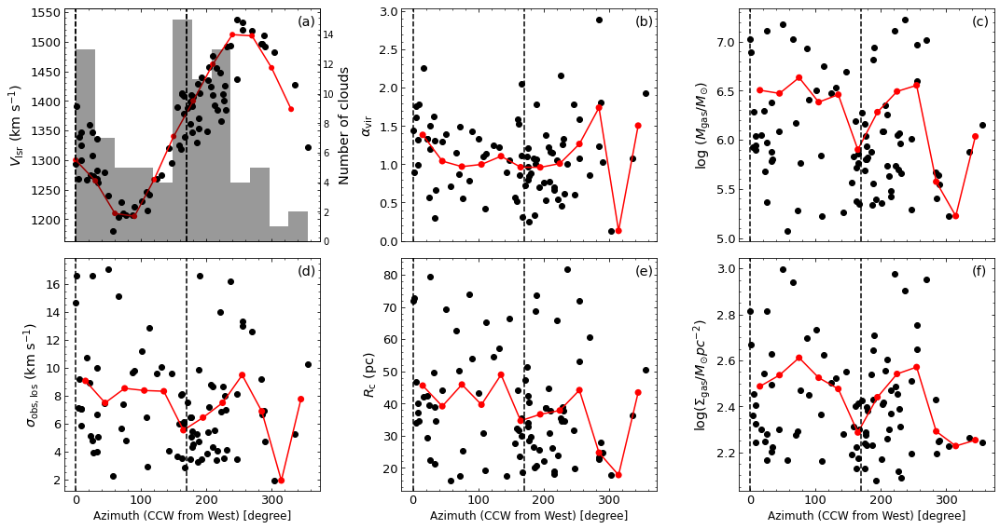

In [96]:
#plt.scatter(AZ,alpha,c='k',alpha=0.3)

#print (AZ.shape)
#print (alpha.shape)

azm = np.arange(0,360,30)+15
fig, axs = plt.subplots(2, 3, sharex='col',figsize=(15,8))
axs = axs.ravel()

#plt.figure()
#axs[0].hist(AZ[rn_ind],bins=12,weights=alpha[rn_ind],zorder=5)
axs[1].scatter((AZa),(alpha_new[n::]),fc='k')
#axs[0].plot(AZa,np.convolve(alpha_new, np.ones(n+1), "valid")/(n+1),c='k',label='6 data points')
axs[1].plot(azm,A_mean,c='r')
axs[1].scatter(azm,A_mean,fc='r',ec='none',s=50)
axs[1].errorbar(azm,A_mean,A_std, mfc='red',marker='.', mec='red', ms=10, mew=1,ecolor='r')

#axs[0].text(3,5.7,'right node')
axs[1].axvline(0,c='k',ls='--')
#axs[0].text(180+3,5.7,'left node')
axs[1].axvline(170,c='k',ls='--')
axs[1].set_ylabel(r'$\alpha_{\mathrm{vir}}$',fontsize='x-large')
#axs[0].legend(loc=0)


#plt.figure()
#plt.scatter(AZ,np.log10(Mlum_all),c='k',alpha=0.3)
axs[2].scatter(AZm,np.log10(Mlum_all_new[n::]),fc='k')
#axs[1].plot(AZm,np.log10(np.convolve(Mlum_all_new, np.ones(n+1), "valid")/(n+1)),c='k')
#axs[1].hist(AZ[rn_ind],np.log10(Mlum_all)[rn_ind],bins=12)
axs[2].plot(azm,np.log10(M_mean),c='r')
axs[2].scatter(azm,np.log10(M_mean),fc='r',ec='none',s=50)
#axs[0].xlabel('Azimuthal direction [degree]')
axs[2].axvline(0,c='k',ls='--')
axs[2].axvline(170,c='k',ls='--')
#plt.axvline(90,c='k',ls='--')
#plt.axvline(270,c='k',ls='--')
axs[2].set_ylabel(r'log ($M_{\mathrm{gas}}$/$M_{\odot}$)',fontsize='x-large')

#plt.figure()
#plt.scatter(AZ,vrms_all,c='k',alpha=0.3)
axs[3].scatter(AZv,vrms_all_new[n::],fc='k')
#axs[2].plot(AZa,np.convolve(vrms_all_new, np.ones(n+1), "valid")/(n+1),c='k')
#axs[0].xlabel('Azimuthal direction [degree]')
axs[3].plot(azm,V_mean,c='r')
axs[3].scatter(azm,V_mean,fc='r',ec='none',s=50)
axs[3].axvline(0,c='k',ls='--')
axs[3].axvline(170,c='k',ls='--')
#plt.axvline(90,c='k',ls='--')
#plt.axvline(270,c='k',ls='--')
axs[3].set_ylabel(r'$\sigma_{\mathrm{obs,los}}$ (km s$^{-1}$)',fontsize='x-large')


#plt.figure()
#plt.scatter(AZ,vrms_all,c='k',alpha=0.3)
#axs[3].hist(AZ[rn_ind],bins=12,weights=Rc_all[rn_ind],zorder=5)
axs[4].scatter(AZr,Rc_all_new[n::],fc='k')#,zorder=10,fc='k')
#axs[3].plot(AZa,np.convolve(Rc_all_new, np.ones(n+1), "valid")/(n+1),c='k')
axs[4].plot(azm,R_mean,c='r')
axs[4].scatter(azm,R_mean,fc='r',ec='none',s=50)
#axs[0].xlabel('Azimuthal direction [degree]')
axs[4].axvline(0,c='k',ls='--')
axs[4].axvline(170,c='k',ls='--')
#plt.axvline(90,c='k',ls='--')
#plt.axvline(270,c='k',ls='--')
axs[4].set_ylabel(r'$R_{\mathrm{c}}$ (pc)',fontsize='x-large')

axs[5].scatter(AZs,np.log10(surf_all_new[n::]),fc='k')#,zorder=10,fc='k')
#axs[4].plot(AZs,np.log10(np.convolve(surf_all_new, np.ones(n+1), "valid")/(n+1)),c='k')
axs[5].plot(azm,np.log10(S_mean),c='r')
axs[5].scatter(azm,np.log10(S_mean),fc='r',ec='none',s=50)
#axs[0].xlabel('Azimuthal direction [degree]')
axs[5].axvline(0,c='k',ls='--')
axs[5].axvline(170,c='k',ls='--')
#plt.axvline(90,c='k',ls='--')
#plt.axvline(270,c='k',ls='--')
axs[5].set_ylabel(r'log($\Sigma_{\mathrm{gas}}/M_{\odot}pc^{-2})$',fontsize='x-large')


# axs[0].hist(AZm,bins=12,fc='k',alpha=0.6)
# axs[0].axvline(0,c='k',ls='--')
# axs[0].axvline(170,c='k',ls='--')
# axs[0].set_ylabel('Number of clouds',fontsize='x-large')

axs[0].scatter(AZvl,Vlsr_all_new[n::],fc='k')
axs[0].scatter([0,30,60,90,120,150,180,210,240,270,300,330],[1300,1265,1210,1205,1267,1340,1400,1462,1512,1510,1456,1386],fc='r',ec='none')
axs[0].plot([0,30,60,90,120,150,180,210,240,270,300,330],[1300,1265,1210,1205,1267,1340,1400,1462,1512,1510,1456,1386],c='r')
#axs[2].plot(AZa,np.convolve(vrms_all_new, np.ones(n+1), "valid")/(n+1),c='k')
#axs[0].xlabel('Azimuthal direction [degree]')
# axs[0].plot(azm,V_mean,c='r')
# axs[0].scatter(azm,V_mean,fc='r',ec='none',s=50)
axs[0].axvline(0,c='k',ls='--')
axs[0].axvline(170,c='k',ls='--')
#plt.axvline(90,c='k',ls='--')
#plt.axvline(270,c='k',ls='--')
axs[0].set_ylabel(r'$V_{\mathrm{lsr}}$ (km s$^{-1}$)',fontsize='x-large')

axs00 = axs[0].twinx()

axs00.hist(AZm,bins=12,fc='k',alpha=0.4)
axs00.axvline(0,c='k',ls='--')
axs00.axvline(170,c='k',ls='--')
axs00.set_ylabel('Number of clouds',fontsize='x-large')

axs[5].set_xlabel('Azimuth (CCW from West) [deree]',fontsize='large')
axs[3].set_xlabel('Azimuth (CCW from West) [degree]',fontsize='large')
axs[4].set_xlabel('Azimuth (CCW from West) [degree]',fontsize='large')

labely = [5.7,7.17,16.5,80,2.965,14.6]
labelt = ['(a)','(b)','(c)','(d)','(e)','(f)']
for i in range(6):
    axs[i].tick_params(direction='in',which='both',labelsize=13,top='on',right='on')
    axs[i].minorticks_on()
    #print(axs[i].get_ylim()[1])
    axs[i].text(340,(axs[i].get_ylim()[1]-axs[i].get_ylim()[0])*0.93+axs[i].get_ylim()[0],labelt[i],fontsize='x-large')

plt.tight_layout()

#plt.savefig('az_function_plots.png',dpi=300)

In [519]:
print (AZvl)
print (Vlsr_all_new[n::])

(0.44999999999998863, 1.3600000000000136, 4.189999999999998, 5.2900000000000205, 7.819999999999993, 7.970000000000027, 9.0, 16.310000000000002, 21.569999999999993, 22.620000000000005, 25.019999999999982, 25.850000000000023, 26.220000000000027, 32.35000000000002, 32.98000000000002, 33.360000000000014, 34.35000000000002, 44.44999999999999, 50.31999999999999, 57.389999999999986, 66.19, 70.49000000000001, 72.18, 76.5, 86.91000000000003, 90.0, 101.12, 108.21000000000001, 109.94999999999999, 112.4, 124.05000000000001, 131.26, 142.99, 147.11, 156.04, 158.71, 160.63, 162.14, 162.86, 165.72, 165.84, 167.38, 171.66, 175.29, 175.84, 176.63, 176.88, 177.85, 178.09, 180.32, 184.95, 186.6, 187.86, 188.53, 189.34, 193.13, 201.14, 203.32, 203.63, 207.27, 209.36, 210.02, 213.02, 215.57, 216.25, 221.22, 221.99, 225.75, 227.24, 228.58, 230.42, 231.56, 236.57999999999998, 246.89, 247.6, 254.85, 255.17000000000002, 270.0, 284.6, 285.52, 287.85, 290.17, 303.77, 336.13, 355.79)
[1293.9 1391.1 1267.8 1338.6 1

In [98]:
#print (np.where((np.array(AZvl)<60) & (Vlsr_all_new[n::] > 1325)))

dev1 = np.where((np.array(AZvl)<60) & (Vlsr_all_new[n::] > 1325))
dev2 = np.where((np.array(AZvl)<210) & (np.array(AZvl)>170) & (Vlsr_all_new[n::] < 1371))
dev3 = np.where((np.array(AZvl)<240) & (np.array(AZvl)>210) & (Vlsr_all_new[n::] < 1430))
dev4 = np.where((np.array(AZvl)<260) & (np.array(AZvl)>240) & (Vlsr_all_new[n::] < 1440))
dev5 = np.where((np.array(AZvl)<170) & (np.array(AZvl)>155) & (Vlsr_all_new[n::] < 1340))

print (dev1)
print (dev2)
print (dev3)
print (dev4)

#print (dev1+dev2+dev3)
dev = np.concatenate((dev1, dev2,dev3,dev4,dev5), axis=None)

print (dev)

(array([ 1,  3,  4,  6,  8, 10, 13]),)
(array([44, 48, 50, 52, 53, 56]),)
(array([61, 62, 64, 66, 67, 68, 69, 70]),)
(array([74]),)
[ 1  3  4  6  8 10 13 44 48 50 52 53 56 61 62 64 66 67 68 69 70 74 35 36
 41]


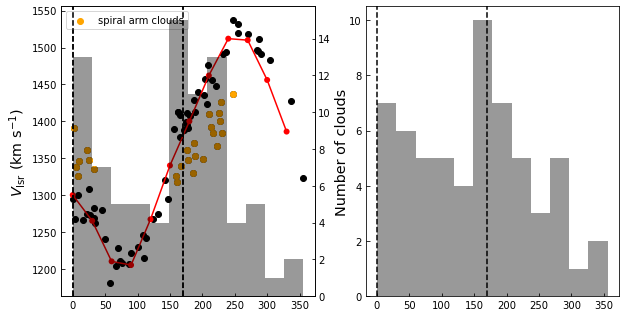

In [99]:
#azm = np.arange(0,360,30)+15
fig, axs = plt.subplots(1, 2,figsize=(15/1.5,8/1.5))#, sharex='col',figsize=(15,8))
axs = axs.ravel()

vvv = Vlsr_all_new[n::]

axs[0].scatter(AZvl,Vlsr_all_new[n::],fc='k')
axs[0].scatter(np.array(AZvl)[dev],vvv[dev],fc='orange',label='spiral arm clouds')
axs[0].scatter([0,30,60,90,120,150,180,210,240,270,300,330],[1300,1265,1210,1205,1267,1340,1400,1462,1512,1510,1456,1386],fc='r',ec='none')
axs[0].plot([0,30,60,90,120,150,180,210,240,270,300,330],[1300,1265,1210,1205,1267,1340,1400,1462,1512,1510,1456,1386],c='r')
#axs[2].plot(AZa,np.convolve(vrms_all_new, np.ones(n+1), "valid")/(n+1),c='k')
#axs[0].xlabel('Azimuthal direction [degree]')
# axs[0].plot(azm,V_mean,c='r')
# axs[0].scatter(azm,V_mean,fc='r',ec='none',s=50)
axs[0].axvline(0,c='k',ls='--')
axs[0].axvline(170,c='k',ls='--')
#plt.axvline(90,c='k',ls='--')
#plt.axvline(270,c='k',ls='--')
axs[0].set_ylabel(r'$V_{\mathrm{lsr}}$ (km s$^{-1}$)',fontsize='x-large')
axs[0].legend(loc='upper left')

axs00 = axs[0].twinx()

axs00.hist(AZm,bins=12,fc='k',alpha=0.4)
axs00.axvline(0,c='k',ls='--')
axs00.axvline(170,c='k',ls='--')
axs00.set_ylabel('Number of clouds',fontsize='x-large')


axs[1].hist(np.delete(AZm,dev),bins=12,fc='k',alpha=0.4)
axs[1].axvline(0,c='k',ls='--')
axs[1].axvline(170,c='k',ls='--')


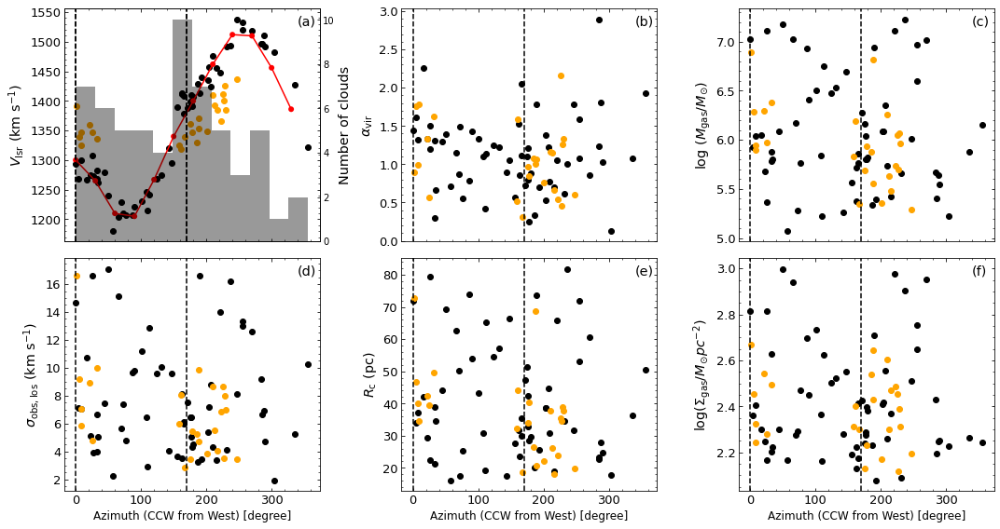

In [104]:
#plt.scatter(AZ,alpha,c='k',alpha=0.3)

#print (AZ.shape)
#print (alpha.shape)

azm = np.arange(0,360,30)+15
fig, axs = plt.subplots(2, 3, sharex='col',figsize=(15,8))
axs = axs.ravel()

#plt.figure()
#axs[0].hist(AZ[rn_ind],bins=12,weights=alpha[rn_ind],zorder=5)
axs[1].scatter(np.delete(AZa,dev),np.delete(alpha_new[n::],dev),fc='k')
axs[1].scatter(np.array(AZa)[dev],(alpha_new[n::])[dev],fc='orange')
#axs[0].plot(AZa,np.convolve(alpha_new, np.ones(n+1), "valid")/(n+1),c='k',label='6 data points')
# axs[1].plot(azm,A_mean,c='r')
# axs[1].scatter(azm,A_mean,fc='r',ec='none',s=50)
#axs[0].text(3,5.7,'right node')
axs[1].axvline(0,c='k',ls='--')
#axs[0].text(180+3,5.7,'left node')
axs[1].axvline(170,c='k',ls='--')
axs[1].set_ylabel(r'$\alpha_{\mathrm{vir}}$',fontsize='x-large')
#axs[0].legend(loc=0)


#plt.figure()
#plt.scatter(AZ,np.log10(Mlum_all),c='k',alpha=0.3)
axs[2].scatter(np.delete(AZm,dev),np.log10(np.delete(Mlum_all_new[n::],dev)),fc='k')
axs[2].scatter(np.array(AZm)[dev],np.log10((Mlum_all_new[n::])[dev]),fc='orange')
#axs[1].plot(AZm,np.log10(np.convolve(Mlum_all_new, np.ones(n+1), "valid")/(n+1)),c='k')
#axs[1].hist(AZ[rn_ind],np.log10(Mlum_all)[rn_ind],bins=12)
# axs[2].plot(azm,np.log10(M_mean),c='r')
# axs[2].scatter(azm,np.log10(M_mean),fc='r',ec='none',s=50)
#axs[0].xlabel('Azimuthal direction [degree]')
axs[2].axvline(0,c='k',ls='--')
axs[2].axvline(170,c='k',ls='--')
#plt.axvline(90,c='k',ls='--')
#plt.axvline(270,c='k',ls='--')
axs[2].set_ylabel(r'log ($M_{\mathrm{gas}}$/$M_{\odot}$)',fontsize='x-large')

#plt.figure()
#plt.scatter(AZ,vrms_all,c='k',alpha=0.3)
axs[3].scatter(np.delete(AZv,dev),np.delete(vrms_all_new[n::],dev),fc='k')
axs[3].scatter(np.array(AZv)[dev],(vrms_all_new[n::])[dev],fc='orange')
#axs[2].plot(AZa,np.convolve(vrms_all_new, np.ones(n+1), "valid")/(n+1),c='k')
#axs[0].xlabel('Azimuthal direction [degree]')
# axs[3].plot(azm,V_mean,c='r')
# axs[3].scatter(azm,V_mean,fc='r',ec='none',s=50)
axs[3].axvline(0,c='k',ls='--')
axs[3].axvline(170,c='k',ls='--')
#plt.axvline(90,c='k',ls='--')
#plt.axvline(270,c='k',ls='--')
axs[3].set_ylabel(r'$\sigma_{\mathrm{obs,los}}$ (km s$^{-1}$)',fontsize='x-large')


#plt.figure()
#plt.scatter(AZ,vrms_all,c='k',alpha=0.3)
#axs[3].hist(AZ[rn_ind],bins=12,weights=Rc_all[rn_ind],zorder=5)
axs[4].scatter(np.delete(AZr,dev),np.delete(Rc_all_new[n::],dev),fc='k')#,zorder=10,fc='k')
axs[4].scatter(np.array(AZr)[dev],(Rc_all_new[n::])[dev],fc='orange')
#axs[3].plot(AZa,np.convolve(Rc_all_new, np.ones(n+1), "valid")/(n+1),c='k')
# axs[4].plot(azm,R_mean,c='r')
# axs[4].scatter(azm,R_mean,fc='r',ec='none',s=50)
#axs[0].xlabel('Azimuthal direction [degree]')
axs[4].axvline(0,c='k',ls='--')
axs[4].axvline(170,c='k',ls='--')
#plt.axvline(90,c='k',ls='--')
#plt.axvline(270,c='k',ls='--')
axs[4].set_ylabel(r'$R_{\mathrm{c}}$ (pc)',fontsize='x-large')

axs[5].scatter(np.delete(AZs,dev),np.log10(np.delete(surf_all_new[n::],dev)),fc='k')#,zorder=10,fc='k')
axs[5].scatter(np.array(AZs)[dev],np.log10((surf_all_new[n::])[dev]),fc='orange')
#axs[4].plot(AZs,np.log10(np.convolve(surf_all_new, np.ones(n+1), "valid")/(n+1)),c='k')
# axs[5].plot(azm,np.log10(S_mean),c='r')
# axs[5].scatter(azm,np.log10(S_mean),fc='r',ec='none',s=50)
#axs[0].xlabel('Azimuthal direction [degree]')
axs[5].axvline(0,c='k',ls='--')
axs[5].axvline(170,c='k',ls='--')
#plt.axvline(90,c='k',ls='--')
#plt.axvline(270,c='k',ls='--')
axs[5].set_ylabel(r'log($\Sigma_{\mathrm{gas}}/M_{\odot}pc^{-2})$',fontsize='x-large')


# axs[0].hist(AZm,bins=12,fc='k',alpha=0.6)
# axs[0].axvline(0,c='k',ls='--')
# axs[0].axvline(170,c='k',ls='--')
# axs[0].set_ylabel('Number of clouds',fontsize='x-large')

axs[0].scatter(np.delete(AZvl,dev),np.delete(Vlsr_all_new[n::],dev),fc='k')
axs[0].scatter(np.array(AZvl)[dev],(Vlsr_all_new[n::])[dev],fc='orange')

axs[0].scatter([0,30,60,90,120,150,180,210,240,270,300,330],[1300,1265,1210,1205,1267,1340,1400,1462,1512,1510,1456,1386],fc='r',ec='none')
axs[0].plot([0,30,60,90,120,150,180,210,240,270,300,330],[1300,1265,1210,1205,1267,1340,1400,1462,1512,1510,1456,1386],c='r')
#axs[2].plot(AZa,np.convolve(vrms_all_new, np.ones(n+1), "valid")/(n+1),c='k')
#axs[0].xlabel('Azimuthal direction [degree]')
# axs[0].plot(azm,V_mean,c='r')
# axs[0].scatter(azm,V_mean,fc='r',ec='none',s=50)
axs[0].axvline(0,c='k',ls='--')
axs[0].axvline(170,c='k',ls='--')
#plt.axvline(90,c='k',ls='--')
#plt.axvline(270,c='k',ls='--')
axs[0].set_ylabel(r'$V_{\mathrm{lsr}}$ (km s$^{-1}$)',fontsize='x-large')

axs00 = axs[0].twinx()

axs00.hist(np.delete(AZm,dev),bins=12,fc='k',alpha=0.4)
axs00.axvline(0,c='k',ls='--')
axs00.axvline(170,c='k',ls='--')
axs00.set_ylabel('Number of clouds',fontsize='x-large')

axs[5].set_xlabel('Azimuth (CCW from West) [degree]',fontsize='large')
axs[3].set_xlabel('Azimuth (CCW from West) [degree]',fontsize='large')
axs[4].set_xlabel('Azimuth (CCW from West) [degree]',fontsize='large')

labely = [5.7,7.17,16.5,80,2.965,14.6]
labelt = ['(a)','(b)','(c)','(d)','(e)','(f)']
for i in range(6):
    axs[i].tick_params(direction='in',which='both',labelsize=13,top='on',right='on')
    axs[i].minorticks_on()
    #print(axs[i].get_ylim()[1])
    axs[i].text(340,(axs[i].get_ylim()[1]-axs[i].get_ylim()[0])*0.93+axs[i].get_ylim()[0],labelt[i],fontsize='x-large')

plt.tight_layout()

plt.savefig('az_function_plots_new.png',dpi=300)

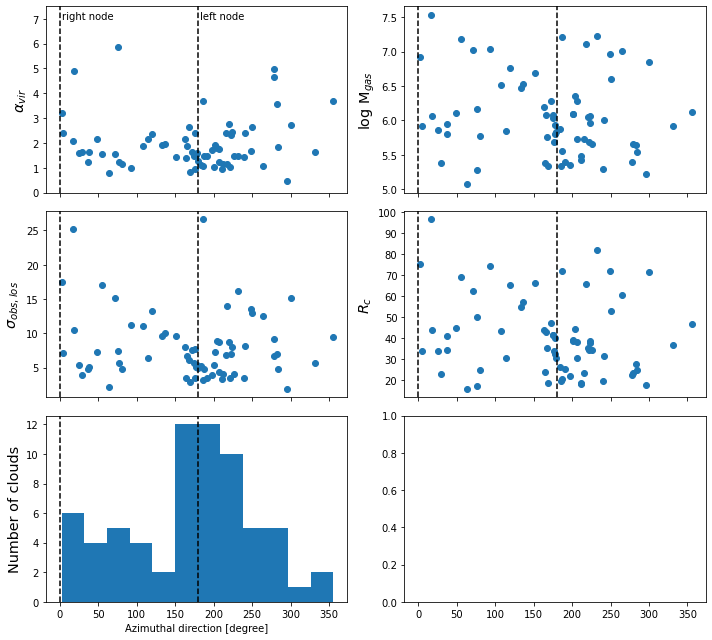

In [139]:
#plt.scatter(AZ,alpha,c='k',alpha=0.3)
rn_ind = ring_node_index
#print (AZ.shape)
#print (alpha.shape)
fig, axs = plt.subplots(3, 2, sharex='col',figsize=(10,9))
axs = axs.ravel()

#plt.figure()
axs[0].scatter(AZ[rn_ind],alpha[rn_ind])
axs[0].text(3,7,'right node')
axs[0].axvline(0,c='k',ls='--')
axs[0].text(180+3,7,'left node')
axs[0].axvline(180,c='k',ls='--')
#plt.text(90+3,7,'southern ring')
#plt.axvline(90,c='k',ls='--')
#plt.text(270+3,7,'northern ring')
#plt.axvline(270,c='k',ls='--')
axs[0].set_ylim(0,7.5)
#axs[0].xlabel('Azimuthal direction [degree]')
axs[0].set_ylabel(r'$\alpha_{vir}$',fontsize='x-large')

#plt.figure()
#plt.scatter(AZ,np.log10(Mlum_all),c='k',alpha=0.3)
axs[1].scatter(AZ[rn_ind],np.log10(Mlum_all)[rn_ind])
#axs[0].xlabel('Azimuthal direction [degree]')
axs[1].axvline(0,c='k',ls='--')
axs[1].axvline(180,c='k',ls='--')
#plt.axvline(90,c='k',ls='--')
#plt.axvline(270,c='k',ls='--')
axs[1].set_ylabel(r'log M$_{gas}$',fontsize='x-large')

#plt.figure()
#plt.scatter(AZ,vrms_all,c='k',alpha=0.3)
axs[2].scatter(AZ[rn_ind],vrms_all[rn_ind])
#axs[0].xlabel('Azimuthal direction [degree]')
axs[2].axvline(0,c='k',ls='--')
axs[2].axvline(180,c='k',ls='--')
#plt.axvline(90,c='k',ls='--')
#plt.axvline(270,c='k',ls='--')
axs[2].set_ylabel(r'$\sigma_{obs,los}$',fontsize='x-large')

#plt.figure()
#plt.scatter(AZ,vrms_all,c='k',alpha=0.3)
axs[3].scatter(AZ[rn_ind],Rc_all[rn_ind])
#axs[0].xlabel('Azimuthal direction [degree]')
axs[3].axvline(0,c='k',ls='--')
axs[3].axvline(180,c='k',ls='--')
#plt.axvline(90,c='k',ls='--')
#plt.axvline(270,c='k',ls='--')
axs[3].set_ylabel(r'$R_{c}$',fontsize='x-large')

#plt.figure()
axs[4].hist(AZ[rn_ind],bins=12)
axs[4].axvline(0,c='k',ls='--')
axs[4].axvline(180,c='k',ls='--')
axs[4].set_ylabel('Number of clouds',fontsize='x-large')
axs[4].set_xlabel('Azimuthal direction [degree]')

plt.tight_layout()

In [657]:
A = (0,0)
B = (1,0)
C = (0,1)
D = (-1,0)

print (angle_between(A,B))
print (angle_between(A,C))
print (angle_between(A,D))
rn_ind = np.sort(ring_node_index)

0.0
270.0
180.0


In [658]:
print (ring_bot_ind)
print (rn_ind.shape)

(array([ 35,  44,  45,  48,  49,  52,  67,  69,  73,  79,  85,  88,  89,
        94, 100, 101, 102, 105, 111, 112, 114, 115, 116, 118, 120, 121,
       122]),)
(92,)


540.108581529466
170
170
83
61
22


Text(0, 0.5, '$\\Delta$ Dec (arcsec)')

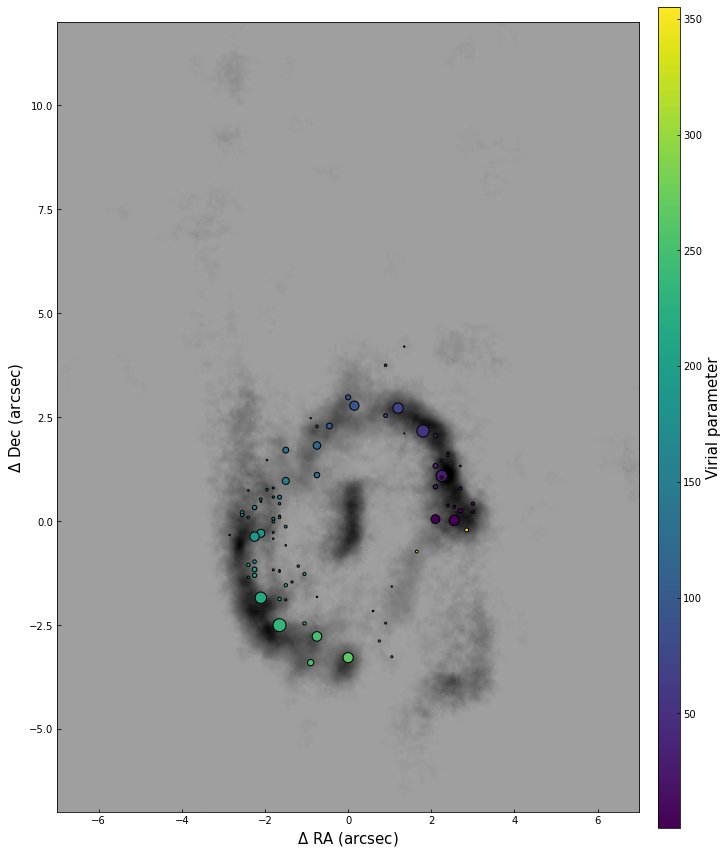

In [421]:

plt.figure(figsize=(10,19),constrained_layout = True)

#extent = [-9.8,15,-9.6,8.7]
extent = [-13.7,13.3,-13.0,12.5]
#print (Mlum_all.shape)
print (mom0[0].data.max())
im = plt.imshow(mom0[0].data,origin='lower',extent=extent,cmap='gray_r',vmin=-300,vmax=500)
#plt.imshow(velmap,origin='lower',cmap='jet',vmin=1200,vmax=1600)
#plt.colorbar()
#plt.contour(velmap,levels=np.arange(1200,1600,30),colors='m',extent=extent)
print (len(ra_new))
print (len(alpha))
print (len(rn_ind))
print (len(inflow_ind))
print (len(inner_ind))
#for i in range(0,len(ra_new)-1):
  #print (x[i],y[i],angles[i])
cmap = plt.get_cmap('RdYlBu_r', 8)
rn_ind = inflow_ind
rn_ind = ring_node_index
#im = plt.scatter(-ra_new,dec_new,c=alpha,ec='k', s=Rc_all.astype('float')**2/5,cmap=cmap,vmin=0,vmax=4)
#im = plt.scatter(ra_off[np.sort(ring_bot_ind)],dec_off[np.sort(ring_bot_ind)],c=alpha[np.sort(ring_bot_ind)],ec='k')#, s=Rc_all.astype('float')**2/5[rn_ind],cmap=cmap,vmin=0,vmax=4)
#im = plt.scatter(-ra_off_new[rn_ind],dec_off_new[rn_ind],c=alpha[rn_ind],ec='k')#, s=Rc_all.astype('float')**2/5[rn_ind],cmap=cmap,vmin=0,vmax=4)
im = plt.scatter(-ra_off_new[rn_ind],dec_off_new[rn_ind],c=AZ[rn_ind],s=Mlum_all[rn_ind]/1e5,ec='k')#, s=Rc_all.astype('float')**2/5[rn_ind],cmap=cmap,vmin=0,vmax=4)




cb=plt.colorbar(im,shrink=0.6)
cb.set_label('Virial parameter',fontsize=15)
plt.xlim(-7,7)
plt.ylim(-7,12)
plt.xlabel('$\Delta$ RA (arcsec)',fontsize=15)
plt.ylabel('$\Delta$ Dec (arcsec)',fontsize=15)
#plt.tight_layout()
#plt.savefig('NGC5806_virial_overlay_size_varying.png',dpi=300)

  #draw_line(-ra_new[i],dec_new[i],theta_all[i],Omega_all[i]*4)
#plt.colorbar(vmin=-2,max=5)

In [188]:
# print (mom0[0].shape)


(501, 501)


In [583]:
mom2 = fits.open('/home/woorak/makeplots-origin/ngc5806_rob-0.5_test1-1_1_0.2_rms1.0_mom2.fits')


In [593]:
# print (np.nan_to_num(mom2[0].data))
# print (mom2[0].shape)

[[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 7.14180715e-10 8.79464149e-01 8.71189892e-01
  7.61804998e-01 7.65112418e-10 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.0000

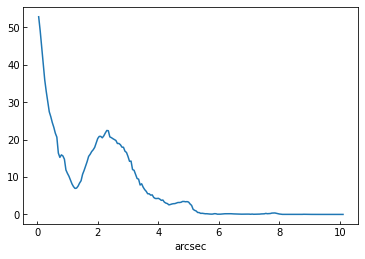

In [596]:
image = np.nan_to_num(mom2[0].data)
x0 = 154
y0 = 154
# create array of radii
x,y = np.meshgrid(np.arange(image.shape[1]),np.arange(image.shape[0]))
R = np.sqrt((x-x0)**2+(y-y0)**2)

# calculate the mean
f = lambda r : image[(R >= r-.5) & (R < r+.5)].mean()
r  = np.linspace(1,202,num=202)
mean = np.vectorize(f)(r)
r = r*0.05
fig,ax=plt.subplots()
ax.plot(r,mean)
ax.set_xlabel('arcsec')
plt.show()

In [307]:
print ('Nucleus',np.mean(Om_inner),np.median(Om_inner))
print ('ring',np.mean(Om_ring),np.median(Om_ring))
print ('spiral arm',np.mean(Om_inflow),np.median(Om_inflow))
print ('node',np.mean(Om_node),np.median(Om_node))
print ('all',np.mean(Om_all),np.median(Om_all))

Nucleus 0.11545454545454546 0.095
ring 0.13488372093023251 0.13
spiral arm 0.12444444444444447 0.11
node 0.08874999999999998 0.07
all 0.11752941176470583 0.1


[0.83059244 0.63280073]
[0.83059241 0.63280079]
spearman 0.5860501673203844
spearman 0.5924032689770143
51 51
0.6307431271279199 0.8041136002554247
spearman 0.6159812123818629
spearman 0.6406602931771855


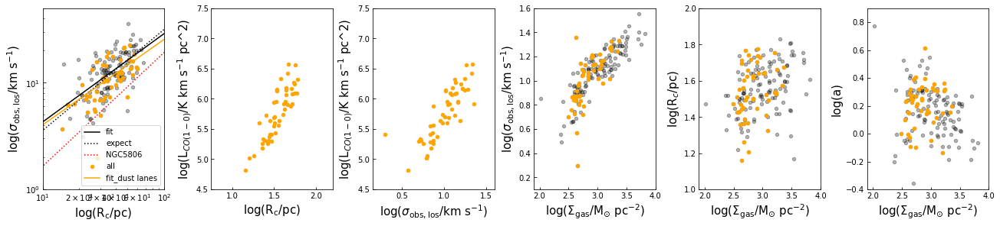

53 53
0.687009384536779 0.8162745743114699
spearman 0.5821435167492226
spearman 0.5317007614049394


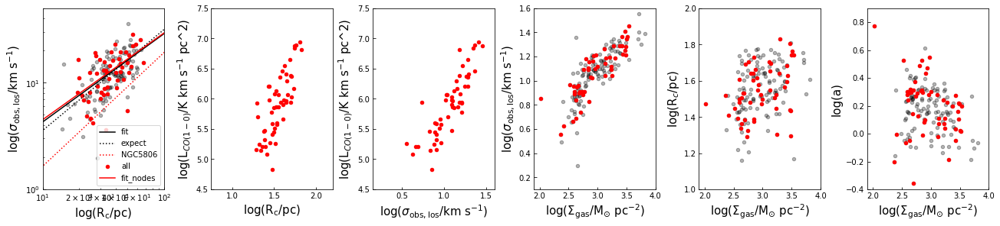

47 47
1.107523968382874 0.6858155724840477
spearman 0.5297968225936328
spearman 0.5158144375516583


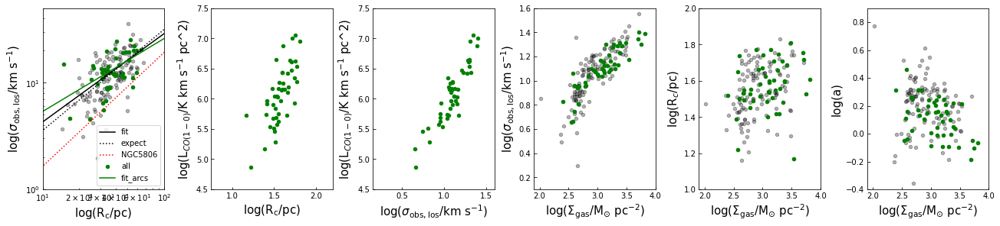

11 11
0.03514429037446707 1.6555880027029717
spearman 0.7824255992057858
spearman 0.8553378429955314


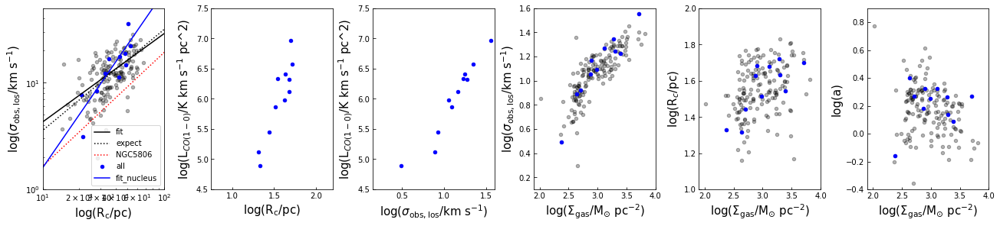

163 163
0.6328007290925184 0.8305924363638546
spearman 0.5860501673203844
spearman 0.5924032689770143


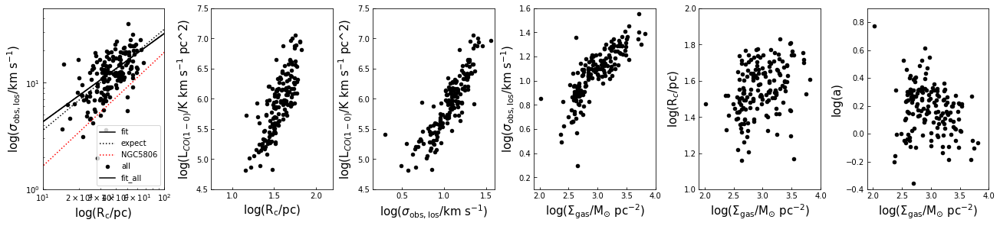

In [764]:
### Fitting ###

def powerlaw_func(x,a,b):
    return b*x**a

params1, params_cov1 = optimize.curve_fit(powerlaw_func,Rc_all,vrms_all)#,p0=[3,0.2])
params7, params_cov7 = optimize.curve_fit(powerlaw_func,Rc_all,vrms_all,p0=[2.0,0.01])
print (params1)
print (params7)


params0, params_cov0 = optimize.curve_fit(powerlaw_linear_func,Rc_all,vrms_all)#,p0=[3,0.2])


Mvir=1/bG.value*Rc_all*vrms_all**2

def powerlaw_linear_func(x,a,b):
    return a*x+b

params2, params_cov2 = optimize.curve_fit(powerlaw_linear_func,np.log10(Mlum_all),np.log10(Mvir.astype('float')))#,p0=[1.2,1])


#print (params2)


params3, params_cov3 = optimize.curve_fit(powerlaw_linear_func,np.log10(Rc_all.astype('float')),Lum_all.astype('float'))#,p0=[1.2,1])

params4, params_cov4 = optimize.curve_fit(powerlaw_func,Rc_all.astype('float'),10**Lum_all.astype('float'))#,p0=[1.2,1])

params0, params_cov0 = optimize.curve_fit(powerlaw_linear_func,np.log10(Rc_all.astype('float')),np.log10(vrms_all.astype('float')))#,p0=[3,0.2])


params5, params_cov5 = optimize.curve_fit(powerlaw_func,vrms_all,10**Lum_all.astype('float'))#,p0=[1.2,1])
params6, params_cov6 = optimize.curve_fit(powerlaw_linear_func,np.log10(vrms_all.astype('float')),Lum_all.astype('float'))#,p0=[1.2,1])


### Plot ###




### ax0 fitting line & MW line ###

x0 = np.linspace(0.1,100,100)
axs[0].plot(x0,(params1[1]*x0**params1[0]),'k') # plot the results from the fitting with all data
#axs[0].plot(x0,params0[0]*x0+params0[1],'r')
axs[0].plot(x0,(0.52*x0**0.5),'k--',label='MW disc') # reference, solomon 1987

### ax2 pressure line ###

x2 = range(10,10000)
surf = x2 * u.Msun * u.pc**-2
text=np.array([(1.1,-0.6),(1.3,-0.34),(1.5,0.02),(1.76,0.36),(2.2,0.65),(3,0.75)])

x3 = np.linspace(1,100,100)
x4 = np.linspace(0.1,2,100)

axs[1].plot(x0,params3[0]*x0+ params3[1],'r')
axs[1].plot(np.log10(x0),np.log10(params4[1]*x0**params4[0]),'k')
axs[1].plot(np.log10(x0),np.log10(25*x0**2.5),'k--')
axs[2].plot(np.log10(x3),np.log10(params5[1]*x3**params5[0]),'k')
axs[2].plot(np.log10(x3),np.log10(130*x3**5),'k--')
axs[2].plot(x4,params6[0]*x4+params6[1],'r')
# for i in range(4,9):
#     P = 10**i*u.K *u.cm**-3*c.k_B.to('erg K-1')
#     P = ((P.to('Msun cm-1 s-2')/(3*surf)).to('km2 s-2 pc-1'))

#     y = np.sqrt(np.add(np.pi*G.value*x2/5,4*P.value))

#     axs[2].plot(np.log10(x2),np.log10(y),'k-',lw=0.5)
#     axs[2].text(text[i-3,0],text[i-3,1],r'10$^%s$' % i,fontsize=12)

y = np.sqrt(np.pi*G.value*x2/5) #alpha = 1
y2 = np.sqrt(np.pi*G.value*x2*2/5) #alpha =2
             
#axs[2].plot(np.log10(x2),np.log10(y),'k--',lw=1,label=r'$\alpha_{vir}$=1')
#axs[2].plot(np.log10(x2),np.log10(y2),'k:',lw=1,label=r'$\alpha_{vir}$=2')
                   
### plot all subplots
print ('spearman',np.corrcoef(Rc[0].astype('float'),vrms_c[0].astype('float'))[0,1])
print ('spearman',np.corrcoef(np.log10(Rc[0].astype('float')),np.log10(vrms_c[0].astype('float')))[0,1])

for i in (4,3,2,1,0):    
    print (len(Rc[i]),len(vrms_c[i]))
    # sigma_obs vs Rc
    
    fig, axs = plt.subplots(1,6,figsize=(18,4),constrained_layout = True); axs = axs.ravel()
    axs[0].plot(x0,(params1[1]*x0**params1[0]),'k',label='fit')
    axs[0].plot(x0,(0.4*x0**0.95),'k:',label='expect')
    axs[0].plot((x0),(0.14*x0**1.07),'r:',label='NGC5806')
    #axs[0].plot(x0,(params7[1]*x0**params7[0]),'b:')


    axs[0].scatter((Rc[0].astype('float')),(vrms_c[0].astype('float')),s=20,c='k',alpha=0.3)
    axs[0].scatter((Rc[i].astype('float')),(vrms_c[i].astype('float')),s=20,c=lines[i],label='all')

    params10, params_cov10 = optimize.curve_fit(powerlaw_func,Rc[i],vrms_c[i])#,p0=[3,0.2])
    axs[0].plot((x0),(params10[1]*x0**params10[0]),c=lines[i],label='fit_%s' % name[i])
    print (params10[1],params10[0])
    print ('spearman',np.corrcoef(Rc[i].astype('float'),vrms_c[i].astype('float'))[0,1])
    print ('spearman',np.corrcoef(np.log10(Rc[i].astype('float')),np.log10(vrms_c[i].astype('float')))[0,1])
    # Lco vs Rc
    axs[1].scatter(np.log10(Rc[i].astype('float')),Lum_c[i].astype('float'),s=20,c=lines[i],label=name[i])

    
    # Lco vs sigma
    axs[2].scatter(np.log10(vrms_c[i].astype('float')),Lum_c[i].astype('float'),s=20,c=lines[i],label=name[i])

    axs[3].scatter(surf_c[0].astype('float'),np.log10(vrms_c[0].astype('float')),s=20,fc='k',alpha=0.3)
    axs[3].scatter(surf_c[i].astype('float'),np.log10(vrms_c[i].astype('float')),s=20,c=lines[i])
    
    axs[4].scatter(surf_c[0].astype('float'),np.log10(Rc[0].astype('float')),s=20,c='k',alpha=0.3)
    axs[4].scatter(surf_c[i].astype('float'),np.log10(Rc[i].astype('float')),s=20,c=lines[i])
    
    axs[5].scatter(surf_c[0].astype('float'),np.log10(alpha_all[0].astype('float')),s=20,c='k',alpha=0.3)
    axs[5].scatter(surf_c[i].astype('float'),np.log10(alpha_all[i].astype('float')),s=20,c=lines[i])

    
    #axs[0].set_xlim(0.75,2.2)
    #axs[0].set_ylim(0.15,1.6)
    axs[0].set_xlabel('log(R$_{\mathrm{c}}$/pc)',fontsize=15)
    axs[0].set_ylabel('log($\sigma_{\mathrm{obs,los}}$/km s$^{-1}$)',fontsize=15)
    axs[0].set_xscale('log')
    axs[0].set_yscale('log')
    axs[0].set_xlim(10,100)
    axs[0].set_ylim(1,50)
    
    axs[1].set_xlim(0.75,2.2)
    axs[1].set_ylim(4.5,7.5)
    axs[1].set_xlabel('log(R$_{\mathrm{c}}$/pc)',fontsize=15)

    axs[1].set_ylabel('log(L$_{CO(1-0)}$/K km s$^{-1}$ pc^2)',fontsize=15)

    axs[2].set_xlim(0.15,1.6)
    axs[2].set_ylim(4.5,7.5)
    axs[2].set_ylabel('log(L$_{CO(1-0)}$/K km s$^{-1}$ pc^2)',fontsize=15)
    axs[2].set_xlabel('log($\sigma_{\mathrm{obs,los}}$/km s$^{-1}$)',fontsize=15)

    axs[3].set_xlim(1.9,4)
    axs[3].set_ylim(0.1,1.6)
    axs[3].set_xlabel('log($\Sigma_{\mathrm{gas}}$/M$_{\odot}$ pc$^{-2}$)',fontsize=15)
    axs[3].set_ylabel('log($\sigma_{\mathrm{obs,los}}$/km s$^{-1}$)',fontsize=15)

    axs[4].set_xlim(1.9,4)
    axs[4].set_ylim(1.0,2.0)
    axs[4].set_xlabel('log($\Sigma_{\mathrm{gas}}$/M$_{\odot}$ pc$^{-2}$)',fontsize=15)
    axs[4].set_ylabel('log(R$_c$/pc)',fontsize=15)

    axs[5].set_xlim(1.9,4)
    axs[5].set_ylim(-0.4,0.9)
    axs[5].set_xlabel('log($\Sigma_{\mathrm{gas}}$/M$_{\odot}$ pc$^{-2}$)',fontsize=15)
    axs[5].set_ylabel('log(a)',fontsize=15)
    axs[0].legend(loc=0)
    plt.show()
    plt.close()

In [207]:
print (vrms_c_err[0])

[1.19 0.7 0.48 0.41 0.79 2.94 3.74 0.44 6.46 1.06 3.3 0.68 0.61 0.97 2.2
 4.36 1.1 0.56 0.49 7.52 0.77 1.15 0.89 0.51 0.6 5.02 1.39 0.62 0.64 1.16
 0.67 2.81 0.83 0.89 2.53 0.76 2.27 0.33 1.27 2.89 0.51 0.62 4.06 0.83
 0.89 1.42 0.69 0.56 1.1 3.57 0.63 1.16 4.17 0.9 6.04 0.89 0.6 0.71 0.68
 0.71 0.84 0.6 0.9 0.59 0.8 1.02 0.6 0.96 0.77 1.11 1.01 0.71 0.99 2.29
 8.25 0.92 3.86 6.52 0.61 1.02 0.82 0.62 2.33 0.73 0.69 0.74 0.48 1.36
 0.85 0.63 0.72 1.01 4.67 0.9 1.31 0.68 3.86 1.43 0.49 0.79 0.6 0.71 0.76
 0.88 0.81 1.07 0.71 0.98 0.71 0.63 1.05 1.63 0.56 1.66 0.76 0.69 1.16
 0.76 9.68 0.79 0.64 0.75 1.71 0.7 0.85 0.62 0.87 3.58 11.72 1.25 3.99
 2.03 2.57 1.06 2.19 0.6 1.42 3.16 5.01 1.5 8.07 0.56 5.31 1.38 1.69 1.24
 1.19 3.06 1.48 0.66 0.57 0.86 2.8 0.63 6.73 0.68 6.76 1.08 3.35 0.77 0.62
 1.02 0.85]


[0.70687312 1.07785672]
[0.83059241 0.63280079]
spearman 0.5860501673203844
spearman 0.5924032689770143
51 51
least-sq
0.6653336358849326 0.03424200104222809
ODR
1.8147668621249993 -1.809031076968245
Linmix 0.8930664967564835 -0.35717391433380263


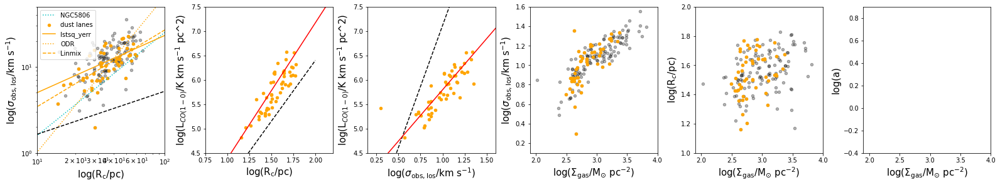

53 53
least-sq
0.8689133883975934 -0.2037136752846683
ODR
1.1914729226234968 -0.7123272405122243
Linmix 0.7188271897486378 -0.0010973074260782565


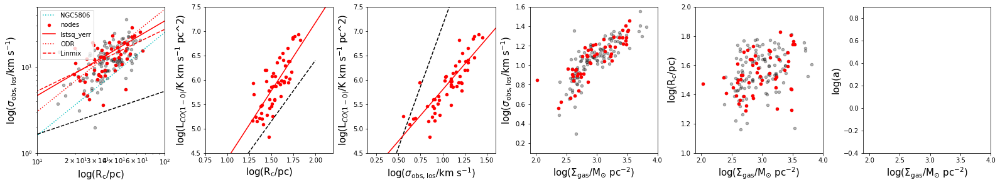

48 48
least-sq
0.5717894314214035 0.26200147694220743
ODR
1.0793925141409995 -0.5464243072216468
Linmix 0.4737367788758998 0.38617635593285204


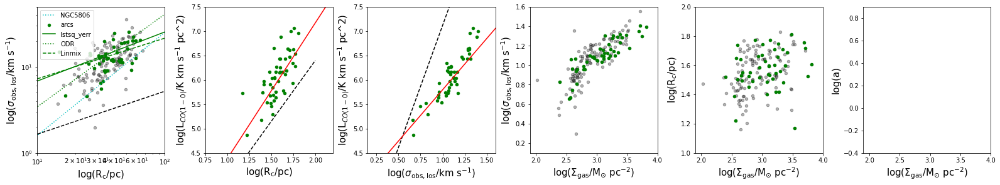

11 11
least-sq
1.4324502059308757 -1.0819340575980074
ODR
3.047995656737104 -3.714967906948236
Linmix 1.6775821595710527 -1.5183884914738295


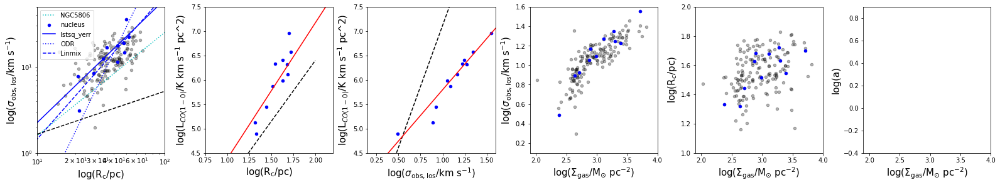

163 163
least-sq
0.70687311704408 0.03256103253581238
ODR
1.5238332780539903 -1.274049718039326
Linmix 0.7627702142234748 -0.09442578922277825


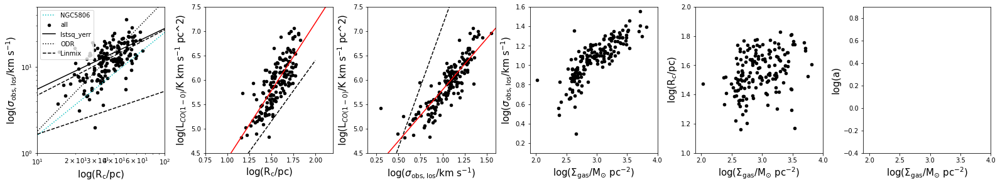

In [316]:
### Fitting ###

def powerlaw_func(x,a,b):
    return b*x**a

#params11, params_cov11 = optimize.curve_fit(powerlaw_func,np.delete(Rc_all,np.where((Rc_all<20) & (vrms_all >10))),np.delete(vrms_all,np.where((Rc_all<20) & (vrms_all >10))))#,p0=[3,0.2])
#print (params11)
params1, params_cov1 = optimize.curve_fit(powerlaw_func,Rc_all,vrms_all,sigma=vrms_c_err[0].astype('float'))#,p0=[3,0.2])
params7, params_cov7 = optimize.curve_fit(powerlaw_func,Rc_all,vrms_all,p0=[2.0,0.01])
print (params1)
print (params7)




Mvir=1/bG.value*Rc_all*vrms_all**2

def powerlaw_linear_func(x,a,b):
    return a*x+b
params0, params_cov0 = optimize.curve_fit(powerlaw_linear_func,Rc_all,vrms_all)#,p0=[3,0.2])

params2, params_cov2 = optimize.curve_fit(powerlaw_linear_func,np.log10(Mlum_all),np.log10(Mvir.astype('float')))#,p0=[1.2,1])


#print (params2)


params3, params_cov3 = optimize.curve_fit(powerlaw_linear_func,np.log10(Rc_all.astype('float')),Lum_all.astype('float'))#,p0=[1.2,1])

params4, params_cov4 = optimize.curve_fit(powerlaw_func,Rc_all.astype('float'),10**Lum_all.astype('float'))#,p0=[1.2,1])

params0, params_cov0 = optimize.curve_fit(powerlaw_linear_func,np.log10(Rc_all.astype('float')),np.log10(vrms_all.astype('float')))#,p0=[3,0.2])


params5, params_cov5 = optimize.curve_fit(powerlaw_func,vrms_all,10**Lum_all.astype('float'))#,p0=[1.2,1])
params6, params_cov6 = optimize.curve_fit(powerlaw_linear_func,np.log10(vrms_all.astype('float')),Lum_all.astype('float'))#,p0=[1.2,1])


### Plot ###




### ax0 fitting line & MW line ###

x0 = np.linspace(0.1,100,100)

### ax2 pressure line ###

x2 = range(10,10000)
surf = x2 * u.Msun * u.pc**-2
text=np.array([(1.1,-0.6),(1.3,-0.34),(1.5,0.02),(1.76,0.36),(2.2,0.65),(3,0.75)])

x3 = np.linspace(1,100,100)
x4 = np.linspace(0.1,2,100)

#     P = 10**i*u.K *u.cm**-3*c.k_B.to('erg K-1')
#     P = ((P.to('Msun cm-1 s-2')/(3*surf)).to('km2 s-2 pc-1'))

#     y = np.sqrt(np.add(np.pi*G.value*x2/5,4*P.value))

#     axs[2].plot(np.log10(x2),np.log10(y),'k-',lw=0.5)
#     axs[2].text(text[i-3,0],text[i-3,1],r'10$^%s$' % i,fontsize=12)

y = np.sqrt(np.pi*G.value*x2/5) #alpha = 1
y2 = np.sqrt(np.pi*G.value*x2*2/5) #alpha =2
             
#axs[2].plot(np.log10(x2),np.log10(y),'k--',lw=1,label=r'$\alpha_{vir}$=1')
#axs[2].plot(np.log10(x2),np.log10(y2),'k:',lw=1,label=r'$\alpha_{vir}$=2')
                   
### plot all subplots
print ('spearman',np.corrcoef(Rc[0].astype('float'),vrms_c[0].astype('float'))[0,1])
print ('spearman',np.corrcoef(np.log10(Rc[0].astype('float')),np.log10(vrms_c[0].astype('float')))[0,1])

for i in (4,3,2,1,0):    
    print (len(Rc[i]),len(vrms_c[i]))
    # sigma_obs vs Rc
    fig, axs = plt.subplots(1,6,figsize=(22,4),constrained_layout = True); axs = axs.ravel()

    #axs[0].plot(x0,(params1[1]*x0**params1[0]),'k',label='fit')
    #axs[0].plot(x0,(0.4*x0**0.95),'k:',label='expect')
    axs[0].plot((x0),(0.1*x0**1.20),'c:',label='NGC5806')
    #axs[0].plot(x0,(params7[1]*x0**params7[0]),'b:')


    axs[0].scatter((Rc[0].astype('float')),(vrms_c[0].astype('float')),s=20,c='k',alpha=0.3)
    axs[0].scatter((Rc[i].astype('float')),(vrms_c[i].astype('float')),s=20,c=lines[i],label='%s' % name[i])

    params10, params_cov10 = optimize.curve_fit(powerlaw_func,Rc[i],vrms_c[i],sigma=vrms_c_err[i].astype('float'))#,p0=[3,0.2])
    axs[0].plot((x0),(params10[1]*x0**params10[0]),c=lines[i],label='lstsq_yerr')
    print ('least-sq')
    print (params10[0],np.log10(params10[1]))
    #print ('spearman',np.corrcoef(Rc[i].astype('float'),vrms_c[i].astype('float'))[0,1])
    #print ('spearman',np.corrcoef(np.log10(Rc[i].astype('float')),np.log10(vrms_c[i].astype('float')))[0,1])
    

    linear = Model(f)
    #sx, sy are arrays os error estimates
    #sy=(vrms_c_err[i].astype('float')); sx=(Rc_err[i].astype('float'))

    mydata = RealData((Rc[i].astype('float')), (vrms_c[i].astype('float')),sy=(vrms_c_err[i].astype('float')), sx=(Rc_err[i].astype('float')))# wd=1./np.power(sx, 2), we=1./np.power(sy, 2))
    #beta0 are the inital parameter estimates
    myodr = ODR(mydata, linear, beta0=[10.1, 1.5])
    myoutput = myodr.run()
    print ('ODR')
    print (myoutput.beta[1],np.log10(myoutput.beta[0]))

    x_fit = np.linspace(1, 100, 1000)    #to do the fit only within the x interval; we can always extrapolate it, of course
    y_fit = f(myoutput.beta, x_fit)
    # Generate a plot to show the data, errors, and fit.
    #fig, ax = plt.subplots(figsize=(4,4))

    #ax.errorbar(Rc[0].astype('float'), vrms_c[0].astype('float'), xerr=Rc_err[0].astype('float')/2, yerr=vrms_c_err[0].astype('float')/2, linestyle='None', marker='o',mfc='b')
    axs[0].loglog(x_fit, y_fit,c=lines[i],label='ODR',ls=':')
    
    
    xdata=np.log10(Rc[i].astype('float'))
    ydata=np.log10(vrms_c[i].astype('float'))
    errx=0.434*(Rc_err[i]/Rc[i]); #errx[errx>1.5]=1
    #print (errx.max())
    erry=0.434*(vrms_c_err[i]/vrms_c[i])

    delta = np.ones((len(xdata),), dtype=int)
    lm = linmix.linmix.LinMix(xdata, ydata, xsig=errx, ysig=erry, delta=delta,K=2)#, K=K, nchains=nchains)#, xycov=xycov)
    lm.run_mcmc(silent=True)#miniter=miniter, maxiter=maxiter, silent=silent)
    #print("{}, {}".format(lm.chain['alpha'].mean(), lm.chain['alpha'].std())) # intercept
    #print("{}, {}".format(lm.chain['beta'].mean(), lm.chain['beta'].std())) # slope
    #print("{}, {}".format(lm.chain['sigsqr'].mean(), lm.chain['sigsqr'].std()))
    
    slope = lm.chain['beta'].mean(); intercept = lm.chain['alpha'].mean()
    print ('Linmix',slope,intercept)
    x=np.linspace(1,100)
    axs[0].plot(x,(10**intercept)*x**slope,c=lines[i],ls='--',label="Linmix")

    # Lco vs Rc
    axs[1].scatter(np.log10(Rc[i].astype('float')),Lum_c[i].astype('float'),s=20,c=lines[i],label=name[i])

    
    # Lco vs sigma
    axs[2].scatter(np.log10(vrms_c[i].astype('float')),Lum_c[i].astype('float'),s=20,c=lines[i],label=name[i])

    axs[3].scatter(surf_c[0].astype('float'),np.log10(vrms_c[0].astype('float')),s=20,fc='k',alpha=0.3)
    axs[3].scatter(surf_c[i].astype('float'),np.log10(vrms_c[i].astype('float')),s=20,c=lines[i])
    
    axs[4].scatter(surf_c[0].astype('float'),np.log10(Rc[0].astype('float')),s=20,c='k',alpha=0.3)
    axs[4].scatter(surf_c[i].astype('float'),np.log10(Rc[i].astype('float')),s=20,c=lines[i])
    
    #axs[5].scatter(surf_c[0].astype('float'),np.log10(alpha_all[0].astype('float')),s=20,c='k',alpha=0.3)
    #axs[5].scatter(surf_c[i].astype('float'),np.log10(alpha_all[i].astype('float')),s=20,c=lines[i])

    
    #axs[0].set_xlim(0.75,2.2)
    #axs[0].set_ylim(0.15,1.6)
    axs[0].set_xlabel('log(R$_{\mathrm{c}}$/pc)',fontsize=15)
    axs[0].set_ylabel('log($\sigma_{\mathrm{obs,los}}$/km s$^{-1}$)',fontsize=15)
    axs[0].set_xscale('log')
    axs[0].set_yscale('log')
    axs[0].set_xlim(10,100)
    axs[0].set_ylim(1,50)
    
    axs[1].set_xlim(0.75,2.2)
    axs[1].set_ylim(4.5,7.5)
    axs[1].set_xlabel('log(R$_{\mathrm{c}}$/pc)',fontsize=15)

    axs[1].set_ylabel('log(L$_{CO(1-0)}$/K km s$^{-1}$ pc^2)',fontsize=15)

    axs[2].set_xlim(0.15,1.6)
    axs[2].set_ylim(4.5,7.5)
    axs[2].set_ylabel('log(L$_{CO(1-0)}$/K km s$^{-1}$ pc^2)',fontsize=15)
    axs[2].set_xlabel('log($\sigma_{\mathrm{obs,los}}$/km s$^{-1}$)',fontsize=15)

    axs[3].set_xlim(1.9,4)
    axs[3].set_ylim(0.1,1.6)
    axs[3].set_xlabel('log($\Sigma_{\mathrm{gas}}$/M$_{\odot}$ pc$^{-2}$)',fontsize=15)
    axs[3].set_ylabel('log($\sigma_{\mathrm{obs,los}}$/km s$^{-1}$)',fontsize=15)

    axs[4].set_xlim(1.9,4)
    axs[4].set_ylim(1.0,2.0)
    axs[4].set_xlabel('log($\Sigma_{\mathrm{gas}}$/M$_{\odot}$ pc$^{-2}$)',fontsize=15)
    axs[4].set_ylabel('log(R$_c$/pc)',fontsize=15)

    axs[5].set_xlim(1.9,4)
    axs[5].set_ylim(-0.4,0.9)
    axs[5].set_xlabel('log($\Sigma_{\mathrm{gas}}$/M$_{\odot}$ pc$^{-2}$)',fontsize=15)
    axs[5].set_ylabel('log(a)',fontsize=15)
    axs[0].legend(loc=0)
    
    #axs[0].plot(x0,(params1[1]*x0**params1[0]),'k') # plot the results from the fitting with all data
    #axs[0].plot(x0,params0[0]*x0+params0[1],'r')
    axs[0].plot(x0,(0.52*x0**0.5),'k--',label='MW disc') # reference, solomon 1987

    axs[1].plot(x0,params3[0]*x0+ params3[1],'r')
    #axs[1].plot(np.log10(x0),np.log10(params4[1]*x0**params4[0]),'k')
    axs[1].plot(np.log10(x0),np.log10(25*x0**2.5),'k--')
    #axs[2].plot(np.log10(x3),np.log10(params5[1]*x3**params5[0]),'k')
    axs[2].plot(np.log10(x3),np.log10(130*x3**5),'k--')
    axs[2].plot(x4,params6[0]*x4+params6[1],'r')
    # for i in range(4,9):
    plt.show()
    plt.close()

[0.70687312 1.07785672]
[0.83059241 0.63280079]
spearman 0.5860501673203844
spearman 0.5924032689770143
least-sq
0.70687311704408 0.03256103253581238
least-sq
0.6653336358849326 0.03424200104222809
least-sq
0.8689133883975934 -0.2037136752846683
least-sq
0.5717894314214035 0.26200147694220743
least-sq
1.4324502059308757 -1.0819340575980074


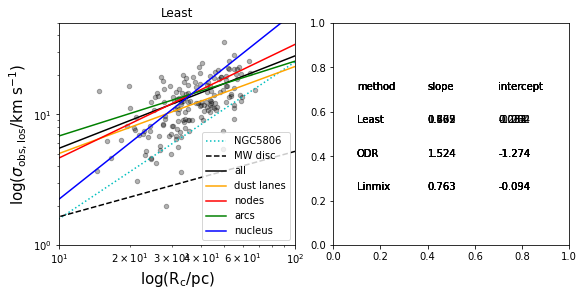

In [340]:
### Fitting ###

def powerlaw_func(x,a,b):
    return b*x**a

#params11, params_cov11 = optimize.curve_fit(powerlaw_func,np.delete(Rc_all,np.where((Rc_all<20) & (vrms_all >10))),np.delete(vrms_all,np.where((Rc_all<20) & (vrms_all >10))))#,p0=[3,0.2])
#print (params11)
params1, params_cov1 = optimize.curve_fit(powerlaw_func,Rc_all,vrms_all,sigma=vrms_c_err[0].astype('float'))#,p0=[3,0.2])
params7, params_cov7 = optimize.curve_fit(powerlaw_func,Rc_all,vrms_all,p0=[2.0,0.01])
print (params1)
print (params7)




Mvir=1/bG.value*Rc_all*vrms_all**2

def powerlaw_linear_func(x,a,b):
    return a*x+b
params0, params_cov0 = optimize.curve_fit(powerlaw_linear_func,Rc_all,vrms_all)#,p0=[3,0.2])

params2, params_cov2 = optimize.curve_fit(powerlaw_linear_func,np.log10(Mlum_all),np.log10(Mvir.astype('float')))#,p0=[1.2,1])


#print (params2)


params3, params_cov3 = optimize.curve_fit(powerlaw_linear_func,np.log10(Rc_all.astype('float')),Lum_all.astype('float'))#,p0=[1.2,1])

params4, params_cov4 = optimize.curve_fit(powerlaw_func,Rc_all.astype('float'),10**Lum_all.astype('float'))#,p0=[1.2,1])

params0, params_cov0 = optimize.curve_fit(powerlaw_linear_func,np.log10(Rc_all.astype('float')),np.log10(vrms_all.astype('float')))#,p0=[3,0.2])


params5, params_cov5 = optimize.curve_fit(powerlaw_func,vrms_all,10**Lum_all.astype('float'))#,p0=[1.2,1])
params6, params_cov6 = optimize.curve_fit(powerlaw_linear_func,np.log10(vrms_all.astype('float')),Lum_all.astype('float'))#,p0=[1.2,1])


### Plot ###




### ax0 fitting line & MW line ###

x0 = np.linspace(0.1,100,100)

### ax2 pressure line ###

x2 = range(10,10000)
surf = x2 * u.Msun * u.pc**-2
text=np.array([(1.1,-0.6),(1.3,-0.34),(1.5,0.02),(1.76,0.36),(2.2,0.65),(3,0.75)])

x3 = np.linspace(1,100,100)
x4 = np.linspace(0.1,2,100)

#     P = 10**i*u.K *u.cm**-3*c.k_B.to('erg K-1')
#     P = ((P.to('Msun cm-1 s-2')/(3*surf)).to('km2 s-2 pc-1'))

#     y = np.sqrt(np.add(np.pi*G.value*x2/5,4*P.value))

#     axs[2].plot(np.log10(x2),np.log10(y),'k-',lw=0.5)
#     axs[2].text(text[i-3,0],text[i-3,1],r'10$^%s$' % i,fontsize=12)

y = np.sqrt(np.pi*G.value*x2/5) #alpha = 1
y2 = np.sqrt(np.pi*G.value*x2*2/5) #alpha =2
             
#axs[2].plot(np.log10(x2),np.log10(y),'k--',lw=1,label=r'$\alpha_{vir}$=1')
#axs[2].plot(np.log10(x2),np.log10(y2),'k:',lw=1,label=r'$\alpha_{vir}$=2')
                   
### plot all subplots
print ('spearman',np.corrcoef(Rc[0].astype('float'),vrms_c[0].astype('float'))[0,1])
print ('spearman',np.corrcoef(np.log10(Rc[0].astype('float')),np.log10(vrms_c[0].astype('float')))[0,1])

fig, axs = plt.subplots(1,2,figsize=(8,4),constrained_layout = True); axs = axs.ravel()
axs[0].scatter((Rc[0].astype('float')),(vrms_c[0].astype('float')),s=20,c='k',alpha=0.3)
axs[0].plot((x0),(0.1*x0**1.20),'c:',label='NGC5806')
axs[0].plot(x0,(0.52*x0**0.5),'k--',label='MW disc') # reference, solomon 1987

for i in (0,4,3,2,1):    
    #print (len(Rc[i]),len(vrms_c[i]))
    # sigma_obs vs Rc

    #axs[0].plot(x0,(params1[1]*x0**params1[0]),'k',label='fit')
    #axs[0].plot(x0,(0.4*x0**0.95),'k:',label='expect')

    #axs[0].plot(x0,(params7[1]*x0**params7[0]),'b:')


    if i == 0:
        lc = None
    else:
        lc = lines[i]
        
    #axs[0].scatter((Rc[i].astype('float')),(vrms_c[i].astype('float')),s=20,c=lc)#,label='%s' % name[i])

    params10, params_cov10 = optimize.curve_fit(powerlaw_func,Rc[i],vrms_c[i],sigma=vrms_c_err[i].astype('float'))#,p0=[3,0.2])
    axs[0].plot((x0),(params10[1]*x0**params10[0]),c=lines[i],label='%s' % name[i])#,label='lstsq_yerr')
    print ('least-sq')
    print (params10[0],np.log10(params10[1]))
    #print ('spearman',np.corrcoef(Rc[i].astype('float'),vrms_c[i].astype('float'))[0,1])
    #print ('spearman',np.corrcoef(np.log10(Rc[i].astype('float')),np.log10(vrms_c[i].astype('float')))[0,1])
    

#     linear = Model(f)
#     #sx, sy are arrays os error estimates
#     #sy=(vrms_c_err[i].astype('float')); sx=(Rc_err[i].astype('float'))

#     mydata = RealData((Rc[i].astype('float')), (vrms_c[i].astype('float')),sy=(vrms_c_err[i].astype('float')), sx=(Rc_err[i].astype('float')))# wd=1./np.power(sx, 2), we=1./np.power(sy, 2))
#     #beta0 are the inital parameter estimates
#     myodr = ODR(mydata, linear, beta0=[10.1, 1.5])
#     myoutput = myodr.run()
#     print ('ODR')
#     print (myoutput.beta[1],np.log10(myoutput.beta[0]))

#     x_fit = np.linspace(1, 100, 1000)    #to do the fit only within the x interval; we can always extrapolate it, of course
#     y_fit = f(myoutput.beta, x_fit)
#     # Generate a plot to show the data, errors, and fit.
#     #fig, ax = plt.subplots(figsize=(4,4))

#     #ax.errorbar(Rc[0].astype('float'), vrms_c[0].astype('float'), xerr=Rc_err[0].astype('float')/2, yerr=vrms_c_err[0].astype('float')/2, linestyle='None', marker='o',mfc='b')
#     axs[0].loglog(x_fit, y_fit,c=lines[i],ls=':',label='%s' % name[i]) #,label='ODR'
    
    
#     xdata=np.log10(Rc[i].astype('float'))
#     ydata=np.log10(vrms_c[i].astype('float'))
#     errx=0.434*(Rc_err[i]/Rc[i]); #errx[errx>1.5]=1
#     #print (errx.max())
#     erry=0.434*(vrms_c_err[i]/vrms_c[i])

#     delta = np.ones((len(xdata),), dtype=int)
#     lm = linmix.linmix.LinMix(xdata, ydata, xsig=errx, ysig=erry, delta=delta,K=2)#, K=K, nchains=nchains)#, xycov=xycov)
#     lm.run_mcmc(silent=True)#miniter=miniter, maxiter=maxiter, silent=silent)
#     #print("{}, {}".format(lm.chain['alpha'].mean(), lm.chain['alpha'].std())) # intercept
#     #print("{}, {}".format(lm.chain['beta'].mean(), lm.chain['beta'].std())) # slope
#     #print("{}, {}".format(lm.chain['sigsqr'].mean(), lm.chain['sigsqr'].std()))
    
#     slope = lm.chain['beta'].mean(); intercept = lm.chain['alpha'].mean()
#     print ('Linmix',slope,intercept)
#     x=np.linspace(1,100)
#     axs[0].plot(x,(10**intercept)*x**slope,c=lines[i],ls='--',label='%s' % name[i])#,label="Linmix")

    axs[1].text(0.1,0.7,'method')
    axs[1].text(0.1,0.55,'Least')
    axs[1].text(0.1,0.4,'ODR')
    axs[1].text(0.1,0.25,'Linmix')
    
    
    axs[1].text(0.4,0.7,'slope')
    axs[1].text(0.4,0.55,'%s' % round(params10[0],3))
    axs[1].text(0.4,0.4,'%s' % round(myoutput.beta[1],3))
    axs[1].text(0.4,0.25,'%s' % round(slope,3))
    
    axs[1].text(0.7,0.7,'intercept')
    axs[1].text(0.7,0.55,'%s' % round(np.log10(params10[1]),3))
    axs[1].text(0.7,0.4,'%s' % round(np.log10(myoutput.beta[0]),3))
    axs[1].text(0.7,0.25,'%s' % round(intercept,3))

#     # Lco vs Rc
#     axs[1].scatter(np.log10(Rc[i].astype('float')),Lum_c[i].astype('float'),s=20,c=lines[i],label=name[i])

    
#     # Lco vs sigma
#     axs[2].scatter(np.log10(vrms_c[i].astype('float')),Lum_c[i].astype('float'),s=20,c=lines[i],label=name[i])

#     axs[3].scatter(surf_c[0].astype('float'),np.log10(vrms_c[0].astype('float')),s=20,fc='k',alpha=0.3)
#     axs[3].scatter(surf_c[i].astype('float'),np.log10(vrms_c[i].astype('float')),s=20,c=lines[i])
    
#     axs[4].scatter(surf_c[0].astype('float'),np.log10(Rc[0].astype('float')),s=20,c='k',alpha=0.3)
#     axs[4].scatter(surf_c[i].astype('float'),np.log10(Rc[i].astype('float')),s=20,c=lines[i])
    
    #axs[5].scatter(surf_c[0].astype('float'),np.log10(alpha_all[0].astype('float')),s=20,c='k',alpha=0.3)
    #axs[5].scatter(surf_c[i].astype('float'),np.log10(alpha_all[i].astype('float')),s=20,c=lines[i])

    
    #axs[0].set_xlim(0.75,2.2)
    #axs[0].set_ylim(0.15,1.6)
    axs[0].set_xlabel('log(R$_{\mathrm{c}}$/pc)',fontsize=15)
    axs[0].set_ylabel('log($\sigma_{\mathrm{obs,los}}$/km s$^{-1}$)',fontsize=15)
    axs[0].set_xscale('log')
    axs[0].set_yscale('log')
    axs[0].set_xlim(10,100)
    axs[0].set_ylim(1,50)
    
#     axs[1].set_xlim(0.75,2.2)
#     axs[1].set_ylim(4.5,7.5)
#     axs[1].set_xlabel('log(R$_{\mathrm{c}}$/pc)',fontsize=15)

#     axs[1].set_ylabel('log(L$_{CO(1-0)}$/K km s$^{-1}$ pc^2)',fontsize=15)

#     axs[2].set_xlim(0.15,1.6)
#     axs[2].set_ylim(4.5,7.5)
#     axs[2].set_ylabel('log(L$_{CO(1-0)}$/K km s$^{-1}$ pc^2)',fontsize=15)
#     axs[2].set_xlabel('log($\sigma_{\mathrm{obs,los}}$/km s$^{-1}$)',fontsize=15)

#     axs[3].set_xlim(1.9,4)
#     axs[3].set_ylim(0.1,1.6)
#     axs[3].set_xlabel('log($\Sigma_{\mathrm{gas}}$/M$_{\odot}$ pc$^{-2}$)',fontsize=15)
#     axs[3].set_ylabel('log($\sigma_{\mathrm{obs,los}}$/km s$^{-1}$)',fontsize=15)

#     axs[4].set_xlim(1.9,4)
#     axs[4].set_ylim(1.0,2.0)
#     axs[4].set_xlabel('log($\Sigma_{\mathrm{gas}}$/M$_{\odot}$ pc$^{-2}$)',fontsize=15)
#     axs[4].set_ylabel('log(R$_c$/pc)',fontsize=15)

#     axs[5].set_xlim(1.9,4)
#     axs[5].set_ylim(-0.4,0.9)
#     axs[5].set_xlabel('log($\Sigma_{\mathrm{gas}}$/M$_{\odot}$ pc$^{-2}$)',fontsize=15)
#     axs[5].set_ylabel('log(a)',fontsize=15)
    axs[0].legend(loc='lower right')
    
    #axs[0].plot(x0,(params1[1]*x0**params1[0]),'k') # plot the results from the fitting with all data
    #axs[0].plot(x0,params0[0]*x0+params0[1],'r')


#     axs[1].plot(x0,params3[0]*x0+ params3[1],'r')
#     #axs[1].plot(np.log10(x0),np.log10(params4[1]*x0**params4[0]),'k')
#     axs[1].plot(np.log10(x0),np.log10(25*x0**2.5),'k--')
#     #axs[2].plot(np.log10(x3),np.log10(params5[1]*x3**params5[0]),'k')
#     axs[2].plot(np.log10(x3),np.log10(130*x3**5),'k--')
#     axs[2].plot(x4,params6[0]*x4+params6[1],'r')
    # for i in range(4,9):
axs[0].set_title('Least')
plt.savefig('ngc613_larson_Least_%s.png' % name[i],dpi=200)
plt.show()
plt.close()

## Linmix

In [82]:
### linear scale ###

xdata=np.log10(Rc_all.astype('float'))
ydata=np.log10(vrms_all.astype('float'))
errx=0.434*(Rc_err[0]/Rc[0]); #errx[errx>1.5]=1
#print (errx.max())
erry=0.434*(vrms_c_err[0]/vrms_c[0])

delta = np.ones((len(xdata),), dtype=int)
lm = linmix.linmix.LinMix(xdata, ydata, xsig=errx, ysig=erry, delta=delta,K=2)#, K=K, nchains=nchains)#, xycov=xycov)
lm.run_mcmc()#miniter=miniter, maxiter=maxiter, silent=silent)
print("{}, {}".format(lm.chain['alpha'].mean(), lm.chain['alpha'].std())) # intercept
print("{}, {}".format(lm.chain['beta'].mean(), lm.chain['beta'].std())) # slope
print("{}, {}".format(lm.chain['sigsqr'].mean(), lm.chain['sigsqr'].std()))


slope_list = lm.chain['beta']
intercept_list = lm.chain['alpha']
sig_sq_list = lm.chain['sigsqr']
print (np.mean(slope_list))
print (np.std(slope_list))

print (np.mean(intercept_list))
print (np.std(intercept_list))

print (np.mean(sig_sq_list))
print (np.std(sig_sq_list))

plt.figure()
plt.hist(slope_list,bins=np.arange(0.4,1.3,0.02))
plt.xlabel('slope')
#plt.savefig('slope.png')

plt.figure()
plt.hist(intercept_list,bins=np.arange(-1.0,0.7,0.02))
plt.xlabel('intercept')
#plt.savefig('intercept.png')
plt.figure()
plt.hist(sig_sq_list,bins=np.arange(0.005,0.03,0.0005))

slope = lm.chain['beta'].mean(); intercept = lm.chain['alpha'].mean()


Iteration:  100
Rhat values for alpha, beta, log(sigma^2), mean(xi), log(var(xi)), atanh(corr(xi, eta)):
[1.03100202 1.029388   1.00513448 0.995892   0.99525297 1.02778418]

Iteration:  200
Rhat values for alpha, beta, log(sigma^2), mean(xi), log(var(xi)), atanh(corr(xi, eta)):
[1.01323949 1.0134102  1.00232064 0.9959403  1.00532752 1.01645718]

Iteration:  300
Rhat values for alpha, beta, log(sigma^2), mean(xi), log(var(xi)), atanh(corr(xi, eta)):
[1.00459166 1.0046138  1.00918924 0.99695808 1.00537644 1.00540471]

Iteration:  400
Rhat values for alpha, beta, log(sigma^2), mean(xi), log(var(xi)), atanh(corr(xi, eta)):
[1.0017624  1.00150486 1.00775513 0.99892787 1.00753019 1.00298983]

Iteration:  500
Rhat values for alpha, beta, log(sigma^2), mean(xi), log(var(xi)), atanh(corr(xi, eta)):
[1.00003178 0.99978402 1.00754745 1.00005741 1.00423135 1.00152438]

Iteration:  600
Rhat values for alpha, beta, log(sigma^2), mean(xi), log(var(xi)), atanh(corr(xi, eta)):
[1.00098715 1.00057358 1


Iteration:  4900
Rhat values for alpha, beta, log(sigma^2), mean(xi), log(var(xi)), atanh(corr(xi, eta)):
[1.00073603 1.00074689 1.00006375 1.00081611 1.00005242 1.00031007]

Iteration:  5000
Rhat values for alpha, beta, log(sigma^2), mean(xi), log(var(xi)), atanh(corr(xi, eta)):
[1.00042344 1.00044032 1.00009249 1.00075497 1.00005165 1.00024855]
-0.10211826417911218, 0.18120645641349253
0.7674221814654848, 0.11389958757276417
0.016882792472016142, 0.002502381692241453


In [84]:
### linear scale ###

xdata=(Rc_all.astype('float'))
ydata=(vrms_all.astype('float'))
errx=(Rc_err[0]); #errx[errx>1.5]=1
#print (errx.max())
erry=(vrms_c_err[0])

delta = np.ones((len(xdata),), dtype=int)
lm = linmix.linmix.LinMix(xdata, ydata, xsig=errx, ysig=erry, delta=delta,K=2)#, K=K, nchains=nchains)#, xycov=xycov)
lm.run_mcmc()#miniter=miniter, maxiter=maxiter, silent=silent)
print("{}, {}".format(lm.chain['alpha'].mean(), lm.chain['alpha'].std())) # intercept
print("{}, {}".format(lm.chain['beta'].mean(), lm.chain['beta'].std())) # slope
print("{}, {}".format(lm.chain['sigsqr'].mean(), lm.chain['sigsqr'].std()))


Iteration:  100
Rhat values for alpha, beta, log(sigma^2), mean(xi), log(var(xi)), atanh(corr(xi, eta)):
[1.01892658 1.01373116 1.01976914 1.02340246 1.00869154 1.01039719]

Iteration:  200
Rhat values for alpha, beta, log(sigma^2), mean(xi), log(var(xi)), atanh(corr(xi, eta)):
[1.005571   1.00371519 1.01176001 1.00030434 0.99879581 1.00204312]

Iteration:  300
Rhat values for alpha, beta, log(sigma^2), mean(xi), log(var(xi)), atanh(corr(xi, eta)):
[1.0019164  1.00224678 1.00006928 1.00195852 0.9974981  1.00230141]

Iteration:  400
Rhat values for alpha, beta, log(sigma^2), mean(xi), log(var(xi)), atanh(corr(xi, eta)):
[1.00220695 1.00186319 0.99873062 1.00028446 1.00010857 1.00282861]

Iteration:  500
Rhat values for alpha, beta, log(sigma^2), mean(xi), log(var(xi)), atanh(corr(xi, eta)):
[0.99915907 0.99911179 0.99826141 1.00234734 1.00093783 1.00017864]

Iteration:  600
Rhat values for alpha, beta, log(sigma^2), mean(xi), log(var(xi)), atanh(corr(xi, eta)):
[0.99846243 0.99869636 0


Iteration:  4800
Rhat values for alpha, beta, log(sigma^2), mean(xi), log(var(xi)), atanh(corr(xi, eta)):
[0.99979755 0.99979865 0.99983062 0.99999243 1.00026986 1.00018585]

Iteration:  4900
Rhat values for alpha, beta, log(sigma^2), mean(xi), log(var(xi)), atanh(corr(xi, eta)):
[0.99980835 0.99980796 0.99982466 0.9999929  1.00026872 1.00013055]

Iteration:  5000
Rhat values for alpha, beta, log(sigma^2), mean(xi), log(var(xi)), atanh(corr(xi, eta)):
[0.99981651 0.99981696 0.99983899 0.99998983 1.00022479 1.00007277]
1.639835677493037, 1.547910570849552
0.30021687135094927, 0.03874317900192436
19.425655344388833, 2.6401809548110884


0.30021687135094927
0.03874317900192436
1.639835677493037
1.547910570849552
19.425655344388833
2.6401809548110884


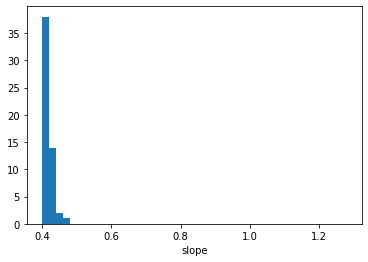

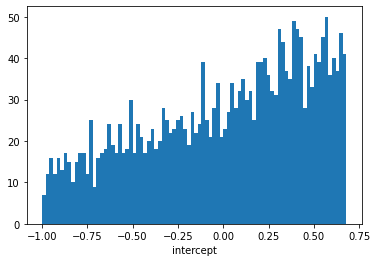

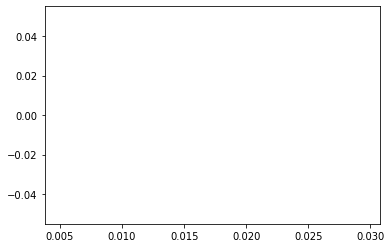

In [85]:
slope_list = lm.chain['beta']
intercept_list = lm.chain['alpha']
sig_sq_list = lm.chain['sigsqr']
print (np.mean(slope_list))
print (np.std(slope_list))

print (np.mean(intercept_list))
print (np.std(intercept_list))

print (np.mean(sig_sq_list))
print (np.std(sig_sq_list))

plt.figure()
plt.hist(slope_list,bins=np.arange(0.4,1.3,0.02))
plt.xlabel('slope')
#plt.savefig('slope.png')

plt.figure()
plt.hist(intercept_list,bins=np.arange(-1.0,0.7,0.02))
plt.xlabel('intercept')
#plt.savefig('intercept.png')
plt.figure()
plt.hist(sig_sq_list,bins=np.arange(0.005,0.03,0.0005))

slope = lm.chain['beta'].mean(); intercept = lm.chain['alpha'].mean()

In [86]:
x=np.linspace(1,2)
x_test = np.arange(1,100)
print ('slope','intercept')
print ('Linmix',slope,intercept)
print ('least-s',params1[0],np.log10(params1[1]))
print ('ODR',myoutput.beta[1],myoutput.beta[0])
plt.scatter(xdata,ydata,fc='k',s=20)
#plt.errorbar(xdata,ydata, xerr=errx/2, yerr=erry/2, linestyle='None', marker='o',mfc='k',mec='none',c='k')
x=np.linspace(1,2)
plt.plot(x,slope*x+intercept,'-k',label="Linmix")
plt.plot(np.log10(x_test),np.log10(params1[1]*x_test**params1[0]),'-r',label="least-s")

plt.plot(np.log10(x_test),np.log10(x_test**myoutput.beta[1])+myoutput.beta[0],'b--',label='ODR')#,label='fit')




plt.legend(loc='best')
plt.xlabel('$x$')
plt.ylabel('$y$')
plt.xlim(1,2)
plt.ylim(0,1.7)

slope intercept
Linmix 0.30021687135094927 1.639835677493037
least-s 0.840134140444241 -0.21458004087919372


NameError: name 'myoutput' is not defined

In [93]:
def f(p, x):

    return p[1] * x + p[0]

linear = Model(f)
#sx, sy are arrays os error estimates
mydata = RealData(np.log10(Rc[0].astype('float')), np.log10(vrms_c[0].astype('float')), sy=0.434*(vrms_c_err[0].astype('float')/vrms_c[0].astype('float')), sx=0.434*(Rc_err[0].astype('float')/Rc[0].astype('float')))
#beta0 are the inital parameter estimates
myodr = ODR(mydata, linear, beta0=[10.1, 1.5])
myoutput = myodr.run()
myoutput.pprint()

x_fit = np.linspace(1, 2, 100)    #to do the fit only within the x interval; we can always extrapolate it, of course
y_fit = f(myoutput.beta, x_fit)
# Generate a plot to show the data, errors, and fit.
fig, ax = plt.subplots(figsize=(4,4))

ax.errorbar(np.log10(Rc[0].astype('float')), np.log10(vrms_c[0].astype('float')), xerr=0.434*(Rc_err[0].astype('float')/Rc[0])/2, yerr=0.434*(vrms_c_err[0].astype('float')/vrms_c[0])/2, linestyle='None', marker='o',mfc='b')
ax.plot(x_fit, y_fit,c='r')
ax.set_xlim(1,2)
ax.set_ylim(0,1.6)
ax.set_title('Orthogonal Distance Regression')


AttributeError: 'Model' object has no attribute 'implicit'

In [87]:
def f(p, x):

    return p[0] * x ** p[1]

linear = Model(f)
#sx, sy are arrays os error estimates
sy=(vrms_c_err[0].astype('float')); sx=(Rc_err[0].astype('float'))

mydata = Data((Rc_all.astype('float')), (vrms_c[0].astype('float')), wd=1./np.power(sx, 2), we=1./np.power(sy, 2))
#beta0 are the inital parameter estimates
myodr = ODR(mydata, linear, beta0=[10.1, 1.5])
myoutput = myodr.run()
myoutput.pprint()

x_fit = np.linspace(1, 100, 1000)    #to do the fit only within the x interval; we can always extrapolate it, of course
y_fit = f(myoutput.beta, x_fit)
# Generate a plot to show the data, errors, and fit.
fig, ax = plt.subplots(figsize=(4,4))

ax.errorbar(Rc_all.astype('float'), vrms_c[0].astype('float'), xerr=Rc_err[0].astype('float')/2, yerr=vrms_c_err[0].astype('float')/2, linestyle='None', marker='o',mfc='b')
ax.loglog(x_fit, y_fit,c='r')
ax.set_xlim(10,100)
ax.set_ylim(1,45)
ax.set_title('Orthogonal Distance Regression')


AttributeError: 'Model' object has no attribute 'implicit'

sig_int:     0.0000     -0.3750
No intrinsic scatter or errors overestimated
Repeat at best fitting solution
sig_int:     0.0000     -0.3750
################# Values and formal errors ################
 intercept:  0.179 +/- 0.060
     slope:  1.436 +/- 0.092
   scatter:  0. +/- 0.0
Observed rms scatter: 0.15
y = a + b*(x - pivot) with pivot = 1
Spearman r=0.6 and p=1.3e-16
Pearson r=0.59 and p=2e-16
##########################################################
seconds 0.91


(0.0, 2.0)

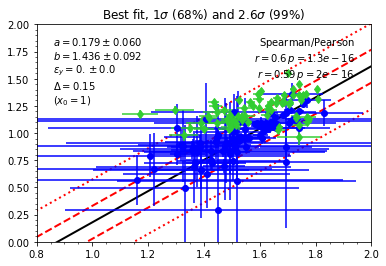

In [324]:
from ltsfit.lts_linefit import lts_linefit

p = lts_linefit(xdata.astype('float'), ydata.astype('float'), errx.astype('float'), erry.astype('float'), clip=2.6, epsy=True, corr=True,frac=None, pivot=True, plot=True, text=True)
plt.xlim(0.8,2.0)
plt.ylim(0,2)
#xdata,ydata, xerr=errx/2, yerr=erry/2

51 48
3.219292759319777
0.9886439545758183
99
92


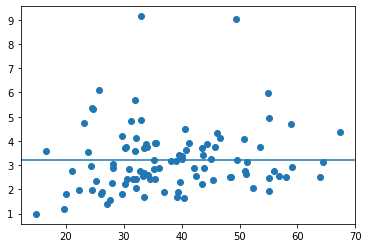

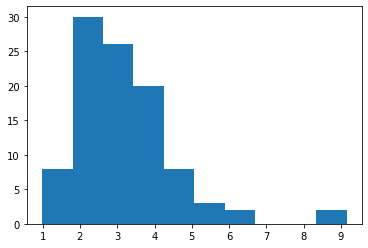

In [206]:
t_dis_2 = list(Rc_node/vrms_node)
t_dis_3 = list(Rc_ring/vrms_ring)
print (len(t_dis_2),len(t_dis_3))
plt.scatter((list(Rc_node)+list(Rc_ring)),t_dis_2+t_dis_3)
plt.axhline(np.mean(t_dis_2+t_dis_3))
print (np.mean(t_dis_2+t_dis_3))
print (np.min(t_dis_2+t_dis_3))

t_dis_tot = np.array(t_dis_2+t_dis_3)

plt.figure()
plt.hist(t_dis_tot)
print (len(t_dis_tot))
print (len(t_dis_tot[np.array(t_dis_tot)<=5]))
# plt.figure()
# plt.scatter(vrms_c[0],Rc[0]/vrms_c[0])

In [212]:
print ('---------------size-linewidth----------------------')
#print ('spearman_new_', (scipy.stats.spearmanr(vrms_re[0].astype('float'),alpha_all[0].astype('float')).correlation))
print ('spearman_new_', (scipy.stats.spearmanr(Rc[0].astype('float'),vrms_c[0].astype('float')).correlation))
print ('p-value', scipy.stats.pearsonr(Rc[0].astype('float'),vrms_c[0].astype('float')))
print (scipy.stats.ttest_ind(Rc[0].astype('float'),vrms_c[0].astype('float'))[1])

---------------size-linewidth----------------------
spearman_new_ 0.596899991335076
p-value (0.5913469687072644, 2.826164340833354e-16)
3.4989132336634713e-74


# Cloud properties bar plot - used for ngc 613 paper

In [381]:
ETG_r = np.append(NGC4429_r,NGC4526_r)
non_nan = np.where(ETG_r==ETG_r)
ETG_m = np.append(NGC4429_m*10**5,NGC4526_m*10**6)
ETG_s = np.append(NGC4429_s,NGC4526_s)

ETG_r = ETG_r[non_nan].astype('float')
ETG_m = ETG_m[non_nan].astype('float')
ETG_s = ETG_s[non_nan].astype('float')

ETG_m = ETG_m[ETG_r>0]
ETG_s = ETG_s[ETG_r>0]
ETG_r = ETG_r[ETG_r>0]


LTG_r = np.concatenate([M33_r,M51_r,PHANGS_r])
non_nan = np.where(LTG_r==LTG_r)
LTG_m = np.concatenate([M33_m,M51_l*4.3*10**5,PHANGS_m])
LTG_s = np.concatenate([M33_s,M51_s,PHANGS_s])

LTG_r = LTG_r[non_nan].astype('float')
LTG_m = LTG_m[non_nan].astype('float')
LTG_s = LTG_s[non_nan].astype('float')
non_nan = np.where(LTG_s==LTG_s)
LTG_s = LTG_s[non_nan]

MW_r = np.append(MWdh_r,MWdr_r)
non_nan = np.where(MW_r==MW_r)
MW_m = np.append(MWdh_l,MWdr_m)
MW_s = np.append(MWdh_s,MWdr_s)

MW_r = MW_r[non_nan].astype('float')
MW_m = MW_m[non_nan].astype('float')
MW_s = MW_s[non_nan].astype('float')

MW_m = MW_m[MW_r>0]
MW_s = MW_s[MW_r>0]
MW_r = MW_r[MW_r>0]

/3/tmp/ipykernel_102033/2265565647.py:138: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


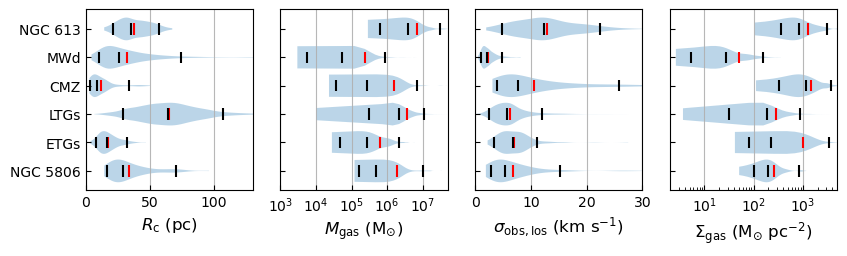

In [383]:
fig, axs = plt.subplots(1,4,figsize=(12/1.4,4/1.5),constrained_layout = True); axs = axs.ravel()

# Size #
axs[0].grid(alpha=0.9,axis='x')

vi0 = axs[0].violinplot([Rc_all.astype('float'),MW_r,CMZ_r,LTG_r,ETG_r,NGC5806_r],vert=False,
                 positions=[6,5,4,3,2,1],showmeans=True,showextrema=False,showmedians=True,widths=0.8,
                  quantiles=[[0.05, 0.95],[0.05, 0.95],[0.05, 0.95],[0.05, 0.95],[0.05, 0.95],[0.05, 0.95]])#,positions=[1,2,3])
# axs[0].set_ylim(0, 100.0)
axs[0].set_yticks([1,2,3,4,5,6])
axs[0].set_yticklabels([r'NGC 5806',r'ETGs',r'LTGs',r'CMZ',r'MWd',r'NGC 613'])

# # Mass #

axs[1].grid(alpha=0.9,axis='x')
vi1 = axs[1].violinplot([10**Mlum_all.astype('float'),MW_m,CMZ_l,LTG_m,ETG_m,NGC5806_m],vert=False,
                 positions=[6,5,4,3,2,1],showmeans=True,showextrema=False,showmedians=True,widths=0.8,
                  quantiles=[[0.05, 0.95],[0.05, 0.95],[0.05, 0.95],[0.05, 0.95],[0.05, 0.95],[0.05, 0.95]])#,positions=[1,2,3])



# axs[1].annotate('',xy=(10**7.7,0.9-0.025),xytext=(10**5.46,0.9-0.025),arrowprops={'arrowstyle':'<->'},horizontalalignment='center')
# axs[1].annotate('',xy=(10**6.5,0.75-0.025),xytext=(10**3,0.75-0.025),arrowprops={'arrowstyle':'<->'},horizontalalignment='center')
# axs[1].annotate('',xy=(10**6.5,0.6-0.025),xytext=(10**3.3,0.6-0.025),arrowprops={'arrowstyle':'<->'},horizontalalignment='center')
# axs[1].annotate('',xy=(10**7.5,0.45-0.025),xytext=(10**4.5,0.45-0.025),arrowprops={'arrowstyle':'<->'},horizontalalignment='center')
# axs[1].annotate('',xy=(10**6.6,0.3-0.025),xytext=(10**4.4,0.3-0.025),arrowprops={'arrowstyle':'<->'},horizontalalignment='center')
# axs[1].annotate('',xy=(10**7.5,0.15-0.025),xytext=(10**5.1,0.15-0.025),arrowprops={'arrowstyle':'<->'},horizontalalignment='center')

# # Velocity dispersion #
axs[2].grid(alpha=0.9,axis='x')
vi2 = axs[2].violinplot([vrms_all.astype('float'),MW_s,CMZ_s,LTG_s,ETG_s,NGC5806_s],vert=False,
                 positions=[6,5,4,3,2,1],showmeans=True,showextrema=False,showmedians=True,widths=0.8,
                  quantiles=[[0.05, 0.95],[0.05, 0.95],[0.05, 0.95],[0.05, 0.95],[0.05, 0.95],[0.05, 0.95]])#,positions=[1,2,3])


# axs[2].annotate('',xy=(36,0.9-0.025),xytext=(2,0.9-0.025),arrowprops={'arrowstyle':'<->'},horizontalalignment='center')
# axs[2].annotate('',xy=(10,0.75-0.025),xytext=(1,0.75-0.025),arrowprops={'arrowstyle':'<->'},horizontalalignment='center')
# axs[2].annotate('',xy=(40,0.6-0.025),xytext=(4,0.6-0.025),arrowprops={'arrowstyle':'<->'},horizontalalignment='center')
# axs[2].annotate('',xy=(15,0.45-0.025),xytext=(1.5,0.45-0.025),arrowprops={'arrowstyle':'<->'},horizontalalignment='center')
# axs[2].annotate('',xy=(20,0.3-0.025),xytext=(2,0.3-0.025),arrowprops={'arrowstyle':'<->'},horizontalalignment='center')
# axs[2].annotate('',xy=(30,0.15-0.025),xytext=(1.6,0.15-0.025),arrowprops={'arrowstyle':'<->'},horizontalalignment='center')

# # Surface density #
axs[3].grid(alpha=0.9,axis='x')

vi3 = axs[3].violinplot([10**surf_all.astype('float'),MW_m/(np.pi*MW_r**2),CMZ_l/(np.pi*CMZ_r**2)
                   ,LTG_m/(np.pi*LTG_r**2),ETG_m/(np.pi*ETG_r**2),NGC5806_m/(np.pi*NGC5806_r**2)],vert=False,
                 positions=[6,5,4,3,2,1],showmeans=True,showextrema=False,showmedians=True,widths=0.8,
                  quantiles=[[0.05, 0.95],[0.05, 0.95],[0.05, 0.95],[0.05, 0.95],[0.05, 0.95],[0.05, 0.95]])#,positions=[1,2,3])

# axs[3].annotate('',xy=(1000,0.9-0.025),xytext=(150,0.9-0.025),arrowprops={'arrowstyle':'<->'},horizontalalignment='center')
# axs[3].annotate('',xy=(100,0.75-0.025),xytext=(20,0.75-0.025),arrowprops={'arrowstyle':'<->'},horizontalalignment='center')
# axs[3].annotate('',xy=(1000,0.6-0.025),xytext=(200,0.6-0.025),arrowprops={'arrowstyle':']->'},horizontalalignment='center')
# axs[3].annotate('',xy=(400,0.45-0.025),xytext=(30,0.45-0.025),arrowprops={'arrowstyle':'<->'},horizontalalignment='center')
# axs[3].annotate('',xy=(1000,0.3-0.025),xytext=(150,0.3-0.025),arrowprops={'arrowstyle':'<->'},horizontalalignment='center')
# axs[3].annotate('',xy=(800,0.15-0.025),xytext=(80,0.15-0.025),arrowprops={'arrowstyle':'<->'},horizontalalignment='center')

# axs[0].set_yticks([0.15-0.025,0.3-0.025,0.45-0.025,0.6-0.025,0.75-0.025,0.9-0.025])
# axs[0].set_yticklabels([r'NGC 5806',r'ETGs',r'LTGs',r'CMZ',r'MWd',r'NGC 613'])

# axs[0].set_yticks([0.15-0.025,0.3-0.025,0.45-0.025,0.6-0.025,0.75-0.025,0.9-0.025])
# axs[1].set_yticks([0.15-0.025,0.3-0.025,0.45-0.025,0.6-0.025,0.75-0.025,0.9-0.025])
# axs[2].set_yticks([0.15-0.025,0.3-0.025,0.45-0.025,0.6-0.025,0.75-0.025,0.9-0.025])
# axs[3].set_yticks([0.15-0.025,0.3-0.025,0.45-0.025,0.6-0.025,0.75-0.025,0.9-0.025])
axs[1].set_yticks([1,2,3,4,5,6])
axs[2].set_yticks([1,2,3,4,5,6])
axs[3].set_yticks([1,2,3,4,5,6])
axs[1].set_yticklabels([])
axs[2].set_yticklabels([])
axs[3].set_yticklabels([])

axs[0].tick_params(direction='in',which='both')#,axis='both',labelsize=13,top='on',right='on')
axs[1].tick_params(direction='in',which='both')#,axis='both',labelsize=13,top='on',right='on')
axs[2].tick_params(direction='in',which='both')#,axis='both',labelsize=13,top='on',right='on')
axs[3].tick_params(direction='in',which='both')#,axis='both',labelsize=13,top='on',right='on')
# #axs[1].minorticks_on()
# #axs[3].xaxis.set_tick_params(which='minor',bottom=False)#, bottom=False)

axs[0].set_xlim(0,130)
axs[0].set_xlabel(r'$R_\mathrm{c}$ (pc)',fontsize=12)
# #axs[0].set_ylabel('Number of clouds',fontsize=14)


axs[1].set_xlim(1e3,5e7)
axs[1].set_xscale('log')
axs[1].set_xlabel(r'$M_{\mathrm{gas}}$ (M$_{\odot}$)',fontsize=12)
axs[1].set_xticks([10**3,10**4,10**5,10**6,10**7])
# #axs[1].set_ylabel('Number of clouds',fontsize=14)

axs[2].set_xlim(0,30)
axs[2].set_xlabel(r'$\sigma_{\mathrm{obs,los}}$ (km s$^{-1}$)',fontsize=12)
axs[2].set_xticks([0,10,20,30])
# #axs[2].set_ylabel('Number of clouds',fontsize=14)   

axs[3].set_xlim(2,5000)
axs[3].set_xscale('log')
axs[3].set_xlabel(r'$\Sigma_{\mathrm{gas}}$ (M$_{\odot}~$pc$^{-2}$)',fontsize=12)
#axs[3].set_ylabel('Number of clouds',fontsize=14)


#vi0['bodies'][0].set_facecolor('blue')
#vi0['bodies'][1].set_facecolor('red')
#vi0['bodies'][2].set_facecolor('green')

#vi0['cbar'].set_color('k')
vi0['cmeans'].set_edgecolor('r')
vi0['cmedians'].set_edgecolor('k')
vi0['cquantiles'].set_edgecolor('k')
# vi0['cmeans'].set_linewidth(2)
# vi0['cmedians'].set_linewidth(2)

vi1['cmeans'].set_edgecolor('r')
vi1['cmedians'].set_edgecolor('k')
vi1['cquantiles'].set_edgecolor('k')
# vi1['cmeans'].set_linewidth(2)
# vi1['cmedians'].set_linewidth(2)

vi2['cmeans'].set_edgecolor('r')
vi2['cmedians'].set_edgecolor('k')
vi2['cquantiles'].set_edgecolor('k')
# vi2['cmeans'].set_linewidth(2)
# vi2['cmedians'].set_linewidth(2)

vi3['cmeans'].set_edgecolor('r')
vi3['cmedians'].set_edgecolor('k')
vi3['cquantiles'].set_edgecolor('k')
# vi3['cmeans'].set_linewidth(2)
# vi3['cmedians'].set_linewidth(2)


#axs[1].minorticks_on()
#axs[1].tick_params(axis="x", which="minor", top=False, labeltop=False, bottom=True, labelbottom=False, direction="in")
#axs[3].tick_params(axis="x", which="minor", top=False, labeltop=False, bottom=True, labelbottom=False, direction="in")
#axs[1].tick_params(which='minor', length=10, color='r')

#plt.subplots_adjust(left=0.1,top=0.98,bottom=0.05,right=0.9,wspace=0.1)
#plt.show()
plt.tight_layout()
#axs[1].minorticks_on()
#plt.savefig('/home/woorak/Dropbox/앱/Overleaf/[Paper] WISDOM_GMCs_ngc613/ngc613_compare.png',dpi=300, transparent=True)


# For ALMA proposal

<ipython-input-204-9ca33b250a22>:69: UserWarning: The following kwargs were not used by contour: 'clabel'
  CS = axs.contour(xi, yi, zi,levels = levels,colors='k', linewidths=3,origin=origin,clabel='NGC613',linestyles='-')


0.7671039105753041 -0.10168483938027778
1.5809557706356807


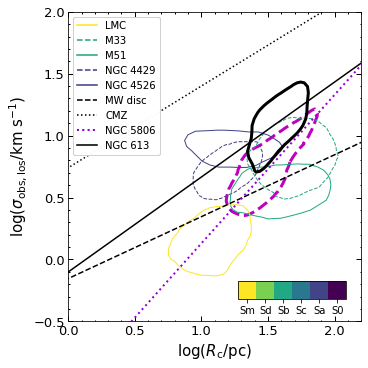

In [204]:
# For Figure 8 middle, I need to calculate virial mass. I can use equation 9 ($M_{vir}=5\sigma^2R_c/G$) = 1.1615e3*sigma^2*R_c

fig, axs = plt.subplots(1,1,figsize=(5,5),constrained_layout = True); #axs = axs.ravel()


col_map = plt.get_cmap('viridis_r',6)

#cbar.ax.set_yticklabels([r'S0^+','Sa','Sb','Sc','Sd'])

### plot utomo 2015 figure 13 ###
#axs.fill(np.log10(MWc.iloc[:,0]),np.log10(MWc.iloc[:,1]),ec=col_map(0),fill=False)
#axs.fill(NGC613_0,NGC613_1,ec='r',ls=':',fill=False)
axs.fill(NGC5806_0,NGC5806_1,ec='m',lw=3,ls="--",fill=False)
axs.fill(NGC4429_0,NGC4429_1,ec=col_map(4),ls='--',fill=False)
axs.fill(np.log10(NGC4526.iloc[:,0]),np.log10(NGC4526.iloc[:,1]),ec=col_map(4),fill=False)
axs.fill(np.log10(M51.iloc[:,0]),np.log10(M51.iloc[:,1]),ec=col_map(2),fill=False,ls='--')
axs.fill(np.log10(M33.iloc[:,0]),np.log10(M33.iloc[:,1]),ec=col_map(2),fill=False)
#axs.fill(np.log10(MWd.iloc[:,0]),np.log10(MWd.iloc[:,1]),ec=col_map(4),fill=False)
axs.fill(np.log10(LMC.iloc[:,0]),np.log10(LMC.iloc[:,1]),ec=col_map(0),fill=False)


#axs.plot([],[],c=col_map(0),label='MWc')
axs.plot([],[],c=col_map(4),label='NGC 4526')
axs.plot([],[],c=col_map(4),label='NGC 4429',ls='--')
#axs.plot([],[],c=col_map(2),label='NGC5806',ls=':')
axs.plot([],[],c=col_map(2),label='M51')
axs.plot([],[],c=col_map(2),label='M33',ls='--')
#axs.plot([],[],c=col_map(4),label='MWd')
axs.plot([],[],c=col_map(0),label='LMC')



### PLOT NGC4429 LARSON ###
# x = np.log10(data_resol[:,3].astype('float'))
# y = np.log10(data_resol[:,5].astype('float'))

# k = gaussian_kde(np.vstack([np.log10(data_resol[:,3].astype('float')),np.log10(data_resol[:,5].astype('float'))]))
# xi, yi = np.mgrid[x.min():x.max():x.size**0.5*1j,y.min():y.max():y.size**0.5*1j]
# zi = k(np.vstack([xi.flatten(), yi.flatten()]))

# #set zi to 0-1 scale
# zi = (zi-zi.min())/(zi.max() - zi.min())
# zi =zi.reshape(xi.shape)

# #set up plot
# origin = 'lower'
# levels = [0,0.32,1]

# CS = axs.contour(xi, yi, zi,levels = levels,colors=col_map(4), linewidths=1,origin=origin,linestyles='--')

### PLOT NGC5806 LARSON in contours ###
x = np.log10(Rc[0].astype('float'))
y = np.log10(vrms_c[0].astype('float'))

k = gaussian_kde(np.vstack([np.log10(Rc[0].astype('float')),np.log10(vrms_c[0].astype('float'))]))
xi, yi = np.mgrid[x.min():x.max():x.size**0.5*2j,y.min():y.max():y.size**0.5*2j]
zi = k(np.vstack([xi.flatten(), yi.flatten()]))

#print (xi)

#set zi to 0-1 scale
zi = (zi-zi.min())/(zi.max() - zi.min())
zi =zi.reshape(xi.shape)

#set up plot
origin = 'lower'
levels = [0,0.32,1]

CS = axs.contour(xi, yi, zi,levels = levels,colors='k', linewidths=3,origin=origin,clabel='NGC613',linestyles='-')

#dat0= CS.allsegs

#print (dat0[1][0][:,1])

### ax0 fitting line & MW line ###

x0 = np.linspace(0.1,500,100)

xx=np.linspace(0,3)
axs.plot(xx,slope*xx+intercept,'-k',label='NGC 613')

#axs.plot(np.log10(x_fit), np.log10(y_fit),c='gray',label='NGC 613 \n (ODR)')

print (slope,intercept)
print ((np.log10(y_fit[-1])-np.log10(y_fit[0])) / (np.log10(x_fit[-1])-np.log10(x_fit[0])))
#print (y_fit)

#axs.plot(np.log10(x0),np.log10(params5[1]*x0**params5[0]),'k',label='NGC613') # plot the results from the fitting with all data
axs.plot(np.log10(x0),np.log10(0.7*x0**0.5),'k--',label='MW disc') # reference, solomon 1987

### MW CMZ ###

axs.plot(np.log10(x0),np.log10(5.5*x0**0.66),'k:',label='CMZ') # reference, kauffmann 2017


axs.plot(np.log10(x0),np.log10(0.085*x0**1.20),c='darkviolet',ls=':',lw=2,label='NGC 5806') # reference, kauffmann 2017


#axs[0].plot(np.log10(x0),np.log10(params2[1]*x1**params2[0]),'c')
#axs[0].plot(np.log10(x0),params5[0]*np.log10(x0)+ params5[1],'c')

### error plot ###
#print('dR',data_resol[:,4])
#print ('dsigma',data_resol[:,6])
###############

### plot all subplots

# import bces.bces as BCES
# cov = np.zeros_like(Rc_all)
# a,b,aerr,berr,covab=BCES.bcesp(np.log10(Rc_all.astype('float')),(Rc_err_all.astype('float')),np.log10(vrms_all.astype('float')),(vrms_err_all.astype('float')),cov)
# print (a)
# print (b)
# axs.plot(np.log10(x0),a[0]+np.log10(x0*b[0]),c='r')

# print (a,b)
# print(aerr,berr)

# for i in (4,3,2,1):    
#     #print (len(Rc[i]),len(vrms_c[i]))
#     axs.scatter(np.log10(Rc[i].astype('float')),np.log10(vrms_c[i].astype('float')),s=5,ec='none',fc=lines[i],label=name[i])
#     axs.errorbar(np.log10(Rc[i].astype('float')),np.log10(vrms_c[i].astype('float')),yerr=0.434*(vrms_c_err[i].astype('float')/vrms_c[i].astype('float'))/2, 
#xerr=0.434*(Rc_err[i].astype('float')/Rc[i].astype('float'))/2, capsize=3,mec='none',alpha=0.5,mfc=lines[i], ls='none', color=lines[i],elinewidth=1,fmt='o')
    
    
# ax1 1-to-1 line & alpha=2 line

#axs.errorbar(2,-0.2,xerr=0.1,yerr=0.2,ecolor='k')

### Calculate median or mean value of each bin ###

xaxis_data = np.log10(Rc[0].astype('float'))
yaxis_data = np.log10(vrms_c[0].astype('float'))

yaxis_data = yaxis_data[np.argsort(xaxis_data)]
xaxis_data = xaxis_data[np.argsort(xaxis_data)]

x_bin_data = np.array_split(xaxis_data,10)
y_bin_data = np.array_split(yaxis_data,10)


x_bin_mean = list(map(np.mean, x_bin_data))
y_bin_mean = list(map(np.mean, y_bin_data))

x_bin_med = list(map(np.median, x_bin_data))
y_bin_med = list(map(np.median, y_bin_data))

#axs.scatter(x_bin_med,y_bin_med,c='c',s=30,zorder=50)
#axs.errorbar(x_bin_med,y_bin_med,c='c',ms=100,zorder=50)
#axs.scatter(x_bin_mean,y_bin_mean,c='m',s=100,zorder=50)

#####################################################

axs.set_xlim(0,2.2)
axs.set_ylim(-0.5,2.0)
axs.set_xlabel('log($R\mathrm{_c}$/pc)',fontsize=15)
axs.set_ylabel('log($\sigma_{\mathrm{obs,los}}$/km s$^{-1}$)',fontsize=15)

dr = np.mean(data_resol[:,4])
ds = np.mean(data_resol[:,6])


axs.tick_params(direction='in',which='both',axis='both',labelsize=13,top='on',right='on')

#axs[0].tick_params(which='major', length=7)
#axs[0].tick_params(which='minor', length=10, color='r')
#axs[0].xaxis.set_minor_locator(MultipleLocator(5))

axs.minorticks_on()
axs.legend(loc=0,fontsize=10)

#c_map_ax = fig.add_axes([0.41, 0.18, 0.3, 0.05])

c_map_ax = fig.add_axes([0.65, 0.18, 0.3, 0.05])

#c_map_ax.axes.get_xaxis().set_visible(False)
c_map_ax.axes.get_yaxis().set_visible(False)

ticks=np.arange(7)
cbar=mpl.colorbar.ColorbarBase(c_map_ax, cmap=col_map, orientation = 'horizontal',norm=plt.Normalize(ticks[0],ticks[-1],col_map.N),spacing='proportional')#,ticks=[0,1,2,3,4,5])#,ticks=[r'S0^+','Sa','Sb','Sc','Sd','Sm'])
#cbar.set_ticks([0,1,2,3,4,5])
cbar.set_ticks(ticks[0:-1]+0.5)
#cbar.ax.set_xticklabels([r'S0','Sa','Sb','Sc','Sd','Sm'])
cbar.ax.set_xticklabels([r'Sm','Sd','Sb','Sc','Sa','S0'])

#cbar.ax.xaxis.set_tick_params(pad=-15)

axs.tick_params('both', length=5, width=1, which='major')
axs.tick_params('both', length=1.5, width=1, which='minor')


#### Put two legend ####

handles,labels = axs.get_legend_handles_labels()

handles1 = [handles[5-1], handles[4-1],handles[3-1],handles[2-1],handles[1-1],handles[6],handles[7],handles[8],handles[6-1]]#,handles[0]]
labels1 = [labels[5-1], labels[4-1],labels[3-1],labels[2-1],labels[1-1],labels[6],labels[7],labels[8],labels[6-1]]#,labels[0]]

legend1 = axs.legend(handles1,labels1,loc=2,fontsize=10)

# handles2 = [handles[8], handles[9], handles[10],handles[11]]#,handles[1]]
# labels2 = [labels[8], labels[9], labels[10],labels[11]]#,labels[1]]

#ax.legend(loc=2,fontsize=13)
#legend2 = axs.legend(handles2,labels2,loc='lower right',fontsize=10)

#legend3 = axs.legend([handles[6]], [labels[6]],loc='center left',fontsize=10,bbox_to_anchor=(0, 0.52))

axs.add_artist(legend1)
#axs.add_artist(legend2)
#axs.add_artist(legend3)

# legend2.legendHandles[0]._sizes = [30]
# legend2.legendHandles[1]._sizes = [30]
# legend2.legendHandles[2]._sizes = [30]
# legend2.legendHandles[3]._sizes = [30]

#plt.tight_layout()
#plt.subplots_adjust(left=0.05,top=0.98,bottom=0.133,right=0.99,wspace=0.25)
plt.savefig('/home/woorak/Dropbox/연구/2024_proposal_Nuclear_ring_ALMA/larson_all.png',dpi=300, transparent=True)
#plt.savefig('ngc613_larson_only.png',dpi=300, transparent=True)
plt.show()

# Need to fitting the data with errors
# for right panel, i need to find the pressure equilibrium curves